In [1]:
import sys
sys.path.append('/home/eduardo/Documents/Persona3/AutoTelos/skills_list')


import pandas as pd

from skills_data_frame import SkillDataFrame


skill_data_frame = SkillDataFrame()

skill_type_dict = skill_data_frame.get_skill_type_dict()

skill_rank_dict = skill_data_frame.get_skill_rank_dict()

             skill     type  rank  \
0           Cleave    Slash     1   
1      Power Slash    Slash     2   
2         Getsu-ei    Slash     3   
3           Zan-ei    Slash     3   
4       Gale Slash    Slash     3   
..             ...      ...   ...   
275  Full Analysis  Passive    99   
276   Healing Wave  Passive    99   
277         Oracle  Passive    99   
278   Support Scan  Passive    99   
279      Third Eye  Passive    99   

                                                learns  
0       Hermes, Nekomata, Chimera, Archangel, Valkyrie  
1                             Valkyrie, Gurr, Rakshasa  
2    Rakshasa, Ares, Take-Mikazuchi, Orthrus, Hanum...  
3    Oberon, Ares, Titan, Pale Rider, Power, Jikoku...  
4               Rakshasa, Ghoul, Shiisaa, Flauros, Ose  
..                                                 ...  
275                                              Lucia  
276                                              Lucia  
277                                       

In [2]:
import pandas as pd


df = pd.read_csv("/home/eduardo/Documents/Persona3/AutoTelos/skills_list/skills.csv")


skill_type_dict = df.set_index('skill')['type'].to_dict()

skill_rank_dict = df.set_index('skill')['rank'].to_dict()

# given a skill name return the skill type
def get_skill_type(skill_name):
    return skill_type_dict[skill_name]

def get_skill_rank(skill_name):
    return skill_rank_dict[skill_name]

# load '/home/eduardo/Documents/Persona3/AutoTelos/inheritance_calculator/inheritance.csv' into a dataframe
inheritance_df = pd.read_csv('/home/eduardo/Documents/Persona3/AutoTelos/inheritance_calculator/inheritance.csv')
# load '/home/eduardo/Documents/Persona3/AutoTelos/inheritance_calculator/personas_inheritance.csv' into a dataframe
persona_inheritance_df = pd.read_csv('/home/eduardo/Documents/Persona3/AutoTelos/inheritance_calculator/personas_inheritance.csv')

def get_persona_inheritance_type(persona_name):
    return persona_inheritance_df.loc[persona_inheritance_df['Persona'] == persona_name, 'Type'].iloc[0]



# Convert the DataFrame to a dictionary where each key is an inheritance type
# and its value is another dictionary of skill types and their probabilities.
inheritance_dict = inheritance_df.set_index('Inheritance Type').T.to_dict('dict')



# given a skill type return the skill inheritance probability for a given persona type
def get_inheritance_probability(skill_type, persona_inheritance_type):
    # Access the nested dictionary directly for the value
    # Check if the persona_inheritance_type exists to avoid KeyErrors
    if persona_inheritance_type in inheritance_dict:
        # Return the probability value for the given skill_type and persona_inheritance_type
        return inheritance_dict[persona_inheritance_type].get(skill_type, 0)  # Returns 0 if skill_type is not found

In [3]:
import os
from collections import Counter
from matplotlib import pyplot as plt
import csv
counter_directory = "/home/eduardo/Documents/Persona3/AutoTelos/kikuriHime/histograms/counter_csvs"





class RecipeStats:
    def __init__(self, csv_name, inherit_type, saveslot_number, persona_name):
        self.csv_name = csv_name
        self.inherit_type = inherit_type
        self.saveslot_number = saveslot_number
        self.persona_name = persona_name
    
        ''' 
        # Initialize a counter with all possible values set to 0
        value_counts_with_all_possible = Counter({value: 0 for value in self.possible_skills})

        # Flatten the list of lists
        all_values = [item for sublist in self.list_of_lines for item in sublist]

        # Update this counter with the actual occurrences
        value_counts_with_all_possible.update(all_values)
        self.value_counts_with_all_possible =  value_counts_with_all_possible
        '''

        # Initialize an empty dictionary
        counter_dict = {}

        csv_file_path = os.path.join(counter_directory, csv_name + '.csv')

        # Open the CSV file and read it into the dictionary
        with open(csv_file_path, mode='r', encoding='utf-8') as csvfile:
            reader = csv.DictReader(csvfile)
            for row in reader:
                # Assuming 'Key' is the column for dictionary keys and 'Value' is the column for dictionary values
                key = row['Key']
                value = int(row['Value'])  # Convert value to int from string
                counter_dict[key] = value

        self.value_counts_with_all_possible = counter_dict


        # sum all values in the counter
        total = sum(self.value_counts_with_all_possible.values())

        # Create a dictionary with the percentage of each value
        percentage = {key: value/total for key, value in self.value_counts_with_all_possible.items()}

        self.percentage = percentage
    
    
    def associate_info(self, persona_list, skill_set,base_skills_list):
        self.persona_list = persona_list
        self.skill_set = skill_set
        self.base_skills_list = base_skills_list


    def update_keys_for_plot(self,value_counts_with_all_possible_keys):
        # Modify the keys to include "(BS)" when the skill is a base skill, therefore not inheritable
        modified_keys = []

        

        for key in value_counts_with_all_possible_keys:

            skill_type = get_skill_type(key)

            inheritance_prob = get_inheritance_probability(skill_type, self.inherit_type)

            if key in self.base_skills_list:
                # Modify the keys to include "(BS)" when the skill is a base skill, therefore not inheritable
                modified_keys.append(key + " (BS)")
            elif skill_rank_dict[key] == 99 or skill_rank_dict[key] == -1:
                # Modify the keys to include "(UI)" when the skill is not inheritable
                modified_keys.append(key + " (UI)")
            elif inheritance_prob == 0.0:
                # Modify the keys to include "(Z)" when the skill probability is zero
                modified_keys.append(key + " (Z)")
            else:
                modified_keys.append(key + " ({:.1f})".format(inheritance_prob))


        return modified_keys

    def show(self):

        print("Persona List: ", self.persona_list)

        
        modified_keys = self.update_keys_for_plot(self.value_counts_with_all_possible.keys())

        # Now to visualize these counts as a histogram, ensuring all possible values are included
        plt.figure(figsize=(12, 8))
        plt.bar(modified_keys, self.value_counts_with_all_possible.values())
        plt.xlabel('Skill Names')
        plt.ylabel('Counts')
        plt.title('Histogram of Skill Occurrences Including All Possible Values')
        plt.xticks(rotation=90, ha="right")
        plt.tight_layout()  # Adjust layout to make room for the rotated x-axis labels
        plt.show()


# Get all the items in the directory in the variable mainDirectory
items = os.listdir(counter_directory)

recipe_stats_objects = []

for item in items:
    # Remove the .csv extension from the item name
    item = item.replace('.csv', '')
    # Split the item name into parts
    parts = item.split('-')

    # Parse the information from the parts
    csv_name = item
    print(csv_name)
    inherit_type = parts[1]
    print(inherit_type)
    saveslot_number = int(parts[2].split('_')[-2])
    
    persona_name = parts[2].split('_')[-1]
    print(persona_name)
    # if foldername variable contains 'part2'

    if 'part2' in csv_name:
        saveslot_number = 11
    print(saveslot_number)

    # Create a RecipeStats object and add it to the list
    recipe_stats = RecipeStats(csv_name, inherit_type, saveslot_number, persona_name)
    recipe_stats_objects.append(recipe_stats)


for obj in recipe_stats_objects:
    print(obj.csv_name, obj.inherit_type, obj.saveslot_number, obj.persona_name)
    print(obj.value_counts_with_all_possible)
    print(obj.percentage)

Logger_logs-ICE-optimal_recipes.txt_5_laksmi
ICE
laksmi
5
Logger_logs-RECOVERY-optimal_recipes.txt_1_kingu
RECOVERY
kingu
1
Logger_logs-WIND-optimal_recipes.txt_9_garuda
WIND
garuda
9
Logger_logs-LIGHT & DARK-optimal_recipes.txt_7_anubis
LIGHT & DARK
anubis
7
Logger_logs-WIND-optimal_recipes.txt_4_suparna
WIND
suparna
4
Logger_logs-BAD STATUS-optimal_recipes.txt_1_pazuzu
BAD STATUS
pazuzu
1
Logger_logs-ALL-optimal_recipes_part2.txt_1_ose
ALL
ose
11
Logger_logs-BAD STATUS-optimal_recipes.txt_6_abaddon
BAD STATUS
abaddon
6
Logger_logs-FIRE-optimal_recipes.txt_2_suzaku
FIRE
suzaku
2
Logger_logs-ELECTRICITY-optimal_recipes.txt_7_thor
ELECTRICITY
thor
7
Logger_logs-ALL-optimal_recipes.txt_9_loki
ALL
loki
9
Logger_logs-DARK-optimal_recipes.txt_2_baal zebul
DARK
baal zebul
2
Logger_logs-ELECTRICITY-optimal_recipes.txt_2_dionysus
ELECTRICITY
dionysus
2
Logger_logs-DARK-optimal_recipes.txt_6_mot
DARK
mot
6
Logger_logs-ICE-optimal_recipes.txt_8_laksmi
ICE
laksmi
8
Logger_logs-ICE-optimal_recipes

In [4]:
import ast


import pandas as pd
# Load the CSV file into a DataFrame
#r 'C:\\Users\\Eduardo\\Documents\\Projects\\AutoTelos\\inheritable_skills_with_levels.csv'
inheritable_skills_with_levels_df = pd.read_csv('/home/eduardo/Documents/Persona3/AutoTelos/skills_list/inheritable_skills_with_levels.csv')

class UnlockableSkill:
    def __init__(self, name, level=None):
        self.name = name
        self.level = level

    def __repr__(self):
        if self.level:
            return f"('{self.name}', lv{self.level})"
        else:
            return f"('{self.name}')"

# Sample data with skills as a string representation of a list
data = {
    'persona': ['abaddon', 'alice'],
    'skill': [
        "['Weary Thrust', 'Evil Smile', 'High Counter']",
        "['Die for Me!(59)', 'Spirit Drain']"
    ]
}

def extract_skills(data):
    unlockable_skill_dict = {}
    for persona, skills_str in zip(data['persona'], data['skill']):
        # Safely evaluate the string as a list
        skills = ast.literal_eval(skills_str)
        skill_list = []
        for skill in skills:
            # Check if there's a level specified in the skill string
            if '(' in skill and ')' in skill:
                name, level_str = skill.rsplit('(', 1)
                level = int(level_str[:-1])  # Remove the closing parenthesis and convert to int
            else:
                name, level = skill, None

            skill_list.append(UnlockableSkill(name.strip(), level))
        
        unlockable_skill_dict[persona] = skill_list

    return unlockable_skill_dict

unlockable_skill_dict = extract_skills(inheritable_skills_with_levels_df)
for persona, skills in unlockable_skill_dict.items():
    None
    #print(f"{persona}: {skills}")


# verify if for any persona in the dictionary, if it's skills have level numbers that repeat
for persona, skills in unlockable_skill_dict.items():
    levels = [skill.level for skill in skills]
    # remove 'None' values from the list
    levels = [level for level in levels if level is not None]
    if len(levels) != len(set(levels)):
        print(f"Persona {persona} has repeated levels: {levels}")


In [5]:
import re

class InheritanceTypeHolder():


    def __init__(self, inherit_type):
        #open the file
        #'C:\\Users\\Eduardo\\Documents\\Projects\\AutoTelos\\Persona3FES-FusionHelper\\fusion_navigator\\logs_optimal_solutions\\logs-{}-optimal_recipes.txt'
        string_find = "logs-{}-optimal_recipes".format(inherit_type)

        self.inherit_type = inherit_type

        # look for all the files in the directory that have the string
        path = '/home/eduardo/Documents/Persona3/AutoTelos/fusion_navigator/logs_optimal_solutions/logs_definitive/'
        #path = 'C:\\Users\\Eduardo\\Documents\\Projects\\AutoTelos\\Persona3FES-FusionHelper\\fusion_navigator\\logs_optimal_solutions\\logs_definitive'
        predictionHolders = []
        for file in os.listdir(path):
            full_path = os.path.join(path, file)
            if string_find in full_path:
                #open the file
                with open(full_path, 'r') as prediction_file:
                    file_content = prediction_file.read()
                    predictionHolders += parse_file(file_content,inherit_type,full_path)
        
        self.predictionHolders = predictionHolders
    
    def create_percentage_dict(self):
        # Create a dictionary to store the percentages
        percentages = {}

        for holder in self.predictionHolders:
            # Get the "percentage" dictionary from the holder
            percentage_dict = holder.percentage  # Assuming 'percentage' is an attribute of holder

            # Iterate over the items in the percentage dictionary
            for key, value in percentage_dict.items():
                # If the key is already in the percentages dictionary, append the value to the list
                if key in percentages:
                    percentages[key].append(value)
                # Otherwise, add a new list with the value to the percentages dictionary
                else:
                    percentages[key] = [value]
        return percentages

def parse_personas(persona_string):
    return re.findall(r"\('([\w\s-]+)', \d+, '([\w\s]+)'\)", persona_string)


def parse_skills(skill_string):
    return [skill.strip().strip("'").strip('"') for skill in skill_string.strip('[]').split(',')]


def get_base_skills(persona_name):
    list_unlockable_skills = unlockable_skill_dict[persona_name]

    base_skills = [skill.name for skill in list_unlockable_skills if skill.level is None]

    return base_skills

def parse_file(file_content,inherit_type,prediction_file):
    predictionHolders = []
    sections = file_content.split('------------------------\n')

    for section in sections:
        if section.strip() == '':
            continue

        personas = re.findall(r"Personas: \[([^\]]+)\]", section)
        skills = re.findall(r"Skills: \[([^\]]+)\]", section)
        result_persona = re.search(r"Resulting Persona: ([\w\s]+?)\s*$", section, re.MULTILINE)
        base_skills_amount = re.search(r"Base Skills Ammount: (\d+)", section)
        inherit_slots_amount = re.search(r"Inherited Skills Ammount: (\d+)", section)
        save_state_slot = re.search(r"key f(\d+)", section)

        

        if personas and skills and result_persona and base_skills_amount and inherit_slots_amount and save_state_slot:
            persona_list = parse_personas(personas[0])
            #print(persona_list)
            skill_set = parse_skills(skills[0])
            #TODO maybe i should plot the coverage
            save_state_slot = int(save_state_slot.group(1))
            if 'part2' in prediction_file:
                save_state_slot = 11

            ph = None
            
            for obj in recipe_stats_objects:
                if obj.inherit_type == inherit_type and obj.saveslot_number == save_state_slot:
                    result_persona_name = result_persona.group(1)
                    base_skills_list = get_base_skills(result_persona_name)
                    
                    obj.associate_info(persona_list, skill_set,base_skills_list)
                    ph = obj
                    break
            
                if ph == None:
                    continue

            predictionHolders.append(ph)

    return predictionHolders

In [6]:
all_inherit_types = ['ALL', 'SLASH', 'STRIKE', 'PIERCE', 'FIRE', 'ICE', 'ELECTRICITY', 'WIND', 'LIGHT', 'DARK', 'LIGHT & DARK', 'RECOVERY', 'BAD STATUS']

inheritance_type_holders = []

for t in all_inherit_types:
    holder = InheritanceTypeHolder(t)
    inheritance_type_holders.append(holder)

Logger_logs-ALL-optimal_recipes.txt_1_ose
{'Wind Boost': 212, 'Marin Karin': 197, 'Dodge Strike': 119, 'Spirit Drain': 109, 'Twin Shot': 126, 'Sonic Punch': 210, 'Poison Mist': 0, 'Dodge Wind': 141, 'Raging Tiger': 383, 'Auto-Tarukaja': 134, 'Garu': 388, 'Magaru': 193, 'Evil Touch': 133, 'Repel Dark': 72, 'Marakunda': 114, 'Megido': 69, 'Rakukaja': 197, 'Zio': 401, 'Bufu': 351, 'Die for Me!': 49, 'Sukukaja': 203, 'Ice Boost': 199}
{'Wind Boost': 0.053, 'Marin Karin': 0.04925, 'Dodge Strike': 0.02975, 'Spirit Drain': 0.02725, 'Twin Shot': 0.0315, 'Sonic Punch': 0.0525, 'Poison Mist': 0.0, 'Dodge Wind': 0.03525, 'Raging Tiger': 0.09575, 'Auto-Tarukaja': 0.0335, 'Garu': 0.097, 'Magaru': 0.04825, 'Evil Touch': 0.03325, 'Repel Dark': 0.018, 'Marakunda': 0.0285, 'Megido': 0.01725, 'Rakukaja': 0.04925, 'Zio': 0.10025, 'Bufu': 0.08775, 'Die for Me!': 0.01225, 'Sukukaja': 0.05075, 'Ice Boost': 0.04975}
Persona List:  [('alice', 'Death'), ('fortuna', 'Fortune'), ('gurr', 'Moon')]


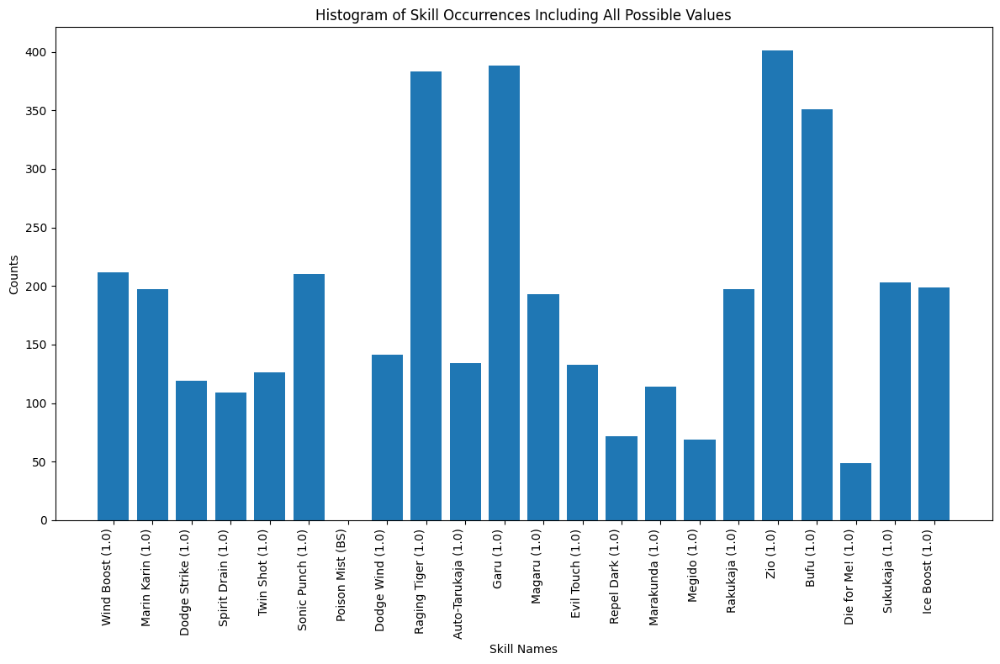

Logger_logs-ALL-optimal_recipes.txt_2_loki
{'Ragnarok': 73, 'Dekaja': 198, 'Salvation': 120, 'Masukukaja': 189, 'Deathbound': 158, 'Fire Boost': 422, 'Null Distress': 182, 'Rakunda': 428, 'Wind Amp': 240, 'Elec Amp': 252, 'Ziodyne': 174, 'Apt Pupil': 0, 'Marakunda': 243, 'Megidola': 144, 'Blade of Fury': 198, 'Auto-Mataru': 140, 'Diarama': 287, 'Vicious Strike': 161, 'High Counter': 191, 'Mind Charge': 200}
{'Ragnarok': 0.01825, 'Dekaja': 0.0495, 'Salvation': 0.03, 'Masukukaja': 0.04725, 'Deathbound': 0.0395, 'Fire Boost': 0.1055, 'Null Distress': 0.0455, 'Rakunda': 0.107, 'Wind Amp': 0.06, 'Elec Amp': 0.063, 'Ziodyne': 0.0435, 'Apt Pupil': 0.0, 'Marakunda': 0.06075, 'Megidola': 0.036, 'Blade of Fury': 0.0495, 'Auto-Mataru': 0.035, 'Diarama': 0.07175, 'Vicious Strike': 0.04025, 'High Counter': 0.04775, 'Mind Charge': 0.05}
Persona List:  [('kali', 'Strength'), ('thor', 'Chariot'), ('surt', 'Magician')]


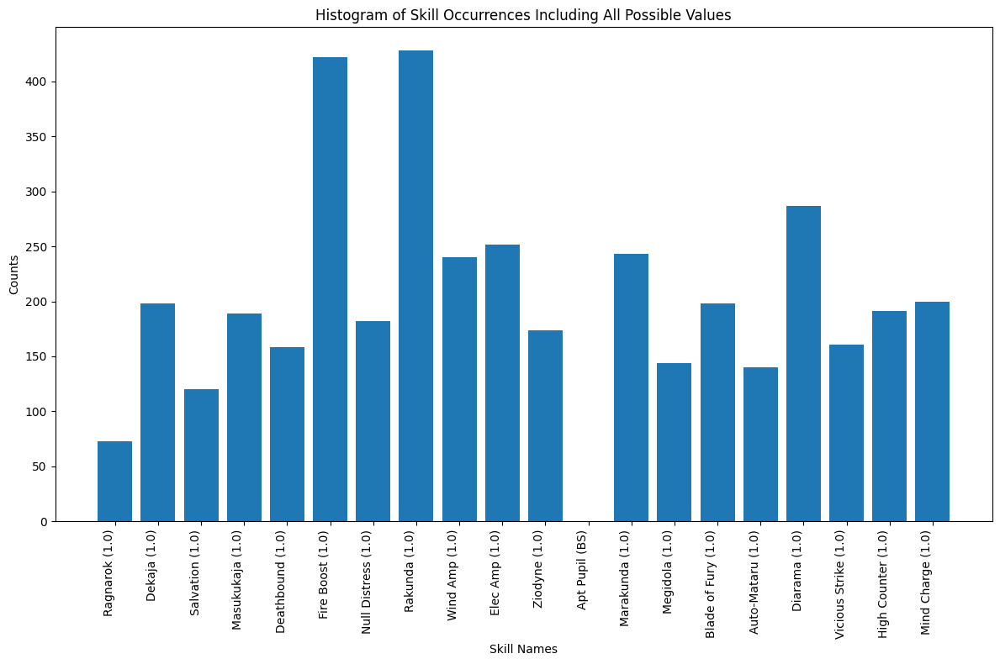

Logger_logs-ALL-optimal_recipes.txt_3_decarabia
{'Pulinpa': 319, 'Auto-Maraku': 97, 'Mazio': 303, 'Zionga': 220, 'Null Dark': 129, 'Elec Break': 162, 'Marakukaja': 122, 'Charmdi': 300, 'Amrita': 93, 'Auto-Tarukaja': 207, 'Invigorate 2': 110, 'Resist Fire': 162, 'Ice Break': 170, 'Mabufula': 148, 'Elec Boost': 281, 'Counterstrike': 165, 'Bufudyne': 119, 'Null Poison': 119, 'Growth 1': 291, 'Heat Wave': 147, 'Virus Breath': 130, 'Getsu-ei': 206}
{'Pulinpa': 0.07975, 'Auto-Maraku': 0.02425, 'Mazio': 0.07575, 'Zionga': 0.055, 'Null Dark': 0.03225, 'Elec Break': 0.0405, 'Marakukaja': 0.0305, 'Charmdi': 0.075, 'Amrita': 0.02325, 'Auto-Tarukaja': 0.05175, 'Invigorate 2': 0.0275, 'Resist Fire': 0.0405, 'Ice Break': 0.0425, 'Mabufula': 0.037, 'Elec Boost': 0.07025, 'Counterstrike': 0.04125, 'Bufudyne': 0.02975, 'Null Poison': 0.02975, 'Growth 1': 0.07275, 'Heat Wave': 0.03675, 'Virus Breath': 0.0325, 'Getsu-ei': 0.0515}
Persona List:  [('laksmi', 'Empress'), ('barong', 'Emperor'), ('take-mikazu

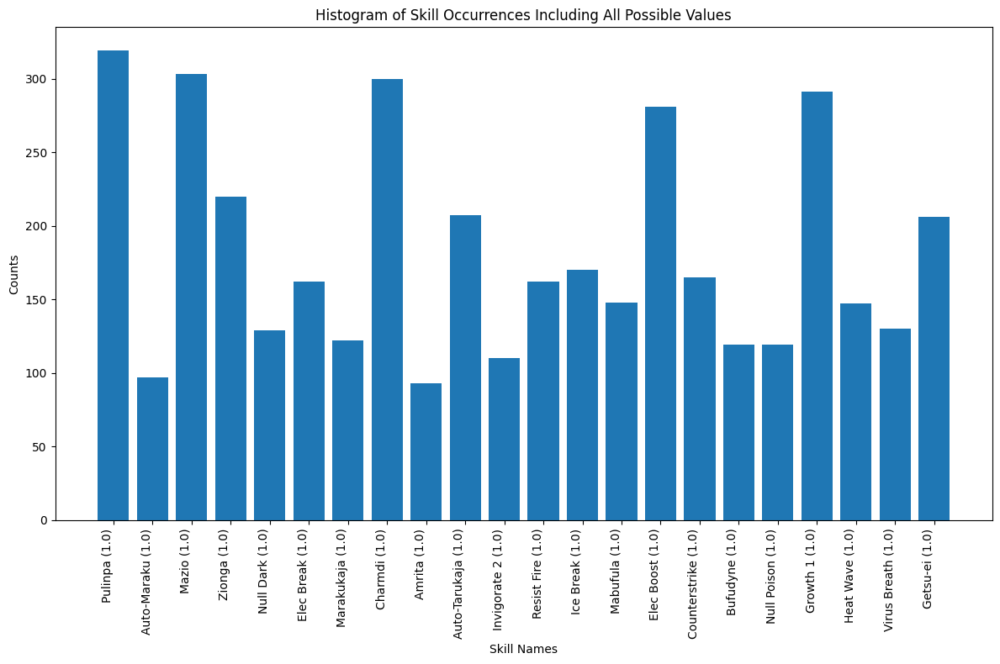

Logger_logs-ALL-optimal_recipes.txt_4_loki
{'Rebellion': 359, 'Agilao': 240, 'Victory Cry': 74, 'Maragi': 339, 'Kill Rush': 246, 'Tentarafoo': 188, 'Mighty Swing': 184, 'Dekaja': 161, 'Brave Blade': 78, 'Matarukaja': 162, 'Magarudyne': 133, 'Provoke': 355, 'Fire Boost': 348, 'Spell Master': 78, 'Megidolaon': 97, 'Agidyne': 162, 'Apt Pupil': 0, 'Maragion': 191, 'Zio': 579, 'Makarakarn': 118, 'Zan-ei': 246, 'Foul Breath': 352, 'Mamudoon': 146, 'High Counter': 164}
{'Rebellion': 0.0718, 'Agilao': 0.048, 'Victory Cry': 0.0148, 'Maragi': 0.0678, 'Kill Rush': 0.0492, 'Tentarafoo': 0.0376, 'Mighty Swing': 0.0368, 'Dekaja': 0.0322, 'Brave Blade': 0.0156, 'Matarukaja': 0.0324, 'Magarudyne': 0.0266, 'Provoke': 0.071, 'Fire Boost': 0.0696, 'Spell Master': 0.0156, 'Megidolaon': 0.0194, 'Agidyne': 0.0324, 'Apt Pupil': 0.0, 'Maragion': 0.0382, 'Zio': 0.1158, 'Makarakarn': 0.0236, 'Zan-ei': 0.0492, 'Foul Breath': 0.0704, 'Mamudoon': 0.0292, 'High Counter': 0.0328}
Persona List:  [('lucifer', 'Judgmen

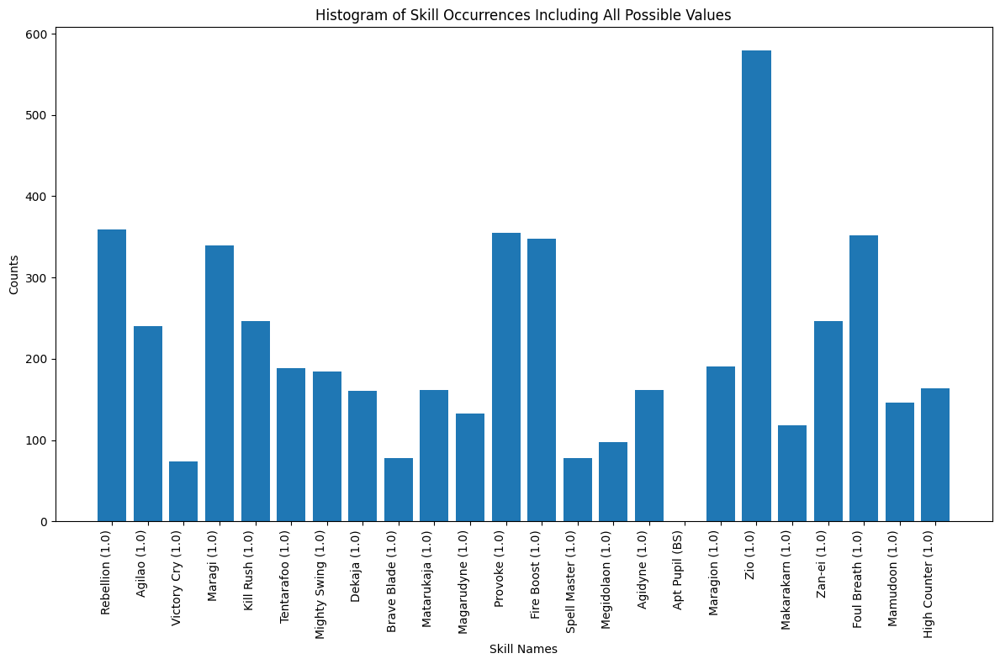

Logger_logs-ALL-optimal_recipes.txt_5_orpheus telos
{'Wind Boost': 600, '1hSwd Master': 231, 'Vorpal Blade': 0, 'Panta Rhei': 165, 'Victory Cry': 180, 'Ghastly Wail': 195, 'Unshaken Will': 179, 'Tempest Slash': 200, 'Salvation': 177, 'Absorb Slash': 199, 'Tetrakarn': 216, 'Spell Master': 168, 'Stagnant Air': 443, 'Primal Force': 185, 'Poison Arrow': 266, 'Akasha Arts': 201, 'Morning Star': 152, 'Wind Amp': 356, 'Garula': 412, 'Megidolaon': 168, 'Absorb Pierce': 193, 'Growth 3': 338, 'Apt Pupil': 285, 'Mahamaon': 284, 'Megidola': 203, 'Absorb Strike': 177, 'Auto-Mataru': 250, 'Invigorate 3': 247, "God's Hand": 174, 'Enduring Soul': 165, 'High Counter': 270, 'Regenerate 3': 245, 'Myriad Arrows': 204, 'Mind Charge': 272}
{'Wind Boost': 0.075, '1hSwd Master': 0.028875, 'Vorpal Blade': 0.0, 'Panta Rhei': 0.020625, 'Victory Cry': 0.0225, 'Ghastly Wail': 0.024375, 'Unshaken Will': 0.022375, 'Tempest Slash': 0.025, 'Salvation': 0.022125, 'Absorb Slash': 0.024875, 'Tetrakarn': 0.027, 'Spell Mas

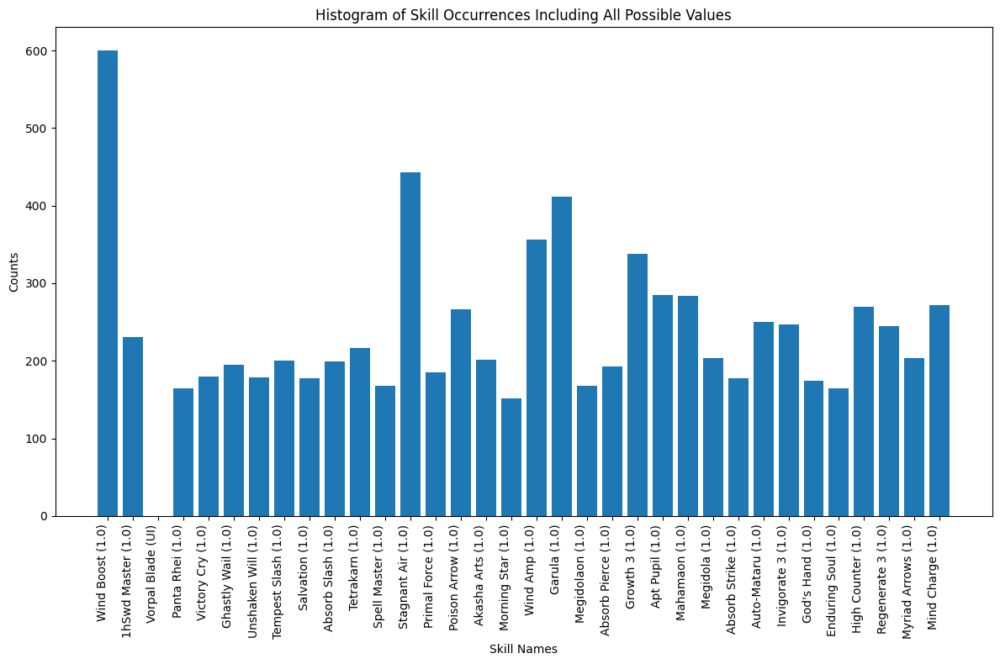

Logger_logs-ALL-optimal_recipes.txt_6_loki
{'Evil Smile': 205, 'Panta Rhei': 95, 'Null Dark': 160, 'Null Fear': 151, 'Ghastly Wail': 113, 'Thunder Reign': 101, 'Patra': 585, 'Counter': 256, 'Amrita': 137, 'Vile Assault': 182, 'Mudoon': 209, 'Maziodyne': 128, 'Spell Master': 102, 'Samsara': 77, 'Null Panic': 175, 'Elec Amp': 211, 'Recarm': 200, 'Wind Amp': 202, 'Magarula': 218, 'Growth 3': 208, 'Tarukaja': 381, 'Diarahan': 157, 'Double Fangs': 388, 'Sukukaja': 359}
{'Evil Smile': 0.041, 'Panta Rhei': 0.019, 'Null Dark': 0.032, 'Null Fear': 0.0302, 'Ghastly Wail': 0.0226, 'Thunder Reign': 0.0202, 'Patra': 0.117, 'Counter': 0.0512, 'Amrita': 0.0274, 'Vile Assault': 0.0364, 'Mudoon': 0.0418, 'Maziodyne': 0.0256, 'Spell Master': 0.0204, 'Samsara': 0.0154, 'Null Panic': 0.035, 'Elec Amp': 0.0422, 'Recarm': 0.04, 'Wind Amp': 0.0404, 'Magarula': 0.0436, 'Growth 3': 0.0416, 'Tarukaja': 0.0762, 'Diarahan': 0.0314, 'Double Fangs': 0.0776, 'Sukukaja': 0.0718}
Persona List:  [('odin', 'Emperor'), (

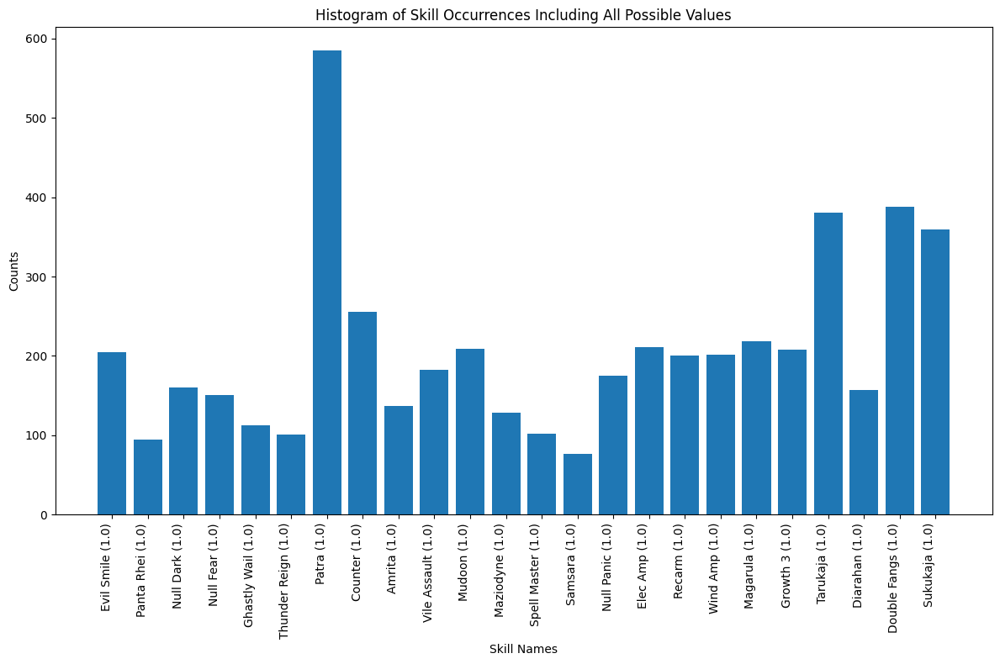

Logger_logs-ALL-optimal_recipes.txt_7_ose
{'Power Slash': 248, 'Wind Boost': 231, 'Cleave': 424, 'Auto-Tarukaja': 146, 'Agi': 433, 'Trafuri': 62, 'Mabufu': 222, 'Panta Rhei': 52, 'Wind Amp': 130, 'Garula': 139, 'Wind Break': 125, 'Bash': 435, 'Auto-Sukukaja': 186, 'Bewilder': 389, 'Sharp Student': 169, 'Tarukaja': 202, 'Dodge Slash': 155, 'Rakukaja': 252}
{'Power Slash': 0.062, 'Wind Boost': 0.05775, 'Cleave': 0.106, 'Auto-Tarukaja': 0.0365, 'Agi': 0.10825, 'Trafuri': 0.0155, 'Mabufu': 0.0555, 'Panta Rhei': 0.013, 'Wind Amp': 0.0325, 'Garula': 0.03475, 'Wind Break': 0.03125, 'Bash': 0.10875, 'Auto-Sukukaja': 0.0465, 'Bewilder': 0.09725, 'Sharp Student': 0.04225, 'Tarukaja': 0.0505, 'Dodge Slash': 0.03875, 'Rakukaja': 0.063}
Persona List:  [('orobas', 'Magician'), ('valkyrie', 'Strength'), ('chimera', 'Chariot')]


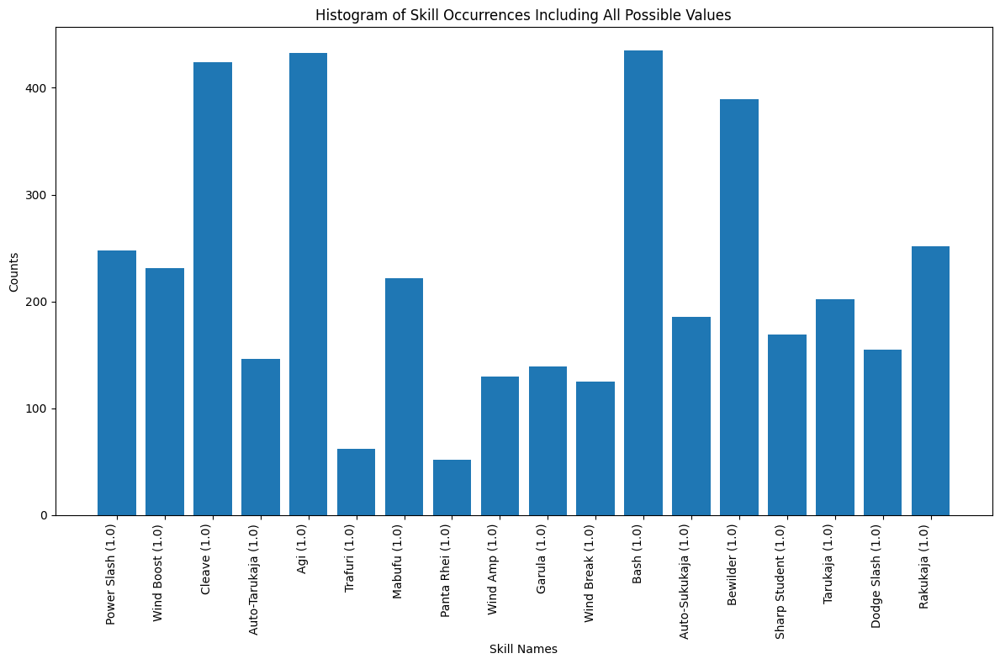

Logger_logs-ALL-optimal_recipes.txt_8_decarabia
{'Mamudo': 266, 'Matarunda': 0, 'Auto-Rakukaja': 254, 'Bufula': 249, 'Herculean Strike': 195, 'Garudyne': 159, 'Mudo': 339, 'Recarmdra': 115, 'Dekunda': 260, 'Poison Arrow': 156, 'Power Charge': 201, 'Null Distress': 162, 'Resist Strike': 162, 'Sukunda': 344, 'Tarukaja': 348, 'Sexy Dance': 261, 'Me Patra': 251, 'Arrow Rain': 119, 'Virus Breath': 159}
{'Mamudo': 0.0665, 'Matarunda': 0.0, 'Auto-Rakukaja': 0.0635, 'Bufula': 0.06225, 'Herculean Strike': 0.04875, 'Garudyne': 0.03975, 'Mudo': 0.08475, 'Recarmdra': 0.02875, 'Dekunda': 0.065, 'Poison Arrow': 0.039, 'Power Charge': 0.05025, 'Null Distress': 0.0405, 'Resist Strike': 0.0405, 'Sukunda': 0.086, 'Tarukaja': 0.087, 'Sexy Dance': 0.06525, 'Me Patra': 0.06275, 'Arrow Rain': 0.02975, 'Virus Breath': 0.03975}
Persona List:  [('pazuzu', 'Devil'), ('ubelluris', 'Hanged Man'), ('genbu', 'Temperance')]


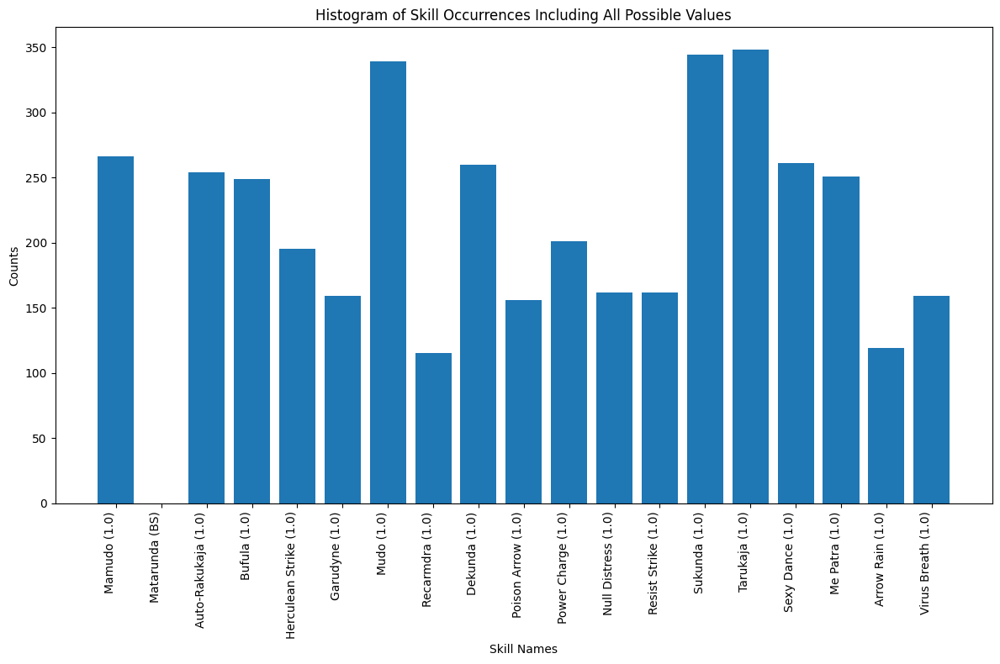

Logger_logs-ALL-optimal_recipes.txt_9_loki
{'Mazionga': 241, 'Spell Master': 106, 'Mahama': 308, 'Torrent Shot': 229, 'Maragidyne': 159, 'Victory Cry': 111, 'Null Elec': 220, 'Power Charge': 229, 'Zan-ei': 299, 'Tarukaja': 463, 'Repel Light': 160, 'Me Patra': 310, 'Twin Shot': 306, 'High Counter': 198, 'Matarukaja': 186, 'Regenerate 3': 170, 'Auto-Tarukaja': 305}
{'Mazionga': 0.06025, 'Spell Master': 0.0265, 'Mahama': 0.077, 'Torrent Shot': 0.05725, 'Maragidyne': 0.03975, 'Victory Cry': 0.02775, 'Null Elec': 0.055, 'Power Charge': 0.05725, 'Zan-ei': 0.07475, 'Tarukaja': 0.11575, 'Repel Light': 0.04, 'Me Patra': 0.0775, 'Twin Shot': 0.0765, 'High Counter': 0.0495, 'Matarukaja': 0.0465, 'Regenerate 3': 0.0425, 'Auto-Tarukaja': 0.07625}
Persona List:  [('satan', 'Judgment'), ('cu chulainn', 'Tower'), ('vasuki', 'Hanged Man')]


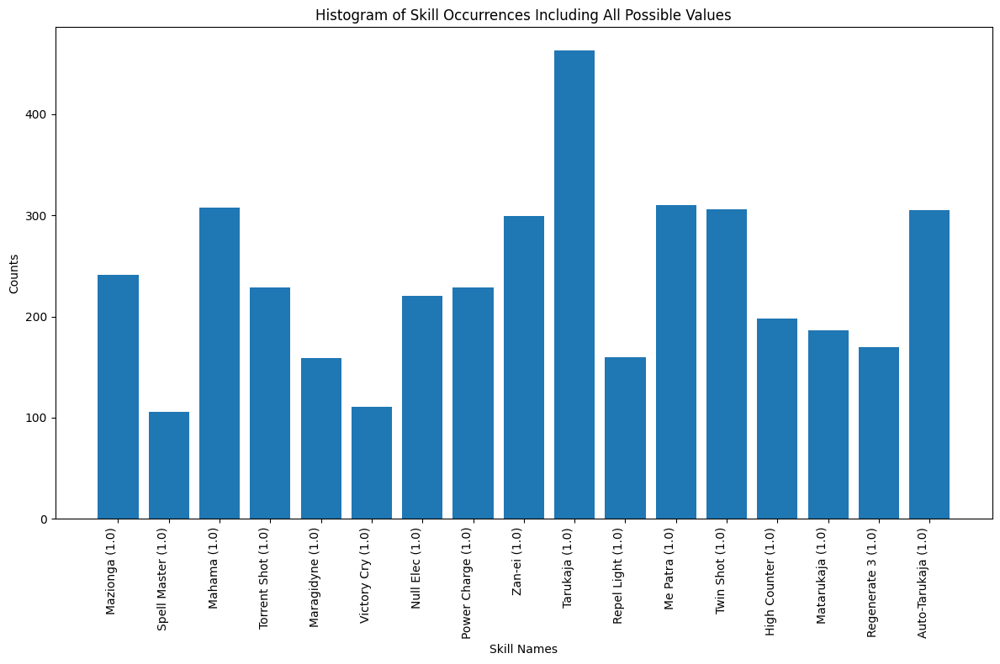

Logger_logs-ALL-optimal_recipes.txt_10_loki
{'Wind Boost': 261, 'Absorb Fire': 92, 'Hama': 274, 'Unshaken Will': 75, 'Patra': 461, 'Charmdi': 301, 'Garudyne': 0, 'Niflheim': 66, 'Counter': 207, 'Raging Tiger': 482, 'Magarudyne': 108, 'Garu': 504, 'Mediarama': 119, 'Wind Amp': 144, 'Mabufudyne': 108, 'Diarahan': 110, 'Sukukaja': 284, 'Ice Amp': 165, 'High Counter': 117, 'Mind Charge': 122}
{'Wind Boost': 0.06525, 'Absorb Fire': 0.023, 'Hama': 0.0685, 'Unshaken Will': 0.01875, 'Patra': 0.11525, 'Charmdi': 0.07525, 'Garudyne': 0.0, 'Niflheim': 0.0165, 'Counter': 0.05175, 'Raging Tiger': 0.1205, 'Magarudyne': 0.027, 'Garu': 0.126, 'Mediarama': 0.02975, 'Wind Amp': 0.036, 'Mabufudyne': 0.027, 'Diarahan': 0.0275, 'Sukukaja': 0.071, 'Ice Amp': 0.04125, 'High Counter': 0.02925, 'Mind Charge': 0.0305}
Persona List:  [('skadi', 'Empress'), ('suparna', 'Sun'), ('angel', 'Justice')]


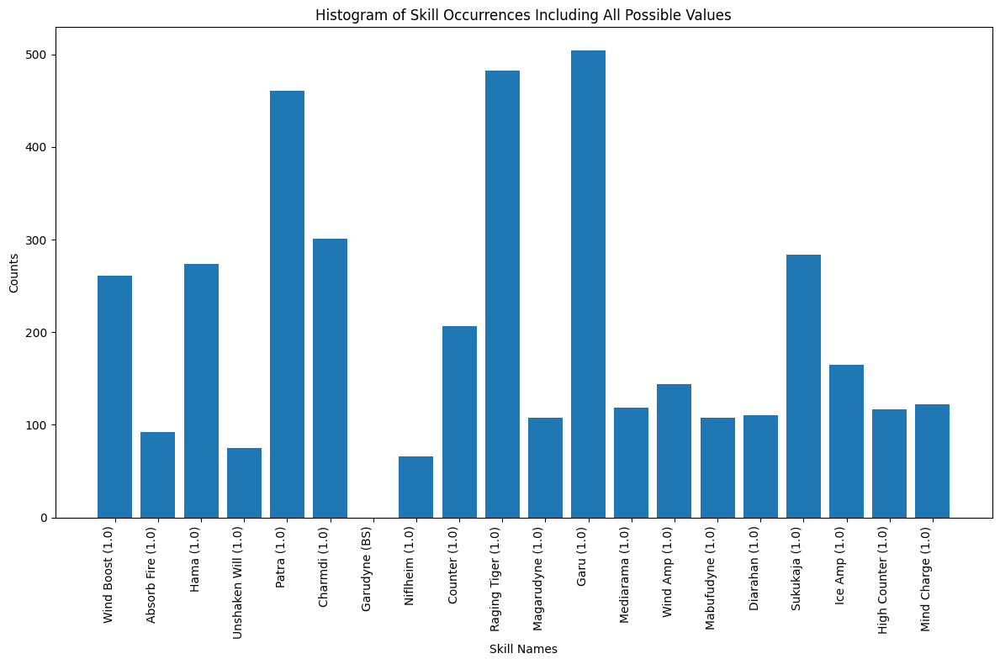

Logger_logs-ALL-optimal_recipes_part2.txt_1_ose
{'Mahamaon': 286, 'Hama Boost': 319, 'Dekaja': 308, 'Counterstrike': 304, 'Mediarahan': 177, 'Evil Touch': 419, 'Resist Dark': 336, 'Null Distress': 265, 'Hamaon': 316, 'Herculean Strike': 301, 'Recarmdra': 164, 'Single Shot': 801}
{'Mahamaon': 0.07157157157157157, 'Hama Boost': 0.07982982982982983, 'Dekaja': 0.07707707707707707, 'Counterstrike': 0.07607607607607608, 'Mediarahan': 0.044294294294294295, 'Evil Touch': 0.10485485485485485, 'Resist Dark': 0.08408408408408409, 'Null Distress': 0.06631631631631632, 'Hamaon': 0.07907907907907907, 'Herculean Strike': 0.07532532532532532, 'Recarmdra': 0.04104104104104104, 'Single Shot': 0.20045045045045046}
Persona List:  [('throne', 'Justice'), ('ubelluris', 'Hanged Man'), ('slime', 'Fool')]


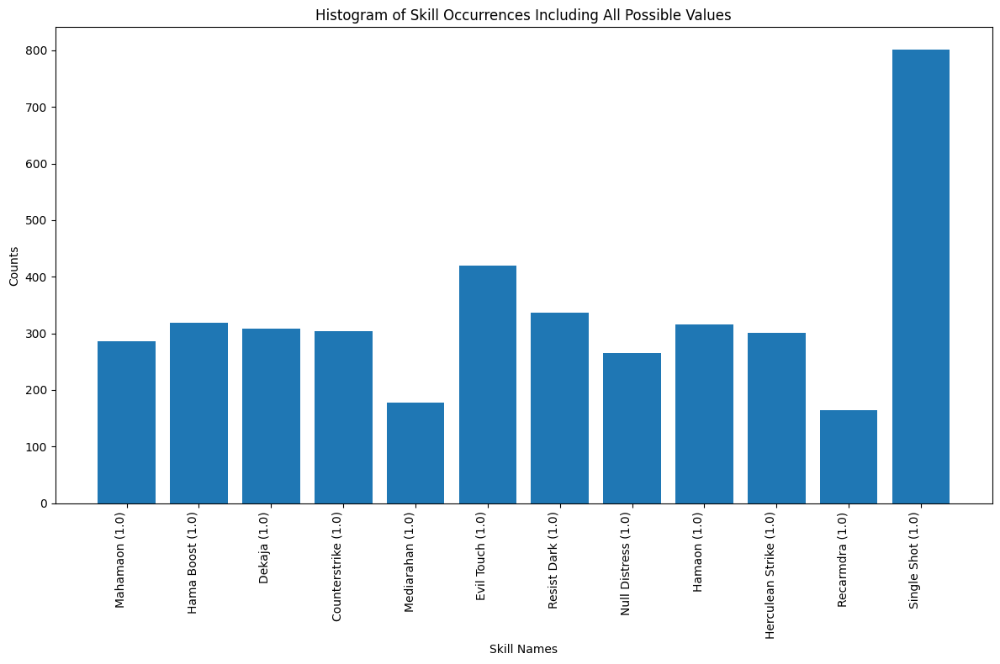

Logger_logs-STRIKE-optimal_recipes.txt_6_ubelluris
{'Trafuri': 160, 'Provoke': 0, 'Garula': 0, 'Kill Rush': 967, 'Wind Boost': 460, 'Dekaja': 45, 'Null Poison': 234, 'Wind Amp': 272, 'Invigorate 2': 219, 'Tentarafoo': 0, 'Maragi': 0, 'Panta Rhei': 0, 'Foul Breath': 110, 'Rebellion': 130, 'Growth 1': 486, 'Zio': 0, 'Heat Wave': 880, 'Rakukaja': 103, 'Counterstrike': 291, 'Wind Break': 60, 'Virus Breath': 0, 'Sharp Student': 340, 'Auto-Maraku': 200, 'Marakukaja': 43}
{'Trafuri': 0.032, 'Provoke': 0.0, 'Garula': 0.0, 'Kill Rush': 0.1934, 'Wind Boost': 0.092, 'Dekaja': 0.009, 'Null Poison': 0.0468, 'Wind Amp': 0.0544, 'Invigorate 2': 0.0438, 'Tentarafoo': 0.0, 'Maragi': 0.0, 'Panta Rhei': 0.0, 'Foul Breath': 0.022, 'Rebellion': 0.026, 'Growth 1': 0.0972, 'Zio': 0.0, 'Heat Wave': 0.176, 'Rakukaja': 0.0206, 'Counterstrike': 0.0582, 'Wind Break': 0.012, 'Virus Breath': 0.0, 'Sharp Student': 0.068, 'Auto-Maraku': 0.04, 'Marakukaja': 0.0086}
Persona List:  [('barong', 'Emperor'), ('orobas', 'Ma

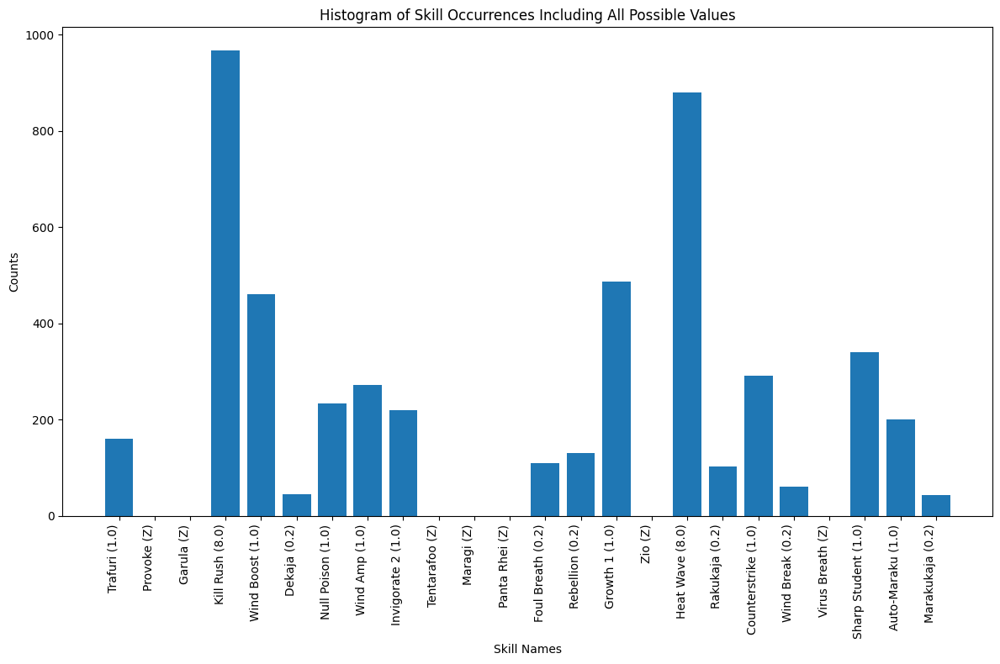

Logger_logs-STRIKE-optimal_recipes.txt_7_helel
{'Regenerate 3': 244, 'Makarakarn': 43, 'Absorb Strike': 172, 'Megido': 60, 'Repel Slash': 192, 'Wind Boost': 562, 'Wind Amp': 298, 'Primal Force': 0, 'Growth 3': 301, 'Ziodyne': 0, 'Counter': 402, 'Vorpal Blade': 0, 'Mabufudyne': 0, 'Invigorate 3': 198, 'Tarukaja': 137, 'Mind Charge': 0, 'Salvation': 28, 'Repel Strike': 186, 'Myriad Arrows': 172, 'Poison Arrow': 245, 'Mediarahan': 43, 'Akasha Arts': 819, 'Victory Cry': 142, "God's Hand": 756}
{'Regenerate 3': 0.0488, 'Makarakarn': 0.0086, 'Absorb Strike': 0.0344, 'Megido': 0.012, 'Repel Slash': 0.0384, 'Wind Boost': 0.1124, 'Wind Amp': 0.0596, 'Primal Force': 0.0, 'Growth 3': 0.0602, 'Ziodyne': 0.0, 'Counter': 0.0804, 'Vorpal Blade': 0.0, 'Mabufudyne': 0.0, 'Invigorate 3': 0.0396, 'Tarukaja': 0.0274, 'Mind Charge': 0.0, 'Salvation': 0.0056, 'Repel Strike': 0.0372, 'Myriad Arrows': 0.0344, 'Poison Arrow': 0.049, 'Mediarahan': 0.0086, 'Akasha Arts': 0.1638, 'Victory Cry': 0.0284, "God's Han

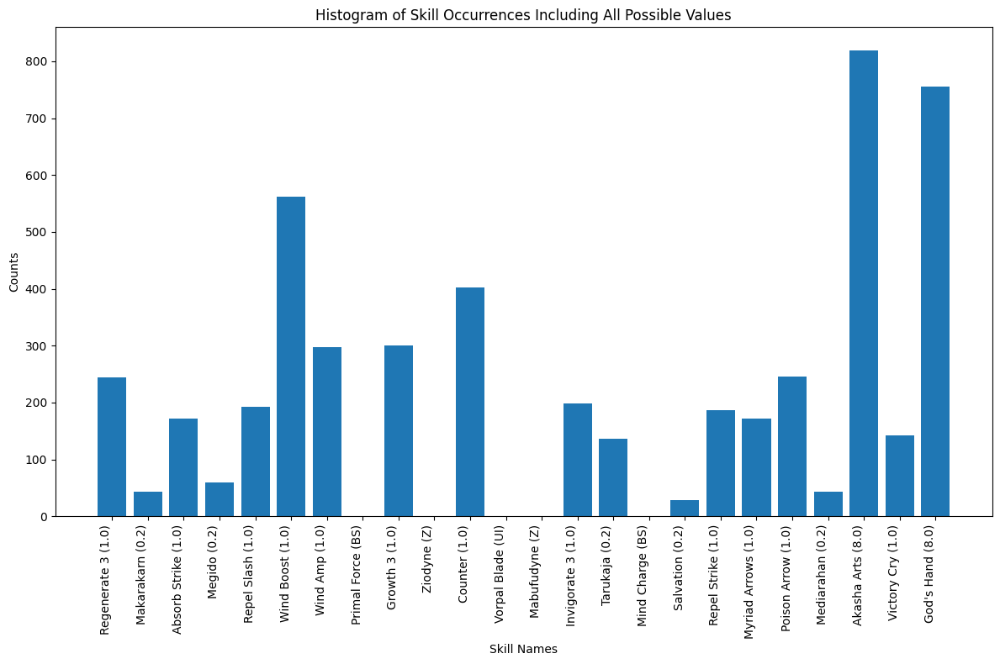

Logger_logs-STRIKE-optimal_recipes.txt_1_vishnu
{'Absorb Slash': 255, 'Samsara': 0, 'Null Panic': 376, 'Amrita': 78, 'Null Dark': 338, 'Primal Force': 253, 'Growth 3': 429, 'Recarm': 75, 'Morning Star': 39, 'High Counter': 407, 'Maziodyne': 0, 'Counter': 533, 'Diarahan': 111, 'Elec Amp': 441, 'Tarukaja': 202, 'Vile Assault': 352, 'Sukukaja': 187, 'Mind Charge': 79, 'Salvation': 36, 'Spell Master': 214, 'Thunder Reign': 0, 'Patra': 390, 'Victory Cry': 205}
{'Absorb Slash': 0.051, 'Samsara': 0.0, 'Null Panic': 0.0752, 'Amrita': 0.0156, 'Null Dark': 0.0676, 'Primal Force': 0.0506, 'Growth 3': 0.0858, 'Recarm': 0.015, 'Morning Star': 0.0078, 'High Counter': 0.0814, 'Maziodyne': 0.0, 'Counter': 0.1066, 'Diarahan': 0.0222, 'Elec Amp': 0.0882, 'Tarukaja': 0.0404, 'Vile Assault': 0.0704, 'Sukukaja': 0.0374, 'Mind Charge': 0.0158, 'Salvation': 0.0072, 'Spell Master': 0.0428, 'Thunder Reign': 0.0, 'Patra': 0.078, 'Victory Cry': 0.041}
Persona List:  [('helel', 'Star'), ('odin', 'Emperor'), ('dai

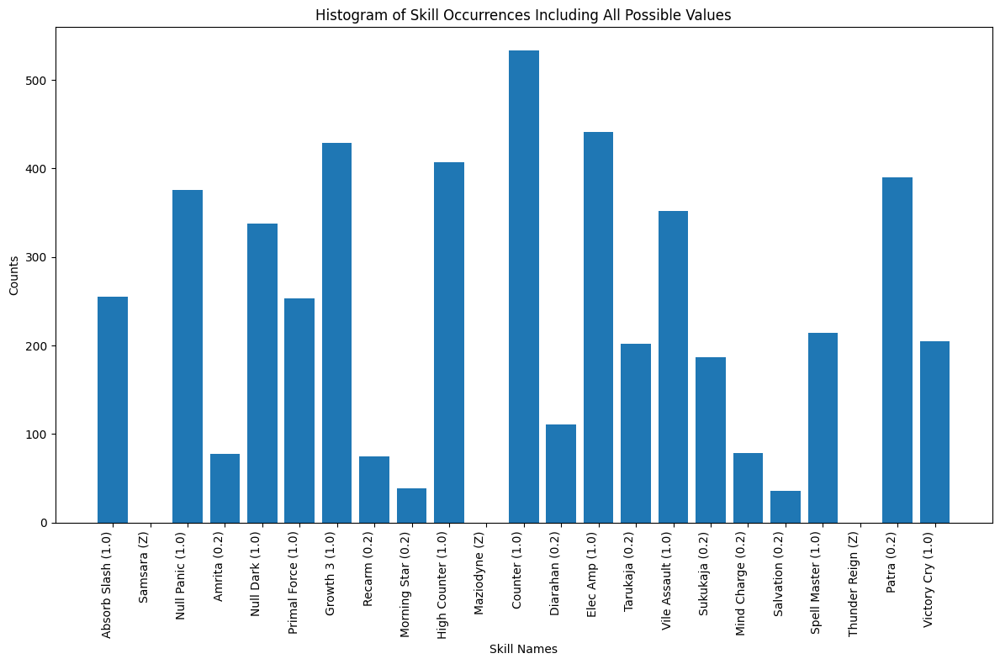

Logger_logs-STRIKE-optimal_recipes.txt_2_nata taishi
{'Diarama': 53, 'Single Shot': 599, 'Twin Shot': 247, 'Deathbound': 118, 'Ice Boost': 343, 'Zio': 0, 'Dodge Strike': 248, 'Sukukaja': 82, 'Poisma': 0, 'Raging Tiger': 608, 'Blade of Fury': 134, 'Auto-Tarukaja': 277, 'Null Distress': 150, 'Apt Pupil': 160, 'Poison Mist': 0, 'Marakunda': 34, 'Sonic Punch': 947}
{'Diarama': 0.01325, 'Single Shot': 0.14975, 'Twin Shot': 0.06175, 'Deathbound': 0.0295, 'Ice Boost': 0.08575, 'Zio': 0.0, 'Dodge Strike': 0.062, 'Sukukaja': 0.0205, 'Poisma': 0.0, 'Raging Tiger': 0.152, 'Blade of Fury': 0.0335, 'Auto-Tarukaja': 0.06925, 'Null Distress': 0.0375, 'Apt Pupil': 0.04, 'Poison Mist': 0.0, 'Marakunda': 0.0085, 'Sonic Punch': 0.23675}
Persona List:  [('kali', 'Strength'), ('gurr', 'Moon'), ('inugami', 'Hanged Man')]


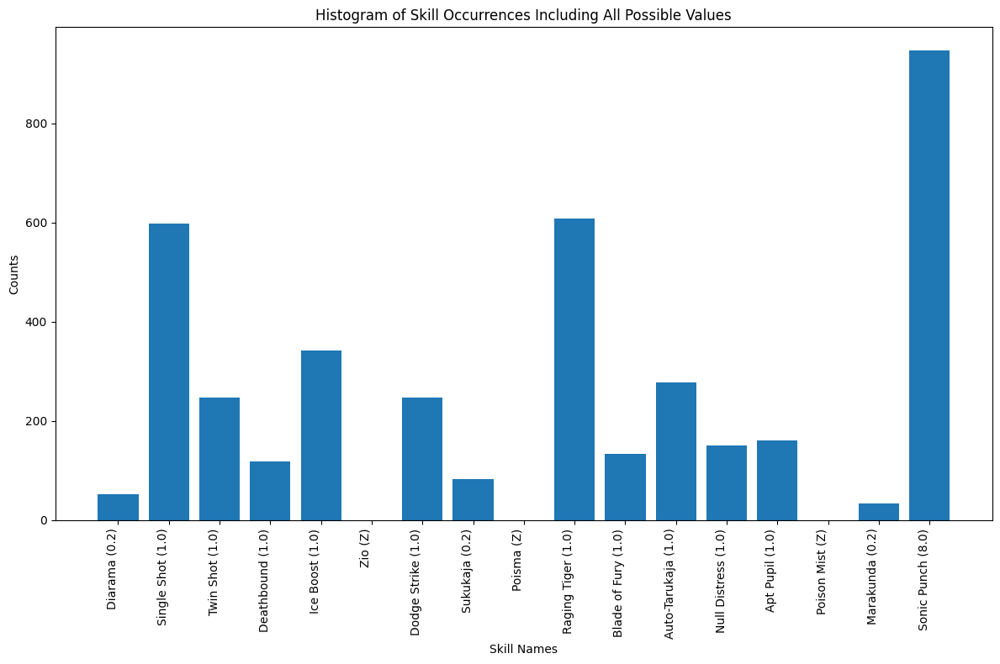

Logger_logs-STRIKE-optimal_recipes.txt_3_melchizedek
{'Bash': 999, 'Enradi': 189, 'Spirit Drain': 84, 'Megido': 61, 'Recarmdra': 54, 'Marakunda': 71, 'Megidola': 57, 'Zio': 0, 'Marin Karin': 0, 'Maragidyne': 0, 'Stagnant Air': 132, 'Herculean Strike': 974, 'Null Distress': 382, 'Die for Me!': 0, 'Evil Touch': 0, 'Null Fire': 339, 'Repel Dark': 309, 'Apt Pupil': 349, 'Bufudyne': 0}
{'Bash': 0.24975, 'Enradi': 0.04725, 'Spirit Drain': 0.021, 'Megido': 0.01525, 'Recarmdra': 0.0135, 'Marakunda': 0.01775, 'Megidola': 0.01425, 'Zio': 0.0, 'Marin Karin': 0.0, 'Maragidyne': 0.0, 'Stagnant Air': 0.033, 'Herculean Strike': 0.2435, 'Null Distress': 0.0955, 'Die for Me!': 0.0, 'Evil Touch': 0.0, 'Null Fire': 0.08475, 'Repel Dark': 0.07725, 'Apt Pupil': 0.08725, 'Bufudyne': 0.0}
Persona List:  [('loki', 'Fool'), ('alice', 'Death'), ('ubelluris', 'Hanged Man')]


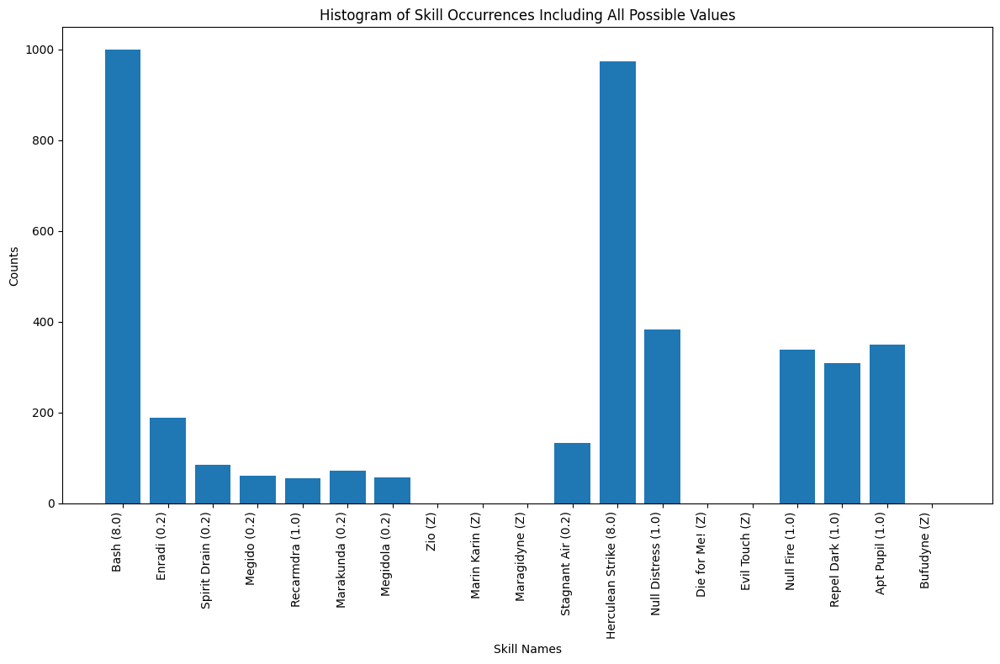

Logger_logs-STRIKE-optimal_recipes.txt_4_melchizedek
{'Makarakarn': 26, 'Cleave': 747, 'Auto-Sukukaja': 376, 'Mamudoon': 0, 'Cruel Attack': 283, 'Evade Wind': 278, 'Rakunda': 130, 'Maragion': 0, 'High Counter': 216, 'Revolution': 78, 'Dodge Ice': 346, 'Power Slash': 498, 'Twin Shot': 344, 'Agilao': 0, 'Gale Slash': 387, 'Rakukaja': 106, 'Sukukaja': 109, 'Spell Master': 109, 'Mighty Swing': 288, 'Sharp Student': 369, 'Megidolaon': 31, 'Brave Blade': 159, 'Victory Cry': 120, 'Magarudyne': 0}
{'Makarakarn': 0.0052, 'Cleave': 0.1494, 'Auto-Sukukaja': 0.0752, 'Mamudoon': 0.0, 'Cruel Attack': 0.0566, 'Evade Wind': 0.0556, 'Rakunda': 0.026, 'Maragion': 0.0, 'High Counter': 0.0432, 'Revolution': 0.0156, 'Dodge Ice': 0.0692, 'Power Slash': 0.0996, 'Twin Shot': 0.0688, 'Agilao': 0.0, 'Gale Slash': 0.0774, 'Rakukaja': 0.0212, 'Sukukaja': 0.0218, 'Spell Master': 0.0218, 'Mighty Swing': 0.0576, 'Sharp Student': 0.0738, 'Megidolaon': 0.0062, 'Brave Blade': 0.0318, 'Victory Cry': 0.024, 'Magarudyne':

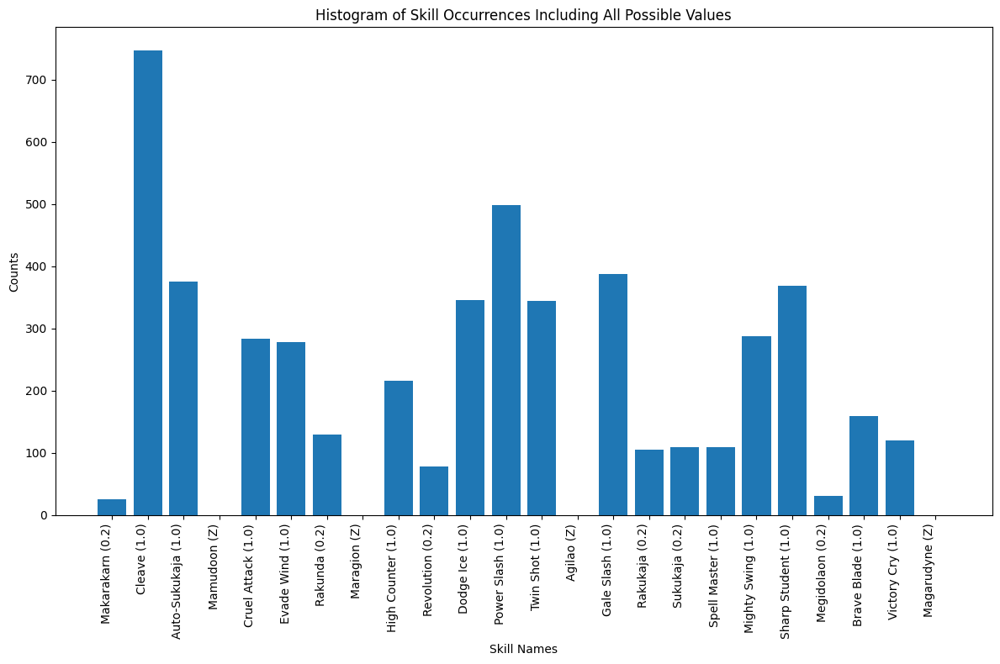

Logger_logs-STRIKE-optimal_recipes.txt_5_ubelluris
{'Auto-Masuku': 304, 'Vorpal Blade': 0, 'Rakukaja': 176, 'Matarunda': 106, 'Tarukaja': 178, 'Tempest Slash': 246, 'Power Charge': 86, 'Arrow Rain': 254, 'Double Fangs': 683, 'High Counter': 370, 'Virus Breath': 0, 'Vicious Strike': 925, 'Poison Arrow': 353, 'Bewilder': 0, 'Garudyne': 0, 'Auto-Mataru': 319, 'Sexy Dance': 0}
{'Auto-Masuku': 0.076, 'Vorpal Blade': 0.0, 'Rakukaja': 0.044, 'Matarunda': 0.0265, 'Tarukaja': 0.0445, 'Tempest Slash': 0.0615, 'Power Charge': 0.0215, 'Arrow Rain': 0.0635, 'Double Fangs': 0.17075, 'High Counter': 0.0925, 'Virus Breath': 0.0, 'Vicious Strike': 0.23125, 'Poison Arrow': 0.08825, 'Bewilder': 0.0, 'Garudyne': 0.0, 'Auto-Mataru': 0.07975, 'Sexy Dance': 0.0}
Persona List:  [('siegfried', 'Strength'), ('pazuzu', 'Devil'), ('naga', 'Hermit')]


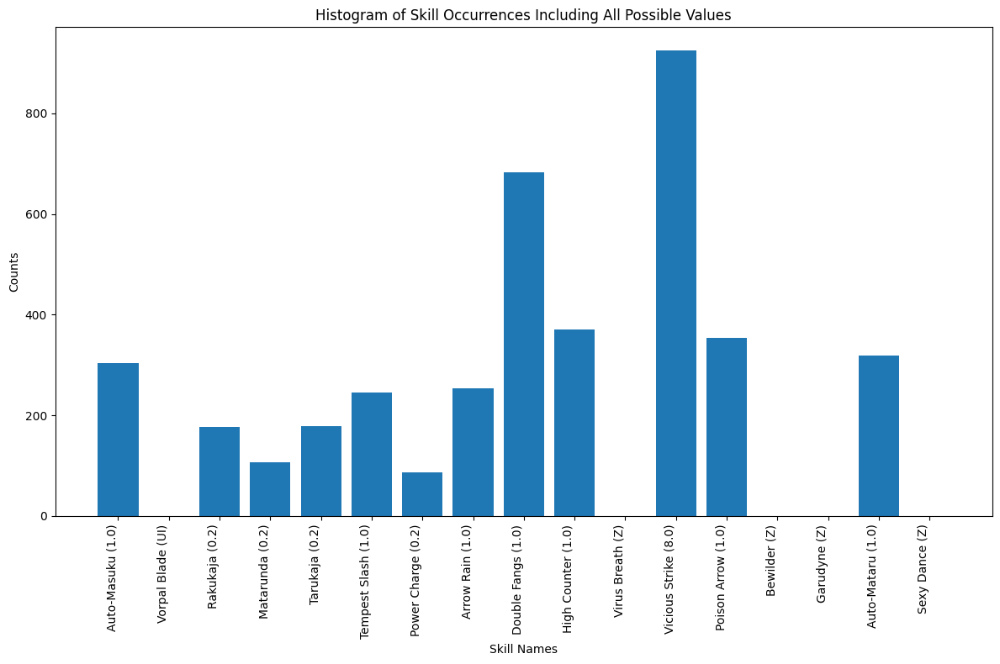

Logger_logs-PIERCE-optimal_recipes.txt_1_raja naga
{'Recarm': 48, 'Poison Mist': 0, 'Growth 3': 207, 'Twin Shot': 0, 'Dodge Strike': 287, 'Auto-Tarukaja': 319, 'Evil Touch': 0, 'Raging Tiger': 705, 'Ice Boost': 388, 'Null Dark': 199, 'Sonic Punch': 416, 'Samsara': 0, 'Patra': 187, 'Single Shot': 996, 'Diarahan': 29, 'Sukukaja': 104, 'Tarukaja': 115}
{'Recarm': 0.012, 'Poison Mist': 0.0, 'Growth 3': 0.05175, 'Twin Shot': 0.0, 'Dodge Strike': 0.07175, 'Auto-Tarukaja': 0.07975, 'Evil Touch': 0.0, 'Raging Tiger': 0.17625, 'Ice Boost': 0.097, 'Null Dark': 0.04975, 'Sonic Punch': 0.104, 'Samsara': 0.0, 'Patra': 0.04675, 'Single Shot': 0.249, 'Diarahan': 0.00725, 'Sukukaja': 0.026, 'Tarukaja': 0.02875}
Persona List:  [('daisoujou', 'Hierophant'), ('gurr', 'Moon'), ('slime', 'Fool')]


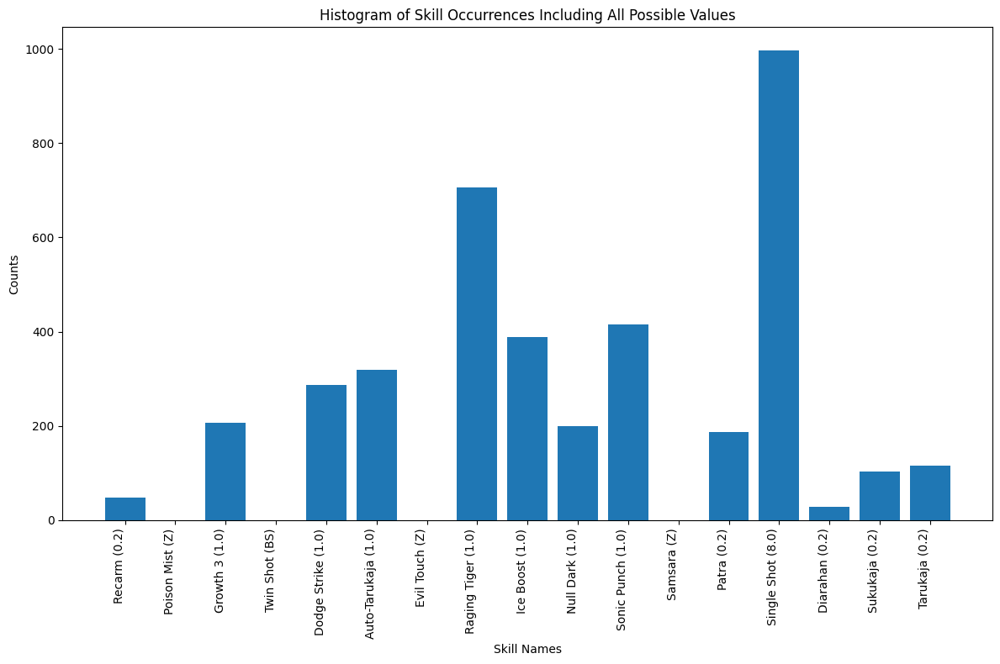

Logger_logs-PIERCE-optimal_recipes.txt_2_scathach
{'Getsu-ei': 480, 'Vorpal Blade': 0, 'Magarudyne': 0, 'Garudyne': 0, 'Fatal End': 436, 'Tempest Slash': 288, 'Repel Wind': 295, 'Recarm': 74, 'Mediarama': 84, 'Rakukaja': 187, 'Auto-Masuku': 286, 'Vicious Strike': 293, 'High Counter': 350, 'Power Charge': 93, 'Amrita': 73, 'Counter': 550, 'Auto-Mataru': 310, 'Media': 124, 'Matarukaja': 77}
{'Getsu-ei': 0.12, 'Vorpal Blade': 0.0, 'Magarudyne': 0.0, 'Garudyne': 0.0, 'Fatal End': 0.109, 'Tempest Slash': 0.072, 'Repel Wind': 0.07375, 'Recarm': 0.0185, 'Mediarama': 0.021, 'Rakukaja': 0.04675, 'Auto-Masuku': 0.0715, 'Vicious Strike': 0.07325, 'High Counter': 0.0875, 'Power Charge': 0.02325, 'Amrita': 0.01825, 'Counter': 0.1375, 'Auto-Mataru': 0.0775, 'Media': 0.031, 'Matarukaja': 0.01925}
Persona List:  [('garuda', 'Star'), ('siegfried', 'Strength'), ('hanuman', 'Strength')]


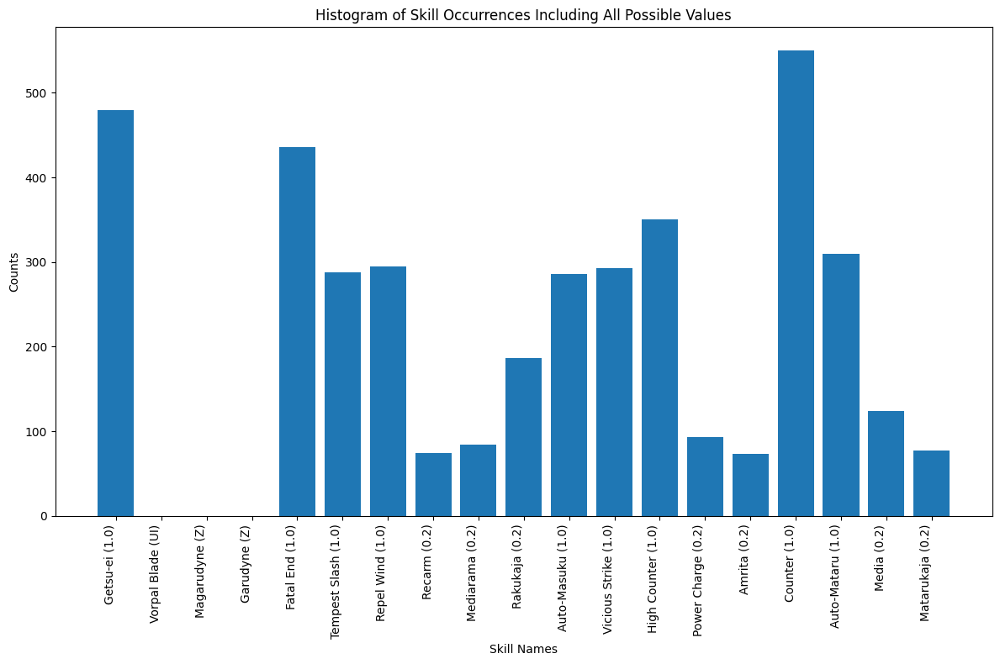

Logger_logs-PIERCE-optimal_recipes.txt_3_seiten taisei
{'High Counter': 122, 'Cleave': 517, 'Morning Star': 23, 'Absorb Slash': 85, 'Twin Shot': 863, 'Power Slash': 296, 'Mind Charge': 31, 'Spell Master': 58, 'Gigantic Fist': 137, 'Evade Strike': 136, 'Cruel Attack': 786, 'Maragion': 0, 'Salvation': 11, 'Victory Cry': 75, 'Revolution': 36, 'Primal Force': 549, 'Dodge Ice': 215, 'Sukukaja': 60}
{'High Counter': 0.0305, 'Cleave': 0.12925, 'Morning Star': 0.00575, 'Absorb Slash': 0.02125, 'Twin Shot': 0.21575, 'Power Slash': 0.074, 'Mind Charge': 0.00775, 'Spell Master': 0.0145, 'Gigantic Fist': 0.03425, 'Evade Strike': 0.034, 'Cruel Attack': 0.1965, 'Maragion': 0.0, 'Salvation': 0.00275, 'Victory Cry': 0.01875, 'Revolution': 0.009, 'Primal Force': 0.13725, 'Dodge Ice': 0.05375, 'Sukukaja': 0.015}
Persona List:  [('helel', 'Star'), ('hecatoncheires', 'Hanged Man'), ('eligor', 'Tower')]


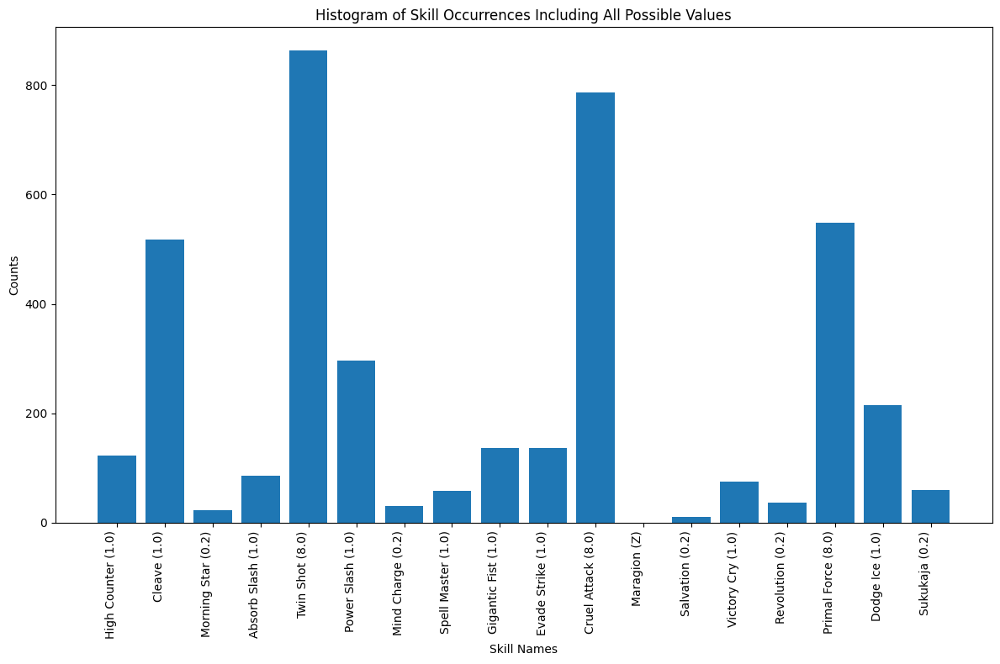

Logger_logs-PIERCE-optimal_recipes.txt_4_chi you
{'Marakunda': 92, 'Brave Blade': 229, 'Magarudyne': 0, 'Repel Slash': 267, 'Mabufudyne': 0, 'Regenerate 3': 329, 'High Counter': 356, 'Deathbound': 303, 'Blade of Fury': 355, 'Null Distress': 349, 'Repel Strike': 259, 'Megidolaon': 45, 'Apt Pupil': 339, 'Growth 3': 422, 'Mediarahan': 48, 'Diarama': 117, 'Spell Master': 215, 'Victory Cry': 212, 'Mamudoon': 0, 'Makarakarn': 63}
{'Marakunda': 0.023, 'Brave Blade': 0.05725, 'Magarudyne': 0.0, 'Repel Slash': 0.06675, 'Mabufudyne': 0.0, 'Regenerate 3': 0.08225, 'High Counter': 0.089, 'Deathbound': 0.07575, 'Blade of Fury': 0.08875, 'Null Distress': 0.08725, 'Repel Strike': 0.06475, 'Megidolaon': 0.01125, 'Apt Pupil': 0.08475, 'Growth 3': 0.1055, 'Mediarahan': 0.012, 'Diarama': 0.02925, 'Spell Master': 0.05375, 'Victory Cry': 0.053, 'Mamudoon': 0.0, 'Makarakarn': 0.01575}
Persona List:  [('lucifer', 'Judgment'), ('alilat', 'Empress'), ('kali', 'Strength')]


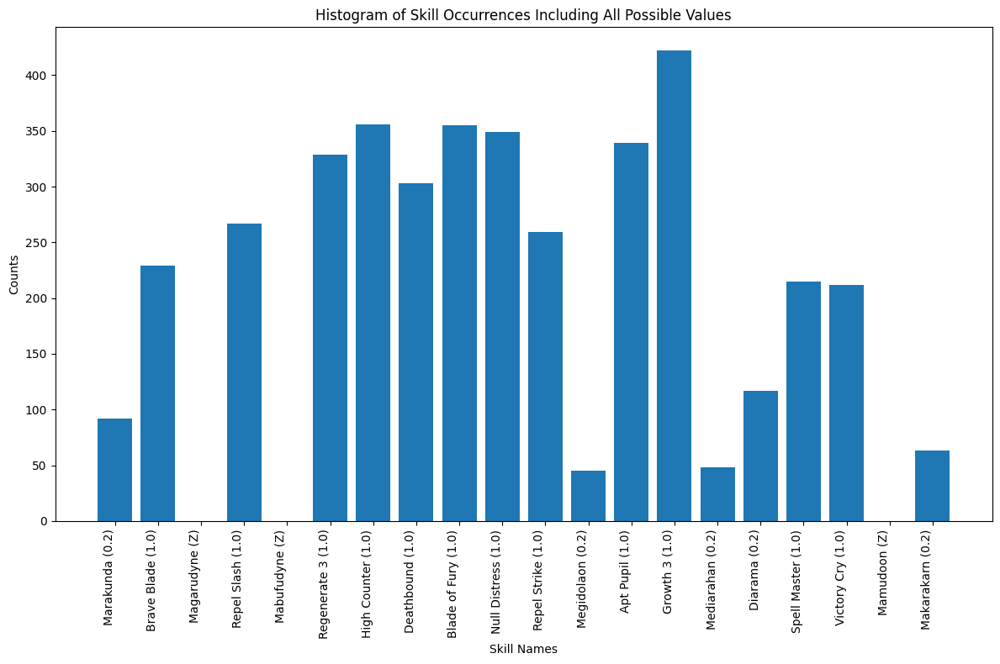

Logger_logs-PIERCE-optimal_recipes.txt_5_eligor
{'Provoke': 0, 'Panta Rhei': 0, 'Dekaja': 78, 'Bewilder': 0, 'Wind Boost': 643, 'Tentarafoo': 0, 'Maragi': 0, 'Rakukaja': 200, 'Garula': 0, 'Wind Break': 79, 'Trafuri': 247, 'Wind Amp': 396, 'Rebellion': 177, 'Zio': 0, 'Sharp Student': 505, 'Kill Rush': 509, 'Double Fangs': 990, 'Foul Breath': 176}
{'Provoke': 0.0, 'Panta Rhei': 0.0, 'Dekaja': 0.0195, 'Bewilder': 0.0, 'Wind Boost': 0.16075, 'Tentarafoo': 0.0, 'Maragi': 0.0, 'Rakukaja': 0.05, 'Garula': 0.0, 'Wind Break': 0.01975, 'Trafuri': 0.06175, 'Wind Amp': 0.099, 'Rebellion': 0.04425, 'Zio': 0.0, 'Sharp Student': 0.12625, 'Kill Rush': 0.12725, 'Double Fangs': 0.2475, 'Foul Breath': 0.044}
Persona List:  [('orobas', 'Magician'), ('vetala', 'Devil'), ('naga', 'Hermit')]


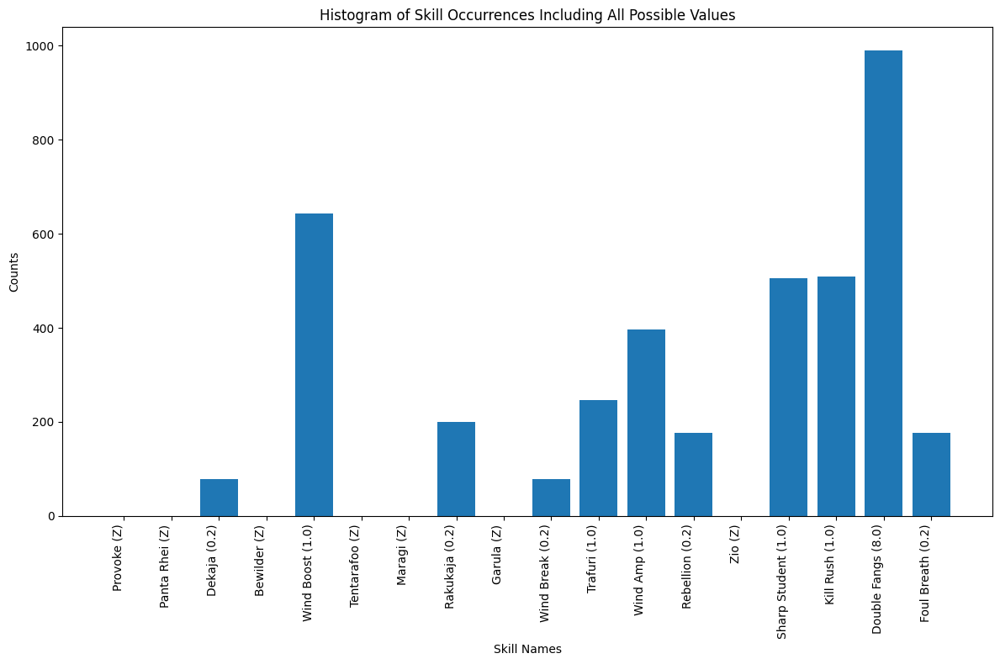

Logger_logs-PIERCE-optimal_recipes.txt_6_seiten taisei
{'Marakunda': 233, 'Repel Dark': 676, 'Myriad Arrows': 990, 'Spirit Drain': 243, 'Die for Me!': 0, 'Null Distress': 731, 'Mabufudyne': 0, 'Evil Touch': 0, 'Megido': 176, 'Zio': 0, 'Marin Karin': 0, 'Herculean Strike': 806, 'Recarmdra': 141}
{'Marakunda': 0.058308308308308306, 'Repel Dark': 0.16916916916916916, 'Myriad Arrows': 0.24774774774774774, 'Spirit Drain': 0.060810810810810814, 'Die for Me!': 0.0, 'Null Distress': 0.18293293293293295, 'Mabufudyne': 0.0, 'Evil Touch': 0.0, 'Megido': 0.044044044044044044, 'Zio': 0.0, 'Marin Karin': 0.0, 'Herculean Strike': 0.2017017017017017, 'Recarmdra': 0.03528528528528529}
Persona List:  [('scathach', 'Priestess'), ('alice', 'Death'), ('ubelluris', 'Hanged Man')]


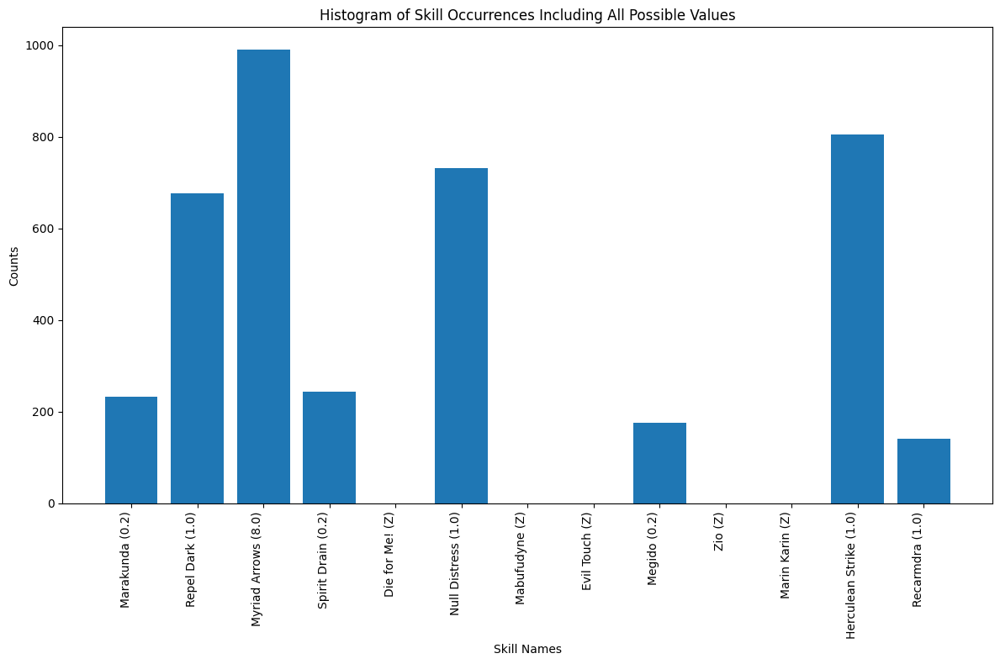

Logger_logs-PIERCE-optimal_recipes.txt_7_kartikeya
{'Garudyne': 0, 'Null Fire': 305, 'Arrow Rain': 906, 'Ziodyne': 0, "God's Hand": 193, 'Poison Arrow': 944, 'Salvation': 22, 'Maragidyne': 0, 'Enradi': 166, 'Megidola': 51, 'Mind Charge': 79, 'Power Charge': 85, 'Akasha Arts': 260, 'Megido': 68, 'Virus Breath': 0, 'Counter': 471, 'Tarukaja': 154, 'Apt Pupil': 281, 'Bufudyne': 0, 'Bash': 825, 'Matarunda': 73, 'Sexy Dance': 0, 'Stagnant Air': 117}
{'Garudyne': 0.0, 'Null Fire': 0.061, 'Arrow Rain': 0.1812, 'Ziodyne': 0.0, "God's Hand": 0.0386, 'Poison Arrow': 0.1888, 'Salvation': 0.0044, 'Maragidyne': 0.0, 'Enradi': 0.0332, 'Megidola': 0.0102, 'Mind Charge': 0.0158, 'Power Charge': 0.017, 'Akasha Arts': 0.052, 'Megido': 0.0136, 'Virus Breath': 0.0, 'Counter': 0.0942, 'Tarukaja': 0.0308, 'Apt Pupil': 0.0562, 'Bufudyne': 0.0, 'Bash': 0.165, 'Matarunda': 0.0146, 'Sexy Dance': 0.0, 'Stagnant Air': 0.0234}
Persona List:  [('vishnu', 'Sun'), ('loki', 'Fool'), ('pazuzu', 'Devil')]


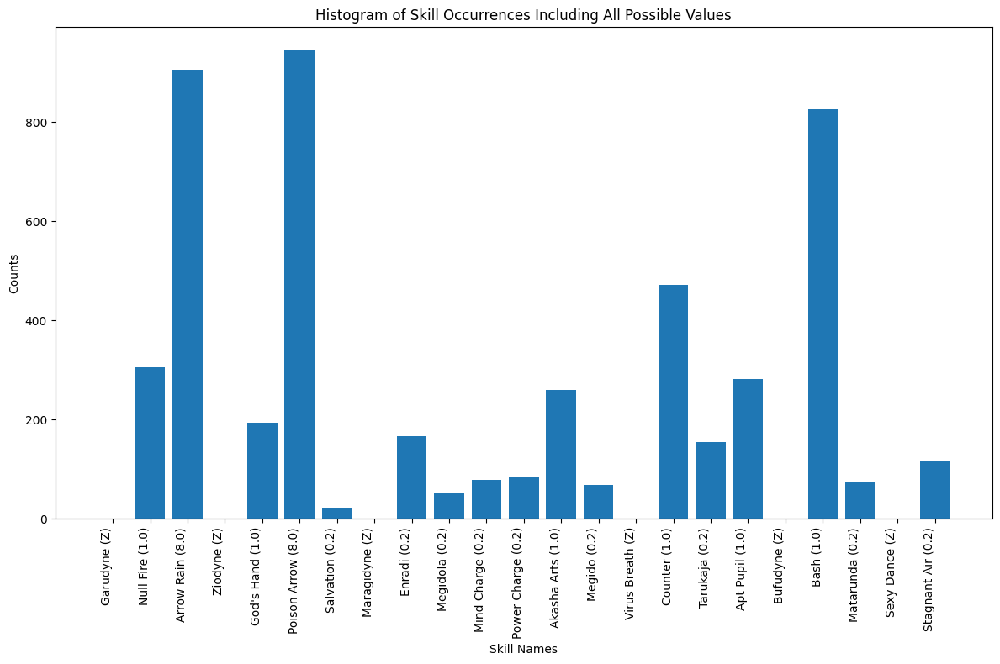

Logger_logs-FIRE-optimal_recipes.txt_1_bishamonten
{'Virus Breath': 217, 'Sexy Dance': 356, 'Spirit Drain': 52, 'Panta Rhei': 0, 'Wind Amp': 256, 'Arrow Rain': 37, 'Wind Boost': 465, 'Marin Karin': 476, 'Zio': 0, 'Sharp Student': 339, 'Matarunda': 249, 'Die for Me!': 104, 'Tarukaja': 449, 'Repel Dark': 181, 'Garudyne': 0, 'Garula': 0, 'Power Charge': 256, 'Evil Touch': 369, 'Trafuri': 131, 'Poison Arrow': 45, 'Wind Break': 267, 'Megido': 39, 'Marakunda': 257, 'Rakukaja': 455}
{'Virus Breath': 0.0434, 'Sexy Dance': 0.0712, 'Spirit Drain': 0.0104, 'Panta Rhei': 0.0, 'Wind Amp': 0.0512, 'Arrow Rain': 0.0074, 'Wind Boost': 0.093, 'Marin Karin': 0.0952, 'Zio': 0.0, 'Sharp Student': 0.0678, 'Matarunda': 0.0498, 'Die for Me!': 0.0208, 'Tarukaja': 0.0898, 'Repel Dark': 0.0362, 'Garudyne': 0.0, 'Garula': 0.0, 'Power Charge': 0.0512, 'Evil Touch': 0.0738, 'Trafuri': 0.0262, 'Poison Arrow': 0.009, 'Wind Break': 0.0534, 'Megido': 0.0078, 'Marakunda': 0.0514, 'Rakukaja': 0.091}
Persona List:  [('al

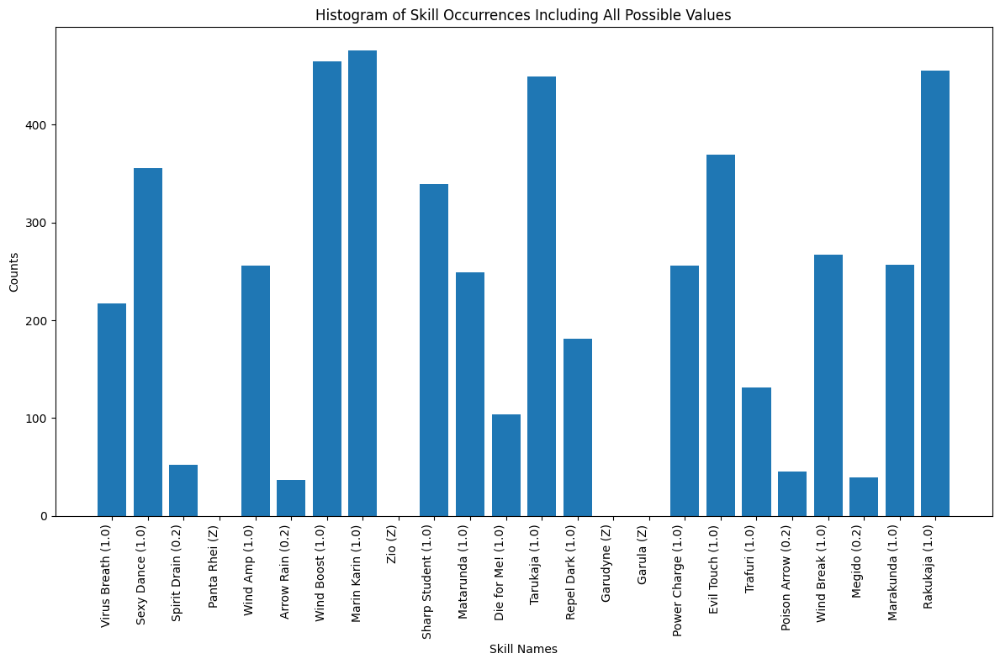

Logger_logs-FIRE-optimal_recipes.txt_2_suzaku
{'Mahama': 0, 'Primal Force': 0, 'Media': 0, 'Me Patra': 0, 'Zan-ei': 0, 'Poison Arrow': 0, 'Wind Amp': 0, 'Invigorate 3': 0, 'Vorpal Blade': 0, 'Wind Boost': 0, 'Magaru': 0, 'Revolution': 0, 'Myriad Arrows': 0, 'Zio': 0, 'Absorb Strike': 0, 'Hama': 1, 'Agi': 1, 'Rakunda': 1, 'Holy Arrow': 1}
{'Mahama': 0.0, 'Primal Force': 0.0, 'Media': 0.0, 'Me Patra': 0.0, 'Zan-ei': 0.0, 'Poison Arrow': 0.0, 'Wind Amp': 0.0, 'Invigorate 3': 0.0, 'Vorpal Blade': 0.0, 'Wind Boost': 0.0, 'Magaru': 0.0, 'Revolution': 0.0, 'Myriad Arrows': 0.0, 'Zio': 0.0, 'Absorb Strike': 0.0, 'Hama': 0.25, 'Agi': 0.25, 'Rakunda': 0.25, 'Holy Arrow': 0.25}
Persona List:  [('chi you', 'Tower'), ('power', 'Justice'), ('hua po', 'Magician')]


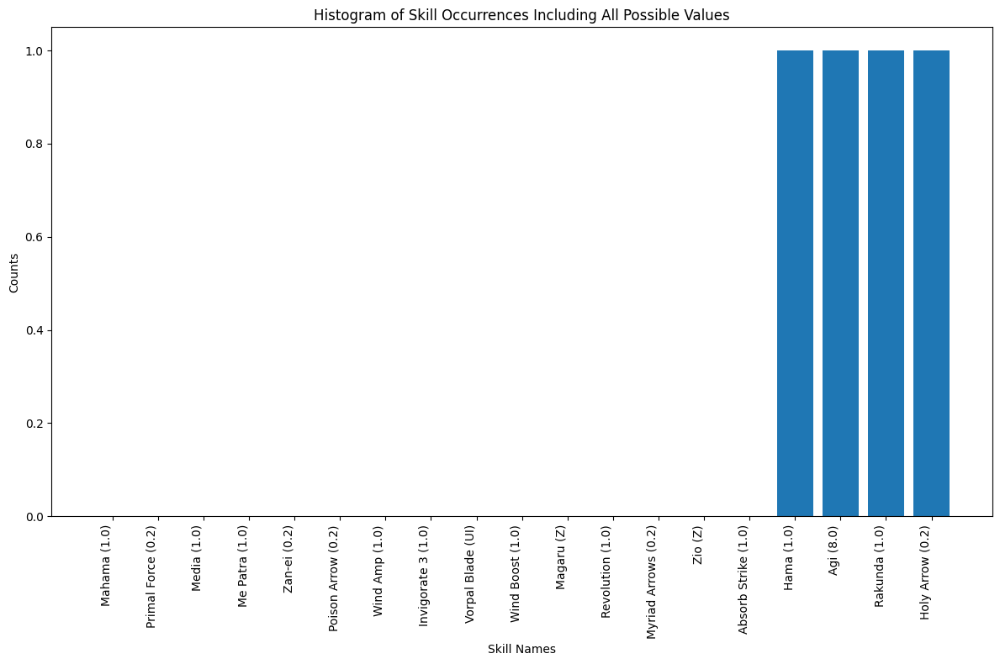

Logger_logs-FIRE-optimal_recipes.txt_3_suzaku
{'Tarukaja': 260, 'Growth 3': 144, 'Auto-Tarukaja': 176, 'Sukukaja': 245, 'Samsara': 56, 'Agi': 975, 'Rebellion': 257, 'Diarahan': 103, 'Maragi': 897, 'Patra': 464, 'Gigantic Fist': 18, 'Recarm': 134, 'Null Dark': 97, 'Evade Strike': 118, 'Double Fangs': 56}
{'Tarukaja': 0.065, 'Growth 3': 0.036, 'Auto-Tarukaja': 0.044, 'Sukukaja': 0.06125, 'Samsara': 0.014, 'Agi': 0.24375, 'Rebellion': 0.06425, 'Diarahan': 0.02575, 'Maragi': 0.22425, 'Patra': 0.116, 'Gigantic Fist': 0.0045, 'Recarm': 0.0335, 'Null Dark': 0.02425, 'Evade Strike': 0.0295, 'Double Fangs': 0.014}
Persona List:  [('hecatoncheires', 'Hanged Man'), ('daisoujou', 'Hierophant'), ('berith', 'Hierophant')]


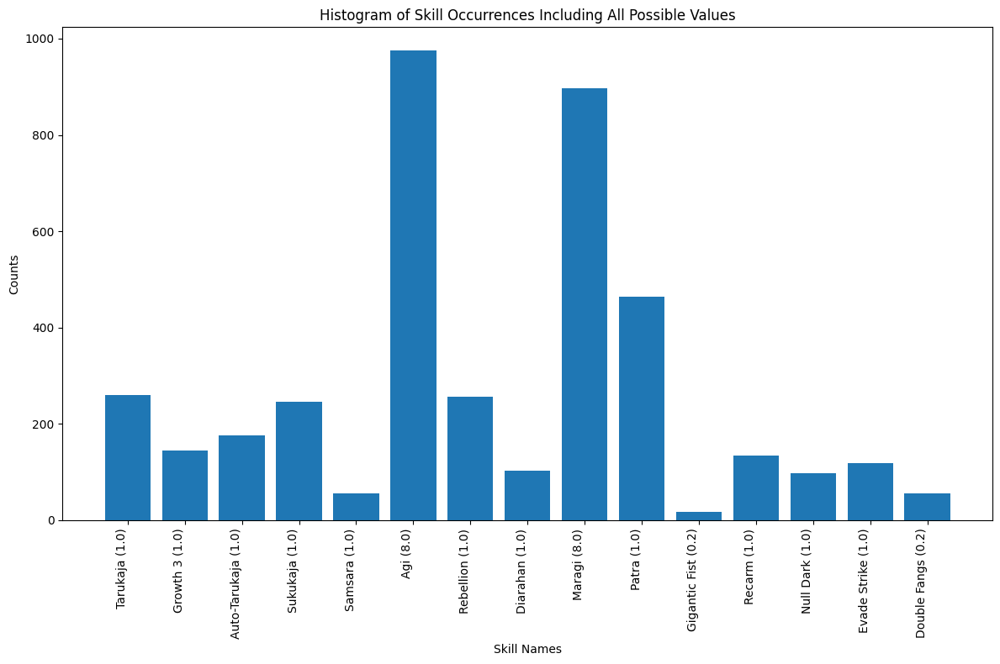

Logger_logs-FIRE-optimal_recipes.txt_4_saturnus
{'Ziodyne': 0, 'Absorb Slash': 50, 'Fire Boost': 206, 'Salvation': 49, 'High Counter': 96, 'Akasha Arts': 11, 'Primal Force': 8, 'Mighty Swing': 23, "God's Hand": 10, 'Mind Charge': 78, 'Spell Master': 36, 'Tarukaja': 197, 'Zan-ei': 38, 'Agidyne': 420, 'Victory Cry': 51, 'Matarukaja': 88, 'Agilao': 470, 'Maragion': 438, 'Apt Pupil': 120, 'Counter': 135, 'Morning Star': 14, 'Megido': 17}
{'Ziodyne': 0.0, 'Absorb Slash': 0.019569471624266144, 'Fire Boost': 0.08062622309197652, 'Salvation': 0.019178082191780823, 'High Counter': 0.037573385518591, 'Akasha Arts': 0.004305283757338552, 'Primal Force': 0.0031311154598825833, 'Mighty Swing': 0.009001956947162427, "God's Hand": 0.003913894324853229, 'Mind Charge': 0.030528375733855185, 'Spell Master': 0.014090019569471625, 'Tarukaja': 0.07710371819960861, 'Zan-ei': 0.01487279843444227, 'Agidyne': 0.1643835616438356, 'Victory Cry': 0.019960861056751468, 'Matarukaja': 0.03444227005870842, 'Agilao': 

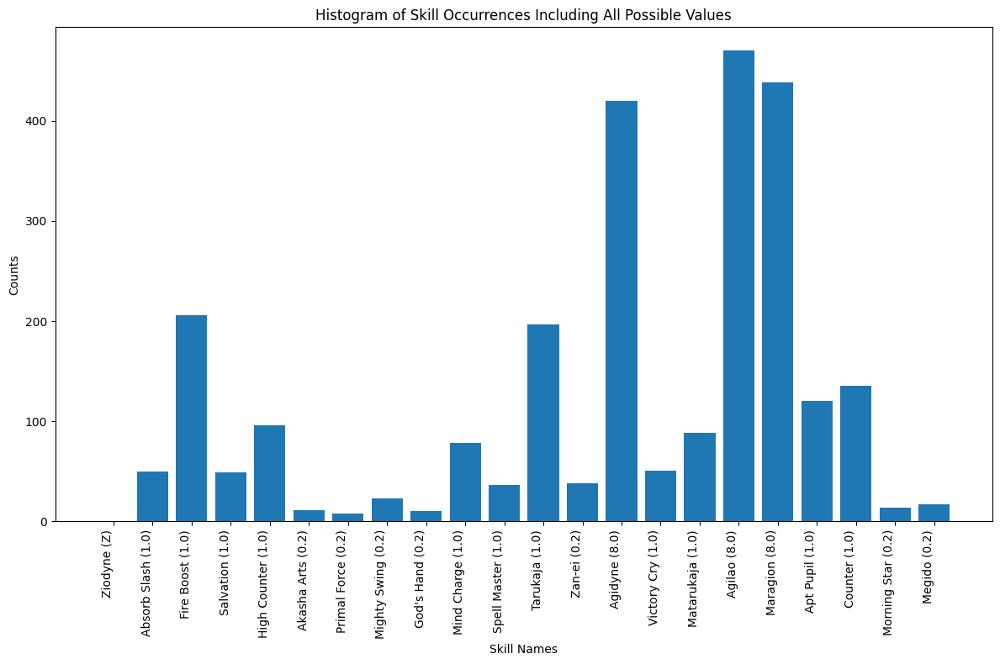

Logger_logs-FIRE-optimal_recipes.txt_5_surt
{'Recarmdra': 192, 'Single Shot': 266, 'Bash': 269, 'Poisma': 807, 'Stagnant Air': 118, 'Megidola': 44, 'Herculean Strike': 68, 'Null Fire': 236, 'Maragidyne': 866, 'Zio': 0, 'Enradi': 581, 'Apt Pupil': 287, 'Null Distress': 266, 'Bufudyne': 0}
{'Recarmdra': 0.048, 'Single Shot': 0.0665, 'Bash': 0.06725, 'Poisma': 0.20175, 'Stagnant Air': 0.0295, 'Megidola': 0.011, 'Herculean Strike': 0.017, 'Null Fire': 0.059, 'Maragidyne': 0.2165, 'Zio': 0.0, 'Enradi': 0.14525, 'Apt Pupil': 0.07175, 'Null Distress': 0.0665, 'Bufudyne': 0.0}
Persona List:  [('loki', 'Fool'), ('ubelluris', 'Hanged Man'), ('inugami', 'Hanged Man')]


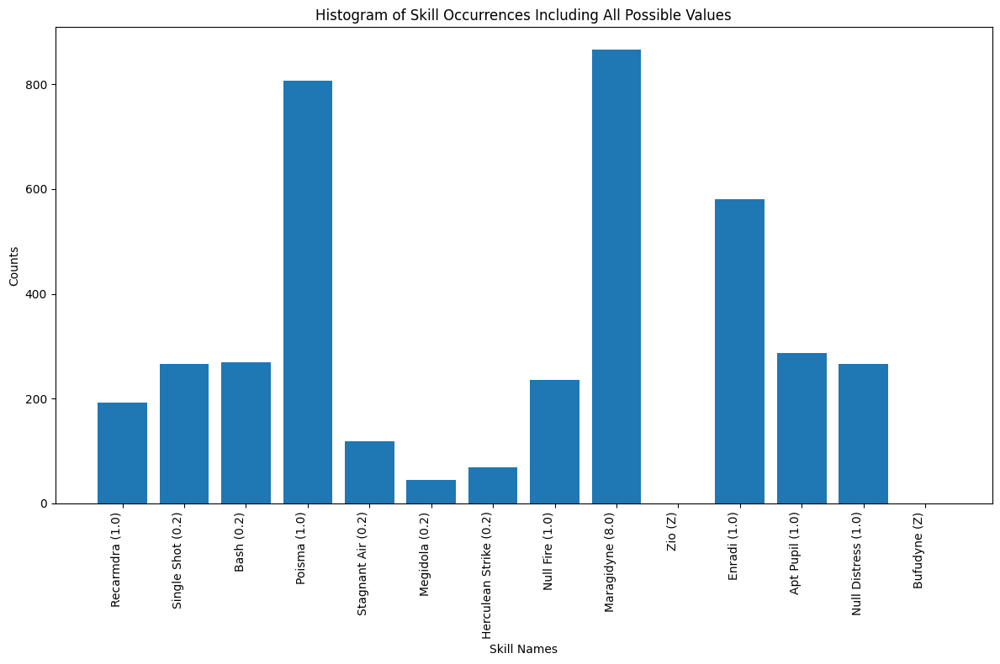

Logger_logs-FIRE-optimal_recipes.txt_6_saturnus
{'Brave Blade': 25, 'Megidolaon': 25, 'Null Slash': 253, 'High Counter': 287, 'Marakunda': 343, 'Spell Master': 176, 'Null Distress': 290, 'Victory Cry': 161, 'Null Strike': 242, 'Blade of Fury': 61, 'Weary Thrust': 0, 'Apt Pupil': 263, 'Magarudyne': 0, 'Evil Smile': 328, 'Null Pierce': 236, 'Null Poison': 299, 'Deathbound': 49, 'Diarama': 451, 'Mamudoon': 299, 'Makarakarn': 212}
{'Brave Blade': 0.00625, 'Megidolaon': 0.00625, 'Null Slash': 0.06325, 'High Counter': 0.07175, 'Marakunda': 0.08575, 'Spell Master': 0.044, 'Null Distress': 0.0725, 'Victory Cry': 0.04025, 'Null Strike': 0.0605, 'Blade of Fury': 0.01525, 'Weary Thrust': 0.0, 'Apt Pupil': 0.06575, 'Magarudyne': 0.0, 'Evil Smile': 0.082, 'Null Pierce': 0.059, 'Null Poison': 0.07475, 'Deathbound': 0.01225, 'Diarama': 0.11275, 'Mamudoon': 0.07475, 'Makarakarn': 0.053}
Persona List:  [('lucifer', 'Judgment'), ('abaddon', 'Devil'), ('kali', 'Strength')]


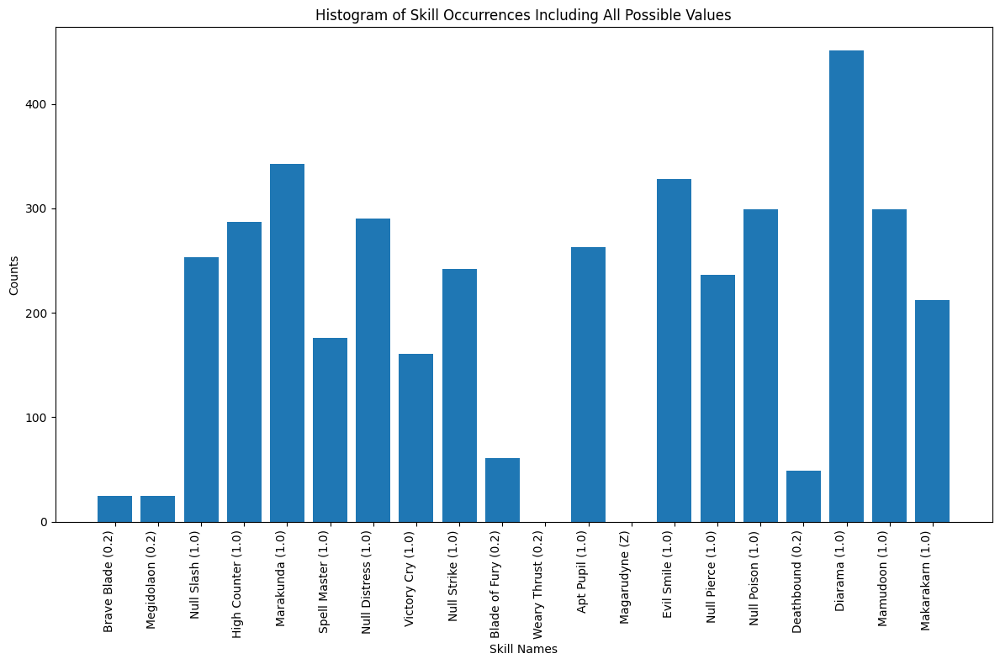

Logger_logs-FIRE-optimal_recipes.txt_7_okuninushi
{'Bufula': 0, 'Dodge Ice': 262, 'Cleave': 162, 'Fire Boost': 386, 'Ragnarok': 564, 'Salvation': 76, 'Twin Shot': 58, 'High Counter': 169, 'Wind Amp': 216, 'Mind Charge': 151, 'Sukunda': 342, 'Me Patra': 270, 'Elec Amp': 210, 'Mamudo': 267, 'Auto-Rakukaja': 232, 'Cruel Attack': 56, 'Revolution': 289, 'Maragion': 0, 'Power Slash': 78, 'Sukukaja': 374, 'Megidola': 23, 'Mudo': 387, 'Dekunda': 260, 'Resist Strike': 168}
{'Bufula': 0.0, 'Dodge Ice': 0.0524, 'Cleave': 0.0324, 'Fire Boost': 0.0772, 'Ragnarok': 0.1128, 'Salvation': 0.0152, 'Twin Shot': 0.0116, 'High Counter': 0.0338, 'Wind Amp': 0.0432, 'Mind Charge': 0.0302, 'Sukunda': 0.0684, 'Me Patra': 0.054, 'Elec Amp': 0.042, 'Mamudo': 0.0534, 'Auto-Rakukaja': 0.0464, 'Cruel Attack': 0.0112, 'Revolution': 0.0578, 'Maragion': 0.0, 'Power Slash': 0.0156, 'Sukukaja': 0.0748, 'Megidola': 0.0046, 'Mudo': 0.0774, 'Dekunda': 0.052, 'Resist Strike': 0.0336}
Persona List:  [('surt', 'Magician'), ('

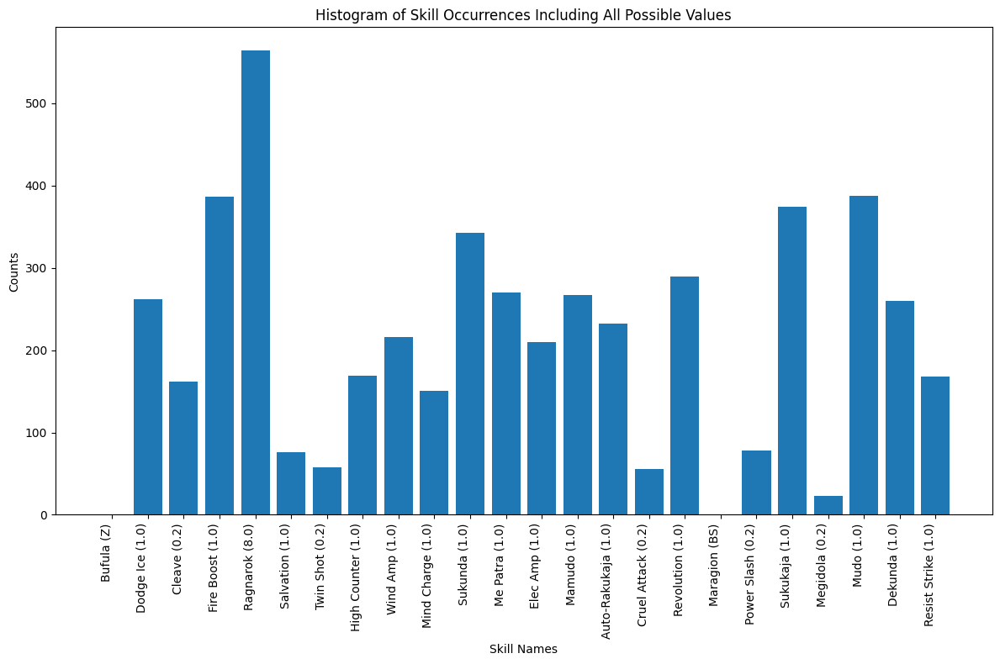

Logger_logs-FIRE-optimal_recipes.txt_8_bishamonten
{'Tempest Slash': 37, 'Growth 3': 254, 'Auto-Tarukaja': 339, 'Null Elec': 237, 'Dodge Strike': 370, 'Null Panic': 235, 'Mediarama': 223, 'Panta Rhei': 0, 'Poison Mist': 309, 'Mahamaon': 230, 'Twin Shot': 78, 'Amrita': 164, 'Raging Tiger': 713, 'Sonic Punch': 116, 'Garula': 0, 'Garudyne': 0, 'Ghastly Wail': 132, 'Magarudyne': 0, 'Counter': 360, '1hSwd Master': 195, 'Megidola': 35, 'Poison Arrow': 38, 'Sukukaja': 470, 'Ice Boost': 465}
{'Tempest Slash': 0.0074, 'Growth 3': 0.0508, 'Auto-Tarukaja': 0.0678, 'Null Elec': 0.0474, 'Dodge Strike': 0.074, 'Null Panic': 0.047, 'Mediarama': 0.0446, 'Panta Rhei': 0.0, 'Poison Mist': 0.0618, 'Mahamaon': 0.046, 'Twin Shot': 0.0156, 'Amrita': 0.0328, 'Raging Tiger': 0.1426, 'Sonic Punch': 0.0232, 'Garula': 0.0, 'Garudyne': 0.0, 'Ghastly Wail': 0.0264, 'Magarudyne': 0.0, 'Counter': 0.072, '1hSwd Master': 0.039, 'Megidola': 0.007, 'Poison Arrow': 0.0076, 'Sukukaja': 0.094, 'Ice Boost': 0.093}
Persona L

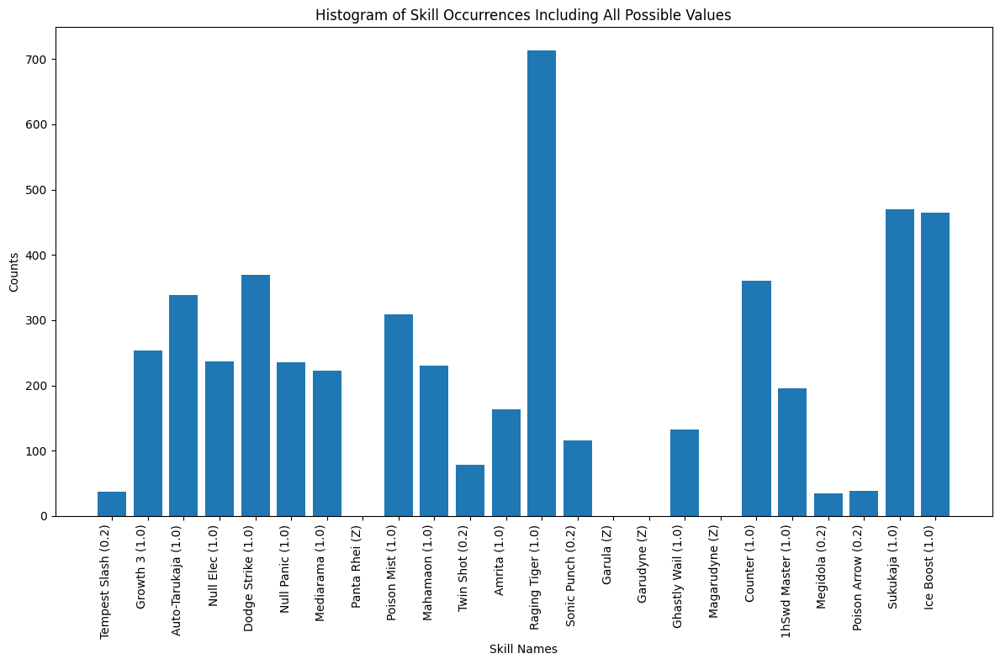

Logger_logs-FIRE-optimal_recipes.txt_9_bishamonten
{'Virus Breath': 165, 'Tentarafoo': 212, 'Kill Rush': 54, 'Sexy Dance': 297, 'Hamaon': 223, 'Ailment Boost': 129, 'Mabufudyne': 0, 'Mahamaon': 196, 'Rakunda': 405, 'Hama Boost': 226, 'Zio': 0, 'Provoke': 411, 'Foul Breath': 81, 'Rebellion': 391, 'Maragi': 963, 'Dekaja': 189, 'Counterstrike': 218, 'Null Light': 168, 'Recarmdra': 103, 'Mudoon': 236, 'Mediarahan': 124, 'Resist Dark': 204}
{'Virus Breath': 0.03303303303303303, 'Tentarafoo': 0.04244244244244244, 'Kill Rush': 0.010810810810810811, 'Sexy Dance': 0.05945945945945946, 'Hamaon': 0.04464464464464465, 'Ailment Boost': 0.025825825825825825, 'Mabufudyne': 0.0, 'Mahamaon': 0.03923923923923924, 'Rakunda': 0.08108108108108109, 'Hama Boost': 0.045245245245245244, 'Zio': 0.0, 'Provoke': 0.08228228228228228, 'Foul Breath': 0.016216216216216217, 'Rebellion': 0.07827827827827828, 'Maragi': 0.1927927927927928, 'Dekaja': 0.03783783783783784, 'Counterstrike': 0.04364364364364364, 'Null Light':

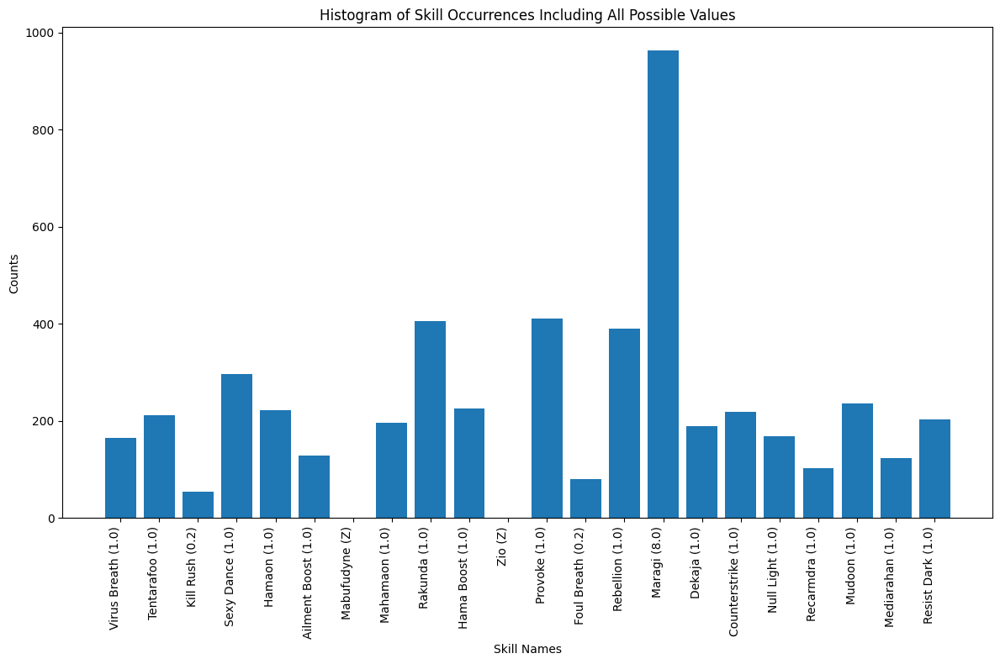

Logger_logs-ICE-optimal_recipes.txt_1_gabriel
{'Salvation': 201, 'Null Fire': 345, 'Apt Pupil': 345, 'Absorb Slash': 215, 'Recarmdra': 249, 'Null Distress': 319, 'Mind Charge': 319, 'Herculean Strike': 74, 'Stagnant Air': 111, 'Bash': 325, 'Maragidyne': 0, 'Victory Cry': 191, 'Primal Force': 38, 'Morning Star': 42, 'Megidola': 62, 'Spell Master': 191, 'Enradi': 640, 'Bufudyne': 0, 'High Counter': 333}
{'Salvation': 0.05025, 'Null Fire': 0.08625, 'Apt Pupil': 0.08625, 'Absorb Slash': 0.05375, 'Recarmdra': 0.06225, 'Null Distress': 0.07975, 'Mind Charge': 0.07975, 'Herculean Strike': 0.0185, 'Stagnant Air': 0.02775, 'Bash': 0.08125, 'Maragidyne': 0.0, 'Victory Cry': 0.04775, 'Primal Force': 0.0095, 'Morning Star': 0.0105, 'Megidola': 0.0155, 'Spell Master': 0.04775, 'Enradi': 0.16, 'Bufudyne': 0.0, 'High Counter': 0.08325}
Persona List:  [('helel', 'Star'), ('loki', 'Fool'), ('ubelluris', 'Hanged Man')]


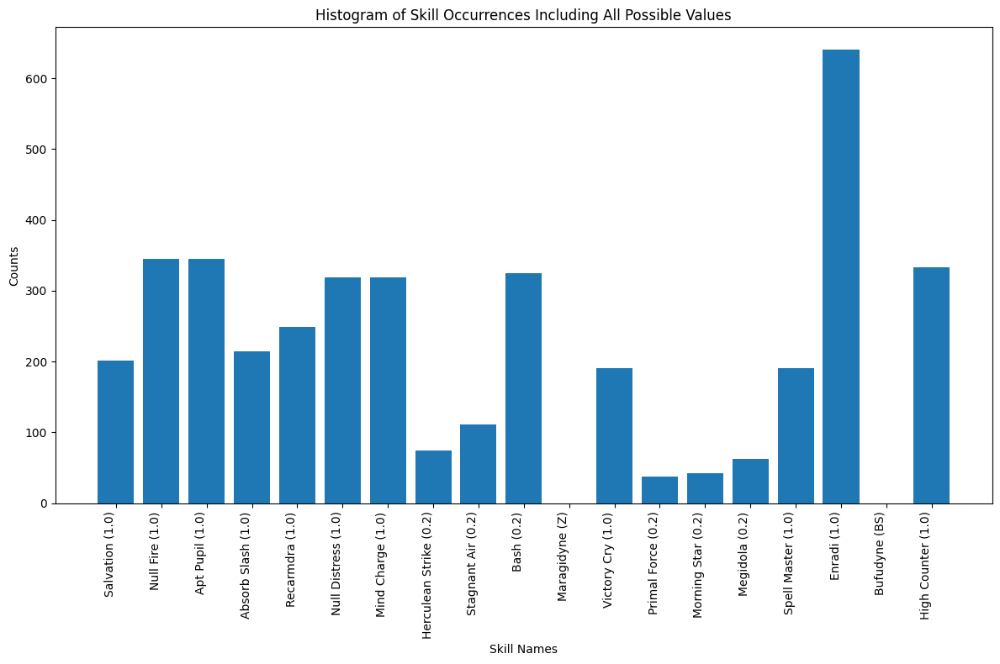

Logger_logs-ICE-optimal_recipes.txt_2_laksmi
{'Marakunda': 553, 'Poison Arrow': 0, 'Garudyne': 133, 'Blade of Fury': 0, 'Sexy Dance': 47, 'Virus Breath': 34, 'Apt Pupil': 137, 'Arrow Rain': 0, 'Deathbound': 0, 'Power Charge': 544, 'Fatal End': 0, 'Tarukaja': 789, 'Diarama': 880, 'Matarunda': 571, 'Evade Wind': 169, 'Null Distress': 143}
{'Marakunda': 0.13825, 'Poison Arrow': 0.0, 'Garudyne': 0.03325, 'Blade of Fury': 0.0, 'Sexy Dance': 0.01175, 'Virus Breath': 0.0085, 'Apt Pupil': 0.03425, 'Arrow Rain': 0.0, 'Deathbound': 0.0, 'Power Charge': 0.136, 'Fatal End': 0.0, 'Tarukaja': 0.19725, 'Diarama': 0.22, 'Matarunda': 0.14275, 'Evade Wind': 0.04225, 'Null Distress': 0.03575}
Persona List:  [('kali', 'Strength'), ('pazuzu', 'Devil'), ('narasimha', 'Strength')]


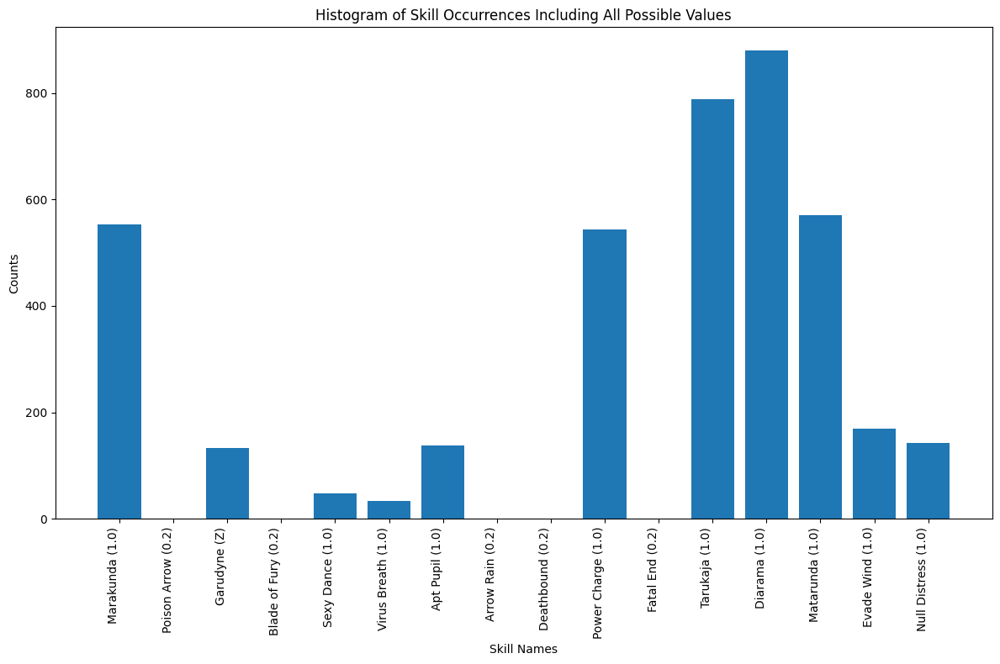

Logger_logs-ICE-optimal_recipes.txt_3_parvati
{'Mabufula': 573, 'Patra': 351, 'Bufu': 952, 'Sonic Punch': 48, 'Recarmdra': 57, 'Dekaja': 89, 'Null Dark': 93, 'Ice Boost': 176, 'Mediarahan': 63, 'Resist Dark': 106, 'Re Patra': 190, 'Ice Break': 92, 'Hama Boost': 97, 'Mahamaon': 83, 'Dia': 186, 'Counterstrike': 94, 'Hamaon': 99, 'Diarama': 0, 'Bufudyne': 512, 'Resist Fire': 74, 'Amrita': 69}
{'Mabufula': 0.14310689310689312, 'Patra': 0.08766233766233766, 'Bufu': 0.23776223776223776, 'Sonic Punch': 0.011988011988011988, 'Recarmdra': 0.014235764235764236, 'Dekaja': 0.022227772227772228, 'Null Dark': 0.023226773226773228, 'Ice Boost': 0.04395604395604396, 'Mediarahan': 0.015734265734265736, 'Resist Dark': 0.026473526473526472, 'Re Patra': 0.047452547452547456, 'Ice Break': 0.022977022977022976, 'Hama Boost': 0.024225774225774224, 'Mahamaon': 0.020729270729270728, 'Dia': 0.046453546453546456, 'Counterstrike': 0.023476523476523476, 'Hamaon': 0.024725274725274724, 'Diarama': 0.0, 'Bufudyne': 0

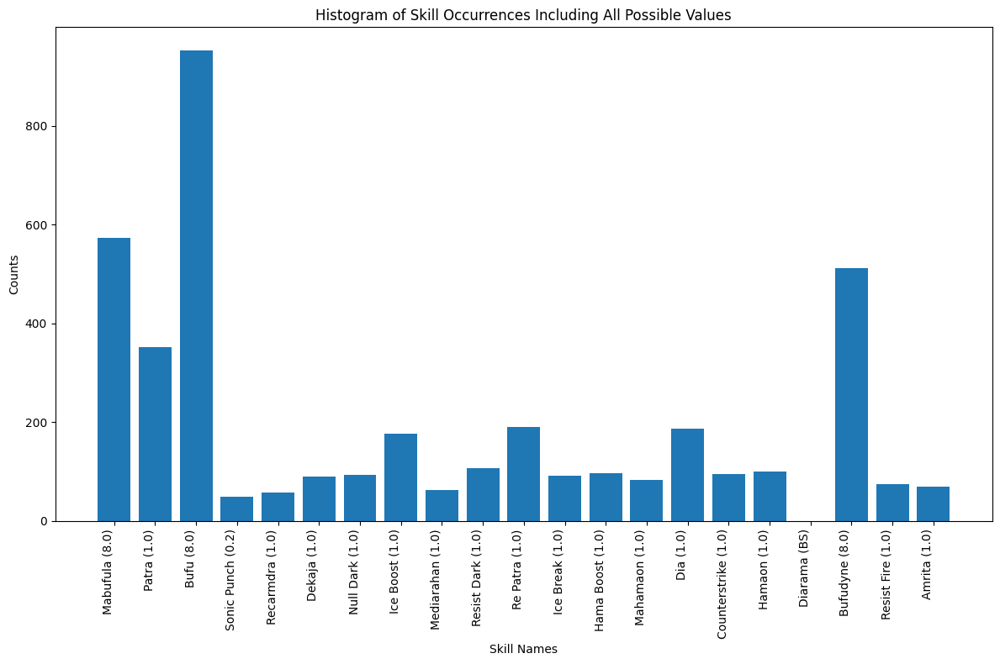

Logger_logs-ICE-optimal_recipes.txt_4_parvati
{'Makarakarn': 205, 'Zio': 0, 'Mamudoon': 285, 'Tentarafoo': 321, 'Maragi': 0, 'Brave Blade': 26, 'Megidolaon': 36, 'Rebellion': 551, 'Spell Master': 135, 'Kill Rush': 88, 'Poisma': 822, 'Magarudyne': 0, 'Foul Breath': 142, 'Victory Cry': 132, 'Single Shot': 236, 'Dekaja': 238, 'High Counter': 269, 'Provoke': 514}
{'Makarakarn': 0.05125, 'Zio': 0.0, 'Mamudoon': 0.07125, 'Tentarafoo': 0.08025, 'Maragi': 0.0, 'Brave Blade': 0.0065, 'Megidolaon': 0.009, 'Rebellion': 0.13775, 'Spell Master': 0.03375, 'Kill Rush': 0.022, 'Poisma': 0.2055, 'Magarudyne': 0.0, 'Foul Breath': 0.0355, 'Victory Cry': 0.033, 'Single Shot': 0.059, 'Dekaja': 0.0595, 'High Counter': 0.06725, 'Provoke': 0.1285}
Persona List:  [('lucifer', 'Judgment'), ('vetala', 'Devil'), ('inugami', 'Hanged Man')]


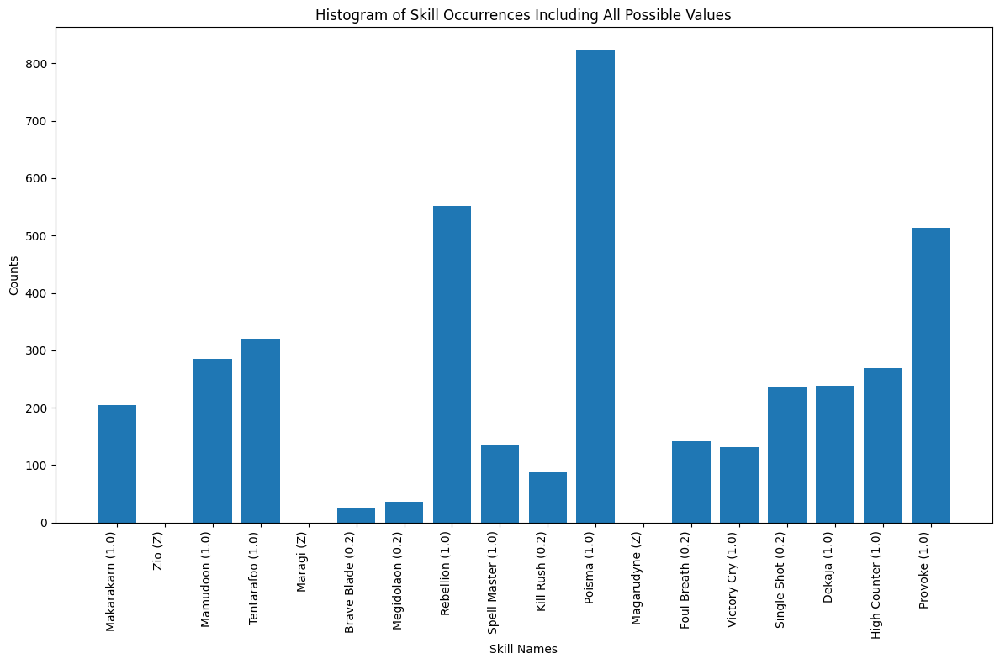

Logger_logs-ICE-optimal_recipes.txt_5_laksmi
{'Sharp Student': 256, 'Mudoon': 0, 'Myriad Arrows': 0, 'Hama Boost': 170, 'Sexy Dance': 64, 'Virus Breath': 37, 'Ailment Boost': 102, 'Null Light': 135, 'Mabufudyne': 128, 'Garula': 243, 'Panta Rhei': 80, 'Wind Amp': 213, 'Trafuri': 93, 'Rakunda': 796, 'Wind Boost': 323, 'Rakukaja': 807, 'Wind Break': 557}
{'Sharp Student': 0.06393606393606394, 'Mudoon': 0.0, 'Myriad Arrows': 0.0, 'Hama Boost': 0.042457542457542456, 'Sexy Dance': 0.015984015984015984, 'Virus Breath': 0.00924075924075924, 'Ailment Boost': 0.025474525474525476, 'Null Light': 0.03371628371628372, 'Mabufudyne': 0.03196803196803197, 'Garula': 0.06068931068931069, 'Panta Rhei': 0.01998001998001998, 'Wind Amp': 0.0531968031968032, 'Trafuri': 0.023226773226773228, 'Rakunda': 0.19880119880119881, 'Wind Boost': 0.08066933066933067, 'Rakukaja': 0.20154845154845155, 'Wind Break': 0.13911088911088912}
Persona List:  [('scathach', 'Priestess'), ('succubus', 'Devil'), ('orobas', 'Magician

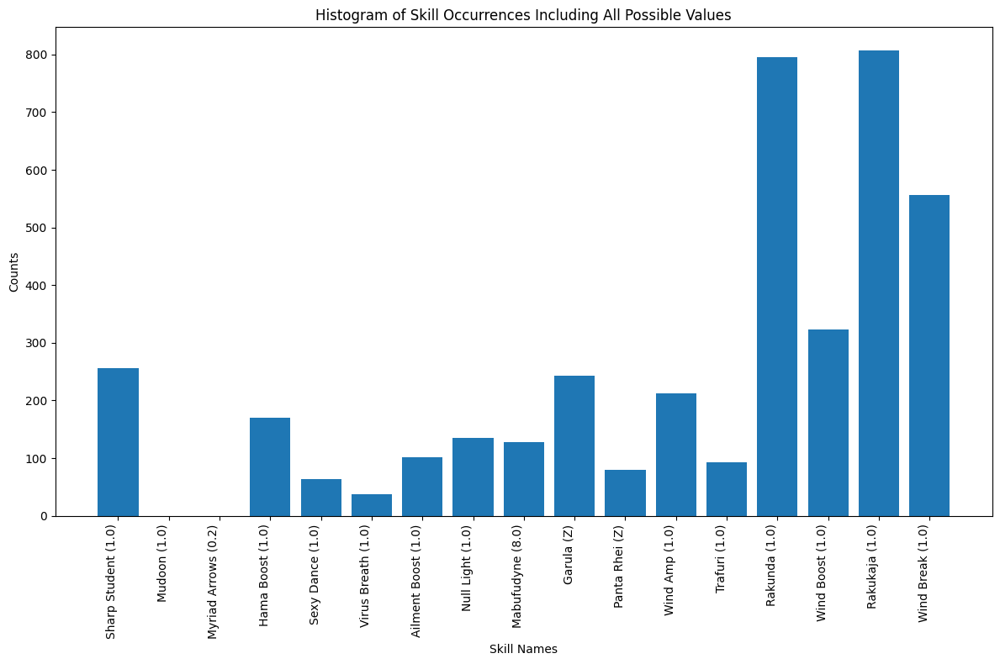

Logger_logs-ICE-optimal_recipes.txt_6_parvati
{'Zio': 0, 'Hama': 511, 'Vicious Strike': 50, 'Cruel Attack': 54, 'Media': 363, 'Power Slash': 117, 'Revolution': 386, 'Tempest Slash': 38, 'Rakukaja': 530, 'Mahama': 358, 'Maragion': 0, 'Sukukaja': 518, 'Dodge Ice': 384, 'Me Patra': 349, 'Vorpal Blade': 0, 'Auto-Masuku': 208, 'Zan-ei': 79, 'Power Charge': 298, 'Auto-Mataru': 188, 'Magaru': 0, 'Twin Shot': 69, 'Cleave': 248, 'High Counter': 252}
{'Zio': 0.0, 'Hama': 0.1022, 'Vicious Strike': 0.01, 'Cruel Attack': 0.0108, 'Media': 0.0726, 'Power Slash': 0.0234, 'Revolution': 0.0772, 'Tempest Slash': 0.0076, 'Rakukaja': 0.106, 'Mahama': 0.0716, 'Maragion': 0.0, 'Sukukaja': 0.1036, 'Dodge Ice': 0.0768, 'Me Patra': 0.0698, 'Vorpal Blade': 0.0, 'Auto-Masuku': 0.0416, 'Zan-ei': 0.0158, 'Power Charge': 0.0596, 'Auto-Mataru': 0.0376, 'Magaru': 0.0, 'Twin Shot': 0.0138, 'Cleave': 0.0496, 'High Counter': 0.0504}
Persona List:  [('siegfried', 'Strength'), ('eligor', 'Tower'), ('power', 'Justice')]


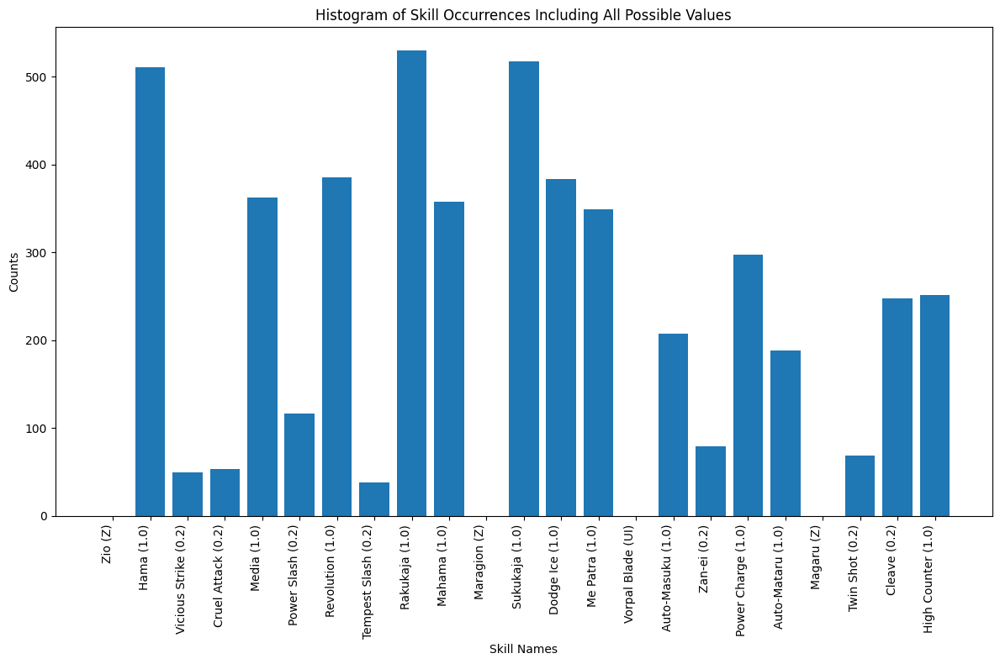

Logger_logs-ICE-optimal_recipes.txt_7_gabriel
{'Zio': 0, 'Diarahan': 170, 'Samsara': 79, 'Marin Karin': 367, 'Die for Me!': 82, 'Patra': 612, 'Spirit Drain': 43, 'Unshaken Will': 94, 'Null Dark': 140, 'Marakunda': 183, 'Wind Amp': 200, 'Mind Charge': 167, 'Sukukaja': 374, 'Growth 3': 177, 'Recarm': 197, 'Evil Touch': 228, 'Wind Boost': 350, 'Ice Amp': 193, 'Repel Dark': 124, 'Megido': 23, 'Tarukaja': 383, 'Absorb Fire': 99, 'Niflheim': 553, 'High Counter': 162}
{'Zio': 0.0, 'Diarahan': 0.034, 'Samsara': 0.0158, 'Marin Karin': 0.0734, 'Die for Me!': 0.0164, 'Patra': 0.1224, 'Spirit Drain': 0.0086, 'Unshaken Will': 0.0188, 'Null Dark': 0.028, 'Marakunda': 0.0366, 'Wind Amp': 0.04, 'Mind Charge': 0.0334, 'Sukukaja': 0.0748, 'Growth 3': 0.0354, 'Recarm': 0.0394, 'Evil Touch': 0.0456, 'Wind Boost': 0.07, 'Ice Amp': 0.0386, 'Repel Dark': 0.0248, 'Megido': 0.0046, 'Tarukaja': 0.0766, 'Absorb Fire': 0.0198, 'Niflheim': 0.1106, 'High Counter': 0.0324}
Persona List:  [('skadi', 'Empress'), ('ali

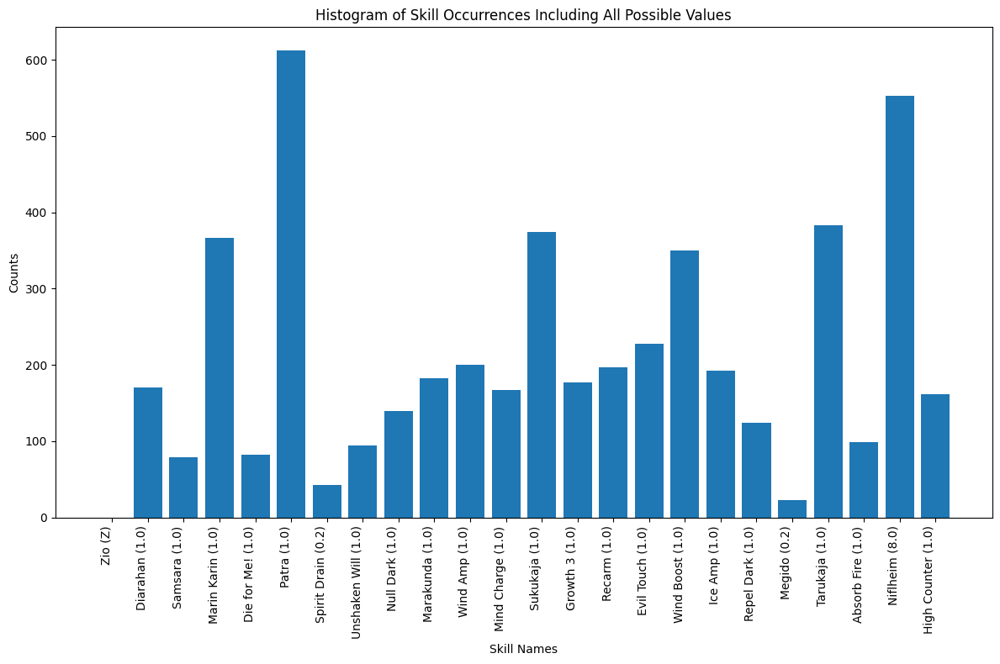

Logger_logs-ICE-optimal_recipes.txt_8_laksmi
{'Mediarama': 513, 'Null Fear': 92, 'Diarahan': 529, 'Raging Tiger': 349, 'Panta Rhei': 48, 'Magarudyne': 66, 'Evil Smile': 15, 'Garudyne': 89, 'Double Fangs': 0, 'Wind Amp': 108, 'Mabufu': 203, 'Magarula': 95, 'Counter': 143, 'Me Patra': 715, 'Ghastly Wail': 3, 'Posumudi': 853, 'Mudoon': 0, 'Bufula': 119, 'Mabufudyne': 60}
{'Mediarama': 0.12825, 'Null Fear': 0.023, 'Diarahan': 0.13225, 'Raging Tiger': 0.08725, 'Panta Rhei': 0.012, 'Magarudyne': 0.0165, 'Evil Smile': 0.00375, 'Garudyne': 0.02225, 'Double Fangs': 0.0, 'Wind Amp': 0.027, 'Mabufu': 0.05075, 'Magarula': 0.02375, 'Counter': 0.03575, 'Me Patra': 0.17875, 'Ghastly Wail': 0.00075, 'Posumudi': 0.21325, 'Mudoon': 0.0, 'Bufula': 0.02975, 'Mabufudyne': 0.015}
Persona List:  [('suparna', 'Sun'), ('mot', 'Death'), ('sarasvati', 'Priestess')]


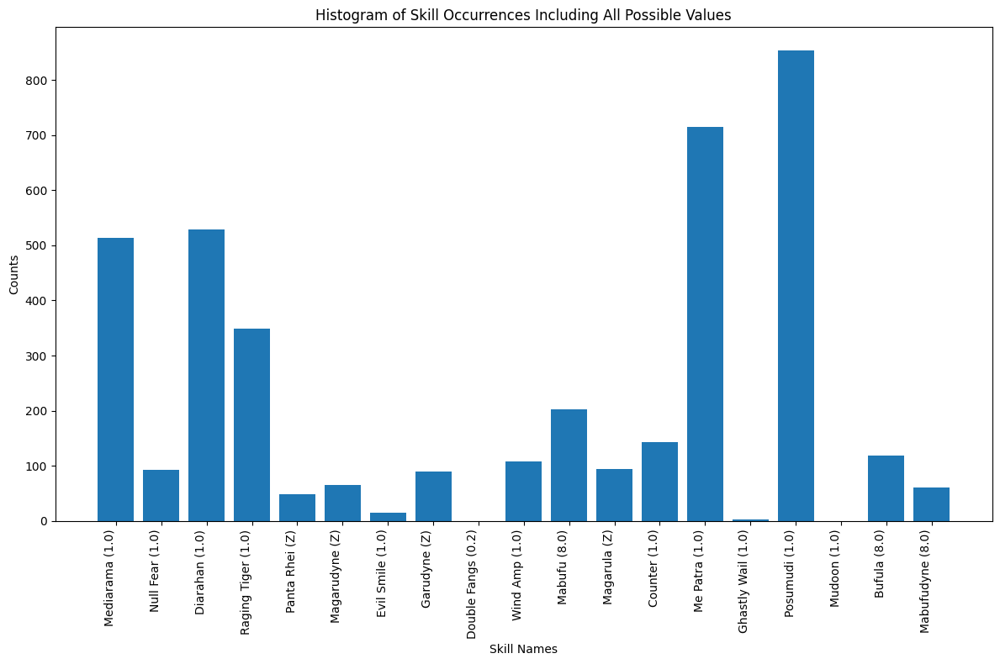

Logger_logs-ICE-optimal_recipes.txt_9_yurlungur
{'Dekunda': 269, 'Salvation': 86, 'Megido': 26, 'Gigantic Fist': 30, 'Mamudo': 252, "God's Hand": 10, 'Bufula': 901, 'Mind Charge': 191, 'Auto-Rakukaja': 251, 'Evade Strike': 160, 'Mudo': 360, 'Akasha Arts': 17, 'Resist Strike': 170, 'Tarukaja': 360, 'Counter': 245, 'Me Patra': 280, 'Ziodyne': 0, 'Sukunda': 392}
{'Dekunda': 0.06725, 'Salvation': 0.0215, 'Megido': 0.0065, 'Gigantic Fist': 0.0075, 'Mamudo': 0.063, "God's Hand": 0.0025, 'Bufula': 0.22525, 'Mind Charge': 0.04775, 'Auto-Rakukaja': 0.06275, 'Evade Strike': 0.04, 'Mudo': 0.09, 'Akasha Arts': 0.00425, 'Resist Strike': 0.0425, 'Tarukaja': 0.09, 'Counter': 0.06125, 'Me Patra': 0.07, 'Ziodyne': 0.0, 'Sukunda': 0.098}
Persona List:  [('vishnu', 'Sun'), ('hecatoncheires', 'Hanged Man'), ('genbu', 'Temperance')]


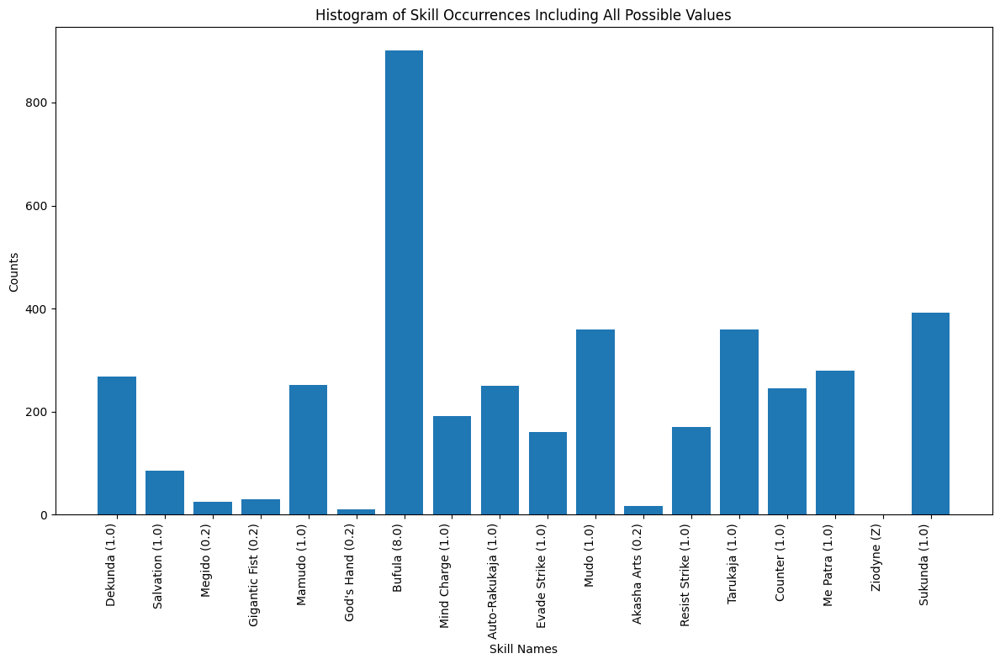

Logger_logs-ELECTRICITY-optimal_recipes.txt_1_michael
{'Myriad Arrows': 50, 'Bash': 328, 'Primal Force': 40, 'Megidola': 44, 'Maragidyne': 0, 'Absorb Strike': 207, 'Bufudyne': 0, 'Ghastly Wail': 223, 'Null Fire': 323, 'Stagnant Air': 108, 'Vorpal Blade': 0, 'Panta Rhei': 0, 'Apt Pupil': 333, 'Wind Amp': 420, 'Magarula': 0, 'Enradi': 644, 'Poison Arrow': 61, 'Mudoon': 391, 'Evil Smile': 395, 'Double Fangs': 183, 'Invigorate 3': 265, 'Wind Boost': 612, 'Null Fear': 373}
{'Myriad Arrows': 0.01, 'Bash': 0.0656, 'Primal Force': 0.008, 'Megidola': 0.0088, 'Maragidyne': 0.0, 'Absorb Strike': 0.0414, 'Bufudyne': 0.0, 'Ghastly Wail': 0.0446, 'Null Fire': 0.0646, 'Stagnant Air': 0.0216, 'Vorpal Blade': 0.0, 'Panta Rhei': 0.0, 'Apt Pupil': 0.0666, 'Wind Amp': 0.084, 'Magarula': 0.0, 'Enradi': 0.1288, 'Poison Arrow': 0.0122, 'Mudoon': 0.0782, 'Evil Smile': 0.079, 'Double Fangs': 0.0366, 'Invigorate 3': 0.053, 'Wind Boost': 0.1224, 'Null Fear': 0.0746}
Persona List:  [('chi you', 'Tower'), ('loki',

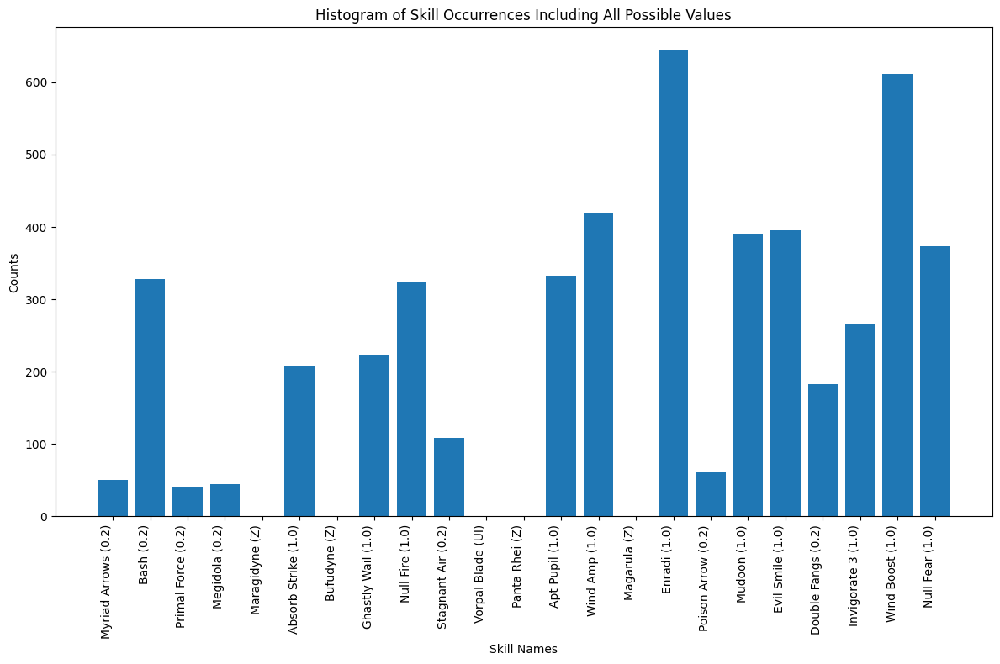

Logger_logs-ELECTRICITY-optimal_recipes.txt_2_dionysus
{'Tarukaja': 351, 'Recarm': 198, 'Auto-Tarukaja': 272, 'Samsara': 92, 'Twin Shot': 61, 'Growth 3': 200, 'Power Charge': 216, 'Sexy Dance': 276, 'Null Dark': 170, 'Diarahan': 150, 'Matarunda': 193, 'Virus Breath': 156, 'Ice Boost': 348, 'Garudyne': 0, 'Poison Arrow': 32, 'Sonic Punch': 88, 'Raging Tiger': 626, 'Sukukaja': 360, 'Dodge Strike': 281, 'Arrow Rain': 32, 'Poison Mist': 286, 'Patra': 612}
{'Tarukaja': 0.0702, 'Recarm': 0.0396, 'Auto-Tarukaja': 0.0544, 'Samsara': 0.0184, 'Twin Shot': 0.0122, 'Growth 3': 0.04, 'Power Charge': 0.0432, 'Sexy Dance': 0.0552, 'Null Dark': 0.034, 'Diarahan': 0.03, 'Matarunda': 0.0386, 'Virus Breath': 0.0312, 'Ice Boost': 0.0696, 'Garudyne': 0.0, 'Poison Arrow': 0.0064, 'Sonic Punch': 0.0176, 'Raging Tiger': 0.1252, 'Sukukaja': 0.072, 'Dodge Strike': 0.0562, 'Arrow Rain': 0.0064, 'Poison Mist': 0.0572, 'Patra': 0.1224}
Persona List:  [('daisoujou', 'Hierophant'), ('pazuzu', 'Devil'), ('gurr', 'Moo

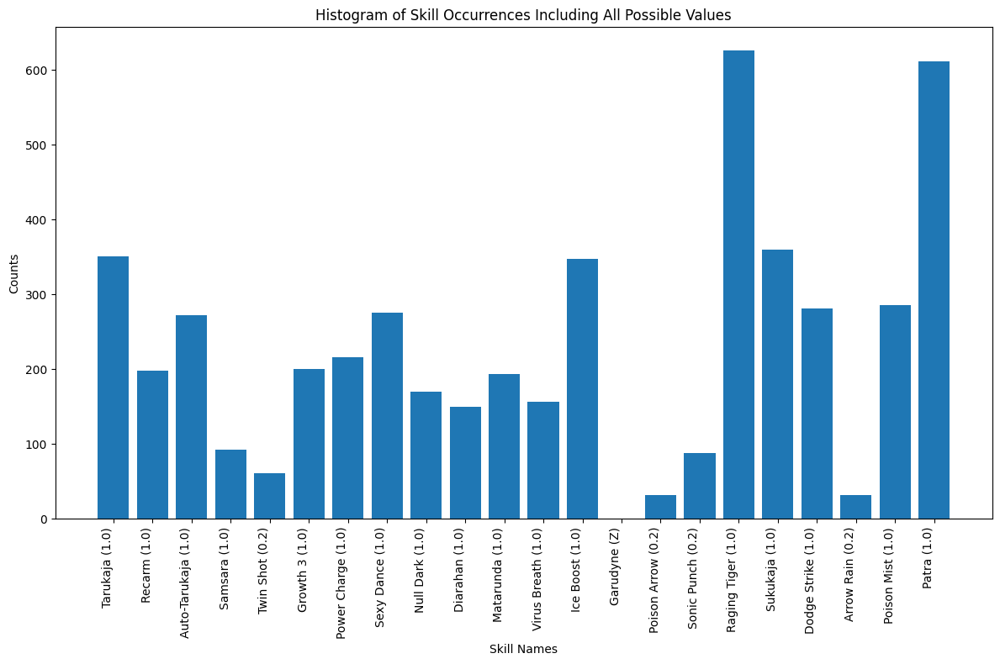

Logger_logs-ELECTRICITY-optimal_recipes.txt_3_dionysus
{'Zio': 999, 'Eerie Sound': 604, 'Single Shot': 311, 'Mind Charge': 0, 'Victory Cry': 170, 'Morning Star': 25, 'Salvation': 173, 'Primal Force': 28, 'Foul Breath': 163, 'Spell Master': 166, 'Absorb Slash': 186, 'High Counter': 327, 'Poisma': 848}
{'Zio': 0.24975, 'Eerie Sound': 0.151, 'Single Shot': 0.07775, 'Mind Charge': 0.0, 'Victory Cry': 0.0425, 'Morning Star': 0.00625, 'Salvation': 0.04325, 'Primal Force': 0.007, 'Foul Breath': 0.04075, 'Spell Master': 0.0415, 'Absorb Slash': 0.0465, 'High Counter': 0.08175, 'Poisma': 0.212}
Persona List:  [('helel', 'Star'), ('mothman', 'Hermit'), ('inugami', 'Hanged Man')]


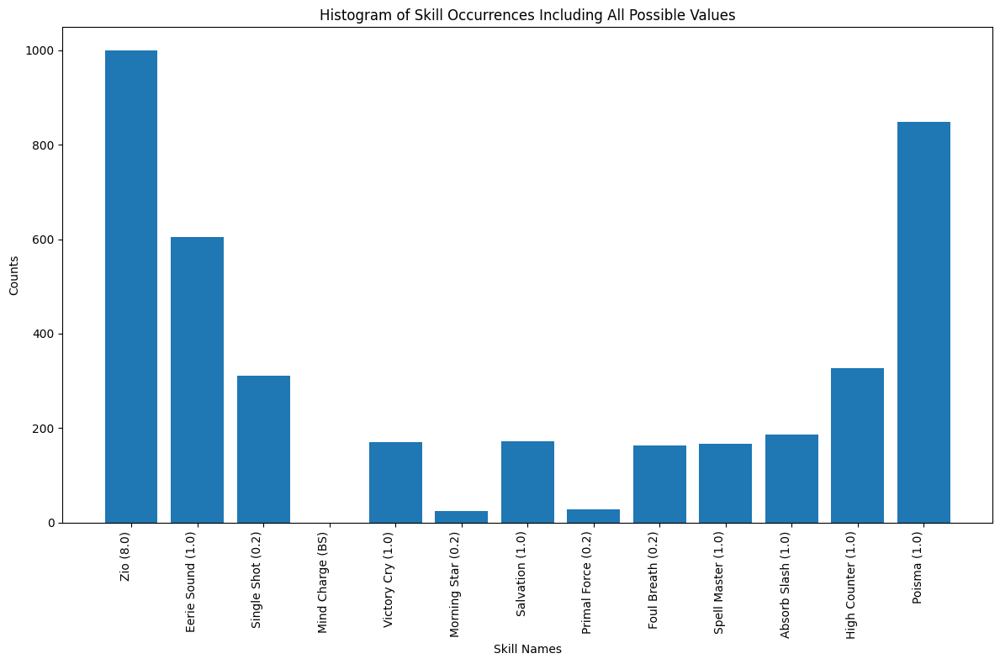

Logger_logs-ELECTRICITY-optimal_recipes.txt_4_thor
{'Blade of Fury': 31, 'Marakunda': 189, 'Getsu-ei': 65, 'Dodge Slash': 275, 'Hamaon': 229, 'Recarmdra': 121, 'Hama Boost': 209, 'Apt Pupil': 148, 'Mighty Swing': 36, 'Mediarahan': 117, 'Counter': 282, 'Deathbound': 20, 'Fire Boost': 405, 'Null Distress': 175, 'Diarama': 251, 'Dekaja': 167, 'Resist Dark': 203, 'Counterstrike': 181, 'Mahamaon': 163, 'Rakukaja': 379, 'Power Slash': 86, 'Dodge Ice': 268}
{'Blade of Fury': 0.00775, 'Marakunda': 0.04725, 'Getsu-ei': 0.01625, 'Dodge Slash': 0.06875, 'Hamaon': 0.05725, 'Recarmdra': 0.03025, 'Hama Boost': 0.05225, 'Apt Pupil': 0.037, 'Mighty Swing': 0.009, 'Mediarahan': 0.02925, 'Counter': 0.0705, 'Deathbound': 0.005, 'Fire Boost': 0.10125, 'Null Distress': 0.04375, 'Diarama': 0.06275, 'Dekaja': 0.04175, 'Resist Dark': 0.05075, 'Counterstrike': 0.04525, 'Mahamaon': 0.04075, 'Rakukaja': 0.09475, 'Power Slash': 0.0215, 'Dodge Ice': 0.067}
Persona List:  [('kali', 'Strength'), ('throne', 'Justice'

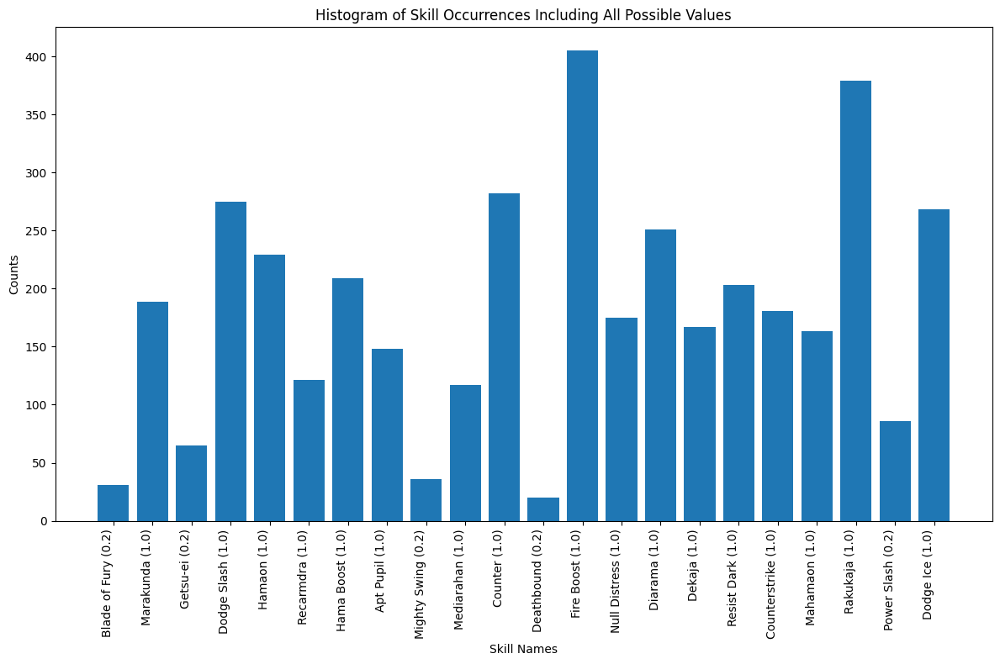

Logger_logs-ELECTRICITY-optimal_recipes.txt_5_byakko
{'Victory Cry': 123, 'Megidolaon': 21, 'Mahama': 321, 'Zan-ei': 83, 'Twin Shot': 94, 'High Counter': 194, 'Hama': 461, 'Brave Blade': 23, 'Media': 349, 'Magarudyne': 0, 'Spell Master': 113, 'Mamudoon': 207, 'Zio': 994, 'Sukukaja': 488, 'Cleave': 197, 'Maragion': 0, 'Cruel Attack': 62, 'Me Patra': 316, 'Makarakarn': 146, 'Revolution': 347, 'Power Slash': 110, 'Dodge Ice': 326, 'Magaru': 0}
{'Victory Cry': 0.024723618090452263, 'Megidolaon': 0.004221105527638191, 'Mahama': 0.06452261306532664, 'Zan-ei': 0.016683417085427137, 'Twin Shot': 0.018894472361809043, 'High Counter': 0.03899497487437186, 'Hama': 0.09266331658291457, 'Brave Blade': 0.004623115577889447, 'Media': 0.07015075376884422, 'Magarudyne': 0.0, 'Spell Master': 0.02271356783919598, 'Mamudoon': 0.041608040201005024, 'Zio': 0.19979899497487438, 'Sukukaja': 0.09809045226130653, 'Cleave': 0.039597989949748745, 'Maragion': 0.0, 'Cruel Attack': 0.012462311557788945, 'Me Patra': 

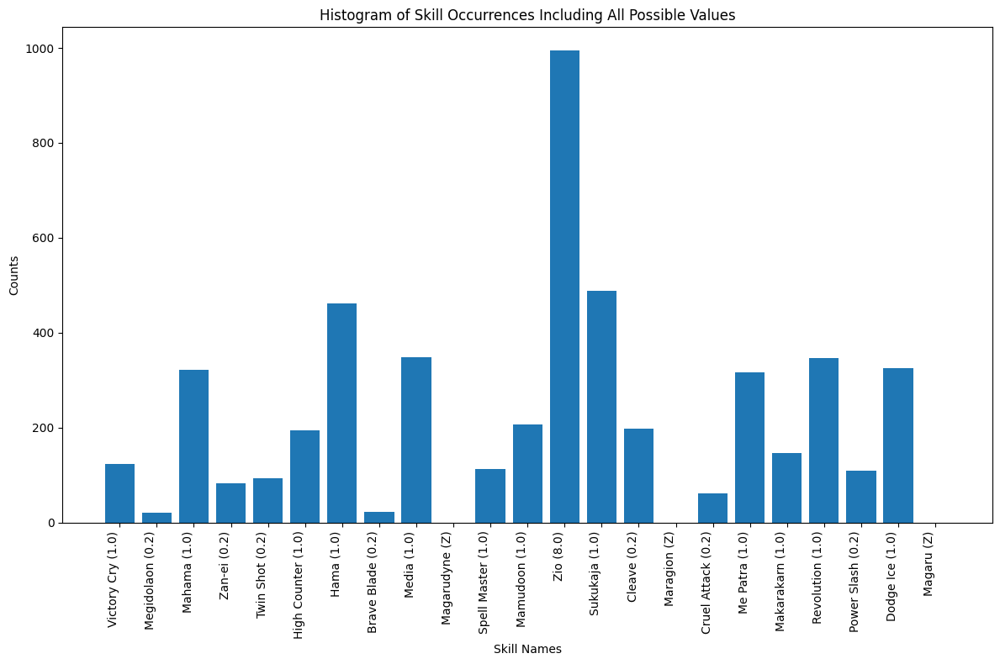

Logger_logs-ELECTRICITY-optimal_recipes.txt_6_thor
{'Counter': 311, 'Thunder Reign': 598, 'Amrita': 170, 'Elec Amp': 220, 'Heat Wave': 34, 'Maziodyne': 740, 'Marakukaja': 180, 'Auto-Maraku': 181, 'Null Poison': 186, 'Holy Arrow': 106, 'Growth 1': 413, 'Null Panic': 166, 'Invigorate 2': 170, 'Vile Assault': 41, 'Spell Master': 110, 'Mabufu': 0, 'Virus Breath': 180, 'Counterstrike': 194}
{'Counter': 0.07775, 'Thunder Reign': 0.1495, 'Amrita': 0.0425, 'Elec Amp': 0.055, 'Heat Wave': 0.0085, 'Maziodyne': 0.185, 'Marakukaja': 0.045, 'Auto-Maraku': 0.04525, 'Null Poison': 0.0465, 'Holy Arrow': 0.0265, 'Growth 1': 0.10325, 'Null Panic': 0.0415, 'Invigorate 2': 0.0425, 'Vile Assault': 0.01025, 'Spell Master': 0.0275, 'Mabufu': 0.0, 'Virus Breath': 0.045, 'Counterstrike': 0.0485}
Persona List:  [('odin', 'Emperor'), ('barong', 'Emperor'), ('high pixie', 'Priestess')]


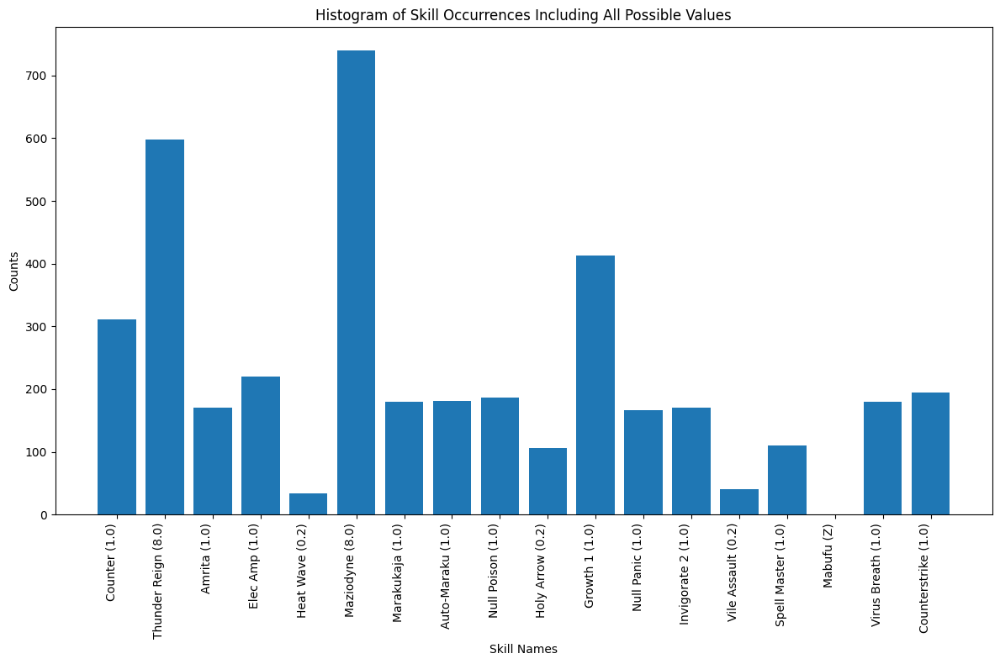

Logger_logs-ELECTRICITY-optimal_recipes.txt_7_thor
{'Tarukaja': 213, 'Mind Charge': 85, 'Getsu-ei': 35, 'Auto-Tarukaja': 155, 'Zan-ei': 28, 'Sukunda': 198, 'Mazio': 839, 'High Counter': 0, 'Dodge Slash': 128, 'Wind Amp': 93, 'Pulinpa': 236, 'Unshaken Will': 55, 'Elec Boost': 206, 'Charmdi': 186, 'Mamudo': 141, 'Zionga': 710, 'Niflheim': 0, 'Kill Rush': 29, 'Wind Boost': 199, 'Elec Break': 111, 'Absorb Fire': 48, 'Mudo': 194, 'Ice Amp': 99}
{'Tarukaja': 0.053410230692076226, 'Mind Charge': 0.02131394182547643, 'Getsu-ei': 0.008776328986960883, 'Auto-Tarukaja': 0.038866599799398195, 'Zan-ei': 0.007021063189568706, 'Sukunda': 0.04964894684052156, 'Mazio': 0.21038114343029088, 'High Counter': 0.0, 'Dodge Slash': 0.0320962888665998, 'Wind Amp': 0.02331995987963892, 'Pulinpa': 0.05917753259779338, 'Unshaken Will': 0.013791374122367101, 'Elec Boost': 0.051654964894684054, 'Charmdi': 0.04663991975927784, 'Mamudo': 0.035356068204613844, 'Zionga': 0.17803410230692077, 'Niflheim': 0.0, 'Kill Rush

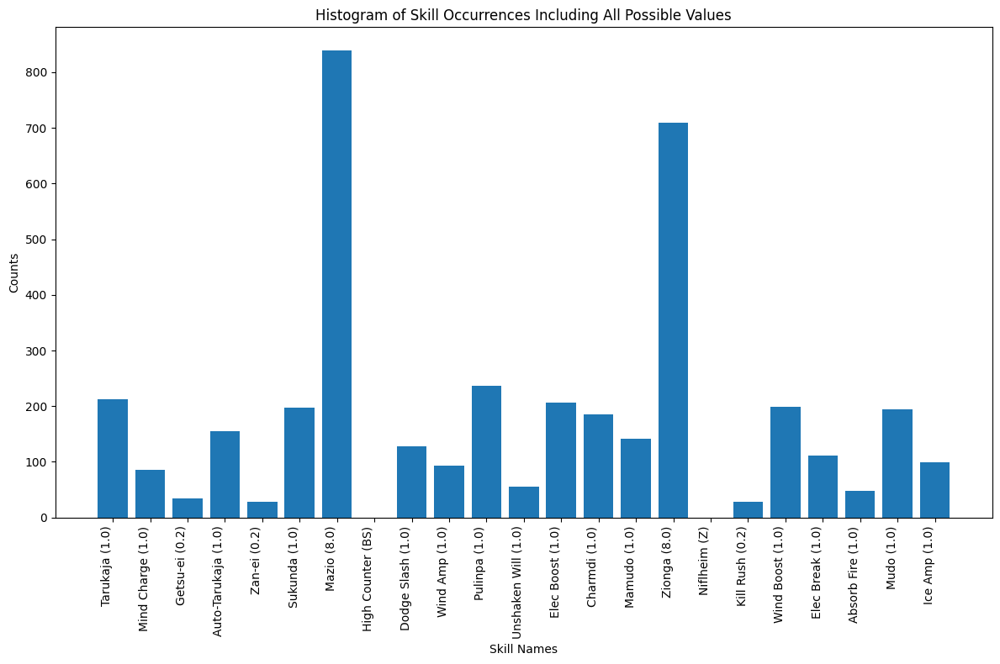

Logger_logs-ELECTRICITY-optimal_recipes.txt_8_thor
{'Herculean Strike': 35, 'Tarukaja': 370, 'Auto-Tarukaja': 246, 'Zan-ei': 69, 'Power Charge': 186, 'Recarmdra': 121, 'Matarukaja': 181, 'Panta Rhei': 0, 'Wind Amp': 185, 'Null Distress': 165, 'Torrent Shot': 51, 'Me Patra': 235, 'Mazionga': 834, 'Sharp Student': 277, 'Trafuri': 115, 'Wind Boost': 363, 'Rakukaja': 363, 'Garula': 0, 'Wind Break': 204}
{'Herculean Strike': 0.00875, 'Tarukaja': 0.0925, 'Auto-Tarukaja': 0.0615, 'Zan-ei': 0.01725, 'Power Charge': 0.0465, 'Recarmdra': 0.03025, 'Matarukaja': 0.04525, 'Panta Rhei': 0.0, 'Wind Amp': 0.04625, 'Null Distress': 0.04125, 'Torrent Shot': 0.01275, 'Me Patra': 0.05875, 'Mazionga': 0.2085, 'Sharp Student': 0.06925, 'Trafuri': 0.02875, 'Wind Boost': 0.09075, 'Rakukaja': 0.09075, 'Garula': 0.0, 'Wind Break': 0.051}
Persona List:  [('ubelluris', 'Hanged Man'), ('cu chulainn', 'Tower'), ('orobas', 'Magician')]


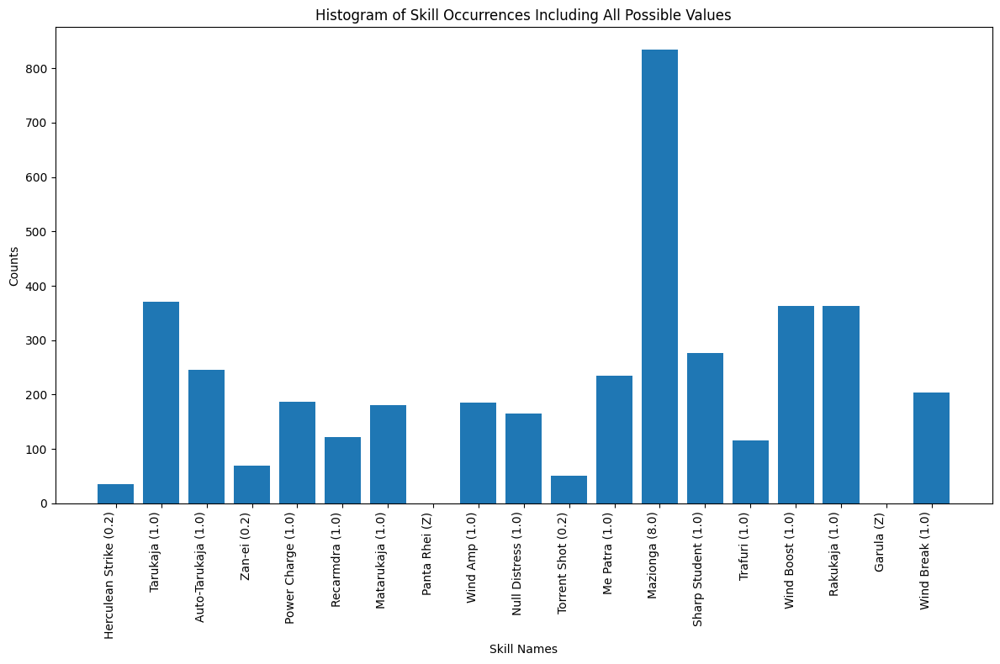

Logger_logs-ELECTRICITY-optimal_recipes.txt_9_michael
{'Tarukaja': 380, 'Marakunda': 215, 'Mind Charge': 157, 'Power Charge': 212, 'High Counter': 168, 'Auto-Masuku': 135, 'Vorpal Blade': 0, 'Salvation': 92, 'Counter': 284, 'Zio': 997, 'Repel Dark': 149, 'Akasha Arts': 25, 'Auto-Mataru': 160, 'Ziodyne': 787, 'Tempest Slash': 26, 'Vicious Strike': 33, 'Evil Touch': 271, 'Marin Karin': 368, 'Die for Me!': 72, 'Spirit Drain': 40, 'Rakukaja': 378, "God's Hand": 18, 'Megido': 33}
{'Tarukaja': 0.076, 'Marakunda': 0.043, 'Mind Charge': 0.0314, 'Power Charge': 0.0424, 'High Counter': 0.0336, 'Auto-Masuku': 0.027, 'Vorpal Blade': 0.0, 'Salvation': 0.0184, 'Counter': 0.0568, 'Zio': 0.1994, 'Repel Dark': 0.0298, 'Akasha Arts': 0.005, 'Auto-Mataru': 0.032, 'Ziodyne': 0.1574, 'Tempest Slash': 0.0052, 'Vicious Strike': 0.0066, 'Evil Touch': 0.0542, 'Marin Karin': 0.0736, 'Die for Me!': 0.0144, 'Spirit Drain': 0.008, 'Rakukaja': 0.0756, "God's Hand": 0.0036, 'Megido': 0.0066}
Persona List:  [('vishnu

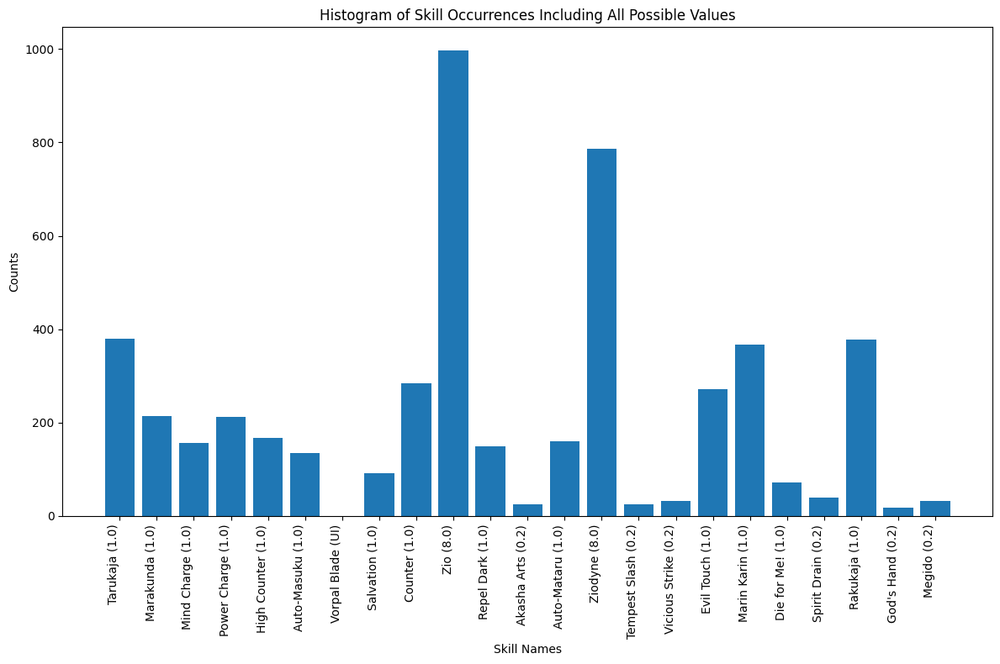

Logger_logs-WIND-optimal_recipes.txt_1_nandi
{'Tentarafoo': 300, 'Spirit Drain': 55, 'Zio': 0, 'Rebellion': 534, 'Megido': 33, 'Marakunda': 311, 'Dekaja': 266, 'Kill Rush': 114, 'Poisma': 771, 'Provoke': 543, 'Single Shot': 243, 'Maragi': 0, 'Repel Dark': 199, 'Evil Touch': 369, 'Foul Breath': 116, 'Die for Me!': 146, 'Marin Karin': 0}
{'Tentarafoo': 0.075, 'Spirit Drain': 0.01375, 'Zio': 0.0, 'Rebellion': 0.1335, 'Megido': 0.00825, 'Marakunda': 0.07775, 'Dekaja': 0.0665, 'Kill Rush': 0.0285, 'Poisma': 0.19275, 'Provoke': 0.13575, 'Single Shot': 0.06075, 'Maragi': 0.0, 'Repel Dark': 0.04975, 'Evil Touch': 0.09225, 'Foul Breath': 0.029, 'Die for Me!': 0.0365, 'Marin Karin': 0.0}
Persona List:  [('alice', 'Death'), ('vetala', 'Devil'), ('inugami', 'Hanged Man')]


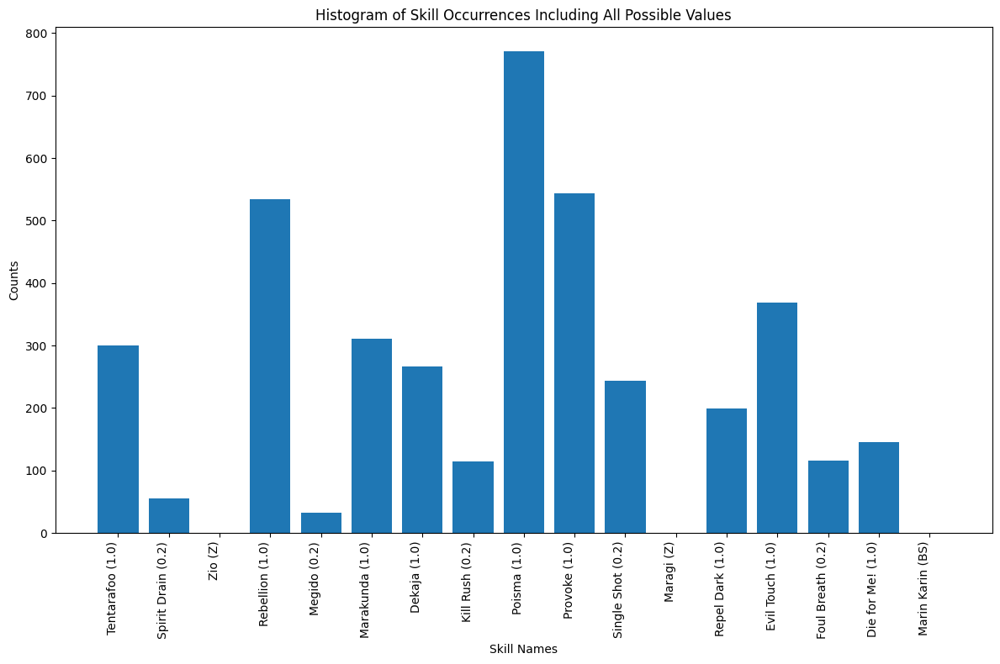

Logger_logs-WIND-optimal_recipes.txt_2_jatayu
{'Mudo': 317, 'Hama Boost': 166, 'Growth 1': 320, 'Virus Breath': 149, 'Kill Rush': 35, 'Auto-Maraku': 116, 'Heat Wave': 28, 'Ailment Boost': 102, 'Zan-ei': 47, 'Mabufudyne': 0, 'Dodge Slash': 235, 'Sukunda': 364, 'Counterstrike': 184, 'Null Poison': 149, 'Sexy Dance': 254, 'Invigorate 2': 143, 'Null Light': 150, 'Mudoon': 183, 'Marakukaja': 157, 'Tarukaja': 320, 'Rakunda': 331, 'Mamudo': 250}
{'Mudo': 0.07925, 'Hama Boost': 0.0415, 'Growth 1': 0.08, 'Virus Breath': 0.03725, 'Kill Rush': 0.00875, 'Auto-Maraku': 0.029, 'Heat Wave': 0.007, 'Ailment Boost': 0.0255, 'Zan-ei': 0.01175, 'Mabufudyne': 0.0, 'Dodge Slash': 0.05875, 'Sukunda': 0.091, 'Counterstrike': 0.046, 'Null Poison': 0.03725, 'Sexy Dance': 0.0635, 'Invigorate 2': 0.03575, 'Null Light': 0.0375, 'Mudoon': 0.04575, 'Marakukaja': 0.03925, 'Tarukaja': 0.08, 'Rakunda': 0.08275, 'Mamudo': 0.0625}
Persona List:  [('barong', 'Emperor'), ('succubus', 'Devil'), ('titan', 'Strength')]


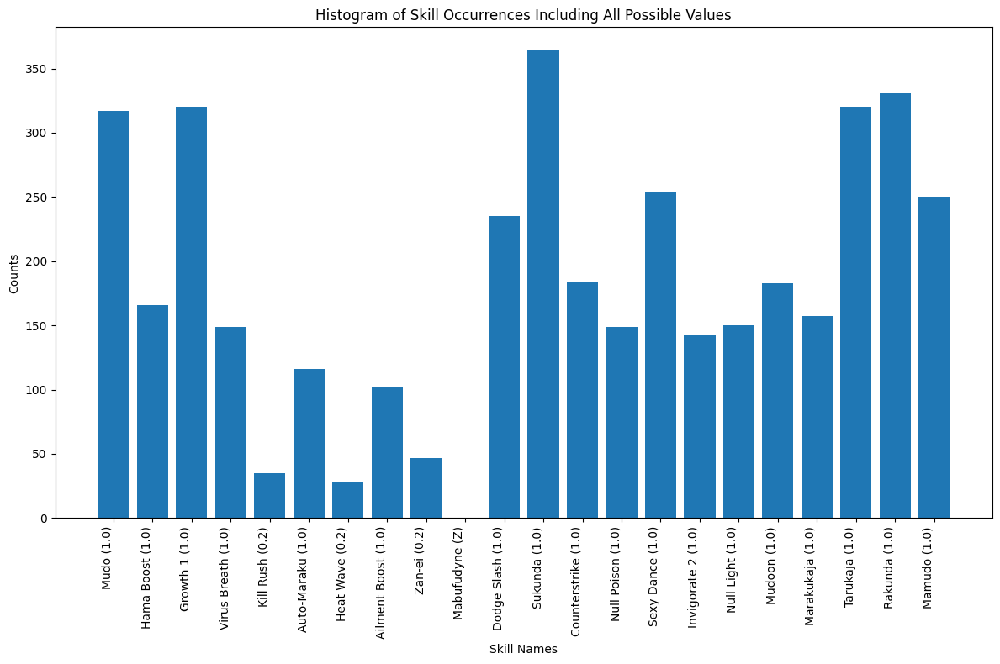

Logger_logs-WIND-optimal_recipes.txt_3_jatayu
{'Diarama': 454, 'Agi': 0, 'Poison Arrow': 62, 'Myriad Arrows': 48, 'Sukukaja': 611, 'Wind Amp': 368, 'Dodge Slash': 459, 'Bash': 293, 'Vorpal Blade': 0, 'Wind Boost': 607, 'Zionga': 0, 'Absorb Strike': 209, 'Rakunda': 614, 'Invigorate 3': 238, 'Primal Force': 37}
{'Diarama': 0.1135, 'Agi': 0.0, 'Poison Arrow': 0.0155, 'Myriad Arrows': 0.012, 'Sukukaja': 0.15275, 'Wind Amp': 0.092, 'Dodge Slash': 0.11475, 'Bash': 0.07325, 'Vorpal Blade': 0.0, 'Wind Boost': 0.15175, 'Zionga': 0.0, 'Absorb Strike': 0.05225, 'Rakunda': 0.1535, 'Invigorate 3': 0.0595, 'Primal Force': 0.00925}
Persona List:  [('chi you', 'Tower'), ('hokuto seikun', 'Hierophant'), ('ara mitama', 'Chariot')]


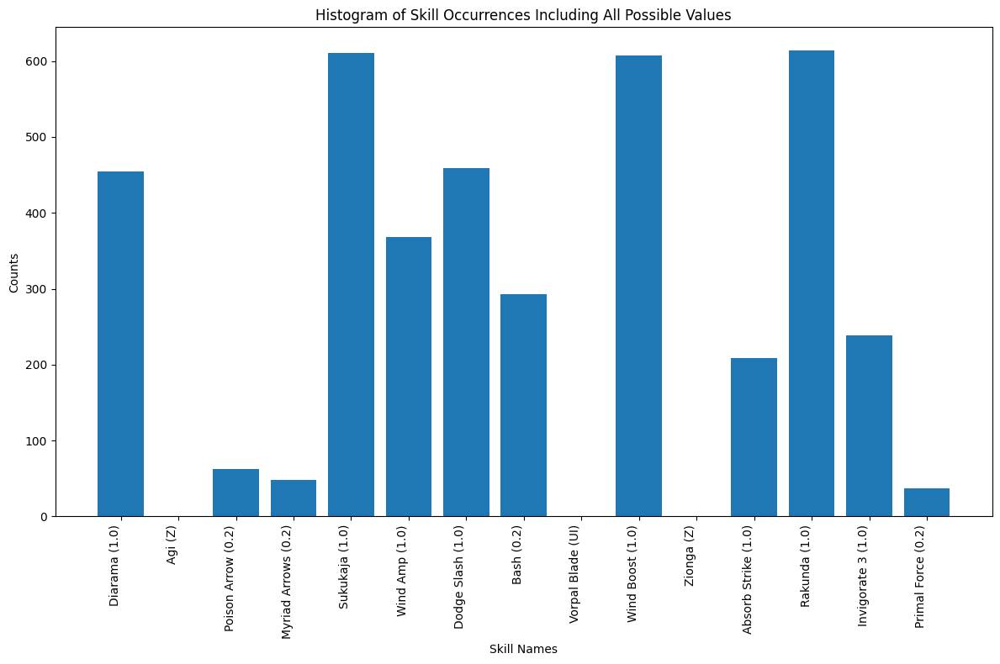

Logger_logs-WIND-optimal_recipes.txt_4_suparna
{'Salvation': 95, 'Mahamaon': 165, 'Hama Boost': 228, 'Spell Master': 102, 'Mind Charge': 178, 'Null Fear': 170, 'Victory Cry': 92, 'Recarmdra': 141, 'Dekaja': 192, 'Resist Dark': 255, 'Ghastly Wail': 115, 'Magarula': 867, 'Hamaon': 231, 'Primal Force': 24, 'Panta Rhei': 638, 'Wind Amp': 241, 'High Counter': 215, 'Evil Smile': 207, 'Mediarahan': 118, 'Morning Star': 28, 'Counterstrike': 227, 'Mudoon': 255, 'Double Fangs': 93, 'Absorb Slash': 123}
{'Salvation': 0.019, 'Mahamaon': 0.033, 'Hama Boost': 0.0456, 'Spell Master': 0.0204, 'Mind Charge': 0.0356, 'Null Fear': 0.034, 'Victory Cry': 0.0184, 'Recarmdra': 0.0282, 'Dekaja': 0.0384, 'Resist Dark': 0.051, 'Ghastly Wail': 0.023, 'Magarula': 0.1734, 'Hamaon': 0.0462, 'Primal Force': 0.0048, 'Panta Rhei': 0.1276, 'Wind Amp': 0.0482, 'High Counter': 0.043, 'Evil Smile': 0.0414, 'Mediarahan': 0.0236, 'Morning Star': 0.0056, 'Counterstrike': 0.0454, 'Mudoon': 0.051, 'Double Fangs': 0.0186, 'Abso

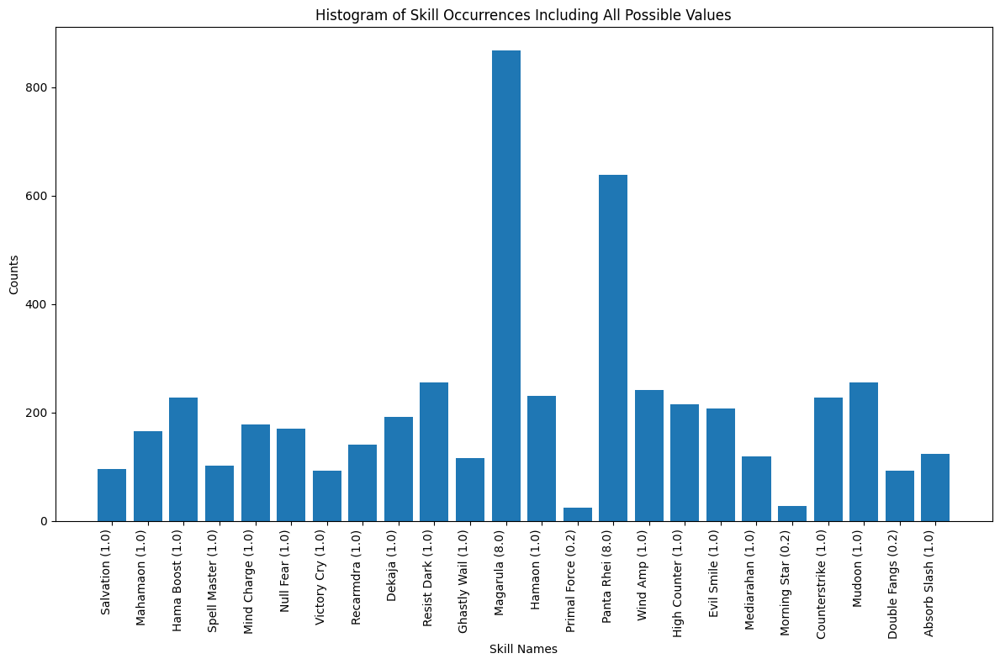

Logger_logs-WIND-optimal_recipes.txt_5_seiryuu
{'Re Patra': 186, 'Posumudi': 182, 'Patra': 313, 'Garudyne': 502, 'Revolution': 126, 'Zio': 0, 'Mahama': 122, 'Amrita': 77, 'Mediarama': 93, 'Media': 133, 'Zan-ei': 16, 'Null Elec': 74, 'Hama': 180, 'Cool Breeze': 92, 'Growth 3': 107, 'Magaru': 834, 'Counter': 154, 'Null Panic': 75, 'Magarudyne': 416, 'Garu': 948, 'Tarukaja': 220, 'Me Patra': 150}
{'Re Patra': 0.0372, 'Posumudi': 0.0364, 'Patra': 0.0626, 'Garudyne': 0.1004, 'Revolution': 0.0252, 'Zio': 0.0, 'Mahama': 0.0244, 'Amrita': 0.0154, 'Mediarama': 0.0186, 'Media': 0.0266, 'Zan-ei': 0.0032, 'Null Elec': 0.0148, 'Hama': 0.036, 'Cool Breeze': 0.0184, 'Growth 3': 0.0214, 'Magaru': 0.1668, 'Counter': 0.0308, 'Null Panic': 0.015, 'Magarudyne': 0.0832, 'Garu': 0.1896, 'Tarukaja': 0.044, 'Me Patra': 0.03}
Persona List:  [('jatayu', 'Sun'), ('power', 'Justice'), ('nigi mitama', 'Temperance')]


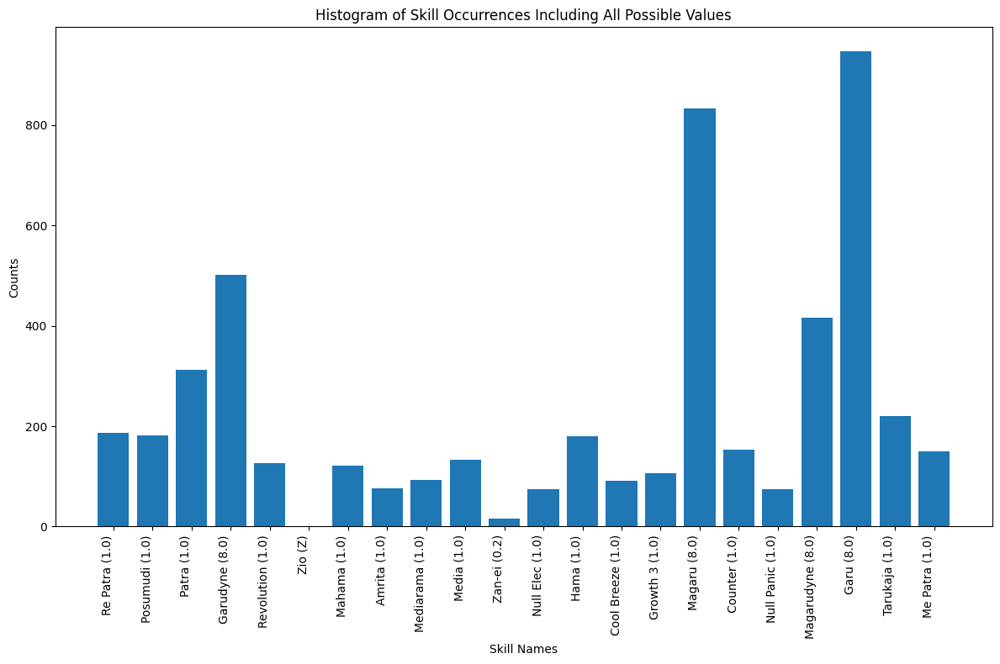

Logger_logs-WIND-optimal_recipes.txt_6_quetzalcoatl
{'Cleave': 162, 'Sukukaja': 346, 'Dodge Strike': 280, 'Apt Pupil': 164, 'Null Distress': 163, 'Dodge Ice': 260, 'Deathbound': 28, 'Diarama': 271, 'Revolution': 271, 'Poison Mist': 276, 'Twin Shot': 71, 'Auto-Tarukaja': 265, 'Marakunda': 216, 'Blade of Fury': 33, 'Cruel Attack': 32, 'Maragion': 0, 'Ice Boost': 390, 'Sonic Punch': 65, 'Power Slash': 91, 'Raging Tiger': 616}
{'Cleave': 0.0405, 'Sukukaja': 0.0865, 'Dodge Strike': 0.07, 'Apt Pupil': 0.041, 'Null Distress': 0.04075, 'Dodge Ice': 0.065, 'Deathbound': 0.007, 'Diarama': 0.06775, 'Revolution': 0.06775, 'Poison Mist': 0.069, 'Twin Shot': 0.01775, 'Auto-Tarukaja': 0.06625, 'Marakunda': 0.054, 'Blade of Fury': 0.00825, 'Cruel Attack': 0.008, 'Maragion': 0.0, 'Ice Boost': 0.0975, 'Sonic Punch': 0.01625, 'Power Slash': 0.02275, 'Raging Tiger': 0.154}
Persona List:  [('kali', 'Strength'), ('eligor', 'Tower'), ('gurr', 'Moon')]


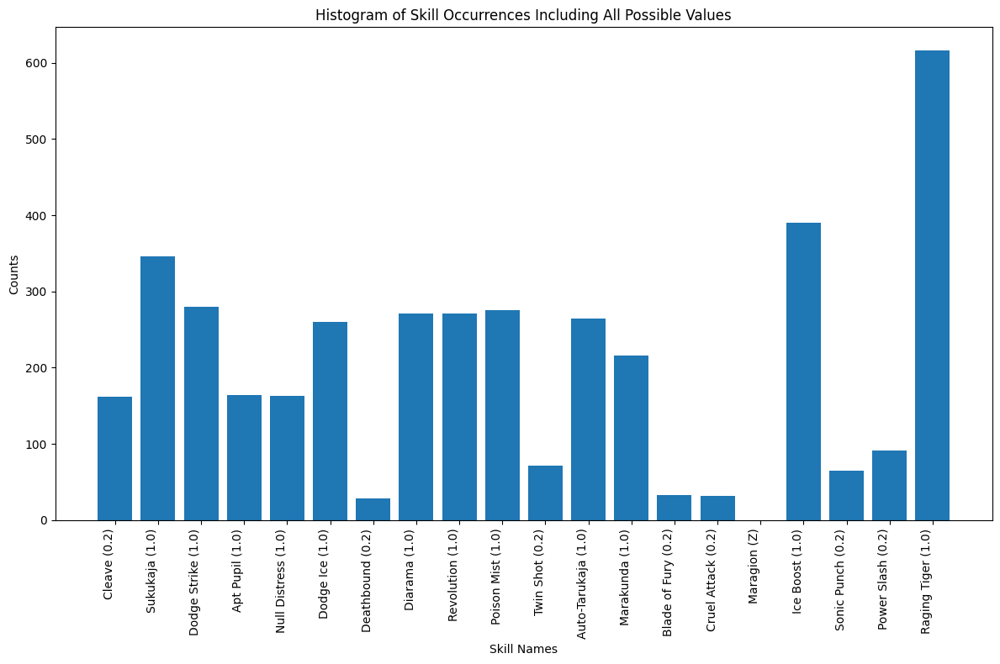

Logger_logs-WIND-optimal_recipes.txt_7_suparna
{'Magarudyne': 0, 'Mamudoon': 240, 'Poison Arrow': 49, 'Fatal End': 63, 'Megidolaon': 37, 'Power Charge': 357, 'Brave Blade': 26, 'Makarakarn': 173, 'High Counter': 270, 'Virus Breath': 241, 'Tarukaja': 573, 'Garudyne': 901, 'Spell Master': 143, 'Matarunda': 331, 'Arrow Rain': 49, 'Sexy Dance': 386, 'Victory Cry': 161}
{'Magarudyne': 0.0, 'Mamudoon': 0.06, 'Poison Arrow': 0.01225, 'Fatal End': 0.01575, 'Megidolaon': 0.00925, 'Power Charge': 0.08925, 'Brave Blade': 0.0065, 'Makarakarn': 0.04325, 'High Counter': 0.0675, 'Virus Breath': 0.06025, 'Tarukaja': 0.14325, 'Garudyne': 0.22525, 'Spell Master': 0.03575, 'Matarunda': 0.08275, 'Arrow Rain': 0.01225, 'Sexy Dance': 0.0965, 'Victory Cry': 0.04025}
Persona List:  [('lucifer', 'Judgment'), ('pazuzu', 'Devil'), ('yaksini', 'Empress')]


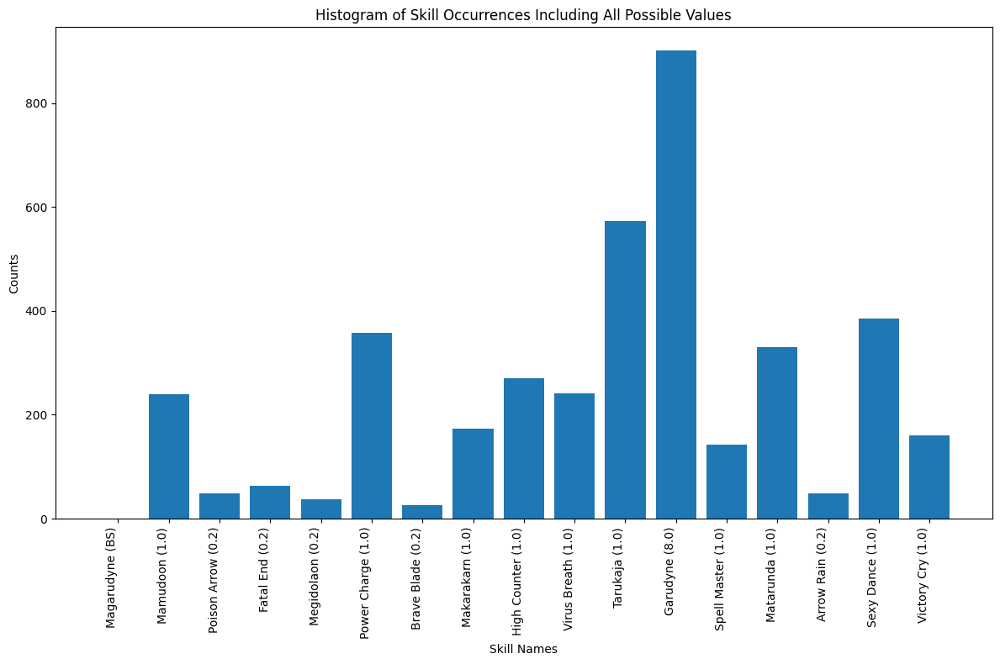

Logger_logs-WIND-optimal_recipes.txt_8_garuda
{'Power Charge': 360, 'Stagnant Air': 97, 'Apt Pupil': 272, 'Null Distress': 285, 'Null Fire': 288, 'Recarmdra': 230, 'Auto-Mataru': 237, 'Herculean Strike': 67, 'Bash': 296, 'Vicious Strike': 41, 'Maragidyne': 0, 'Bufudyne': 0, 'Rakukaja': 581, 'Vorpal Blade': 0, 'High Counter': 292, 'Enradi': 610, 'Megidola': 47, 'Tempest Slash': 47, 'Auto-Masuku': 250}
{'Power Charge': 0.09, 'Stagnant Air': 0.02425, 'Apt Pupil': 0.068, 'Null Distress': 0.07125, 'Null Fire': 0.072, 'Recarmdra': 0.0575, 'Auto-Mataru': 0.05925, 'Herculean Strike': 0.01675, 'Bash': 0.074, 'Vicious Strike': 0.01025, 'Maragidyne': 0.0, 'Bufudyne': 0.0, 'Rakukaja': 0.14525, 'Vorpal Blade': 0.0, 'High Counter': 0.073, 'Enradi': 0.1525, 'Megidola': 0.01175, 'Tempest Slash': 0.01175, 'Auto-Masuku': 0.0625}
Persona List:  [('siegfried', 'Strength'), ('loki', 'Fool'), ('ubelluris', 'Hanged Man')]


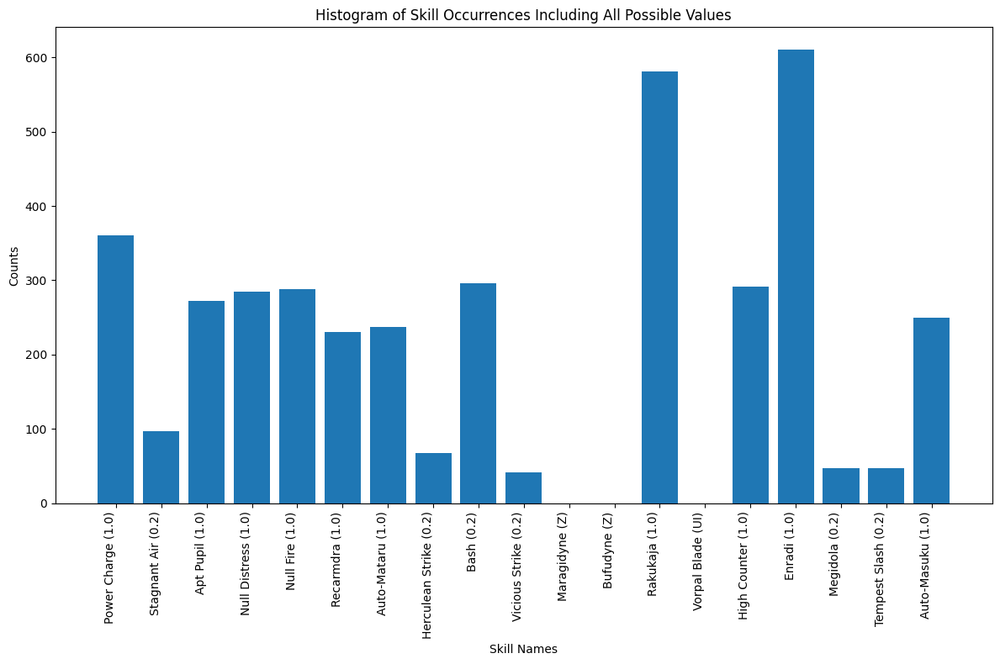

Logger_logs-WIND-optimal_recipes.txt_9_garuda
{'Salvation': 77, 'Sukukaja': 306, 'Wind Break': 171, 'Patra': 557, "God's Hand": 16, 'Garula': 839, 'Mind Charge': 141, 'Recarm': 164, 'Samsara': 84, 'Sharp Student': 240, 'Panta Rhei': 504, 'Akasha Arts': 18, 'Rakukaja': 305, 'Null Dark': 157, 'Wind Amp': 163, 'Ziodyne': 0, 'Growth 3': 171, 'Counter': 216, 'Diarahan': 148, 'Megido': 22, 'Tarukaja': 313, 'Wind Boost': 309, 'Trafuri': 79}
{'Salvation': 0.0154, 'Sukukaja': 0.0612, 'Wind Break': 0.0342, 'Patra': 0.1114, "God's Hand": 0.0032, 'Garula': 0.1678, 'Mind Charge': 0.0282, 'Recarm': 0.0328, 'Samsara': 0.0168, 'Sharp Student': 0.048, 'Panta Rhei': 0.1008, 'Akasha Arts': 0.0036, 'Rakukaja': 0.061, 'Null Dark': 0.0314, 'Wind Amp': 0.0326, 'Ziodyne': 0.0, 'Growth 3': 0.0342, 'Counter': 0.0432, 'Diarahan': 0.0296, 'Megido': 0.0044, 'Tarukaja': 0.0626, 'Wind Boost': 0.0618, 'Trafuri': 0.0158}
Persona List:  [('vishnu', 'Sun'), ('daisoujou', 'Hierophant'), ('orobas', 'Magician')]


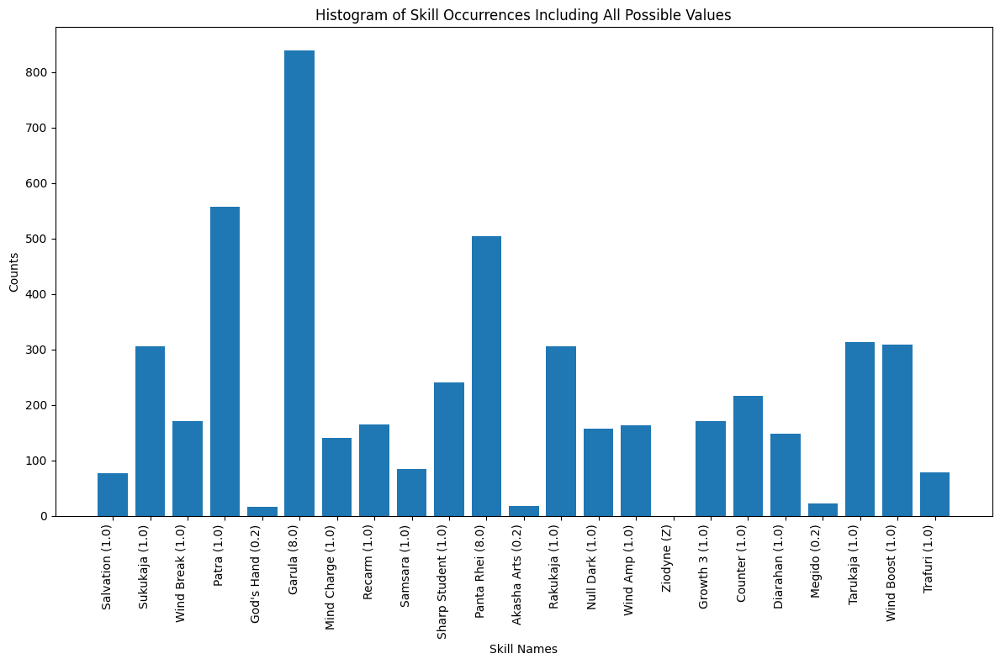

Logger_logs-LIGHT-optimal_recipes.txt_1_uriel
{'Matarukaja': 178, 'Magaru': 97, 'Power Charge': 246, 'Tarukaja': 409, 'Re Patra': 405, 'Auto-Rakukaja': 295, 'Wind Boost': 406, 'Me Patra': 300, 'Auto-Tarukaja': 318, 'Garula': 59, 'Dodge Wind': 278, 'Garu': 166, 'Recarm': 209, 'Torrent Shot': 0, 'Rakukaja': 417, 'Mazionga': 41, 'Bufu': 176, 'Zan-ei': 0}
{'Matarukaja': 0.0445, 'Magaru': 0.02425, 'Power Charge': 0.0615, 'Tarukaja': 0.10225, 'Re Patra': 0.10125, 'Auto-Rakukaja': 0.07375, 'Wind Boost': 0.1015, 'Me Patra': 0.075, 'Auto-Tarukaja': 0.0795, 'Garula': 0.01475, 'Dodge Wind': 0.0695, 'Garu': 0.0415, 'Recarm': 0.05225, 'Torrent Shot': 0.0, 'Rakukaja': 0.10425, 'Mazionga': 0.01025, 'Bufu': 0.044, 'Zan-ei': 0.0}
Persona List:  [('cu chulainn', 'Tower'), ('kusi mitama', 'Fortune'), ('fortuna', 'Fortune')]


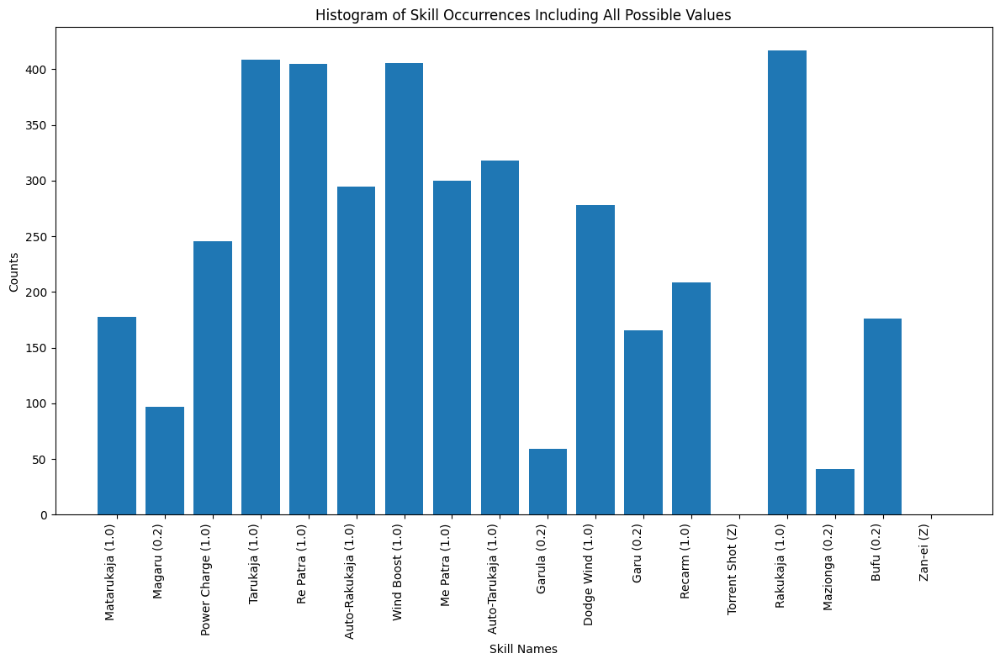

Logger_logs-LIGHT-optimal_recipes.txt_2_horus
{'Primal Force': 0, 'Evil Touch': 0, 'Repel Dark': 269, 'Absorb Slash': 194, 'Zionga': 135, 'Pulinpa': 0, 'Megido': 58, 'Spell Master': 179, 'Die for Me!': 0, 'Victory Cry': 191, 'Marin Karin': 0, 'Mind Charge': 319, 'Spirit Drain': 76, 'Auto-Tarukaja': 479, 'Salvation': 187, 'Elec Boost': 620, 'Getsu-ei': 0, 'Elec Break': 400, 'High Counter': 313, 'Zio': 336, 'Mazio': 172, 'Morning Star': 22, 'Marakunda': 401, 'Charmdi': 649}
{'Primal Force': 0.0, 'Evil Touch': 0.0, 'Repel Dark': 0.0538, 'Absorb Slash': 0.0388, 'Zionga': 0.027, 'Pulinpa': 0.0, 'Megido': 0.0116, 'Spell Master': 0.0358, 'Die for Me!': 0.0, 'Victory Cry': 0.0382, 'Marin Karin': 0.0, 'Mind Charge': 0.0638, 'Spirit Drain': 0.0152, 'Auto-Tarukaja': 0.0958, 'Salvation': 0.0374, 'Elec Boost': 0.124, 'Getsu-ei': 0.0, 'Elec Break': 0.08, 'High Counter': 0.0626, 'Zio': 0.0672, 'Mazio': 0.0344, 'Morning Star': 0.0044, 'Marakunda': 0.0802, 'Charmdi': 0.1298}
Persona List:  [('helel', '

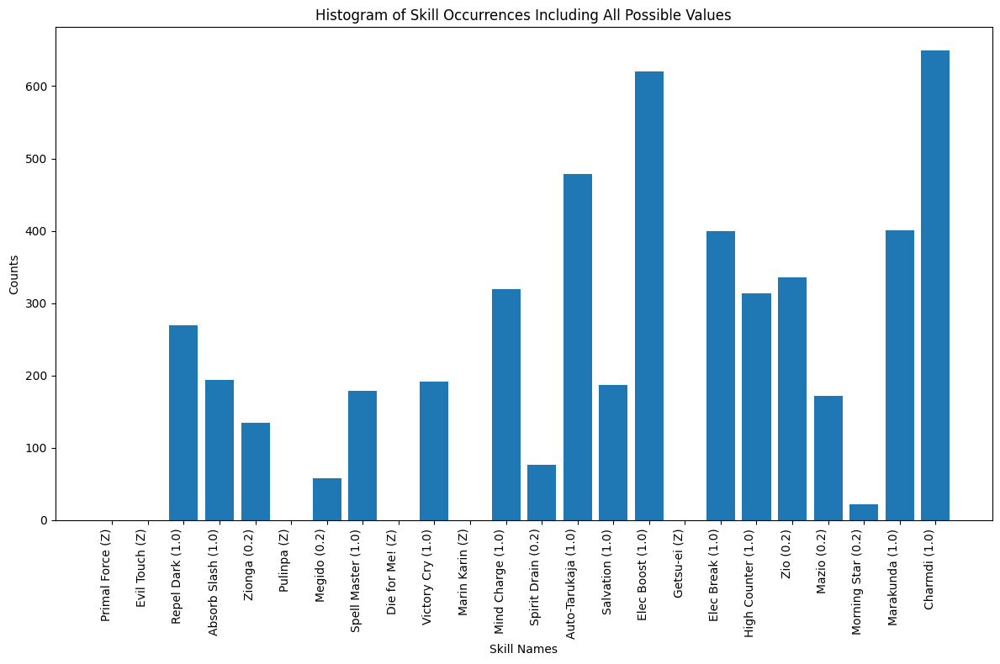

Logger_logs-LIGHT-optimal_recipes.txt_3_horus
{'Maragidyne': 49, 'Megidola': 39, 'Enradi': 599, 'Apt Pupil': 281, 'Mabufula': 79, 'Resist Fire': 336, 'Null Fire': 280, 'Counter': 405, 'Elec Amp': 325, 'Spell Master': 163, 'Null Panic': 296, 'Thunder Reign': 33, 'Stagnant Air': 120, 'Ice Break': 339, 'Bufudyne': 66, 'Amrita': 235, 'Null Dark': 294, 'Bash': 0, 'Maziodyne': 61, 'Vile Assault': 0}
{'Maragidyne': 0.01225, 'Megidola': 0.00975, 'Enradi': 0.14975, 'Apt Pupil': 0.07025, 'Mabufula': 0.01975, 'Resist Fire': 0.084, 'Null Fire': 0.07, 'Counter': 0.10125, 'Elec Amp': 0.08125, 'Spell Master': 0.04075, 'Null Panic': 0.074, 'Thunder Reign': 0.00825, 'Stagnant Air': 0.03, 'Ice Break': 0.08475, 'Bufudyne': 0.0165, 'Amrita': 0.05875, 'Null Dark': 0.0735, 'Bash': 0.0, 'Maziodyne': 0.01525, 'Vile Assault': 0.0}
Persona List:  [('loki', 'Fool'), ('laksmi', 'Empress'), ('odin', 'Emperor')]


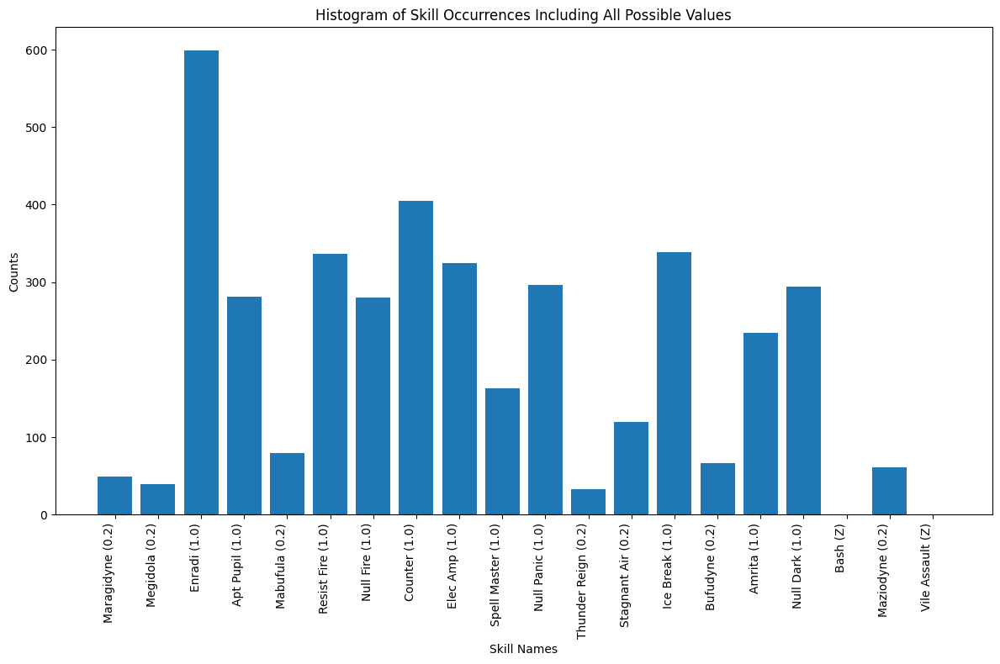

Logger_logs-LIGHT-optimal_recipes.txt_4_atavaka
{'Ragnarok': 38, 'Megidola': 0, 'Megidolaon': 40, 'Wind Boost': 694, 'Niflheim': 46, 'Elec Amp': 450, 'Spell Master': 194, 'Makarakarn': 251, 'Victory Cry': 199, 'Mind Charge': 368, 'Unshaken Will': 202, 'Mamudoon': 0, 'Fire Boost': 709, 'Salvation': 195, 'Brave Blade': 0, 'Wind Amp': 429, 'Magarudyne': 66, 'High Counter': 371, 'Absorb Fire': 282, 'Ice Amp': 466}
{'Ragnarok': 0.0076, 'Megidola': 0.0, 'Megidolaon': 0.008, 'Wind Boost': 0.1388, 'Niflheim': 0.0092, 'Elec Amp': 0.09, 'Spell Master': 0.0388, 'Makarakarn': 0.0502, 'Victory Cry': 0.0398, 'Mind Charge': 0.0736, 'Unshaken Will': 0.0404, 'Mamudoon': 0.0, 'Fire Boost': 0.1418, 'Salvation': 0.039, 'Brave Blade': 0.0, 'Wind Amp': 0.0858, 'Magarudyne': 0.0132, 'High Counter': 0.0742, 'Absorb Fire': 0.0564, 'Ice Amp': 0.0932}
Persona List:  [('lucifer', 'Judgment'), ('skadi', 'Empress'), ('surt', 'Magician')]


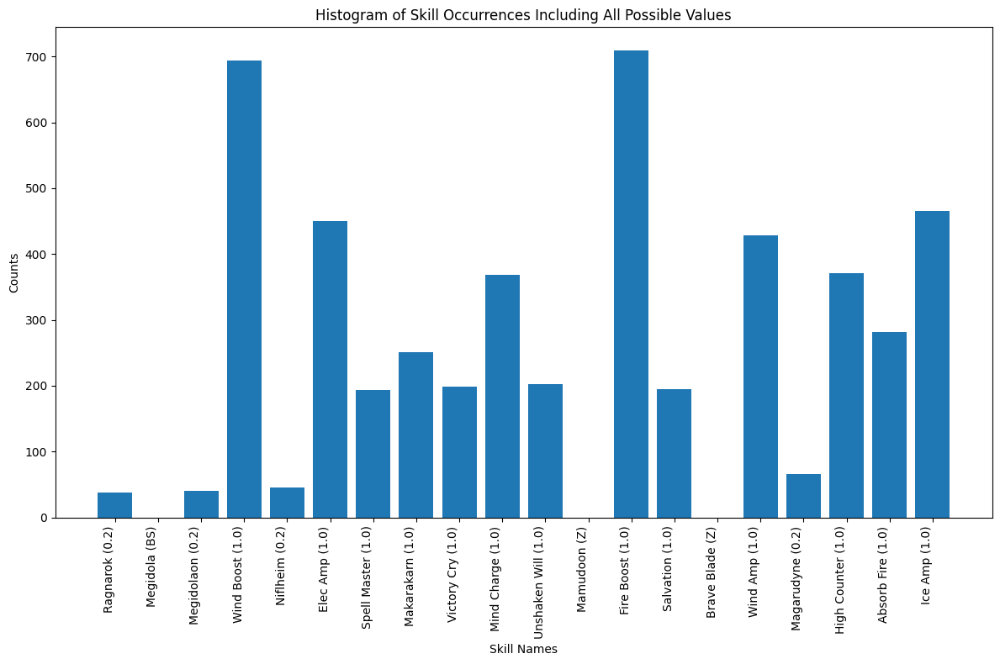

Logger_logs-LIGHT-optimal_recipes.txt_5_horus
{'Matarukaja': 170, 'Wind Boost': 422, 'Apt Pupil': 183, 'Recarm': 222, 'Growth 3': 0, 'Agidyne': 32, 'Diarahan': 173, 'Zan-ei': 0, 'Invigorate 3': 153, 'Patra': 653, 'Tarukaja': 413, 'Fire Boost': 393, 'Magarula': 40, 'Maragion': 43, 'Rakukaja': 422, 'Mighty Swing': 0, 'Agilao': 76, 'Panta Rhei': 20, 'Wind Amp': 214, 'Magarudyne': 35, 'Regenerate 3': 166, 'Null Dark': 184, 'Sukukaja': 410, 'Samsara': 576}
{'Matarukaja': 0.034, 'Wind Boost': 0.0844, 'Apt Pupil': 0.0366, 'Recarm': 0.0444, 'Growth 3': 0.0, 'Agidyne': 0.0064, 'Diarahan': 0.0346, 'Zan-ei': 0.0, 'Invigorate 3': 0.0306, 'Patra': 0.1306, 'Tarukaja': 0.0826, 'Fire Boost': 0.0786, 'Magarula': 0.008, 'Maragion': 0.0086, 'Rakukaja': 0.0844, 'Mighty Swing': 0.0, 'Agilao': 0.0152, 'Panta Rhei': 0.004, 'Wind Amp': 0.0428, 'Magarudyne': 0.007, 'Regenerate 3': 0.0332, 'Null Dark': 0.0368, 'Sukukaja': 0.082, 'Samsara': 0.1152}
Persona List:  [('norn', 'Fortune'), ('daisoujou', 'Hierophant')

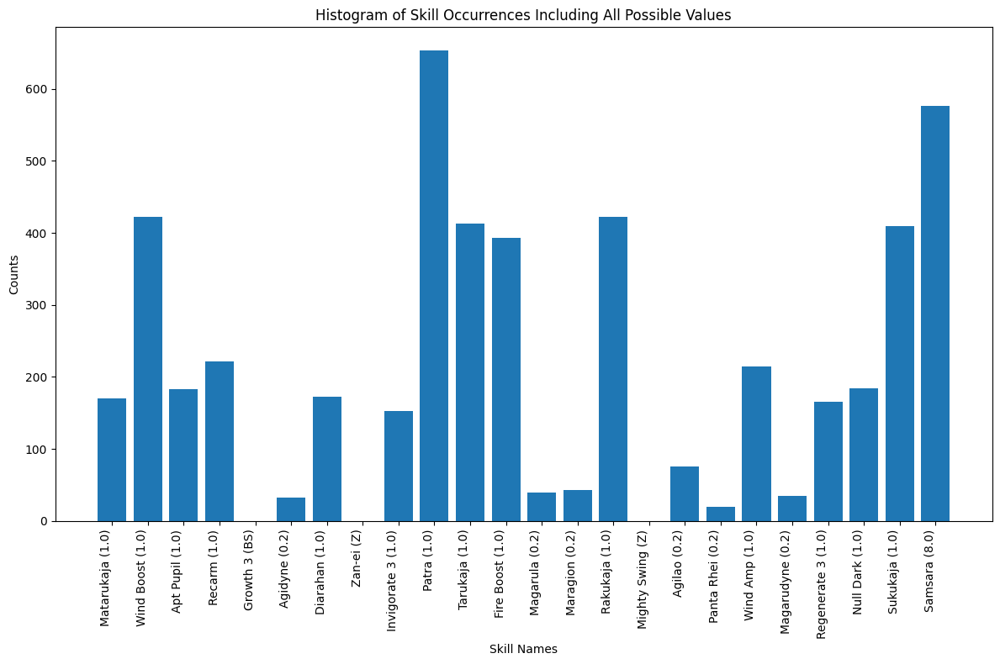

Logger_logs-LIGHT-optimal_recipes.txt_6_throne
{'Panta Rhei': 28, 'Wind Amp': 286, 'Magarudyne': 40, 'Mabufudyne': 44, 'Wind Boost': 468, 'Garudyne': 47, 'Diarahan': 215, 'Garula': 81, 'Foul Breath': 138, 'Wind Break': 280, 'Sharp Student': 375, 'Rakukaja': 517, 'Mediarama': 228, 'Trafuri': 146, 'Eerie Sound': 0, 'Raging Tiger': 775, 'Counter': 332}
{'Panta Rhei': 0.007, 'Wind Amp': 0.0715, 'Magarudyne': 0.01, 'Mabufudyne': 0.011, 'Wind Boost': 0.117, 'Garudyne': 0.01175, 'Diarahan': 0.05375, 'Garula': 0.02025, 'Foul Breath': 0.0345, 'Wind Break': 0.07, 'Sharp Student': 0.09375, 'Rakukaja': 0.12925, 'Mediarama': 0.057, 'Trafuri': 0.0365, 'Eerie Sound': 0.0, 'Raging Tiger': 0.19375, 'Counter': 0.083}
Persona List:  [('suparna', 'Sun'), ('orobas', 'Magician'), ('mothman', 'Hermit')]


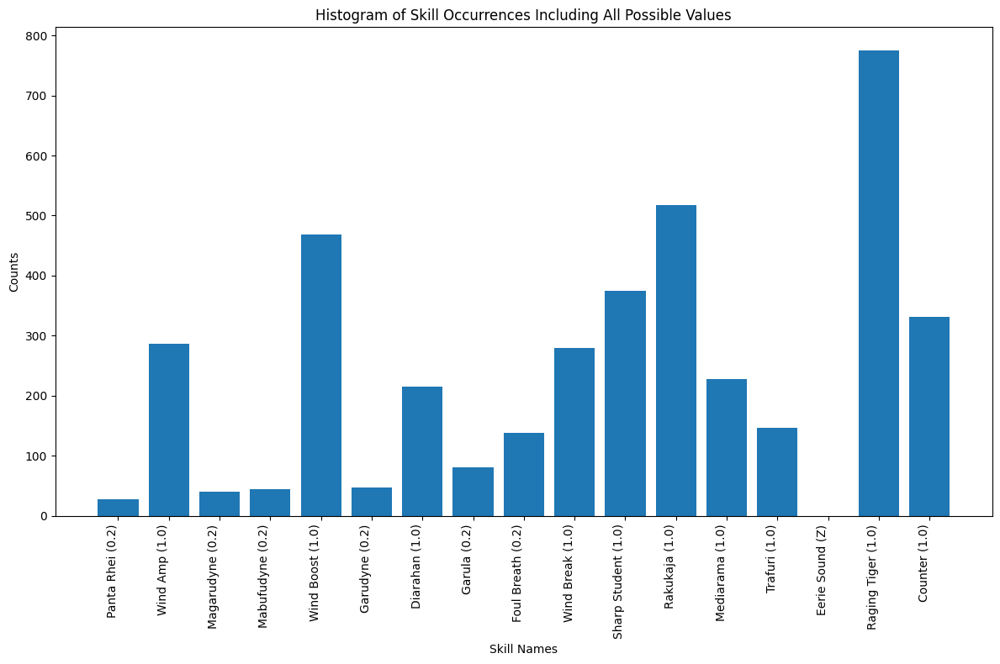

Logger_logs-LIGHT-optimal_recipes.txt_7_vasuki
{'Provoke': 0, 'Posumudi': 257, 'Sukunda': 252, 'Mediarahan': 73, 'Dekaja': 92, 'Bufula': 35, 'Tarukaja': 229, 'Mahamaon': 569, 'Rage Boost': 157, 'Agi': 106, 'Recarmdra': 66, 'Maragi': 48, 'Hama Boost': 116, 'Hama': 859, 'Counterstrike': 114, 'Me Patra': 179, 'Cleave': 0, 'Resist Dark': 127, 'Hamaon': 686, 'Mabufu': 35}
{'Provoke': 0.0, 'Posumudi': 0.06425, 'Sukunda': 0.063, 'Mediarahan': 0.01825, 'Dekaja': 0.023, 'Bufula': 0.00875, 'Tarukaja': 0.05725, 'Mahamaon': 0.14225, 'Rage Boost': 0.03925, 'Agi': 0.0265, 'Recarmdra': 0.0165, 'Maragi': 0.012, 'Hama Boost': 0.029, 'Hama': 0.21475, 'Counterstrike': 0.0285, 'Me Patra': 0.04475, 'Cleave': 0.0, 'Resist Dark': 0.03175, 'Hamaon': 0.1715, 'Mabufu': 0.00875}
Persona List:  [('throne', 'Justice'), ('sarasvati', 'Priestess'), ('pyro jack', 'Magician')]


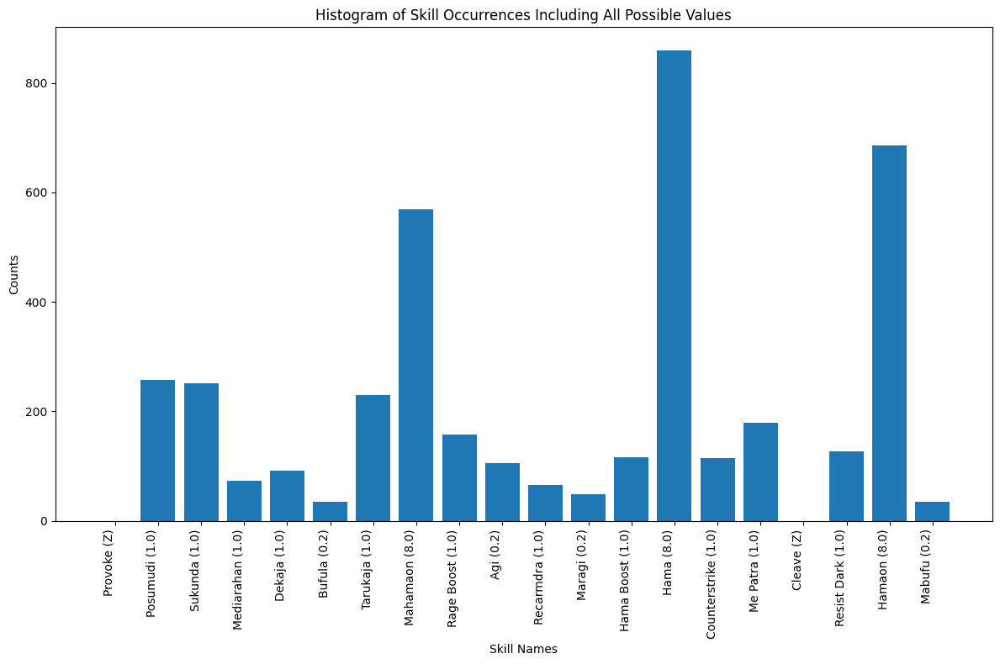

Logger_logs-LIGHT-optimal_recipes.txt_8_throne
{'Mahama': 799, 'Ziodyne': 19, 'Akasha Arts': 0, 'Wind Boost': 288, 'Bufu': 115, 'Counter': 172, 'Magaru': 56, 'Megido': 20, 'Mind Charge': 106, 'Zan-ei': 0, 'Tarukaja': 244, 'Garu': 109, 'Salvation': 64, 'Rakukaja': 259, 'Zio': 123, 'Revolution': 170, "God's Hand": 0, 'Hama': 908, 'Me Patra': 168, 'Dodge Wind': 174, 'Media': 202}
{'Mahama': 0.19994994994994994, 'Ziodyne': 0.004754754754754755, 'Akasha Arts': 0.0, 'Wind Boost': 0.07207207207207207, 'Bufu': 0.02877877877877878, 'Counter': 0.043043043043043044, 'Magaru': 0.014014014014014014, 'Megido': 0.005005005005005005, 'Mind Charge': 0.026526526526526525, 'Zan-ei': 0.0, 'Tarukaja': 0.06106106106106106, 'Garu': 0.027277277277277277, 'Salvation': 0.016016016016016016, 'Rakukaja': 0.06481481481481481, 'Zio': 0.03078078078078078, 'Revolution': 0.04254254254254254, "God's Hand": 0.0, 'Hama': 0.22722722722722724, 'Me Patra': 0.042042042042042045, 'Dodge Wind': 0.04354354354354354, 'Media': 0.

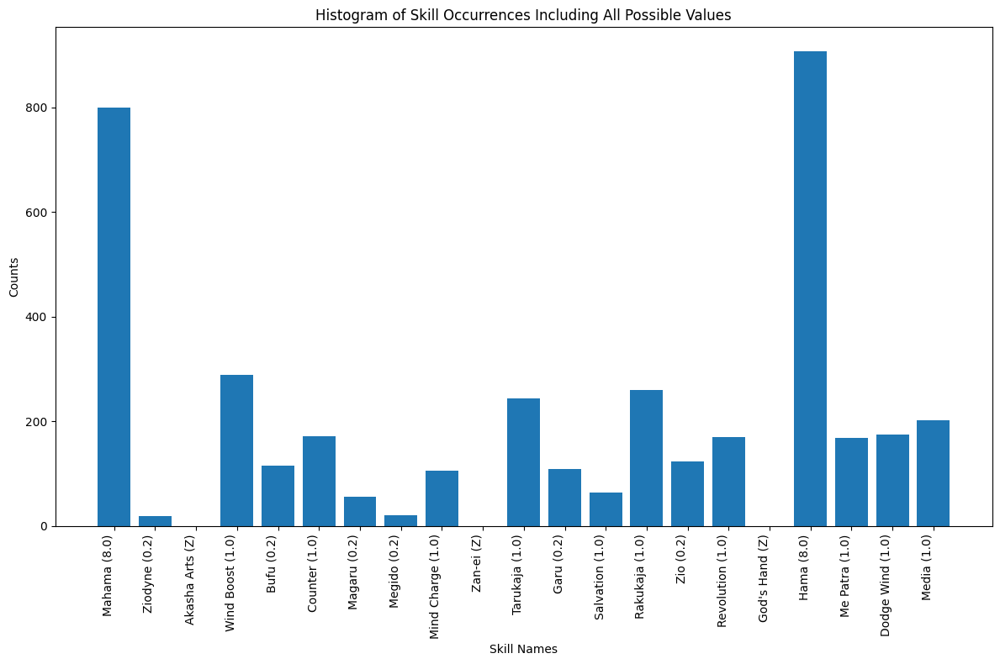

Logger_logs-DARK-optimal_recipes.txt_1_mot
{'Cleave': 650, 'Power Charge': 0, 'Zan-ei': 292, 'Auto-Sukukaja': 276, 'Torrent Shot': 197, 'Auto-Tarukaja': 287, 'Mabufu': 379, 'Evade Strike': 186, 'Gigantic Fist': 167, 'Me Patra': 0, 'Bash': 659, 'Matarukaja': 0, 'Power Slash': 402, 'Dodge Slash': 304, 'Mazionga': 201, 'Tarukaja': 0}
{'Cleave': 0.1625, 'Power Charge': 0.0, 'Zan-ei': 0.073, 'Auto-Sukukaja': 0.069, 'Torrent Shot': 0.04925, 'Auto-Tarukaja': 0.07175, 'Mabufu': 0.09475, 'Evade Strike': 0.0465, 'Gigantic Fist': 0.04175, 'Me Patra': 0.0, 'Bash': 0.16475, 'Matarukaja': 0.0, 'Power Slash': 0.1005, 'Dodge Slash': 0.076, 'Mazionga': 0.05025, 'Tarukaja': 0.0}
Persona List:  [('hecatoncheires', 'Hanged Man'), ('cu chulainn', 'Tower'), ('valkyrie', 'Strength')]


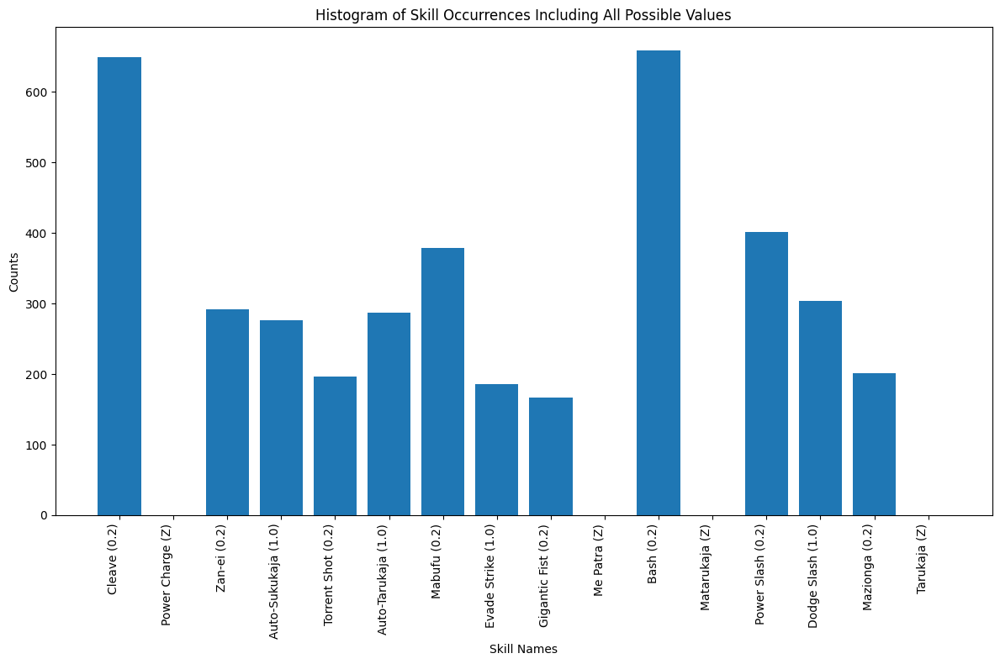

Logger_logs-DARK-optimal_recipes.txt_2_baal zebul
{'Null Distress': 241, 'Deathbound': 222, 'Victory Cry': 121, 'Poison Arrow': 206, 'Morning Star': 116, 'Diarama': 0, 'Garudyne': 220, 'Tarukaja': 0, 'Matarunda': 0, 'Absorb Slash': 126, 'Apt Pupil': 240, 'Arrow Rain': 214, 'Sexy Dance': 864, 'Mind Charge': 0, 'Blade of Fury': 224, 'Marakunda': 0, 'Salvation': 0, 'Primal Force': 117, 'Power Charge': 0, 'Spell Master': 126, 'High Counter': 210, 'Virus Breath': 753}
{'Null Distress': 0.06025, 'Deathbound': 0.0555, 'Victory Cry': 0.03025, 'Poison Arrow': 0.0515, 'Morning Star': 0.029, 'Diarama': 0.0, 'Garudyne': 0.055, 'Tarukaja': 0.0, 'Matarunda': 0.0, 'Absorb Slash': 0.0315, 'Apt Pupil': 0.06, 'Arrow Rain': 0.0535, 'Sexy Dance': 0.216, 'Mind Charge': 0.0, 'Blade of Fury': 0.056, 'Marakunda': 0.0, 'Salvation': 0.0, 'Primal Force': 0.02925, 'Power Charge': 0.0, 'Spell Master': 0.0315, 'High Counter': 0.0525, 'Virus Breath': 0.18825}
Persona List:  [('helel', 'Star'), ('kali', 'Strength'), 

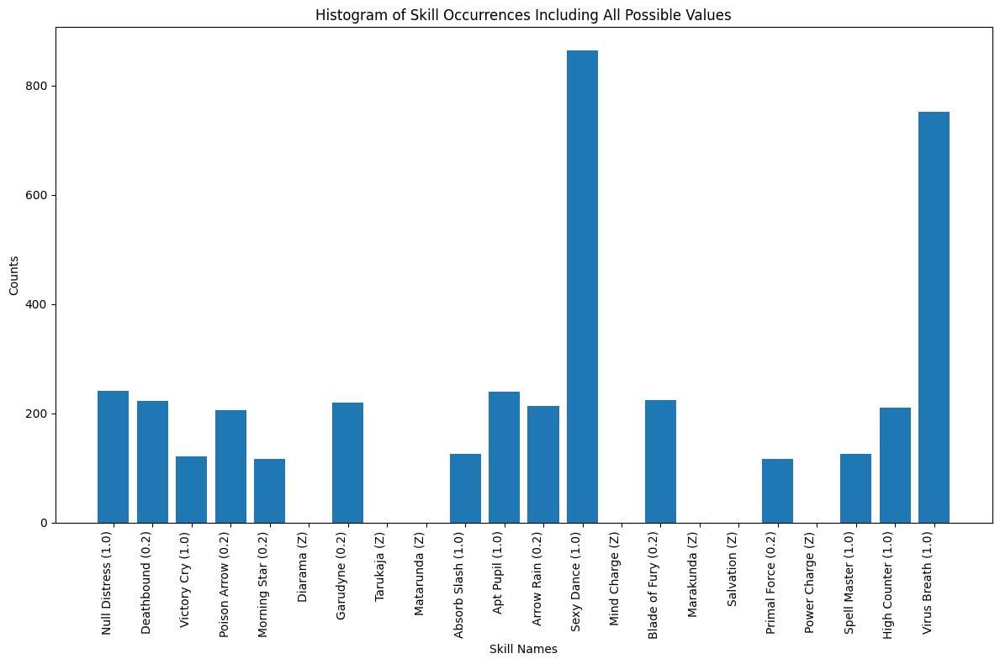

Logger_logs-DARK-optimal_recipes.txt_3_baal zebul
{'Mabufula': 175, 'Magarudyne': 98, 'Victory Cry': 65, 'Brave Blade': 61, 'Ghastly Wail': 379, 'Null Fear': 137, 'Panta Rhei': 67, 'Wind Amp': 168, 'Mudoon': 994, 'Ice Break': 0, 'Bufudyne': 146, 'Double Fangs': 319, 'Resist Fire': 167, 'Null Dark': 141, 'Mamudoon': 0, 'Magarula': 169, 'Spell Master': 60, 'Amrita': 0, 'Megidolaon': 69, 'Makarakarn': 0, 'High Counter': 141, 'Evil Smile': 644}
{'Mabufula': 0.04375, 'Magarudyne': 0.0245, 'Victory Cry': 0.01625, 'Brave Blade': 0.01525, 'Ghastly Wail': 0.09475, 'Null Fear': 0.03425, 'Panta Rhei': 0.01675, 'Wind Amp': 0.042, 'Mudoon': 0.2485, 'Ice Break': 0.0, 'Bufudyne': 0.0365, 'Double Fangs': 0.07975, 'Resist Fire': 0.04175, 'Null Dark': 0.03525, 'Mamudoon': 0.0, 'Magarula': 0.04225, 'Spell Master': 0.015, 'Amrita': 0.0, 'Megidolaon': 0.01725, 'Makarakarn': 0.0, 'High Counter': 0.03525, 'Evil Smile': 0.161}
Persona List:  [('lucifer', 'Judgment'), ('laksmi', 'Empress'), ('mot', 'Death')]


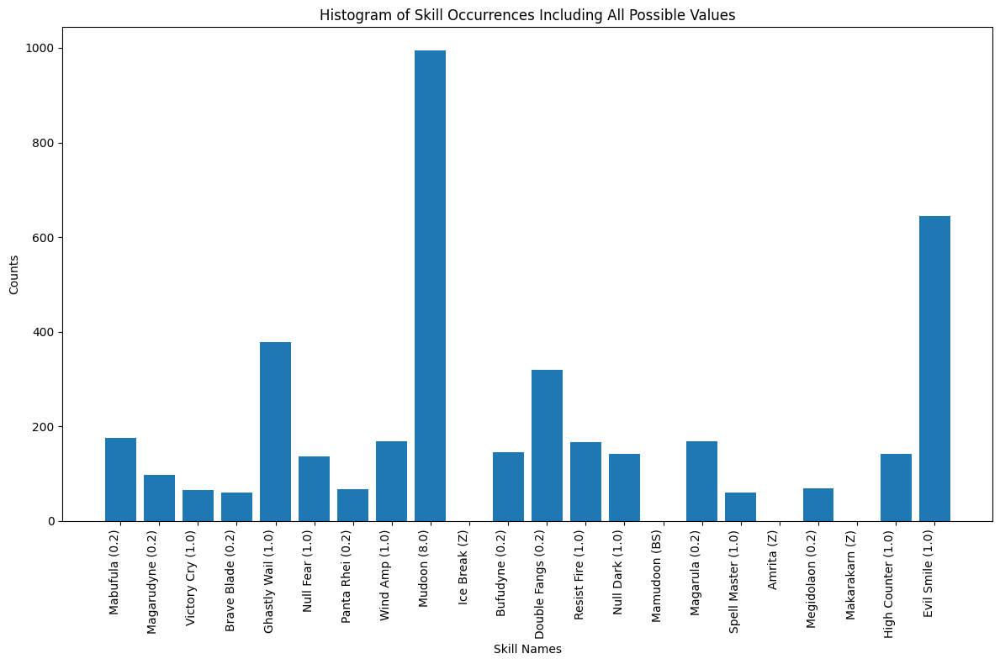

Logger_logs-DARK-optimal_recipes.txt_4_chernobog
{'Auto-Mataru': 99, 'Invigorate 2': 129, 'Zionga': 204, 'Spirit Drain': 138, 'Fist Master': 84, 'Akasha Arts': 68, 'Wind Amp': 137, 'Panta Rhei': 54, 'Repel Dark': 93, 'Zio': 501, 'Mediarahan': 0, 'Megido': 111, 'Fear Boost': 209, 'Growth 1': 295, 'Evil Touch': 694, 'Marakunda': 0, 'Marin Karin': 818, 'Die for Me!': 928, 'Life Drain': 183, 'Survive Light': 145, 'Vicious Strike': 110, 'Tarunda': 0}
{'Auto-Mataru': 0.0198, 'Invigorate 2': 0.0258, 'Zionga': 0.0408, 'Spirit Drain': 0.0276, 'Fist Master': 0.0168, 'Akasha Arts': 0.0136, 'Wind Amp': 0.0274, 'Panta Rhei': 0.0108, 'Repel Dark': 0.0186, 'Zio': 0.1002, 'Mediarahan': 0.0, 'Megido': 0.0222, 'Fear Boost': 0.0418, 'Growth 1': 0.059, 'Evil Touch': 0.1388, 'Marakunda': 0.0, 'Marin Karin': 0.1636, 'Die for Me!': 0.1856, 'Life Drain': 0.0366, 'Survive Light': 0.029, 'Vicious Strike': 0.022, 'Tarunda': 0.0}
Persona List:  [('melchizedek', 'Justice'), ('alice', 'Death'), ('loa', 'Death')]


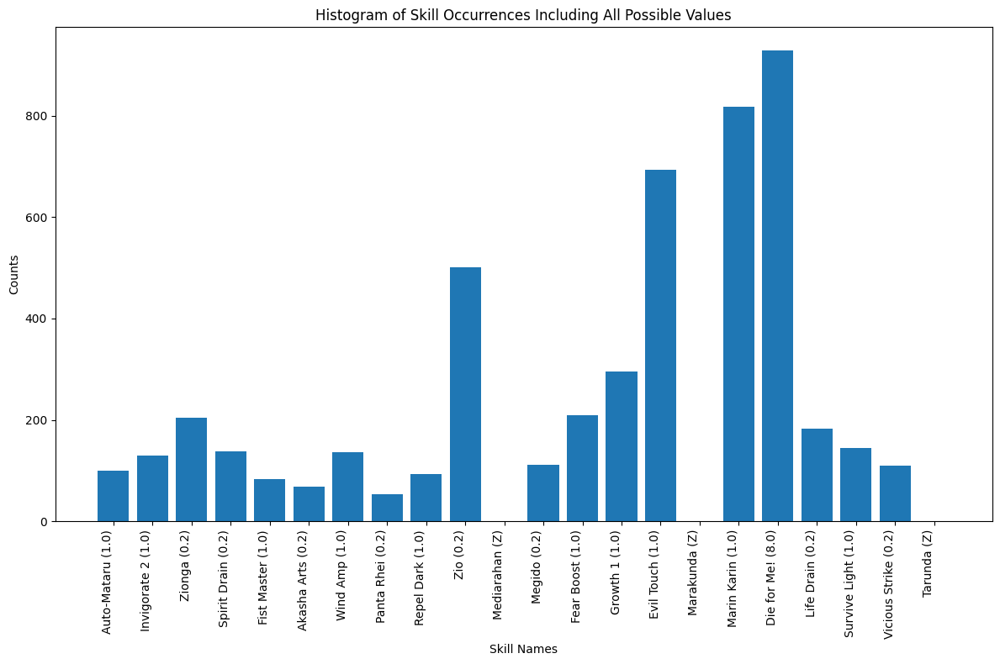

Logger_logs-DARK-optimal_recipes.txt_5_chernobog
{'Trafuri': 89, 'Agidyne': 199, 'Auto-Mataru': 181, 'Agilao': 326, 'Invigorate 2': 204, 'Mighty Swing': 238, 'Fist Master': 173, 'Garula': 370, 'Wind Boost': 438, 'Akasha Arts': 126, 'Panta Rhei': 118, 'Wind Amp': 230, 'Repel Dark': 178, 'Sharp Student': 344, 'Maragion': 221, 'Fire Boost': 449, 'Wind Break': 0, 'Mediarahan': 0, 'Apt Pupil': 211, 'Rakukaja': 0, 'Growth 1': 438, 'Zan-ei': 298, 'Matarukaja': 0, 'Vicious Strike': 174}
{'Trafuri': 0.017782217782217783, 'Agidyne': 0.03976023976023976, 'Auto-Mataru': 0.036163836163836165, 'Agilao': 0.06513486513486513, 'Invigorate 2': 0.04075924075924076, 'Mighty Swing': 0.04755244755244755, 'Fist Master': 0.034565434565434566, 'Garula': 0.07392607392607392, 'Wind Boost': 0.08751248751248751, 'Akasha Arts': 0.025174825174825177, 'Panta Rhei': 0.023576423576423578, 'Wind Amp': 0.04595404595404595, 'Repel Dark': 0.035564435564435566, 'Sharp Student': 0.06873126873126874, 'Maragion': 0.04415584415

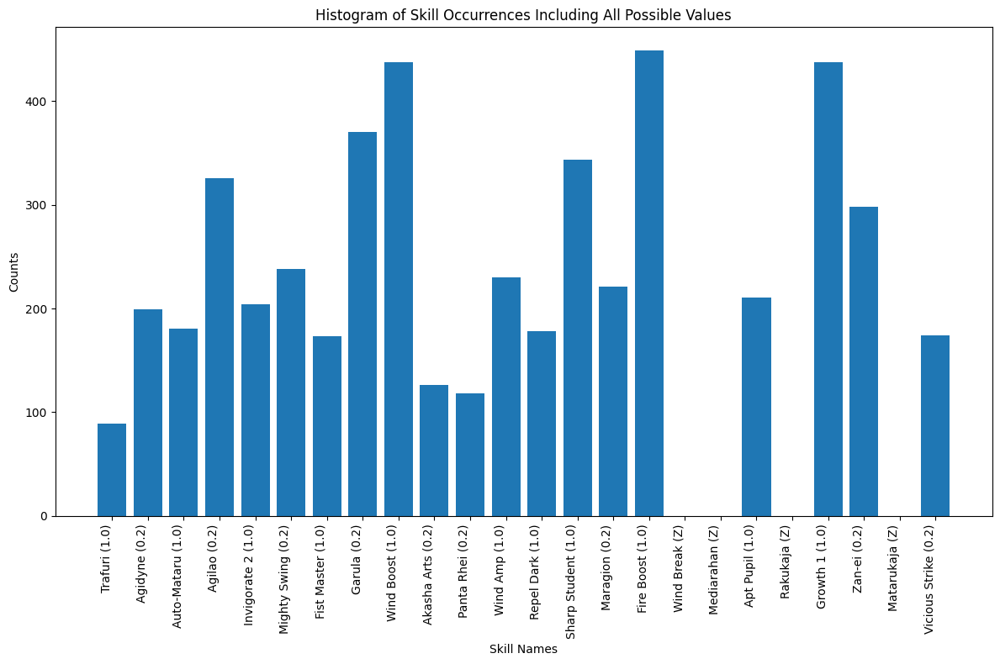

Logger_logs-DARK-optimal_recipes.txt_6_mot
{'Twin Shot': 126, 'Sonic Punch': 179, 'Mamudoon': 950, 'Dodge Strike': 117, 'Bufu': 334, 'Magaru': 152, 'Dodge Wind': 162, 'Rakukaja': 0, 'Wind Boost': 161, 'Auto-Tarukaja': 121, 'Sukukaja': 0, 'Garu': 345, 'Raging Tiger': 367, 'Ice Boost': 174, 'Poison Mist': 473, 'Virus Breath': 339}
{'Twin Shot': 0.0315, 'Sonic Punch': 0.04475, 'Mamudoon': 0.2375, 'Dodge Strike': 0.02925, 'Bufu': 0.0835, 'Magaru': 0.038, 'Dodge Wind': 0.0405, 'Rakukaja': 0.0, 'Wind Boost': 0.04025, 'Auto-Tarukaja': 0.03025, 'Sukukaja': 0.0, 'Garu': 0.08625, 'Raging Tiger': 0.09175, 'Ice Boost': 0.0435, 'Poison Mist': 0.11825, 'Virus Breath': 0.08475}
Persona List:  [('nidhoggr', 'Aeon'), ('fortuna', 'Fortune'), ('gurr', 'Moon')]


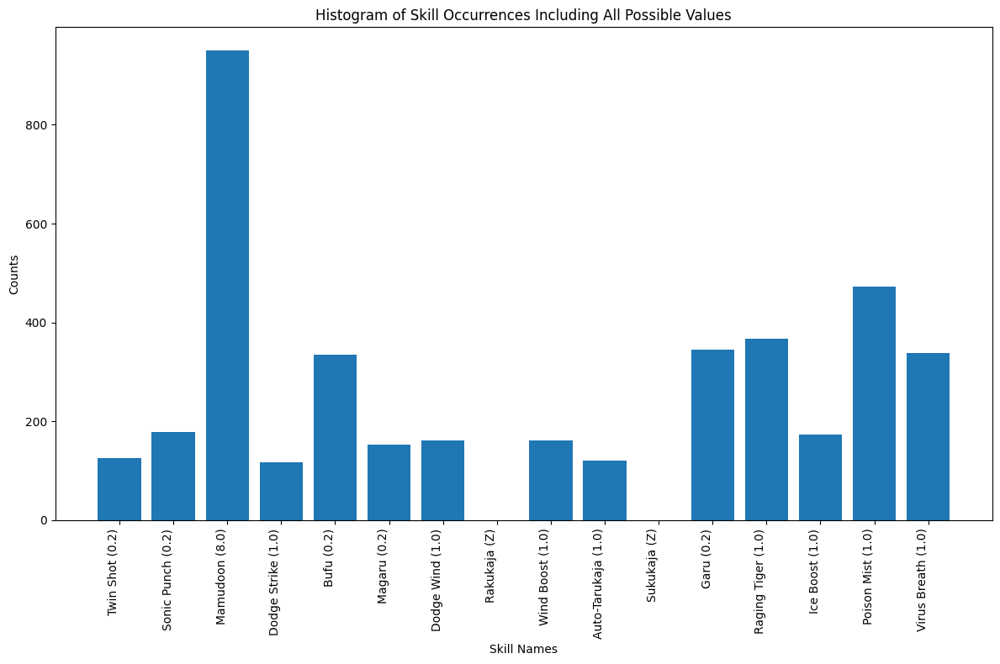

Logger_logs-DARK-optimal_recipes.txt_7_chernobog
{'Thunder Reign': 97, 'Auto-Rakukaja': 254, 'Null Panic': 202, 'Counter': 301, 'Megidola': 147, 'Wind Amp': 219, 'Resist Strike': 179, 'Dekunda': 0, 'Vile Assault': 170, 'Mudo': 1000, 'Fire Boost': 410, 'Maziodyne': 150, 'Me Patra': 0, 'Mind Charge': 0, 'Salvation': 0, 'Ragnarok': 86, 'Bufula': 316, 'Spell Master': 91, 'Amrita': 0, 'Elec Amp': 206, 'High Counter': 175, 'Mamudo': 997, 'Sukunda': 0}
{'Thunder Reign': 0.0194, 'Auto-Rakukaja': 0.0508, 'Null Panic': 0.0404, 'Counter': 0.0602, 'Megidola': 0.0294, 'Wind Amp': 0.0438, 'Resist Strike': 0.0358, 'Dekunda': 0.0, 'Vile Assault': 0.034, 'Mudo': 0.2, 'Fire Boost': 0.082, 'Maziodyne': 0.03, 'Me Patra': 0.0, 'Mind Charge': 0.0, 'Salvation': 0.0, 'Ragnarok': 0.0172, 'Bufula': 0.0632, 'Spell Master': 0.0182, 'Amrita': 0.0, 'Elec Amp': 0.0412, 'High Counter': 0.035, 'Mamudo': 0.1994, 'Sukunda': 0.0}
Persona List:  [('odin', 'Emperor'), ('surt', 'Magician'), ('genbu', 'Temperance')]


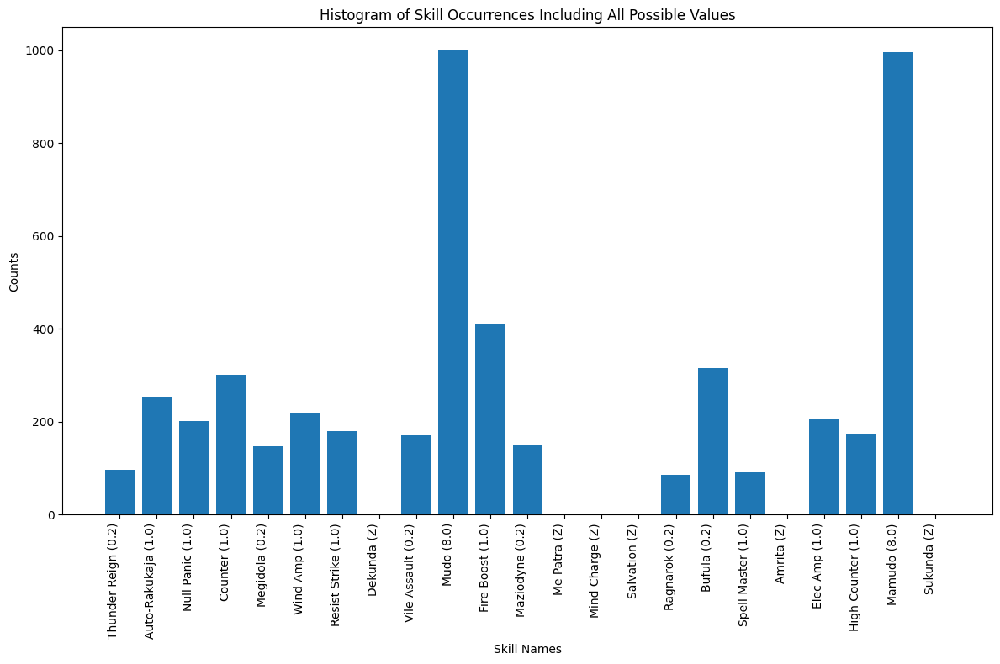

Logger_logs-DARK-optimal_recipes.txt_8_mother harlot
{'Fire Amp': 332, 'Unshaken Will': 139, 'Wind Boost': 566, 'Deathbound': 267, 'Myriad Arrows': 245, 'Wind Amp': 357, 'Maragidyne': 236, 'Mind Charge': 0, 'Absorb Fire': 215, 'Niflheim': 147, 'High Counter': 302, 'Auto-Rakukaja': 408, 'Ice Amp': 338, 'Tempest Slash': 214, 'Mabufudyne': 234}
{'Fire Amp': 0.083, 'Unshaken Will': 0.03475, 'Wind Boost': 0.1415, 'Deathbound': 0.06675, 'Myriad Arrows': 0.06125, 'Wind Amp': 0.08925, 'Maragidyne': 0.059, 'Mind Charge': 0.0, 'Absorb Fire': 0.05375, 'Niflheim': 0.03675, 'High Counter': 0.0755, 'Auto-Rakukaja': 0.102, 'Ice Amp': 0.0845, 'Tempest Slash': 0.0535, 'Mabufudyne': 0.0585}
Persona List:  [('skadi', 'Empress'), ('scathach', 'Priestess'), ('uriel', 'Aeon')]


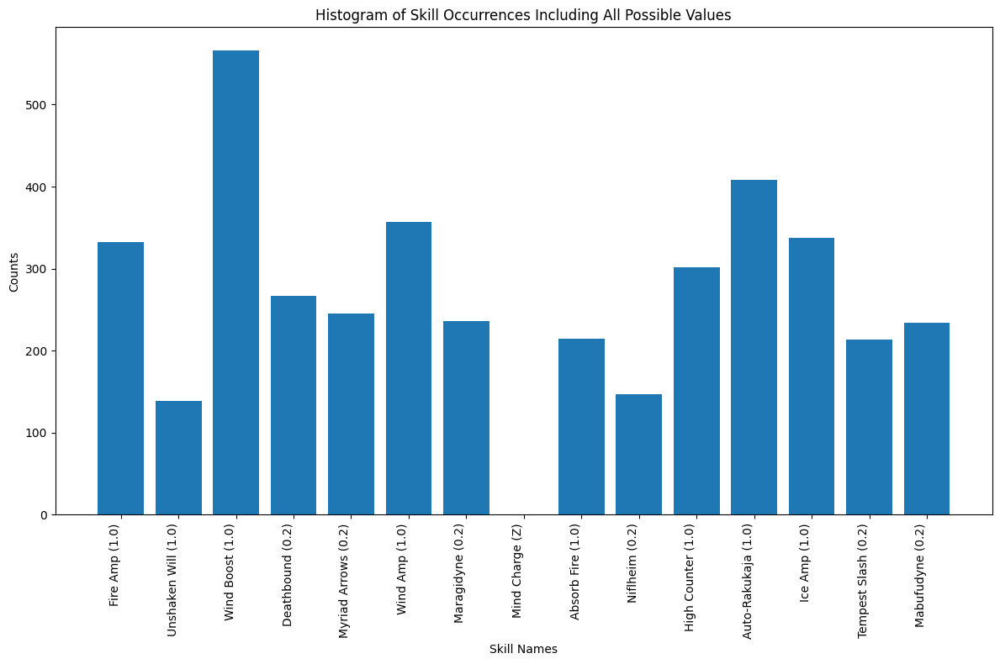

Logger_logs-DARK-optimal_recipes.txt_9_loa
{'Null Distress': 84, 'Kill Rush': 169, 'Agi': 347, 'Rakukaja': 0, 'Sukukaja': 0, 'Recarmdra': 0, 'Mazio': 213, 'Maragi': 204, 'Herculean Strike': 114, 'Rebellion': 0, 'Provoke': 692, 'Dodge Slash': 142, 'Mudo': 1000, 'Zio': 392, 'Tentarafoo': 431, 'Rakunda': 0, 'Dekaja': 0, 'Foul Breath': 212}
{'Null Distress': 0.021, 'Kill Rush': 0.04225, 'Agi': 0.08675, 'Rakukaja': 0.0, 'Sukukaja': 0.0, 'Recarmdra': 0.0, 'Mazio': 0.05325, 'Maragi': 0.051, 'Herculean Strike': 0.0285, 'Rebellion': 0.0, 'Provoke': 0.173, 'Dodge Slash': 0.0355, 'Mudo': 0.25, 'Zio': 0.098, 'Tentarafoo': 0.10775, 'Rakunda': 0.0, 'Dekaja': 0.0, 'Foul Breath': 0.053}
Persona List:  [('ubelluris', 'Hanged Man'), ('vetala', 'Devil'), ('lilim', 'Devil')]


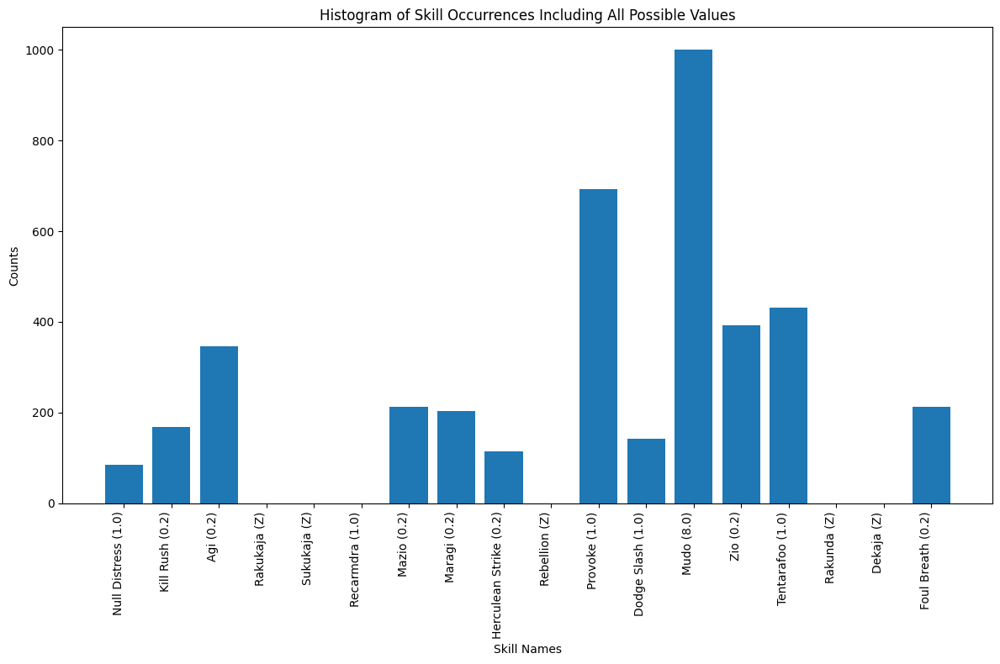

Logger_logs-DARK-optimal_recipes.txt_10_mot
{'Trafuri': 83, 'Ziodyne': 146, 'Counter': 225, 'Garula': 266, 'Wind Boost': 320, 'Akasha Arts': 99, 'Panta Rhei': 61, 'Wind Amp': 177, 'Zio': 615, 'Sharp Student': 244, 'Tarukaja': 0, 'Wind Break': 0, 'Poisma': 971, 'Rakukaja': 0, 'Megido': 130, 'Mind Charge': 0, 'Single Shot': 590, 'Salvation': 0, "God's Hand": 73}
{'Trafuri': 0.02075, 'Ziodyne': 0.0365, 'Counter': 0.05625, 'Garula': 0.0665, 'Wind Boost': 0.08, 'Akasha Arts': 0.02475, 'Panta Rhei': 0.01525, 'Wind Amp': 0.04425, 'Zio': 0.15375, 'Sharp Student': 0.061, 'Tarukaja': 0.0, 'Wind Break': 0.0, 'Poisma': 0.24275, 'Rakukaja': 0.0, 'Megido': 0.0325, 'Mind Charge': 0.0, 'Single Shot': 0.1475, 'Salvation': 0.0, "God's Hand": 0.01825}
Persona List:  [('vishnu', 'Sun'), ('orobas', 'Magician'), ('inugami', 'Hanged Man')]


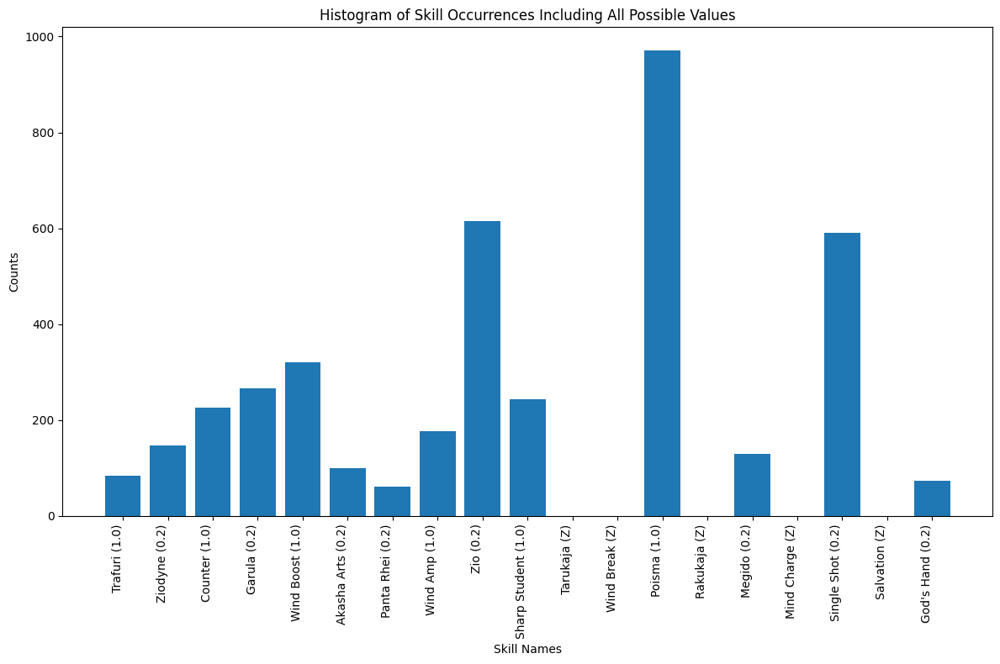

Logger_logs-LIGHT & DARK-optimal_recipes.txt_1_anubis
{'Marakunda': 54, 'Marin Karin': 150, 'Mediarahan': 47, 'Repel Dark': 255, 'Recarmdra': 36, 'Resist Dark': 335, 'Zio': 269, 'Mazio': 136, 'Evil Touch': 89, 'Zionga': 97, 'Megido': 56, 'Spirit Drain': 64, 'Elec Break': 74, 'Elec Boost': 568, 'Hama Boost': 340, 'Counterstrike': 336, 'Auto-Tarukaja': 409, 'Charmdi': 147, 'Die for Me!': 524, 'Getsu-ei': 0, 'Mahamaon': 0, 'Pulinpa': 160, 'Hamaon': 791, 'Dekaja': 63}
{'Marakunda': 0.0108, 'Marin Karin': 0.03, 'Mediarahan': 0.0094, 'Repel Dark': 0.051, 'Recarmdra': 0.0072, 'Resist Dark': 0.067, 'Zio': 0.0538, 'Mazio': 0.0272, 'Evil Touch': 0.0178, 'Zionga': 0.0194, 'Megido': 0.0112, 'Spirit Drain': 0.0128, 'Elec Break': 0.0148, 'Elec Boost': 0.1136, 'Hama Boost': 0.068, 'Counterstrike': 0.0672, 'Auto-Tarukaja': 0.0818, 'Charmdi': 0.0294, 'Die for Me!': 0.1048, 'Getsu-ei': 0.0, 'Mahamaon': 0.0, 'Pulinpa': 0.032, 'Hamaon': 0.1582, 'Dekaja': 0.0126}
Persona List:  [('alice', 'Death'), ('thron

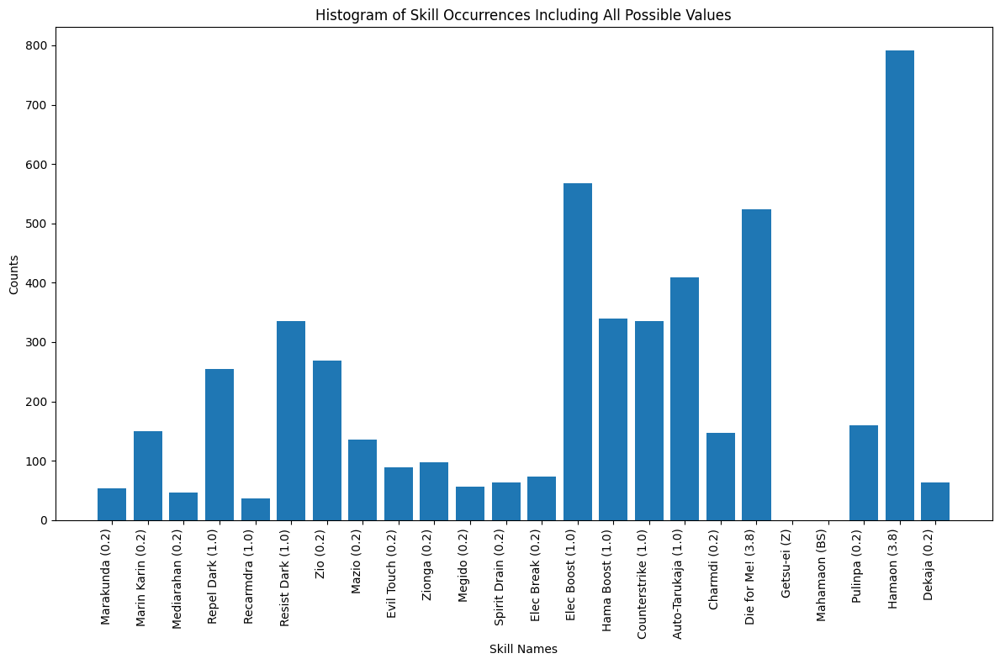

Logger_logs-LIGHT & DARK-optimal_recipes.txt_2_satan
{'Unshaken Will': 246, 'Salvation': 36, 'High Counter': 443, 'Elec Amp': 518, 'Tetrakarn': 60, 'Growth 3': 462, 'Megidola': 0, 'Spell Master': 218, 'Wind Amp': 527, 'Fire Boost': 709, 'Ice Amp': 495, 'Niflheim': 42, 'Ragnarok': 42, 'Akasha Arts': 0, 'Mind Charge': 76, 'Megidolaon': 42, 'Absorb Fire': 322, 'Wind Boost': 762}
{'Unshaken Will': 0.0492, 'Salvation': 0.0072, 'High Counter': 0.0886, 'Elec Amp': 0.1036, 'Tetrakarn': 0.012, 'Growth 3': 0.0924, 'Megidola': 0.0, 'Spell Master': 0.0436, 'Wind Amp': 0.1054, 'Fire Boost': 0.1418, 'Ice Amp': 0.099, 'Niflheim': 0.0084, 'Ragnarok': 0.0084, 'Akasha Arts': 0.0, 'Mind Charge': 0.0152, 'Megidolaon': 0.0084, 'Absorb Fire': 0.0644, 'Wind Boost': 0.1524}
Persona List:  [('asura', 'Sun'), ('skadi', 'Empress'), ('surt', 'Magician')]


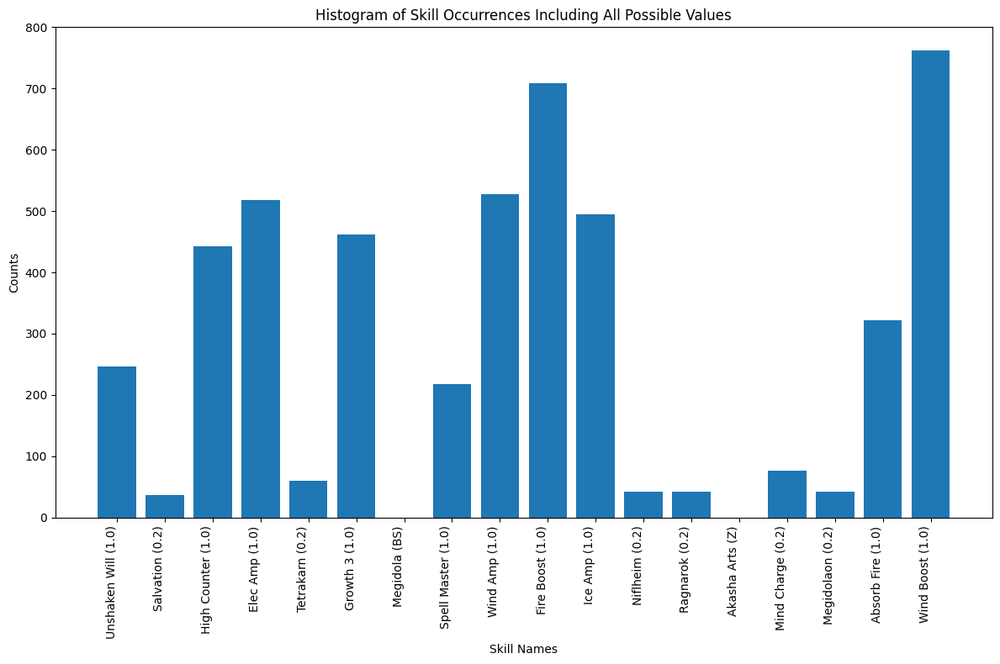

Logger_logs-LIGHT & DARK-optimal_recipes.txt_3_anubis
{'Mahama': 878, 'Ghastly Wail': 29, 'Maragidyne': 64, 'Revolution': 109, 'Null Panic': 332, 'Zan-ei': 0, 'Amrita': 60, 'Magaru': 163, 'Zio': 285, 'Elec Amp': 386, 'Hama': 961, 'Maziodyne': 52, 'Me Patra': 114, 'Mudo Boost': 374, 'Media': 112, 'Megidola': 55, 'Spell Master': 168, 'Vile Assault': 0, 'Mamudoon': 0, 'Counter': 460, 'Thunder Reign': 32, 'Bufudyne': 70, 'Null Poison': 296}
{'Mahama': 0.1756, 'Ghastly Wail': 0.0058, 'Maragidyne': 0.0128, 'Revolution': 0.0218, 'Null Panic': 0.0664, 'Zan-ei': 0.0, 'Amrita': 0.012, 'Magaru': 0.0326, 'Zio': 0.057, 'Elec Amp': 0.0772, 'Hama': 0.1922, 'Maziodyne': 0.0104, 'Me Patra': 0.0228, 'Mudo Boost': 0.0748, 'Media': 0.0224, 'Megidola': 0.011, 'Spell Master': 0.0336, 'Vile Assault': 0.0, 'Mamudoon': 0.0, 'Counter': 0.092, 'Thunder Reign': 0.0064, 'Bufudyne': 0.014, 'Null Poison': 0.0592}
Persona List:  [('baal zebul', 'Moon'), ('odin', 'Emperor'), ('power', 'Justice')]


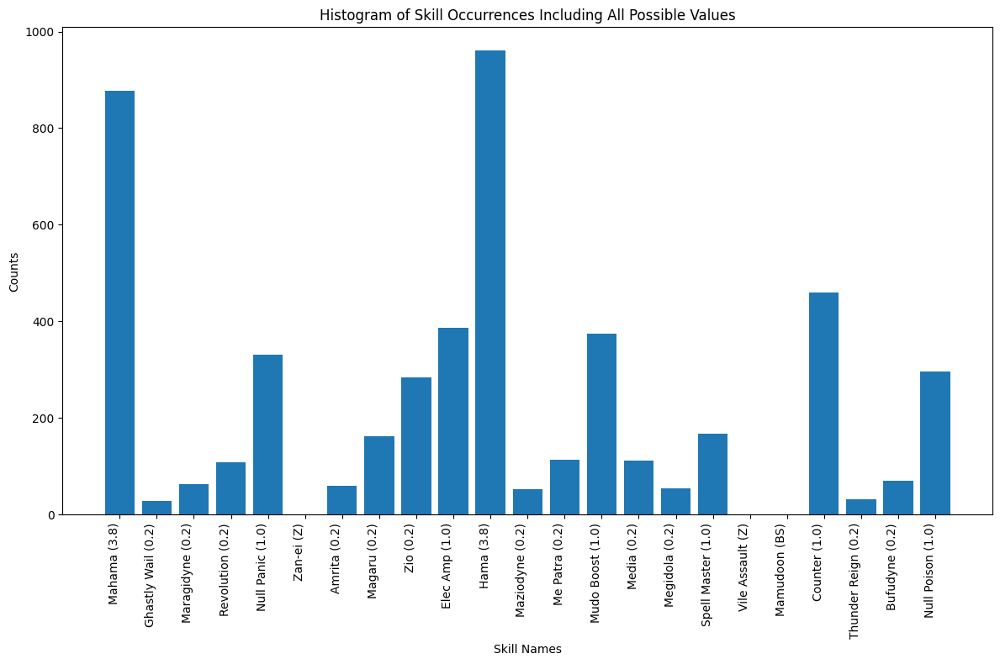

Logger_logs-LIGHT & DARK-optimal_recipes.txt_4_anubis
{'Virus Breath': 63, 'Primal Force': 0, 'Rebellion': 153, 'Bufu': 273, 'Magarudyne': 51, 'Maragi': 134, 'Zio': 280, 'Magaru': 140, 'Kill Rush': 0, 'Mudoon': 744, 'Maziodyne': 38, 'Provoke': 159, 'Wind Boost': 538, 'Rakukaja': 137, 'High Counter': 258, 'Makarakarn': 31, 'Dodge Wind': 421, 'Garu': 263, 'Tentarafoo': 62, 'Foul Breath': 130, 'Power Charge': 63, 'Dekaja': 62}
{'Virus Breath': 0.01575, 'Primal Force': 0.0, 'Rebellion': 0.03825, 'Bufu': 0.06825, 'Magarudyne': 0.01275, 'Maragi': 0.0335, 'Zio': 0.07, 'Magaru': 0.035, 'Kill Rush': 0.0, 'Mudoon': 0.186, 'Maziodyne': 0.0095, 'Provoke': 0.03975, 'Wind Boost': 0.1345, 'Rakukaja': 0.03425, 'High Counter': 0.0645, 'Makarakarn': 0.00775, 'Dodge Wind': 0.10525, 'Garu': 0.06575, 'Tentarafoo': 0.0155, 'Foul Breath': 0.0325, 'Power Charge': 0.01575, 'Dekaja': 0.0155}
Persona List:  [('beelzebub', 'Devil'), ('vetala', 'Devil'), ('fortuna', 'Fortune')]


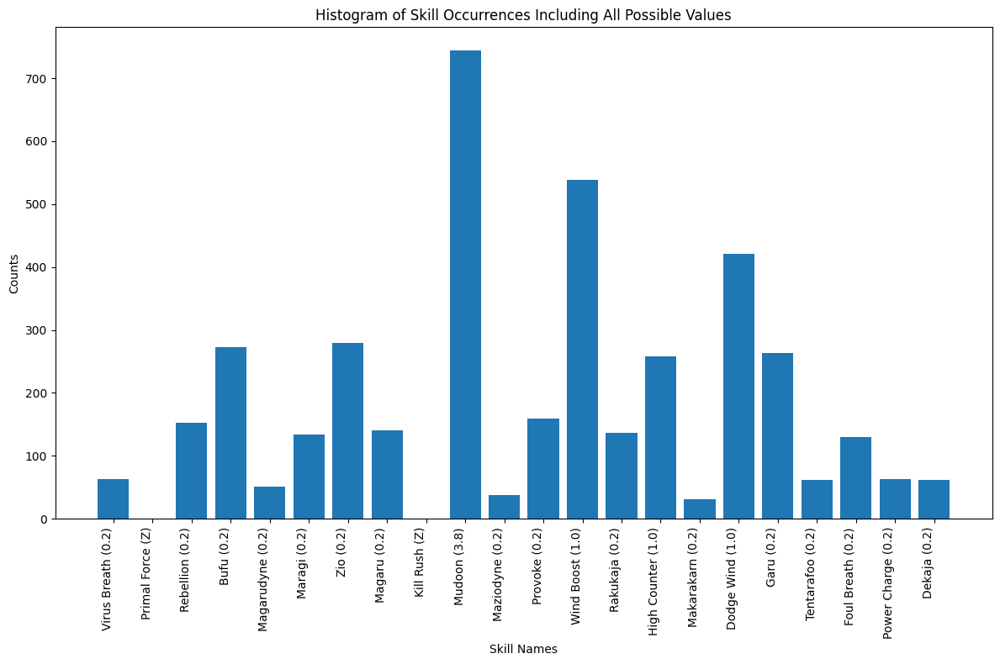

Logger_logs-LIGHT & DARK-optimal_recipes.txt_5_satan
{'Maralagidyne': 0, 'Poison Arrow': 0, 'Repel Light': 381, 'Wind Amp': 532, 'Fatal End': 0, 'Me Patra': 193, 'Tarukaja': 282, 'Salvation': 37, 'Victory Cry': 249, 'High Counter': 476, 'Mazionga': 138, 'Primal Force': 0, 'Spell Master': 288, 'Torrent Shot': 0, 'Matarukaja': 118, 'Morning Star': 72, 'Mind Charge': 121, 'Auto-Tarukaja': 667, 'Absorb Slash': 333, 'Zan-ei': 0, 'Power Charge': 113}
{'Maralagidyne': 0.0, 'Poison Arrow': 0.0, 'Repel Light': 0.09525, 'Wind Amp': 0.133, 'Fatal End': 0.0, 'Me Patra': 0.04825, 'Tarukaja': 0.0705, 'Salvation': 0.00925, 'Victory Cry': 0.06225, 'High Counter': 0.119, 'Mazionga': 0.0345, 'Primal Force': 0.0, 'Spell Master': 0.072, 'Torrent Shot': 0.0, 'Matarukaja': 0.0295, 'Morning Star': 0.018, 'Mind Charge': 0.03025, 'Auto-Tarukaja': 0.16675, 'Absorb Slash': 0.08325, 'Zan-ei': 0.0, 'Power Charge': 0.02825}
Persona List:  [('helel', 'Star'), ('mara', 'Tower'), ('cu chulainn', 'Tower')]


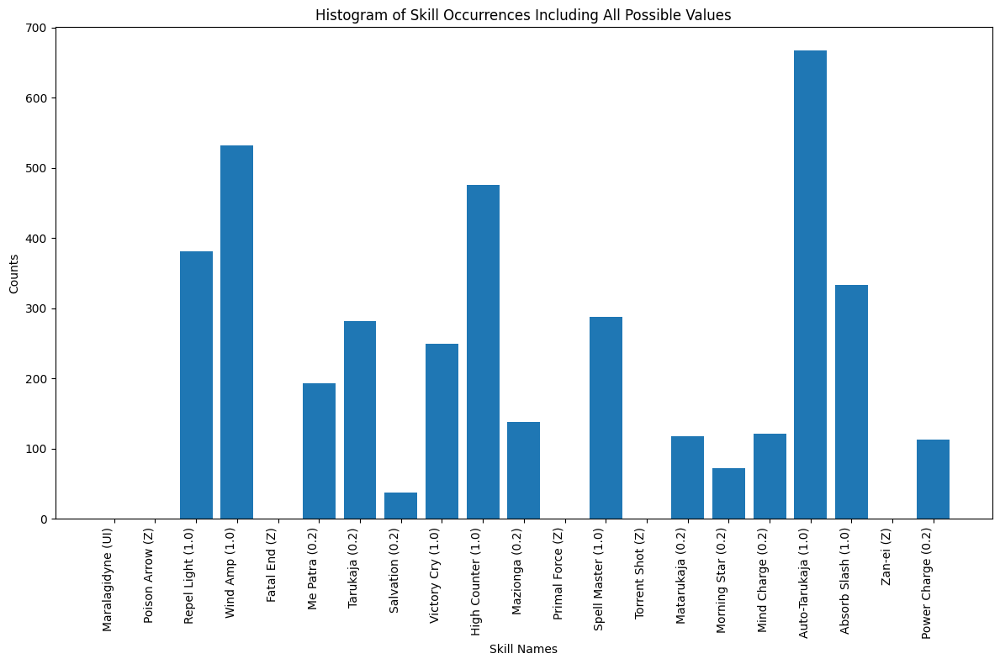

Logger_logs-LIGHT & DARK-optimal_recipes.txt_6_satan
{'Amrita': 52, 'Auto-Mataru': 247, 'Mahamaon': 745, 'Virus Breath': 63, "God's Hand": 0, 'Resist Fire': 312, 'Apt Pupil': 275, 'Wind Amp': 356, 'Null Dark': 303, 'Ice Break': 74, 'Bufudyne': 63, 'Megidolaon': 28, 'Mabufula': 85, 'Stagnant Air': 99, 'Mamudoon': 734, 'Wind Boost': 564}
{'Amrita': 0.013, 'Auto-Mataru': 0.06175, 'Mahamaon': 0.18625, 'Virus Breath': 0.01575, "God's Hand": 0.0, 'Resist Fire': 0.078, 'Apt Pupil': 0.06875, 'Wind Amp': 0.089, 'Null Dark': 0.07575, 'Ice Break': 0.0185, 'Bufudyne': 0.01575, 'Megidolaon': 0.007, 'Mabufula': 0.02125, 'Stagnant Air': 0.02475, 'Mamudoon': 0.1835, 'Wind Boost': 0.141}
Persona List:  [('metatron', 'Aeon'), ('nidhoggr', 'Aeon'), ('laksmi', 'Empress')]


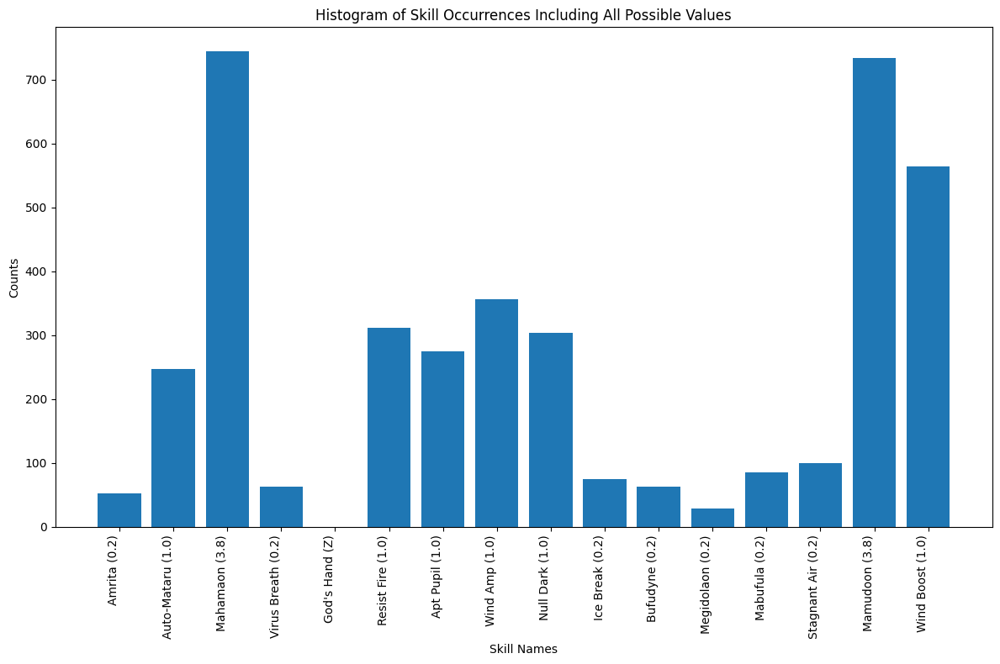

Logger_logs-LIGHT & DARK-optimal_recipes.txt_7_anubis
{'Ghastly Wail': 41, 'Rakukaja': 170, 'Garula': 108, 'Bewilder': 301, 'Null Fear': 334, 'Magarula': 73, 'Evil Smile': 78, 'Trafuri': 182, 'Mudoon': 831, 'Wind Amp': 380, 'Agi': 304, 'Double Fangs': 0, 'Cleave': 0, 'Sharp Student': 463, 'Wind Break': 68, 'Panta Rhei': 31, 'Wind Boost': 636}
{'Ghastly Wail': 0.01025, 'Rakukaja': 0.0425, 'Garula': 0.027, 'Bewilder': 0.07525, 'Null Fear': 0.0835, 'Magarula': 0.01825, 'Evil Smile': 0.0195, 'Trafuri': 0.0455, 'Mudoon': 0.20775, 'Wind Amp': 0.095, 'Agi': 0.076, 'Double Fangs': 0.0, 'Cleave': 0.0, 'Sharp Student': 0.11575, 'Wind Break': 0.017, 'Panta Rhei': 0.00775, 'Wind Boost': 0.159}
Persona List:  [('mot', 'Death'), ('orobas', 'Magician'), ('chimera', 'Chariot')]


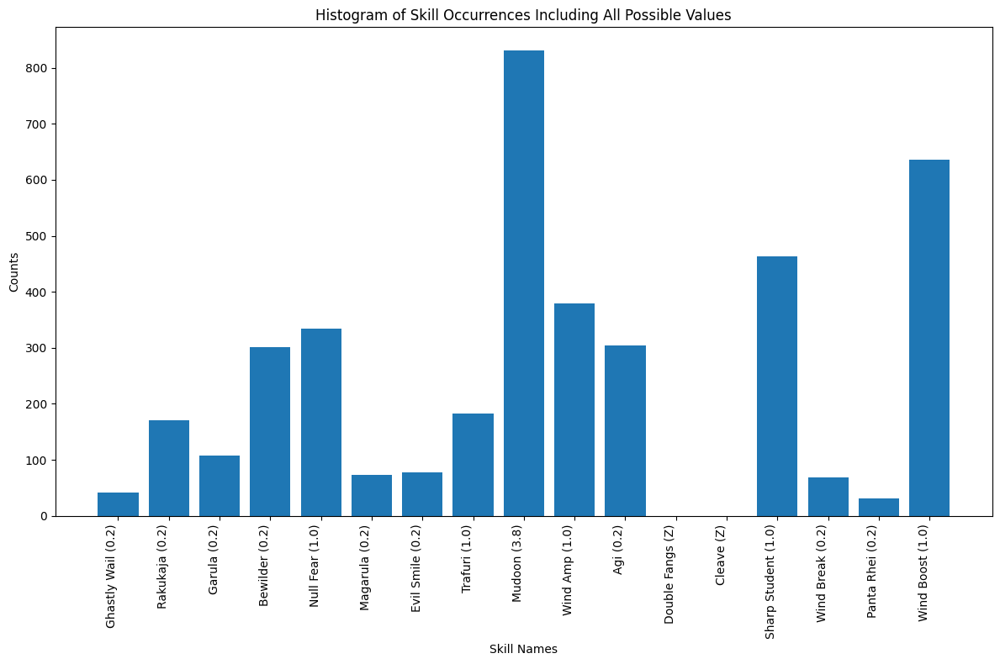

Logger_logs-LIGHT & DARK-optimal_recipes.txt_8_anubis
{'Garudyne': 52, 'Agidyne': 46, 'Wind Amp': 262, 'Mamudo': 798, 'Zan-ei': 0, 'Magarudyne': 35, 'Mudo': 881, 'Apt Pupil': 234, 'Sukunda': 119, 'Mabufudyne': 33, 'Me Patra': 68, 'Raging Tiger': 720, 'Resist Strike': 213, 'Dekunda': 83, 'Bufula': 80, 'Agilao': 70, 'Fire Boost': 458, 'Mediarama': 41, 'Auto-Rakukaja': 332, 'Counter': 323, 'Diarahan': 47, 'Matarukaja': 42, 'Maragion': 63, 'Mighty Swing': 0}
{'Garudyne': 0.0104, 'Agidyne': 0.0092, 'Wind Amp': 0.0524, 'Mamudo': 0.1596, 'Zan-ei': 0.0, 'Magarudyne': 0.007, 'Mudo': 0.1762, 'Apt Pupil': 0.0468, 'Sukunda': 0.0238, 'Mabufudyne': 0.0066, 'Me Patra': 0.0136, 'Raging Tiger': 0.144, 'Resist Strike': 0.0426, 'Dekunda': 0.0166, 'Bufula': 0.016, 'Agilao': 0.014, 'Fire Boost': 0.0916, 'Mediarama': 0.0082, 'Auto-Rakukaja': 0.0664, 'Counter': 0.0646, 'Diarahan': 0.0094, 'Matarukaja': 0.0084, 'Maragion': 0.0126, 'Mighty Swing': 0.0}
Persona List:  [('suparna', 'Sun'), ('okuninushi', 'Temper

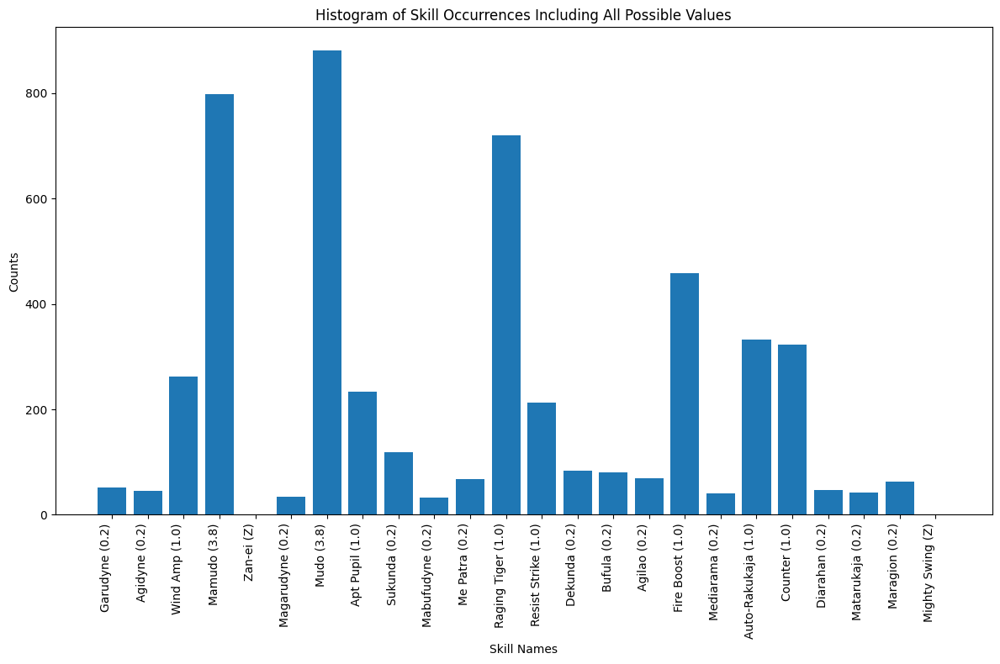

Logger_logs-LIGHT & DARK-optimal_recipes.txt_9_anubis
{'Tarukaja': 207, 'Patra': 365, 'Samsara': 645, "God's Hand": 0, 'Swift Strike': 0, 'Dekaja': 73, 'Mind Charge': 87, 'Sukukaja': 190, 'Null Fear': 372, 'Kill Rush': 0, 'Akasha Arts': 0, 'Megido': 52, 'Recarm': 93, 'Null Dark': 341, 'Auto-Rakukaja': 520, 'Mabufu': 189, 'Salvation': 41, 'Counter': 528, 'Growth 3': 423, 'Diarahan': 86, 'Ziodyne': 90, 'Ice Boost': 698}
{'Tarukaja': 0.0414, 'Patra': 0.073, 'Samsara': 0.129, "God's Hand": 0.0, 'Swift Strike': 0.0, 'Dekaja': 0.0146, 'Mind Charge': 0.0174, 'Sukukaja': 0.038, 'Null Fear': 0.0744, 'Kill Rush': 0.0, 'Akasha Arts': 0.0, 'Megido': 0.0104, 'Recarm': 0.0186, 'Null Dark': 0.0682, 'Auto-Rakukaja': 0.104, 'Mabufu': 0.0378, 'Salvation': 0.0082, 'Counter': 0.1056, 'Growth 3': 0.0846, 'Diarahan': 0.0172, 'Ziodyne': 0.018, 'Ice Boost': 0.1396}
Persona List:  [('vishnu', 'Sun'), ('daisoujou', 'Hierophant'), ('yamatano-orochi', 'Moon')]


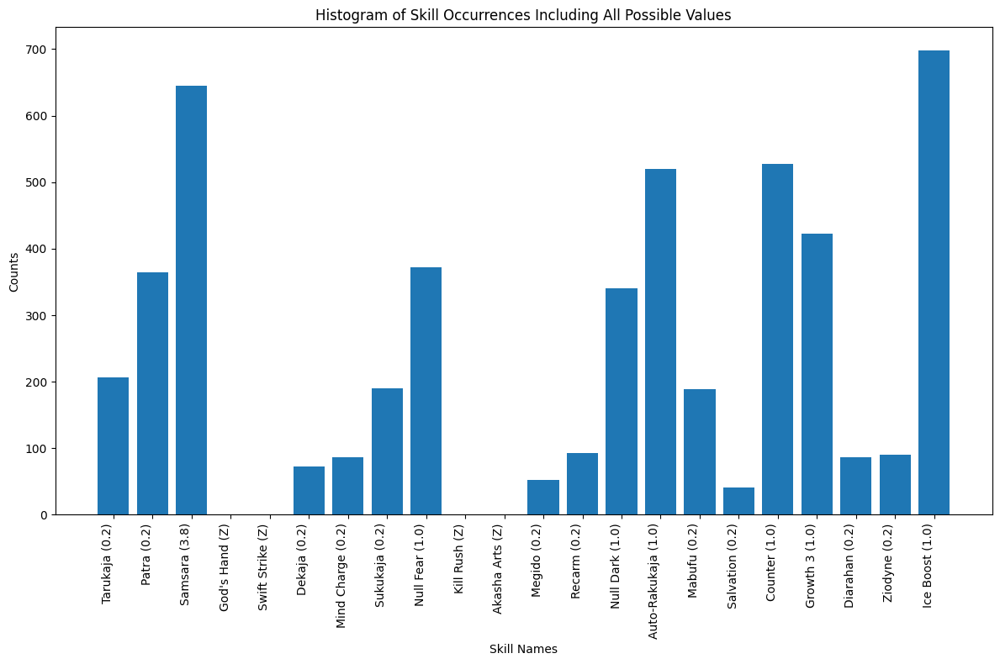

Logger_logs-RECOVERY-optimal_recipes.txt_1_kingu
{'Diarahan': 492, 'Growth 3': 88, 'Cleave': 0, 'Marakunda': 354, 'Auto-Sukukaja': 140, 'Die for Me!': 0, 'Power Slash': 0, 'Auto-Tarukaja': 139, 'Dodge Slash': 139, 'Samsara': 8, 'Repel Dark': 50, 'Bash': 0, 'Zio': 350, 'Sukukaja': 565, 'Evil Touch': 28, 'Megido': 62, 'Null Dark': 84, 'Spirit Drain': 115, 'Patra': 953, 'Marin Karin': 44, 'Recarm': 597, 'Tarukaja': 621, 'Mabufu': 171}
{'Diarahan': 0.0984, 'Growth 3': 0.0176, 'Cleave': 0.0, 'Marakunda': 0.0708, 'Auto-Sukukaja': 0.028, 'Die for Me!': 0.0, 'Power Slash': 0.0, 'Auto-Tarukaja': 0.0278, 'Dodge Slash': 0.0278, 'Samsara': 0.0016, 'Repel Dark': 0.01, 'Bash': 0.0, 'Zio': 0.07, 'Sukukaja': 0.113, 'Evil Touch': 0.0056, 'Megido': 0.0124, 'Null Dark': 0.0168, 'Spirit Drain': 0.023, 'Patra': 0.1906, 'Marin Karin': 0.0088, 'Recarm': 0.1194, 'Tarukaja': 0.1242, 'Mabufu': 0.0342}
Persona List:  [('alice', 'Death'), ('daisoujou', 'Hierophant'), ('valkyrie', 'Strength')]


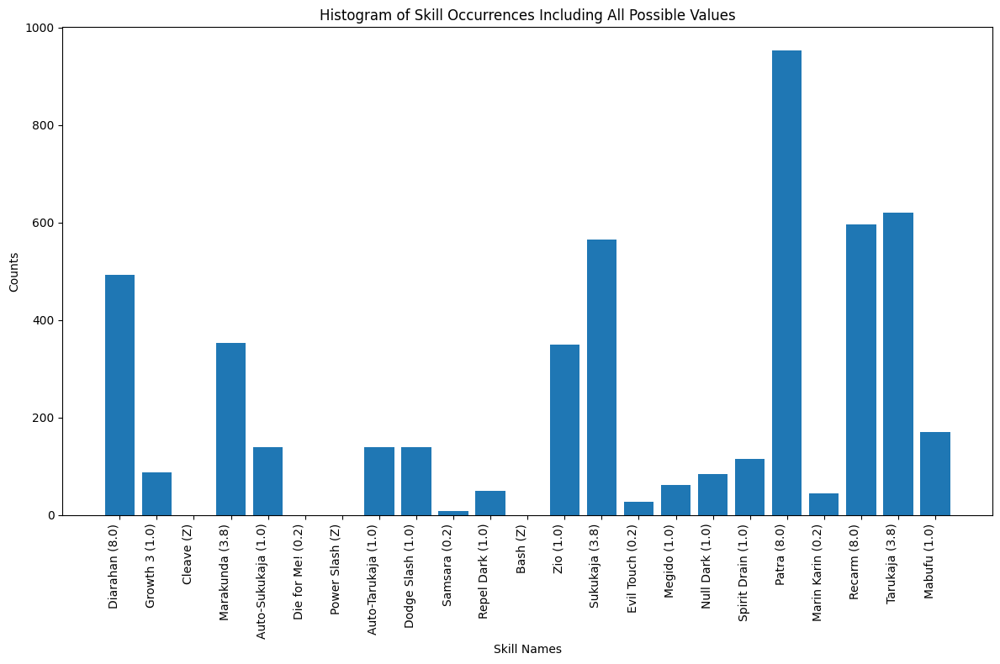

Logger_logs-RECOVERY-optimal_recipes.txt_2_titania
{'Mighty Swing': 0, 'Rakukaja': 454, 'Mazionga': 65, 'Diarama': 574, 'Mind Charge': 0, 'Agidyne': 56, 'Dekunda': 336, 'Matarukaja': 212, 'Apt Pupil': 59, 'Bufula': 108, 'Zan-ei': 0, 'Resist Strike': 63, 'Maragion': 73, 'Fire Boost': 149, 'Auto-Rakukaja': 127, 'Sukukaja': 470, 'Me Patra': 564, 'Mamudo': 0, 'Agilao': 98, 'Sukunda': 450, 'Wind Boost': 142, 'Mudo': 0}
{'Mighty Swing': 0.0, 'Rakukaja': 0.1135, 'Mazionga': 0.01625, 'Diarama': 0.1435, 'Mind Charge': 0.0, 'Agidyne': 0.014, 'Dekunda': 0.084, 'Matarukaja': 0.053, 'Apt Pupil': 0.01475, 'Bufula': 0.027, 'Zan-ei': 0.0, 'Resist Strike': 0.01575, 'Maragion': 0.01825, 'Fire Boost': 0.03725, 'Auto-Rakukaja': 0.03175, 'Sukukaja': 0.1175, 'Me Patra': 0.141, 'Mamudo': 0.0, 'Agilao': 0.0245, 'Sukunda': 0.1125, 'Wind Boost': 0.0355, 'Mudo': 0.0}
Persona List:  [('dionysus', 'Moon'), ('okuninushi', 'Temperance'), ('genbu', 'Temperance')]


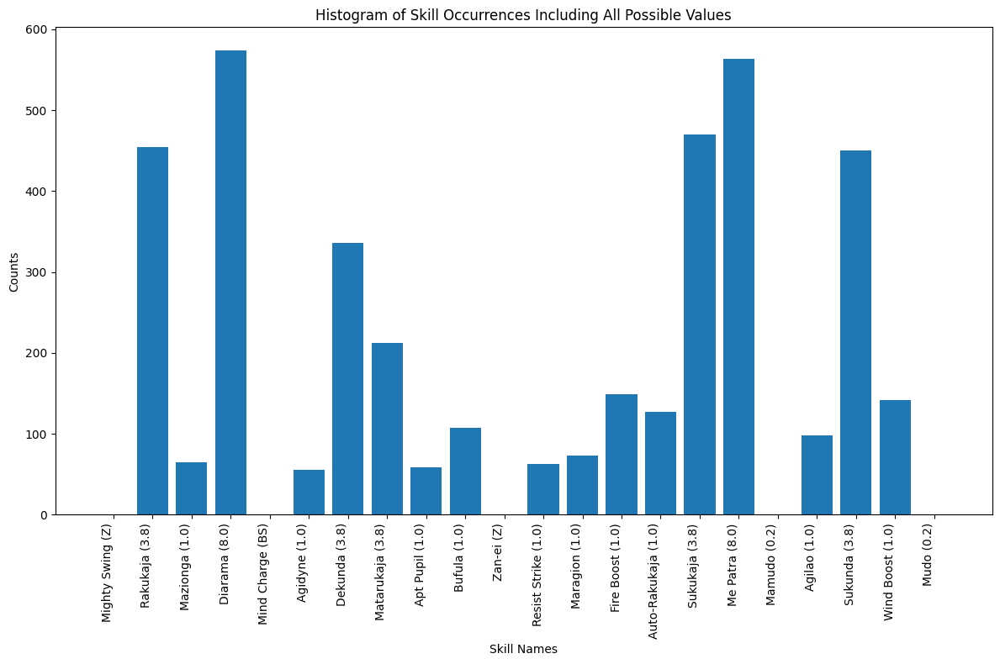

Logger_logs-RECOVERY-optimal_recipes.txt_3_hariti
{'High Counter': 105, 'Salvation': 382, 'Myriad Arrows': 0, 'Magaru': 201, 'Bow Master': 92, 'Rakukaja': 622, 'Mind Charge': 295, 'Spell Master': 52, 'Megidolaon': 61, 'Samarecarm': 545, 'Garu': 432, 'Absorb Slash': 67, 'Auto-Maraku': 71, 'Null Charm': 86, 'Ziodyne': 97, 'Bufu': 404, 'Dodge Wind': 161, 'Primal Force': 0, 'Morning Star': 48, 'Wind Boost': 226, 'Victory Cry': 53}
{'High Counter': 0.02625, 'Salvation': 0.0955, 'Myriad Arrows': 0.0, 'Magaru': 0.05025, 'Bow Master': 0.023, 'Rakukaja': 0.1555, 'Mind Charge': 0.07375, 'Spell Master': 0.013, 'Megidolaon': 0.01525, 'Samarecarm': 0.13625, 'Garu': 0.108, 'Absorb Slash': 0.01675, 'Auto-Maraku': 0.01775, 'Null Charm': 0.0215, 'Ziodyne': 0.02425, 'Bufu': 0.101, 'Dodge Wind': 0.04025, 'Primal Force': 0.0, 'Morning Star': 0.012, 'Wind Boost': 0.0565, 'Victory Cry': 0.01325}
Persona List:  [('helel', 'Star'), ('cybele', 'Lovers'), ('fortuna', 'Fortune')]


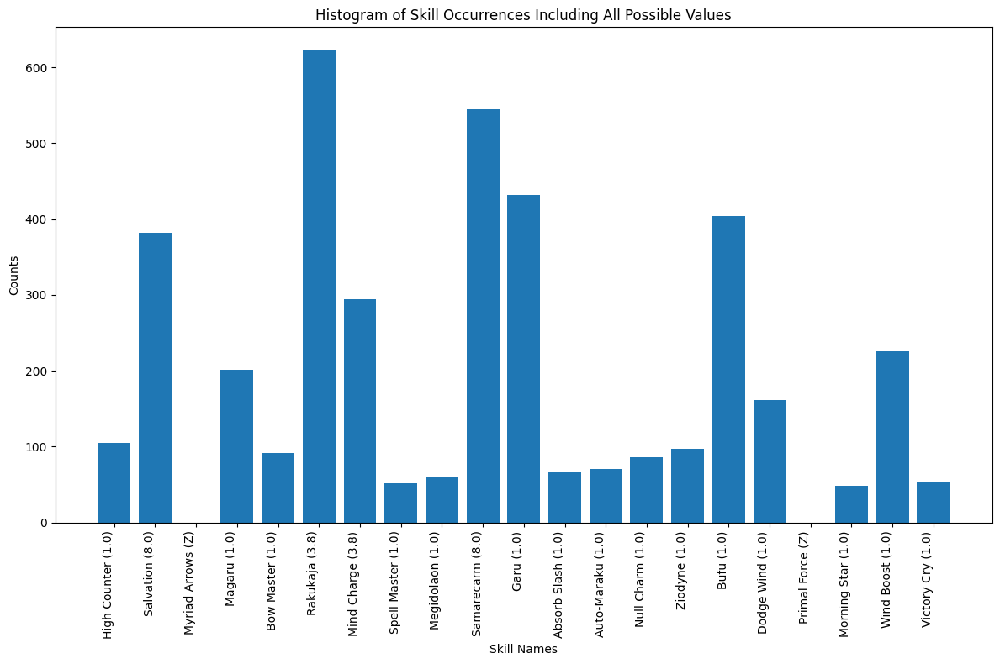

Logger_logs-RECOVERY-optimal_recipes.txt_4_titania
{'Ice Break': 294, 'Panta Rhei': 31, 'Resist Fire': 86, 'Rebellion': 519, 'Rakukaja': 510, 'Sharp Student': 127, 'Maragi': 171, 'Trafuri': 37, 'Wind Break': 327, 'Mabufula': 88, 'Bufudyne': 64, 'Dekaja': 264, 'Garula': 121, 'Wind Amp': 93, 'Zio': 344, 'Kill Rush': 0, 'Foul Breath': 183, 'Provoke': 33, 'Null Dark': 78, 'Tentarafoo': 21, 'Amrita': 424, 'Wind Boost': 185}
{'Ice Break': 0.0735, 'Panta Rhei': 0.00775, 'Resist Fire': 0.0215, 'Rebellion': 0.12975, 'Rakukaja': 0.1275, 'Sharp Student': 0.03175, 'Maragi': 0.04275, 'Trafuri': 0.00925, 'Wind Break': 0.08175, 'Mabufula': 0.022, 'Bufudyne': 0.016, 'Dekaja': 0.066, 'Garula': 0.03025, 'Wind Amp': 0.02325, 'Zio': 0.086, 'Kill Rush': 0.0, 'Foul Breath': 0.04575, 'Provoke': 0.00825, 'Null Dark': 0.0195, 'Tentarafoo': 0.00525, 'Amrita': 0.106, 'Wind Boost': 0.04625}
Persona List:  [('laksmi', 'Empress'), ('orobas', 'Magician'), ('vetala', 'Devil')]


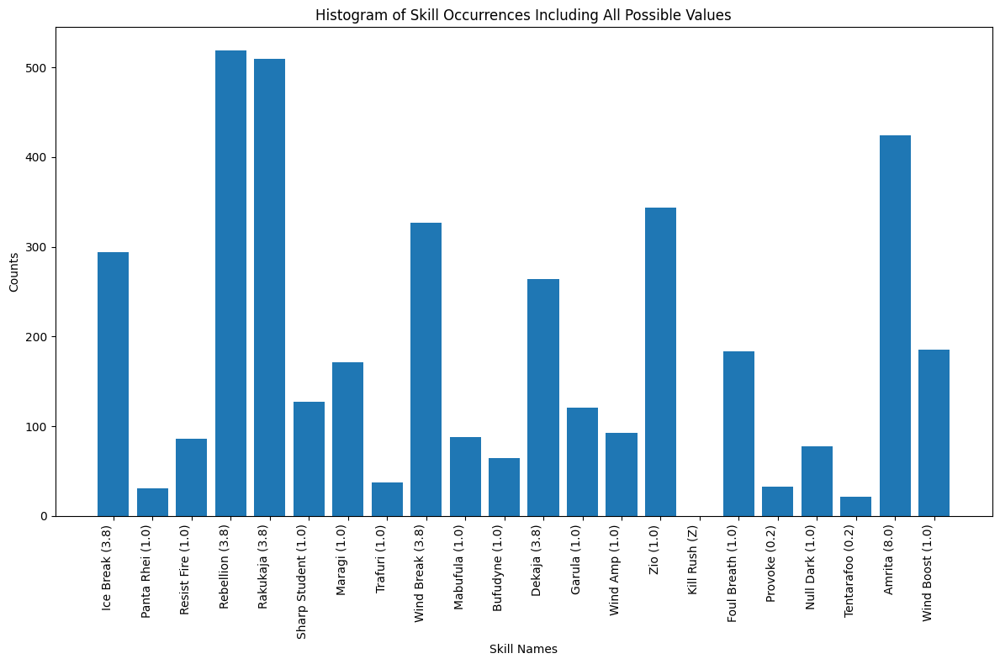

Logger_logs-RECOVERY-optimal_recipes.txt_5_hariti
{'Panta Rhei': 126, 'Stagnant Air': 321, 'Maragidyne': 146, 'Evil Smile': 56, 'Magarula': 221, 'Double Fangs': 0, 'Null Fire': 182, 'Maragi': 419, 'Dodge Slash': 260, 'Apt Pupil': 207, 'Enradi': 972, 'Bufudyne': 0, 'Mudoon': 0, 'Mabufudyne': 142, 'Rakunda': 854, 'Wind Amp': 229, 'Makarakarn': 438, 'Bash': 0, 'Megidola': 150, 'Sexy Dance': 69, 'Null Fear': 190, 'Ghastly Wail': 18, 'Mudo': 0}
{'Panta Rhei': 0.0252, 'Stagnant Air': 0.0642, 'Maragidyne': 0.0292, 'Evil Smile': 0.0112, 'Magarula': 0.0442, 'Double Fangs': 0.0, 'Null Fire': 0.0364, 'Maragi': 0.0838, 'Dodge Slash': 0.052, 'Apt Pupil': 0.0414, 'Enradi': 0.1944, 'Bufudyne': 0.0, 'Mudoon': 0.0, 'Mabufudyne': 0.0284, 'Rakunda': 0.1708, 'Wind Amp': 0.0458, 'Makarakarn': 0.0876, 'Bash': 0.0, 'Megidola': 0.03, 'Sexy Dance': 0.0138, 'Null Fear': 0.038, 'Ghastly Wail': 0.0036, 'Mudo': 0.0}
Persona List:  [('lilith', 'Devil'), ('loki', 'Fool'), ('mot', 'Death')]


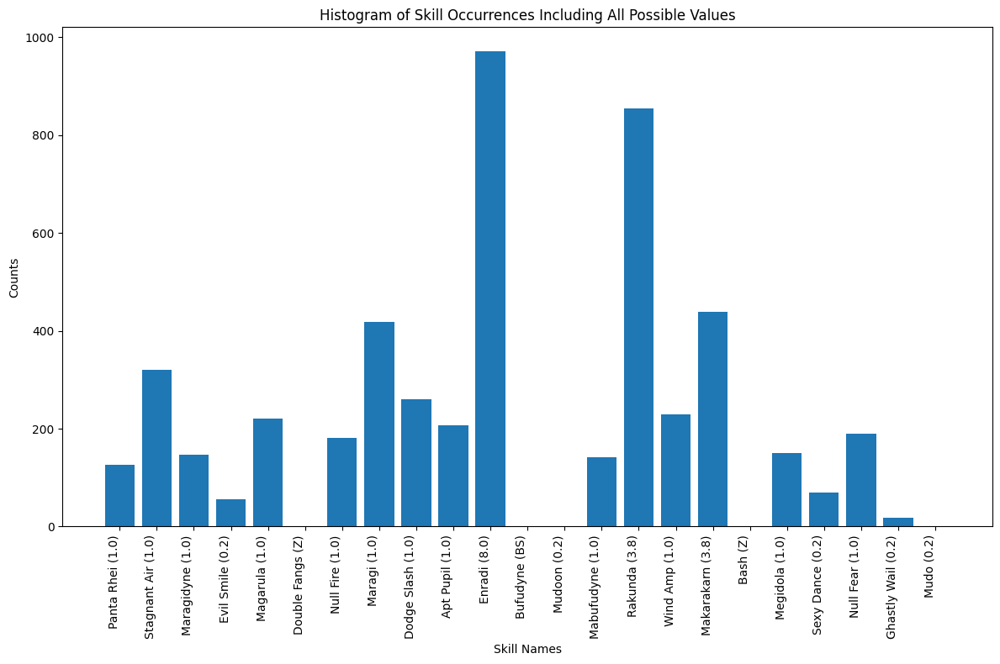

Logger_logs-RECOVERY-optimal_recipes.txt_6_titania
{'Me Patra': 628, 'Mahama': 28, 'Virus Breath': 17, 'Mazio': 175, 'Charmdi': 777, 'Getsu-ei': 0, 'Magaru': 187, 'Auto-Tarukaja': 141, 'Elec Boost': 169, 'Media': 665, 'Zio': 322, 'Revolution': 391, 'Pulinpa': 31, 'Elec Break': 310, 'Zionga': 131, 'Hama': 28, 'Zan-ei': 0, 'Mamudoon': 0}
{'Me Patra': 0.157, 'Mahama': 0.007, 'Virus Breath': 0.00425, 'Mazio': 0.04375, 'Charmdi': 0.19425, 'Getsu-ei': 0.0, 'Magaru': 0.04675, 'Auto-Tarukaja': 0.03525, 'Elec Boost': 0.04225, 'Media': 0.16625, 'Zio': 0.0805, 'Revolution': 0.09775, 'Pulinpa': 0.00775, 'Elec Break': 0.0775, 'Zionga': 0.03275, 'Hama': 0.007, 'Zan-ei': 0.0, 'Mamudoon': 0.0}
Persona List:  [('nidhoggr', 'Aeon'), ('power', 'Justice'), ('take-mikazuchi', 'Emperor')]


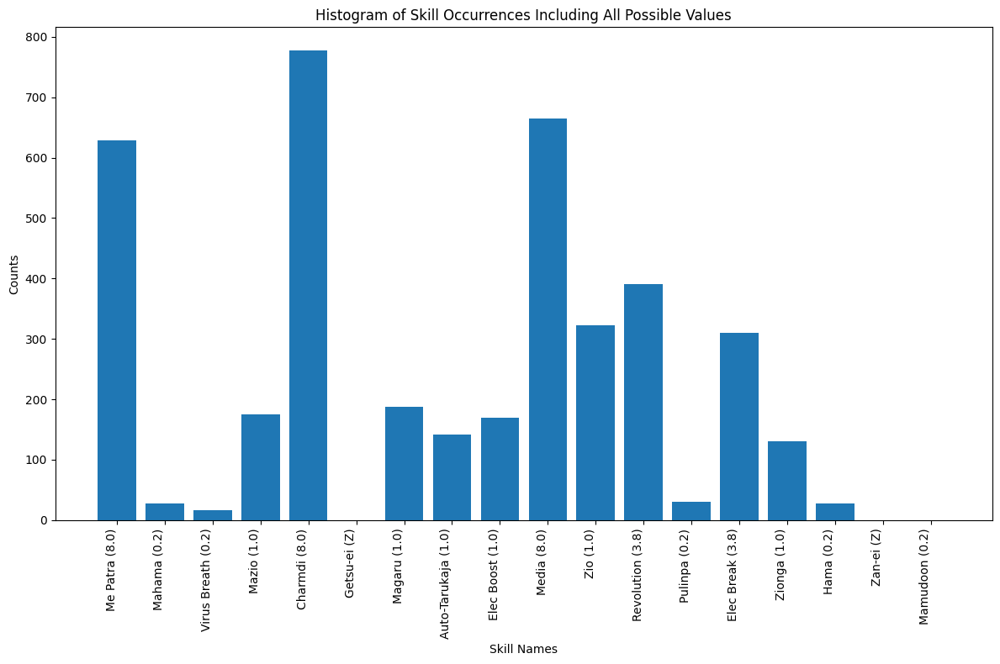

Logger_logs-RECOVERY-optimal_recipes.txt_7_cybele
{'High Counter': 192, 'Salvation': 608, 'Vile Assault': 0, 'Niflheim': 105, 'Maziodyne': 152, 'Ice Amp': 231, 'Absorb Fire': 135, 'Mind Charge': 550, 'Spell Master': 107, 'Wind Amp': 226, 'Fire Boost': 399, 'Null Panic': 171, 'Megidola': 144, 'Elec Amp': 228, 'Unshaken Will': 114, 'Counter': 274, 'Ragnarok': 103, 'Thunder Reign': 93, 'Amrita': 759, 'Wind Boost': 409}
{'High Counter': 0.0384, 'Salvation': 0.1216, 'Vile Assault': 0.0, 'Niflheim': 0.021, 'Maziodyne': 0.0304, 'Ice Amp': 0.0462, 'Absorb Fire': 0.027, 'Mind Charge': 0.11, 'Spell Master': 0.0214, 'Wind Amp': 0.0452, 'Fire Boost': 0.0798, 'Null Panic': 0.0342, 'Megidola': 0.0288, 'Elec Amp': 0.0456, 'Unshaken Will': 0.0228, 'Counter': 0.0548, 'Ragnarok': 0.0206, 'Thunder Reign': 0.0186, 'Amrita': 0.1518, 'Wind Boost': 0.0818}
Persona List:  [('skadi', 'Empress'), ('odin', 'Emperor'), ('surt', 'Magician')]


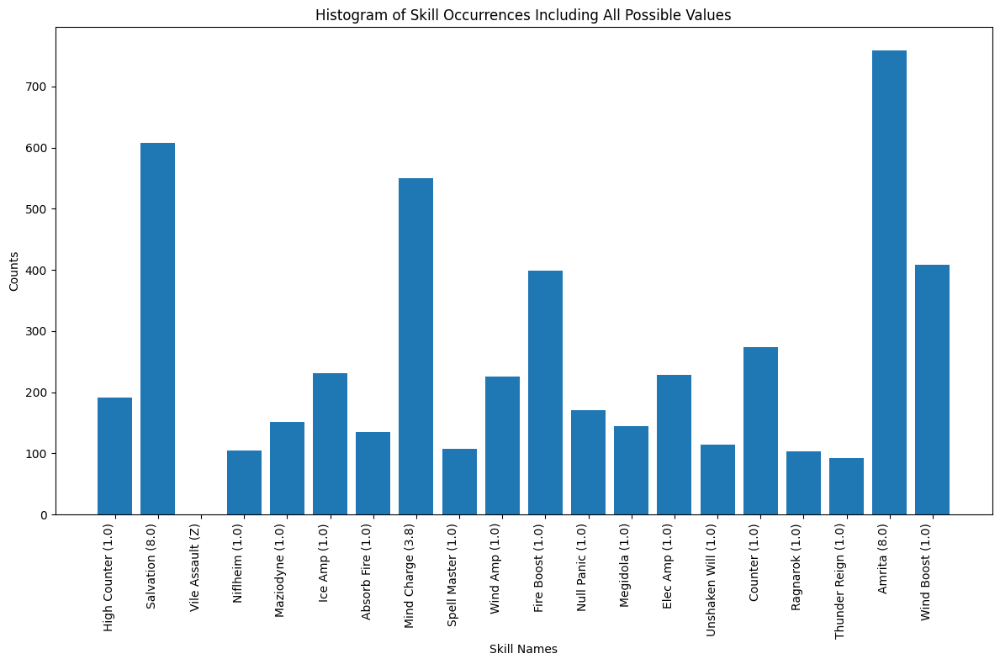

Logger_logs-RECOVERY-optimal_recipes.txt_8_titania
{'Bewilder': 109, 'Counterstrike': 144, 'Hamaon': 29, 'Hama Boost': 122, 'Raging Tiger': 475, 'Diarahan': 607, 'Cleave': 0, 'Garudyne': 105, 'Resist Dark': 144, 'Mabufudyne': 85, 'Dekaja': 357, 'Wind Amp': 129, 'Mediarahan': 483, 'Mediarama': 0, 'Agi': 472, 'Magarudyne': 80, 'Mahamaon': 22, 'Counter': 166, 'Recarmdra': 471}
{'Bewilder': 0.02725, 'Counterstrike': 0.036, 'Hamaon': 0.00725, 'Hama Boost': 0.0305, 'Raging Tiger': 0.11875, 'Diarahan': 0.15175, 'Cleave': 0.0, 'Garudyne': 0.02625, 'Resist Dark': 0.036, 'Mabufudyne': 0.02125, 'Dekaja': 0.08925, 'Wind Amp': 0.03225, 'Mediarahan': 0.12075, 'Mediarama': 0.0, 'Agi': 0.118, 'Magarudyne': 0.02, 'Mahamaon': 0.0055, 'Counter': 0.0415, 'Recarmdra': 0.11775}
Persona List:  [('suparna', 'Sun'), ('throne', 'Justice'), ('chimera', 'Chariot')]


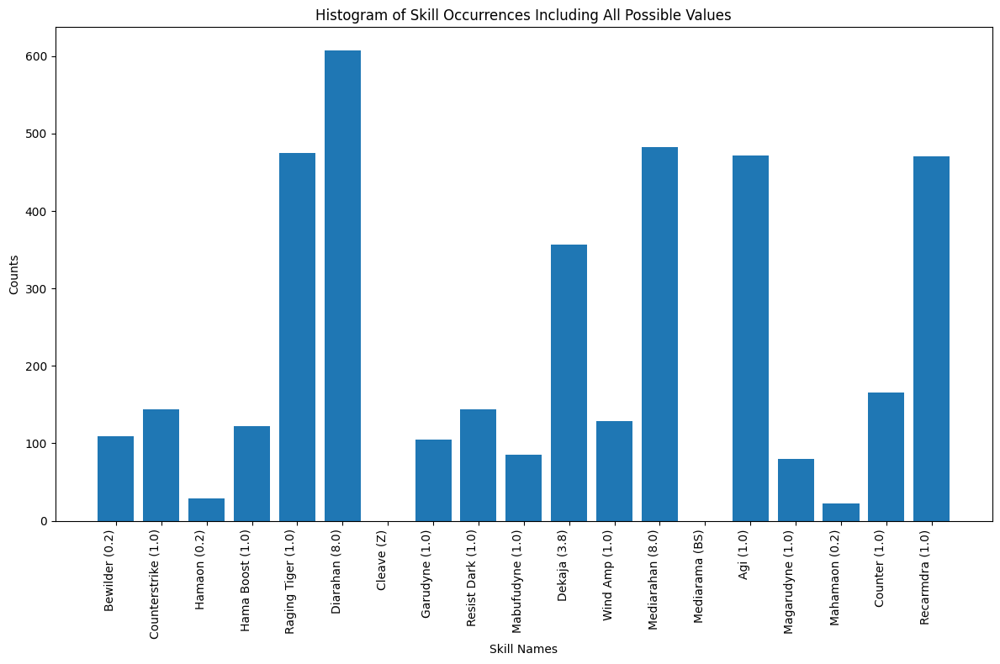

Logger_logs-BAD STATUS-optimal_recipes.txt_1_pazuzu
{'Charmdi': 0, 'Zionga': 64, 'Apt Pupil': 184, 'Mighty Swing': 0, 'Getsu-ei': 0, 'Mazio': 97, 'Repel Dark': 135, 'Die for Me!': 105, 'Megido': 24, 'Spirit Drain': 39, 'Marin Karin': 837, 'Zan-ei': 0, 'Maragion': 37, 'Pulinpa': 842, 'Fire Boost': 411, 'Auto-Tarukaja': 267, 'Agilao': 63, 'Zio': 159, 'Marakunda': 202, 'Elec Break': 200, 'Matarukaja': 184, 'Evil Touch': 714, 'Agidyne': 39, 'Elec Boost': 397}
{'Charmdi': 0.0, 'Zionga': 0.0128, 'Apt Pupil': 0.0368, 'Mighty Swing': 0.0, 'Getsu-ei': 0.0, 'Mazio': 0.0194, 'Repel Dark': 0.027, 'Die for Me!': 0.021, 'Megido': 0.0048, 'Spirit Drain': 0.0078, 'Marin Karin': 0.1674, 'Zan-ei': 0.0, 'Maragion': 0.0074, 'Pulinpa': 0.1684, 'Fire Boost': 0.0822, 'Auto-Tarukaja': 0.0534, 'Agilao': 0.0126, 'Zio': 0.0318, 'Marakunda': 0.0404, 'Elec Break': 0.04, 'Matarukaja': 0.0368, 'Evil Touch': 0.1428, 'Agidyne': 0.0078, 'Elec Boost': 0.0794}
Persona List:  [('alice', 'Death'), ('okuninushi', 'Temperanc

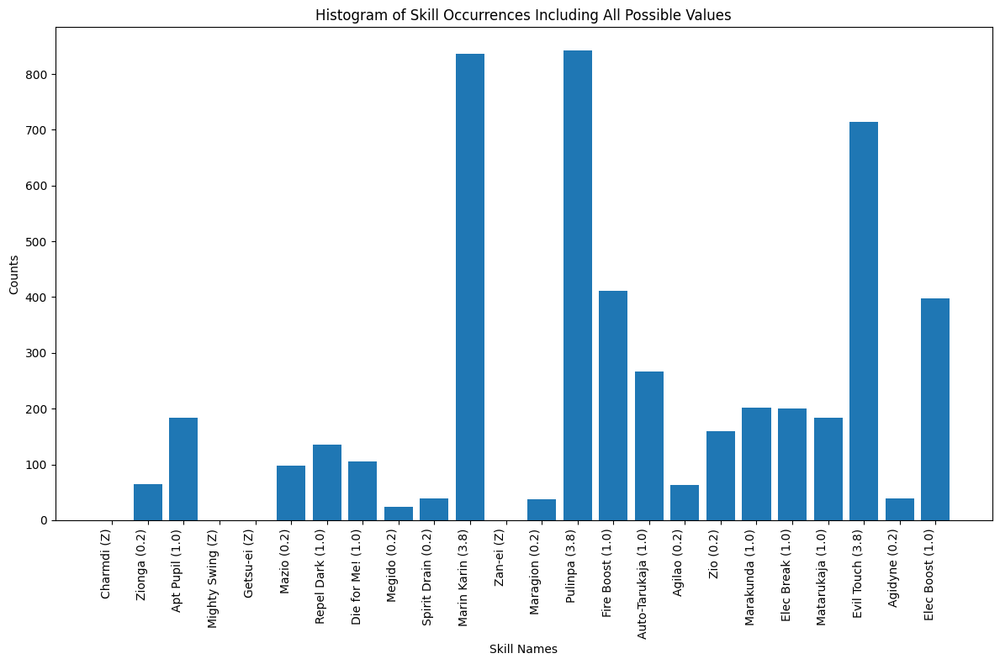

Logger_logs-BAD STATUS-optimal_recipes.txt_2_kaiwan
{'Magaru': 132, 'Wind Boost': 552, 'Ragnarok': 20, 'Wind Amp': 311, 'Fire Boost': 514, 'Megidola': 41, 'Bufu': 257, 'Elec Amp': 295, 'Dodge Wind': 398, 'Garu': 229, 'High Counter': 236, 'Rakukaja': 535, 'Mind Charge': 242, 'Evade Strike': 238, 'Gigantic Fist': 0, 'Salvation': 0}
{'Magaru': 0.033, 'Wind Boost': 0.138, 'Ragnarok': 0.005, 'Wind Amp': 0.07775, 'Fire Boost': 0.1285, 'Megidola': 0.01025, 'Bufu': 0.06425, 'Elec Amp': 0.07375, 'Dodge Wind': 0.0995, 'Garu': 0.05725, 'High Counter': 0.059, 'Rakukaja': 0.13375, 'Mind Charge': 0.0605, 'Evade Strike': 0.0595, 'Gigantic Fist': 0.0, 'Salvation': 0.0}
Persona List:  [('hecatoncheires', 'Hanged Man'), ('surt', 'Magician'), ('fortuna', 'Fortune')]


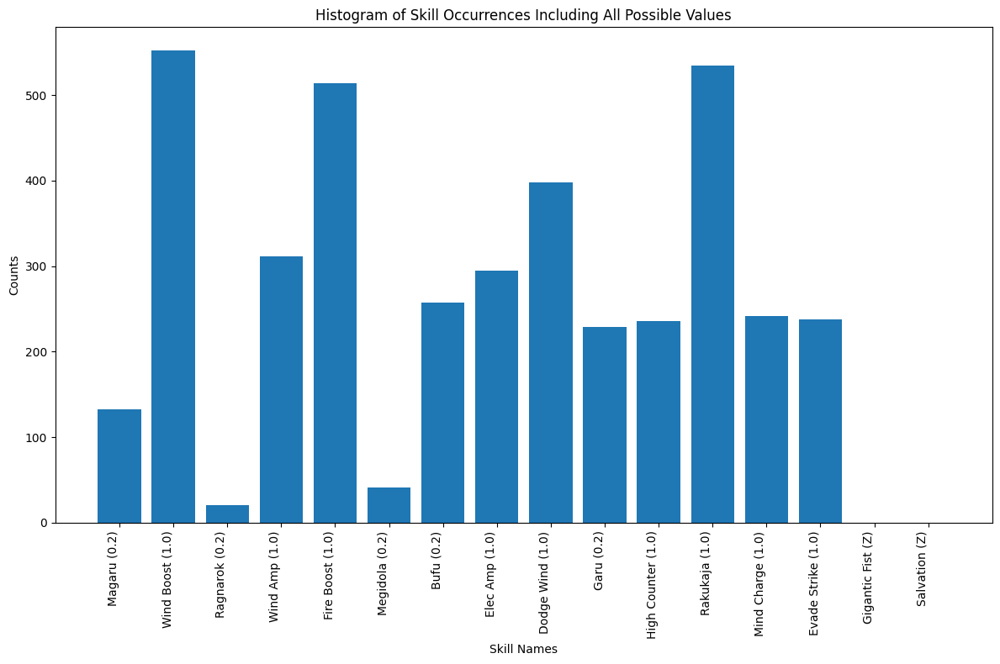

Logger_logs-BAD STATUS-optimal_recipes.txt_3_nebiros
{'Morning Star': 38, 'Magaru': 204, 'Auto-Sukukaja': 520, 'Dodge Slash': 521, 'Power Slash': 0, 'Revolution': 538, 'Media': 0, 'Salvation': 0, 'Hama': 0, 'Primal Force': 0, 'Zan-ei': 0, 'Cleave': 0, 'High Counter': 376, 'Mind Charge': 389, 'Auto-Tarukaja': 554, 'Spell Master': 218, 'Absorb Slash': 211, 'Mahama': 0, 'Me Patra': 0, 'Victory Cry': 204, 'Bash': 0, 'Zio': 356, 'Mabufu': 189, 'Tarukaja': 682}
{'Morning Star': 0.0076, 'Magaru': 0.0408, 'Auto-Sukukaja': 0.104, 'Dodge Slash': 0.1042, 'Power Slash': 0.0, 'Revolution': 0.1076, 'Media': 0.0, 'Salvation': 0.0, 'Hama': 0.0, 'Primal Force': 0.0, 'Zan-ei': 0.0, 'Cleave': 0.0, 'High Counter': 0.0752, 'Mind Charge': 0.0778, 'Auto-Tarukaja': 0.1108, 'Spell Master': 0.0436, 'Absorb Slash': 0.0422, 'Mahama': 0.0, 'Me Patra': 0.0, 'Victory Cry': 0.0408, 'Bash': 0.0, 'Zio': 0.0712, 'Mabufu': 0.0378, 'Tarukaja': 0.1364}
Persona List:  [('helel', 'Star'), ('power', 'Justice'), ('valkyrie', '

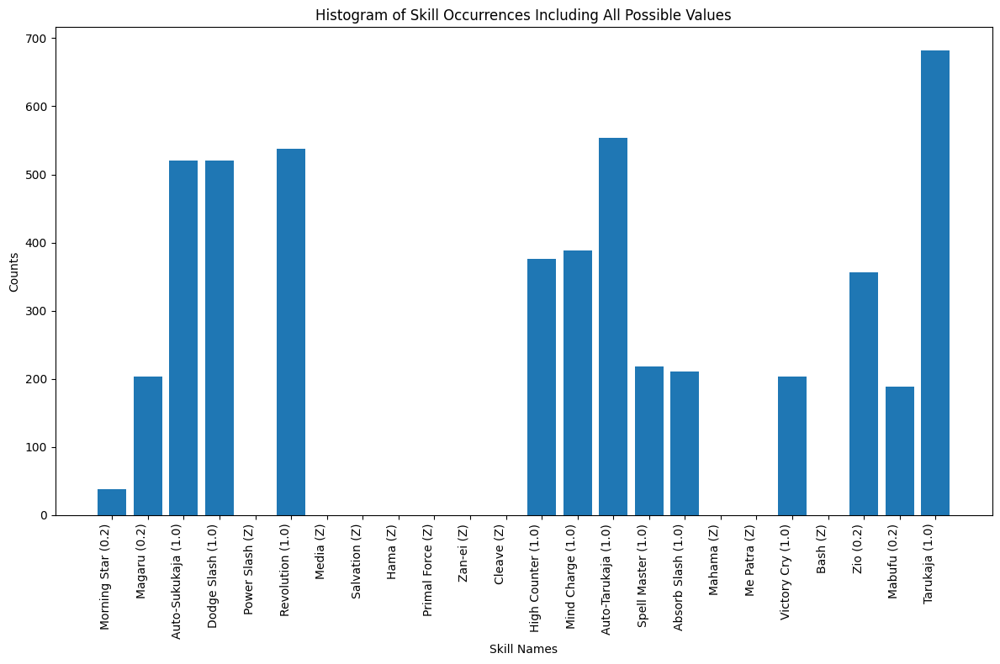

Logger_logs-BAD STATUS-optimal_recipes.txt_4_abaddon
{'Garudyne': 59, 'Apt Pupil': 226, 'Diarama': 0, 'Mazionga': 57, 'Sexy Dance': 815, 'Power Charge': 262, 'Null Distress': 216, 'Zan-ei': 0, 'Arrow Rain': 0, 'Deathbound': 0, 'Auto-Tarukaja': 372, 'Matarunda': 290, 'Virus Breath': 676, 'Marakunda': 280, 'Torrent Shot': 0, 'Blade of Fury': 0, 'Matarukaja': 254, 'Me Patra': 0, 'Poison Arrow': 0, 'Tarukaja': 489}
{'Garudyne': 0.014764764764764765, 'Apt Pupil': 0.05655655655655656, 'Diarama': 0.0, 'Mazionga': 0.014264264264264264, 'Sexy Dance': 0.20395395395395396, 'Power Charge': 0.06556556556556556, 'Null Distress': 0.05405405405405406, 'Zan-ei': 0.0, 'Arrow Rain': 0.0, 'Deathbound': 0.0, 'Auto-Tarukaja': 0.09309309309309309, 'Matarunda': 0.07257257257257257, 'Virus Breath': 0.16916916916916916, 'Marakunda': 0.07007007007007007, 'Torrent Shot': 0.0, 'Blade of Fury': 0.0, 'Matarukaja': 0.06356356356356356, 'Me Patra': 0.0, 'Poison Arrow': 0.0, 'Tarukaja': 0.12237237237237238}
Persona Lis

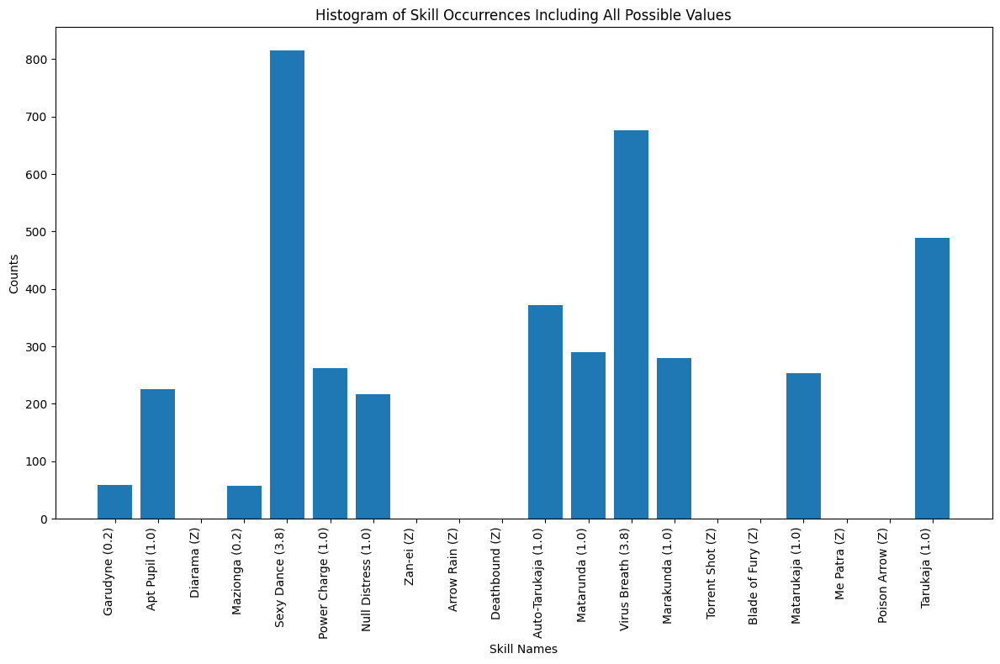

Logger_logs-BAD STATUS-optimal_recipes.txt_5_pazuzu
{'Enradi': 0, 'Bufudyne': 83, 'Maragidyne': 93, 'Apt Pupil': 401, 'Amrita': 0, 'Resist Fire': 463, 'Megidola': 67, 'Stagnant Air': 167, 'Null Fire': 385, 'Single Shot': 0, 'Bash': 0, 'Poisma': 995, 'Zio': 393, 'Null Dark': 395, 'Ice Break': 453, 'Mabufula': 105}
{'Enradi': 0.0, 'Bufudyne': 0.02075, 'Maragidyne': 0.02325, 'Apt Pupil': 0.10025, 'Amrita': 0.0, 'Resist Fire': 0.11575, 'Megidola': 0.01675, 'Stagnant Air': 0.04175, 'Null Fire': 0.09625, 'Single Shot': 0.0, 'Bash': 0.0, 'Poisma': 0.24875, 'Zio': 0.09825, 'Null Dark': 0.09875, 'Ice Break': 0.11325, 'Mabufula': 0.02625}
Persona List:  [('loki', 'Fool'), ('laksmi', 'Empress'), ('inugami', 'Hanged Man')]


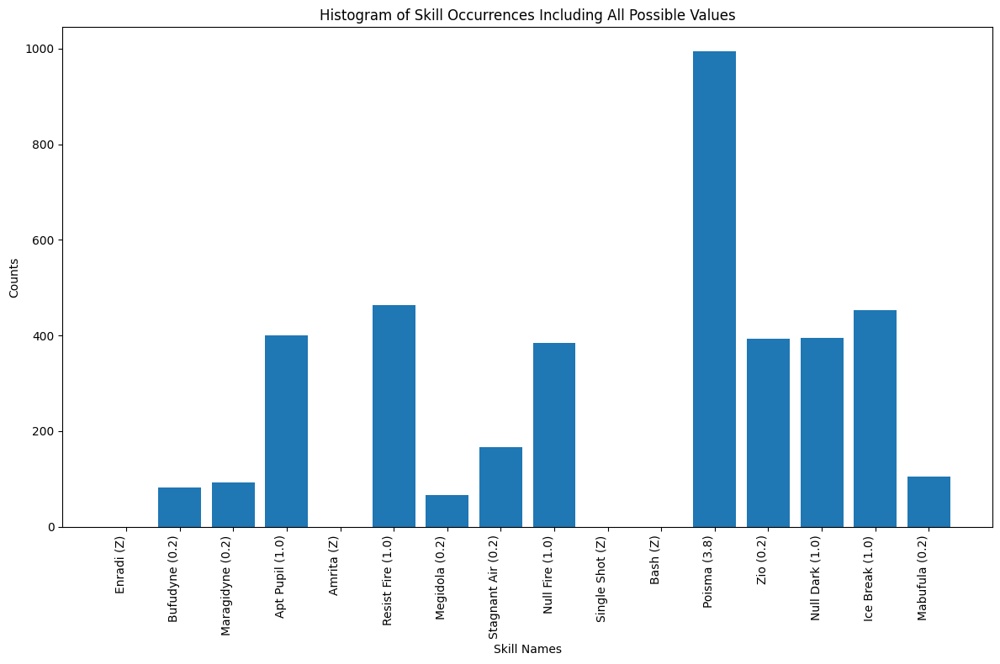

Logger_logs-BAD STATUS-optimal_recipes.txt_6_abaddon
{'Spell Master': 170, 'Megidolaon': 41, 'Bufula': 101, 'Mamudoon': 315, 'Mabufudyne': 49, 'Myriad Arrows': 0, 'Me Patra': 0, 'Mamudo': 473, 'Dekunda': 461, 'Brave Blade': 0, 'Mudo': 610, 'Sukunda': 609, 'Victory Cry': 147, 'Resist Strike': 302, 'High Counter': 0, 'Auto-Rakukaja': 448, 'Magarudyne': 59, 'Makarakarn': 215}
{'Spell Master': 0.0425, 'Megidolaon': 0.01025, 'Bufula': 0.02525, 'Mamudoon': 0.07875, 'Mabufudyne': 0.01225, 'Myriad Arrows': 0.0, 'Me Patra': 0.0, 'Mamudo': 0.11825, 'Dekunda': 0.11525, 'Brave Blade': 0.0, 'Mudo': 0.1525, 'Sukunda': 0.15225, 'Victory Cry': 0.03675, 'Resist Strike': 0.0755, 'High Counter': 0.0, 'Auto-Rakukaja': 0.112, 'Magarudyne': 0.01475, 'Makarakarn': 0.05375}
Persona List:  [('lucifer', 'Judgment'), ('scathach', 'Priestess'), ('genbu', 'Temperance')]


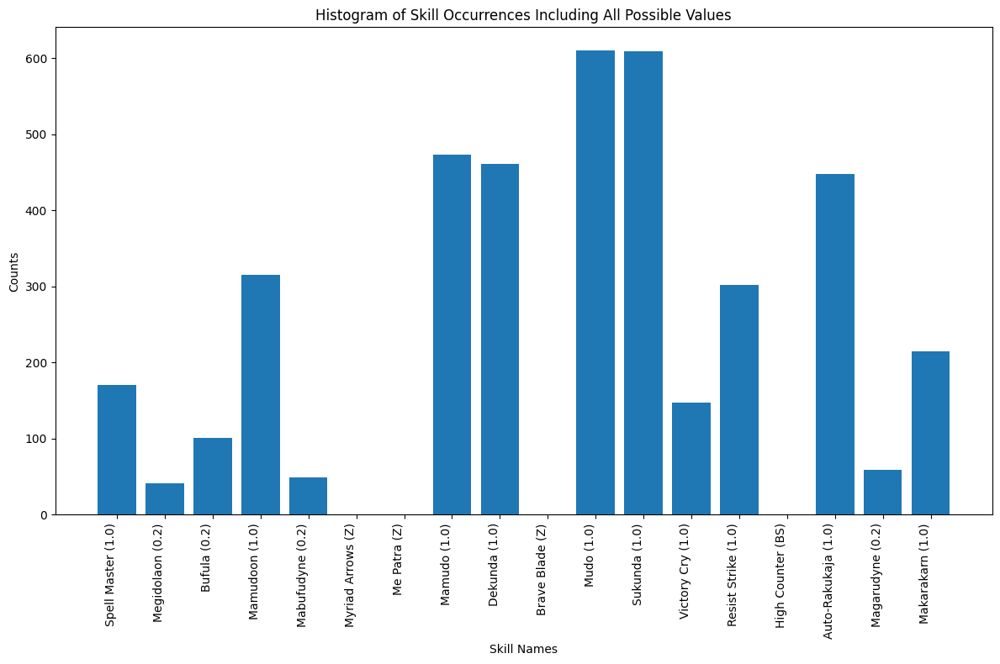

Logger_logs-BAD STATUS-optimal_recipes.txt_7_kaiwan
{'Counterstrike': 317, 'Power Charge': 304, 'Hamaon': 0, 'Agi': 255, 'Vicious Strike': 0, 'Cleave': 0, 'Auto-Masuku': 223, 'Hama Boost': 316, 'Mahamaon': 0, 'Dekaja': 261, 'High Counter': 228, 'Rakukaja': 547, 'Mediarahan': 0, 'Resist Dark': 321, 'Bewilder': 988, 'Vorpal Blade': 0, 'Tempest Slash': 0, 'Auto-Mataru': 240, 'Recarmdra': 0}
{'Counterstrike': 0.07925, 'Power Charge': 0.076, 'Hamaon': 0.0, 'Agi': 0.06375, 'Vicious Strike': 0.0, 'Cleave': 0.0, 'Auto-Masuku': 0.05575, 'Hama Boost': 0.079, 'Mahamaon': 0.0, 'Dekaja': 0.06525, 'High Counter': 0.057, 'Rakukaja': 0.13675, 'Mediarahan': 0.0, 'Resist Dark': 0.08025, 'Bewilder': 0.247, 'Vorpal Blade': 0.0, 'Tempest Slash': 0.0, 'Auto-Mataru': 0.06, 'Recarmdra': 0.0}
Persona List:  [('siegfried', 'Strength'), ('throne', 'Justice'), ('chimera', 'Chariot')]


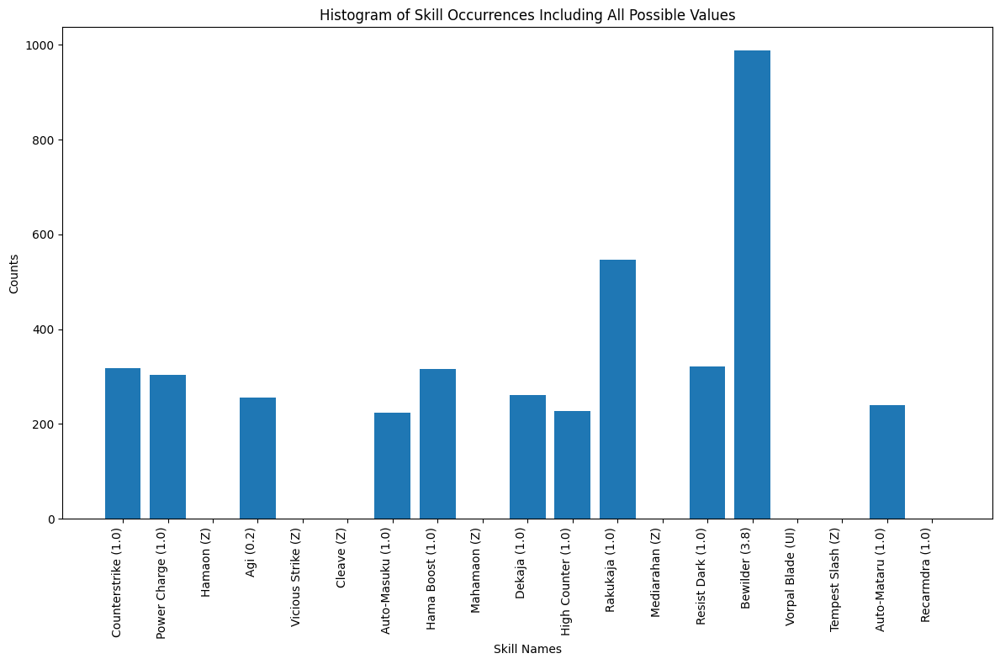

Logger_logs-BAD STATUS-optimal_recipes.txt_8_abaddon
{'Wind Amp': 347, 'Counter': 432, 'Growth 3': 347, 'Elec Amp': 318, 'Samsara': 0, 'Patra': 0, 'Amrita': 1, 'Diarahan': 0, 'Unshaken Will': 144, 'Vile Assault': 0, 'Ice Amp': 339, 'Niflheim': 33, 'Absorb Fire': 209, 'Maziodyne': 54, 'Null Dark': 258, 'High Counter': 0, 'Mind Charge': 277, 'Spell Master': 151, 'Recarm': 0, 'Wind Boost': 603, 'Null Panic': 286, 'Thunder Reign': 32, 'Sukukaja': 606, 'Tarukaja': 563}
{'Wind Amp': 0.0694, 'Counter': 0.0864, 'Growth 3': 0.0694, 'Elec Amp': 0.0636, 'Samsara': 0.0, 'Patra': 0.0, 'Amrita': 0.0002, 'Diarahan': 0.0, 'Unshaken Will': 0.0288, 'Vile Assault': 0.0, 'Ice Amp': 0.0678, 'Niflheim': 0.0066, 'Absorb Fire': 0.0418, 'Maziodyne': 0.0108, 'Null Dark': 0.0516, 'High Counter': 0.0, 'Mind Charge': 0.0554, 'Spell Master': 0.0302, 'Recarm': 0.0, 'Wind Boost': 0.1206, 'Null Panic': 0.0572, 'Thunder Reign': 0.0064, 'Sukukaja': 0.1212, 'Tarukaja': 0.1126}
Persona List:  [('skadi', 'Empress'), ('odin

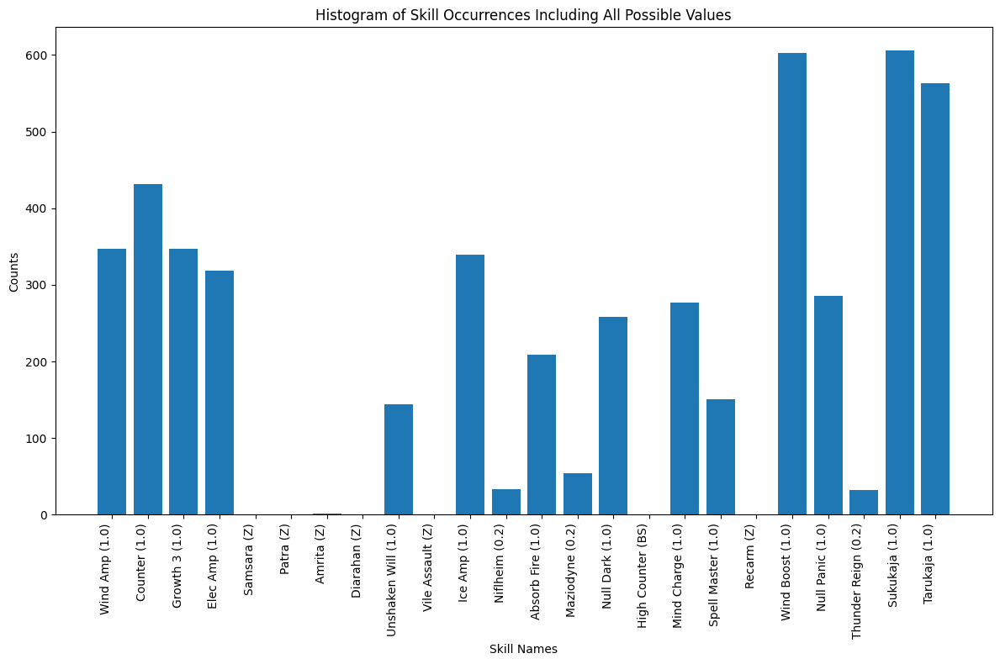

Logger_logs-BAD STATUS-optimal_recipes.txt_9_kaiwan
{'Herculean Strike': 0, 'Wind Amp': 199, 'Maragi': 85, 'Null Distress': 158, 'Provoke': 811, 'Evil Smile': 604, 'Null Fear': 173, 'Rebellion': 352, 'Kill Rush': 0, 'Tentarafoo': 579, 'Dekaja': 170, 'Double Fangs': 0, 'Ghastly Wail': 368, 'Mudoon': 200, 'Panta Rhei': 22, 'Magarula': 30, 'Foul Breath': 87, 'Recarmdra': 0, 'Zio': 162}
{'Herculean Strike': 0.0, 'Wind Amp': 0.04975, 'Maragi': 0.02125, 'Null Distress': 0.0395, 'Provoke': 0.20275, 'Evil Smile': 0.151, 'Null Fear': 0.04325, 'Rebellion': 0.088, 'Kill Rush': 0.0, 'Tentarafoo': 0.14475, 'Dekaja': 0.0425, 'Double Fangs': 0.0, 'Ghastly Wail': 0.092, 'Mudoon': 0.05, 'Panta Rhei': 0.0055, 'Magarula': 0.0075, 'Foul Breath': 0.02175, 'Recarmdra': 0.0, 'Zio': 0.0405}
Persona List:  [('ubelluris', 'Hanged Man'), ('mot', 'Death'), ('vetala', 'Devil')]


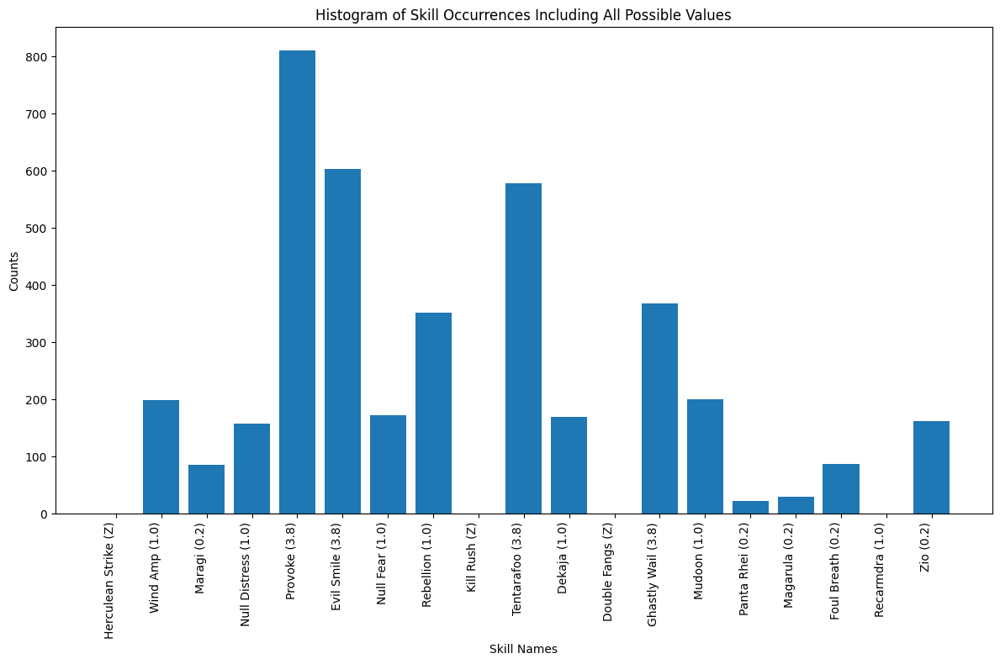

Logger_logs-BAD STATUS-optimal_recipes.txt_10_kaiwan
{'Ice Boost': 375, "God's Hand": 0, 'Wind Amp': 232, 'Akasha Arts': 0, 'Counter': 264, 'Dodge Strike': 269, 'Raging Tiger': 611, 'Megido': 46, 'Ziodyne': 40, 'Salvation': 0, 'Twin Shot': 0, 'Wind Break': 200, 'Garula': 57, 'Sharp Student': 276, 'Poison Mist': 668, 'Trafuri': 104, 'Sonic Punch': 0, 'Rakukaja': 349, 'Mind Charge': 166, 'Auto-Tarukaja': 236, 'Wind Boost': 363, 'Panta Rhei': 20, 'Sukukaja': 350, 'Tarukaja': 374}
{'Ice Boost': 0.075, "God's Hand": 0.0, 'Wind Amp': 0.0464, 'Akasha Arts': 0.0, 'Counter': 0.0528, 'Dodge Strike': 0.0538, 'Raging Tiger': 0.1222, 'Megido': 0.0092, 'Ziodyne': 0.008, 'Salvation': 0.0, 'Twin Shot': 0.0, 'Wind Break': 0.04, 'Garula': 0.0114, 'Sharp Student': 0.0552, 'Poison Mist': 0.1336, 'Trafuri': 0.0208, 'Sonic Punch': 0.0, 'Rakukaja': 0.0698, 'Mind Charge': 0.0332, 'Auto-Tarukaja': 0.0472, 'Wind Boost': 0.0726, 'Panta Rhei': 0.004, 'Sukukaja': 0.07, 'Tarukaja': 0.0748}
Persona List:  [('vishnu'

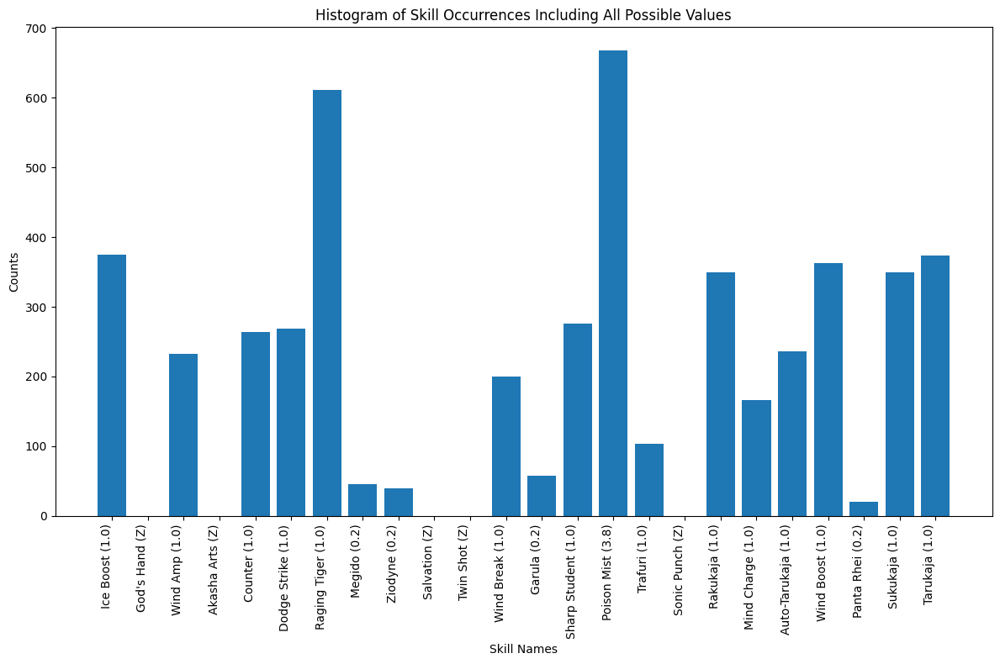

In [7]:
for it_holder in inheritance_type_holders:
    for pholder in it_holder.predictionHolders:
        print(pholder.csv_name)
        print(pholder.value_counts_with_all_possible)
        print(pholder.percentage)
        pholder.show()

In [8]:
all_holder = InheritanceTypeHolder("ALL")


percentages = all_holder.create_percentage_dict()

# Now, percentages is a dictionary where the keys are the keys from the percentage dictionaries,
# and the values are lists of values for each key from all percentage dictionaries

# Print the keys and their corresponding lists of values
for key, val in percentages.items():
    print(f"{key}: {val}")

Wind Boost: [0.053, 0.075, 0.05775, 0.06525]
Marin Karin: [0.04925]
Dodge Strike: [0.02975]
Spirit Drain: [0.02725]
Twin Shot: [0.0315, 0.0765]
Sonic Punch: [0.0525]
Poison Mist: [0.0]
Dodge Wind: [0.03525]
Raging Tiger: [0.09575, 0.1205]
Auto-Tarukaja: [0.0335, 0.05175, 0.0365, 0.07625]
Garu: [0.097, 0.126]
Magaru: [0.04825]
Evil Touch: [0.03325, 0.10485485485485485]
Repel Dark: [0.018]
Marakunda: [0.0285, 0.06075]
Megido: [0.01725]
Rakukaja: [0.04925, 0.063]
Zio: [0.10025, 0.1158]
Bufu: [0.08775]
Die for Me!: [0.01225]
Sukukaja: [0.05075, 0.0718, 0.071]
Ice Boost: [0.04975]
Ragnarok: [0.01825]
Dekaja: [0.0495, 0.0322, 0.07707707707707707]
Salvation: [0.03, 0.022125]
Masukukaja: [0.04725]
Deathbound: [0.0395]
Fire Boost: [0.1055, 0.0696]
Null Distress: [0.0455, 0.0405, 0.06631631631631632]
Rakunda: [0.107]
Wind Amp: [0.06, 0.0445, 0.0404, 0.0325, 0.036]
Elec Amp: [0.063, 0.0422]
Ziodyne: [0.0435]
Apt Pupil: [0.0, 0.0, 0.035625]
Megidola: [0.036, 0.025375]
Blade of Fury: [0.0495]
Auto-

In [9]:
import os

current_path = os.getcwd()
print("Current working directory:", current_path)

# Create a dictionary to store the skills by type and rank
skills_by_type_and_rank = {}

for key, val in percentages.items():
    # Get the skill type and rank from the dictionaries
    skill_type = skill_type_dict[key]
    skill_rank = skill_rank_dict[key]

    # Create a tuple of skill type and rank
    type_and_rank = (skill_type, skill_rank)

    # If the type and rank is already in the dictionary, append the skill to the list
    if type_and_rank in skills_by_type_and_rank:
        skills_by_type_and_rank[type_and_rank].append(key)
    # Otherwise, add a new list with the skill to the dictionary
    else:
        skills_by_type_and_rank[type_and_rank] = [key]

# Now, skills_by_type_and_rank is a dictionary where the keys are tuples of skill type and rank,
# and the values are lists of skills with that type and rank

# Print the type and rank and their corresponding lists of skills
        
sorted_keys = sorted(skills_by_type_and_rank.keys())

for key in sorted_keys:
    print(f"{key}: {skills_by_type_and_rank[key]}")

Current working directory: /home/eduardo/Documents/Persona3/AutoTelos/kikuriHime/histograms
('Almighty', 2): ['Foul Breath']
('Almighty', 3): ['Stagnant Air']
('Almighty', 4): ['Spirit Drain']
('Almighty', 6): ['Megido']
('Almighty', 7): ['Megidola']
('Almighty', 8): ['Megidolaon']
('Almighty', 9): ['Morning Star']
('Bad Status', 1): ['Bewilder']
('Bad Status', 2): ['Marin Karin', 'Pulinpa', 'Provoke']
('Bad Status', 3): ['Poison Mist', 'Evil Touch', 'Sexy Dance']
('Bad Status', 4): ['Tentarafoo', 'Evil Smile']
('Bad Status', 5): ['Virus Breath']
('Bad Status', 8): ['Ghastly Wail']
('Dark', 2): ['Mudo']
('Dark', 3): ['Mamudo']
('Dark', 4): ['Mudoon']
('Dark', 5): ['Mamudoon']
('Dark', 9): ['Die for Me!']
('Elec', 1): ['Zio']
('Elec', 2): ['Mazio']
('Elec', 3): ['Zionga']
('Elec', 4): ['Mazionga']
('Elec', 5): ['Ziodyne']
('Elec', 6): ['Maziodyne']
('Elec', 9): ['Thunder Reign']
('Enhance', 2): ['Rakukaja', 'Sukukaja', 'Rakunda', 'Rebellion', 'Tarukaja', 'Sukunda']
('Enhance', 3): ['Dek

In [10]:
avg_prob_per_skill_dict = {}
for skills, percents in percentages.items():
    summation = 0.0
    count = 0
    for skill in percents:
        if skill == 0:
            print(f"Skill {skills} has 0% coverage")
        else:
            summation += skill
            count += 1
    if count > 0:
        avg = summation / count
        print(f"{skills}: {avg}")
        avg_prob_per_skill_dict[skills] = avg
    else:
        print(f"No non-zero percentages for skill {skills}")

Wind Boost: 0.06275
Marin Karin: 0.04925
Dodge Strike: 0.02975
Spirit Drain: 0.02725
Twin Shot: 0.054
Sonic Punch: 0.0525
Skill Poison Mist has 0% coverage
No non-zero percentages for skill Poison Mist
Dodge Wind: 0.03525
Raging Tiger: 0.108125
Auto-Tarukaja: 0.0495
Garu: 0.1115
Magaru: 0.04825
Evil Touch: 0.06905242742742743
Repel Dark: 0.018
Marakunda: 0.044625
Megido: 0.01725
Rakukaja: 0.056125
Zio: 0.10802500000000001
Bufu: 0.08775
Die for Me!: 0.01225
Sukukaja: 0.06451666666666667
Ice Boost: 0.04975
Ragnarok: 0.01825
Dekaja: 0.05292569235902569
Salvation: 0.0260625
Masukukaja: 0.04725
Deathbound: 0.0395
Fire Boost: 0.08754999999999999
Null Distress: 0.05077210543877211
Rakunda: 0.107
Wind Amp: 0.04268
Elec Amp: 0.0526
Ziodyne: 0.0435
Skill Apt Pupil has 0% coverage
Skill Apt Pupil has 0% coverage
Apt Pupil: 0.035625
Megidola: 0.0306875
Blade of Fury: 0.0495
Auto-Mataru: 0.033125
Diarama: 0.07175
Vicious Strike: 0.04025
High Counter: 0.03861
Mind Charge: 0.03816666666666667
Pulinpa

In [11]:
import pandas as pd


df = pd.read_csv("/home/eduardo/Documents/Persona3/AutoTelos/skills_list/skills.csv")


skill_type_dict = df.set_index('skill')['type'].to_dict()

skill_rank_dict = df.set_index('skill')['rank'].to_dict()

# given a skill name return the skill type
def get_skill_type(skill_name):
    return skill_type_dict[skill_name]

def get_skill_rank(skill_name):
    return skill_rank_dict[skill_name]

# load '/home/eduardo/Documents/Persona3/AutoTelos/inheritance_calculator/inheritance.csv' into a dataframe
inheritance_df = pd.read_csv('/home/eduardo/Documents/Persona3/AutoTelos/inheritance_calculator/inheritance.csv')
# load '/home/eduardo/Documents/Persona3/AutoTelos/inheritance_calculator/personas_inheritance.csv' into a dataframe
persona_inheritance_df = pd.read_csv('/home/eduardo/Documents/Persona3/AutoTelos/inheritance_calculator/personas_inheritance.csv')

def get_persona_inheritance_type(persona_name):
    return persona_inheritance_df.loc[persona_inheritance_df['Persona'] == persona_name, 'Type'].iloc[0]



# Convert the DataFrame to a dictionary where each key is an inheritance type
# and its value is another dictionary of skill types and their probabilities.
inheritance_dict = inheritance_df.set_index('Inheritance Type').T.to_dict('dict')



# given a skill type return the skill inheritance probability for a given persona type
def get_inheritance_probability(skill_type, persona_inheritance_type):
    # Access the nested dictionary directly for the value
    # Check if the persona_inheritance_type exists to avoid KeyErrors
    if persona_inheritance_type in inheritance_dict:
        # Return the probability value for the given skill_type and persona_inheritance_type
        return inheritance_dict[persona_inheritance_type].get(skill_type, 0)  # Returns 0 if skill_type is not found

In [12]:
skill_prob_list = list(avg_prob_per_skill_dict.keys())

ranks = []

dict_skill_to_rank = {}



for s in skill_prob_list:
    print(s, get_skill_rank(s))
    ranks.append(get_skill_rank(s))
    dict_skill_to_rank[s] = get_skill_rank(s)

ranks = list(set(ranks))

print(ranks)

print(dict_skill_to_rank)

Wind Boost 2
Marin Karin 2
Dodge Strike 3
Spirit Drain 4
Twin Shot 3
Sonic Punch 2
Dodge Wind 3
Raging Tiger 1
Auto-Tarukaja 3
Garu 1
Magaru 2
Evil Touch 3
Repel Dark 6
Marakunda 4
Megido 6
Rakukaja 2
Zio 1
Bufu 1
Die for Me! 9
Sukukaja 2
Ice Boost 2
Ragnarok 9
Dekaja 5
Salvation 9
Masukukaja 5
Deathbound 6
Fire Boost 2
Null Distress 5
Rakunda 2
Wind Amp 4
Elec Amp 4
Ziodyne 5
Apt Pupil 5
Megidola 7
Blade of Fury 5
Auto-Mataru 6
Diarama 3
Vicious Strike 6
High Counter 5
Mind Charge 5
Pulinpa 2
Auto-Maraku 6
Mazio 2
Zionga 3
Null Dark 5
Elec Break 4
Marakukaja 5
Charmdi 2
Amrita 6
Invigorate 2 5
Resist Fire 4
Ice Break 4
Mabufula 4
Elec Boost 2
Counterstrike 4
Bufudyne 5
Null Poison 5
Growth 1 2
Heat Wave 5
Virus Breath 5
Getsu-ei 3
Rebellion 2
Agilao 3
Victory Cry 9
Maragi 2
Kill Rush 3
Tentarafoo 4
Mighty Swing 4
Brave Blade 8
Matarukaja 5
Magarudyne 6
Provoke 2
Spell Master 9
Megidolaon 8
Agidyne 5
Maragion 4
Makarakarn 7
Zan-ei 3
Foul Breath 2
Mamudoon 5
1hSwd Master 6
Panta Rhei 9


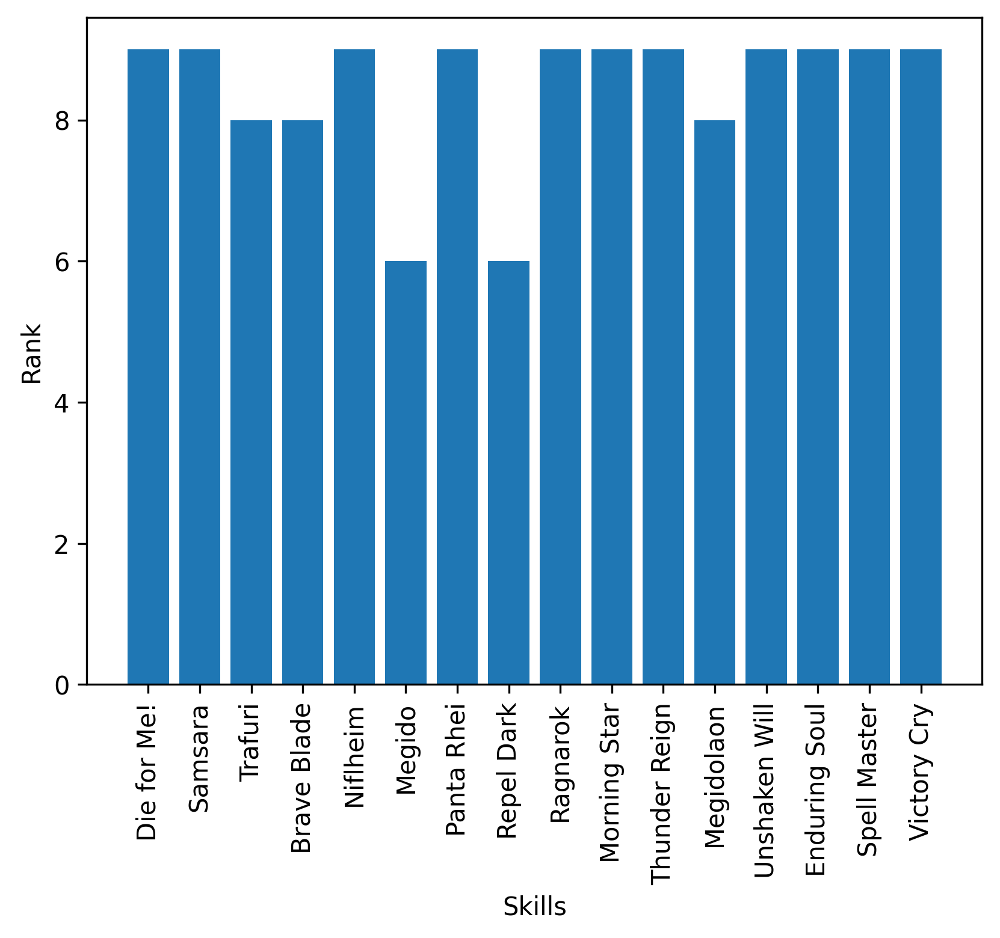

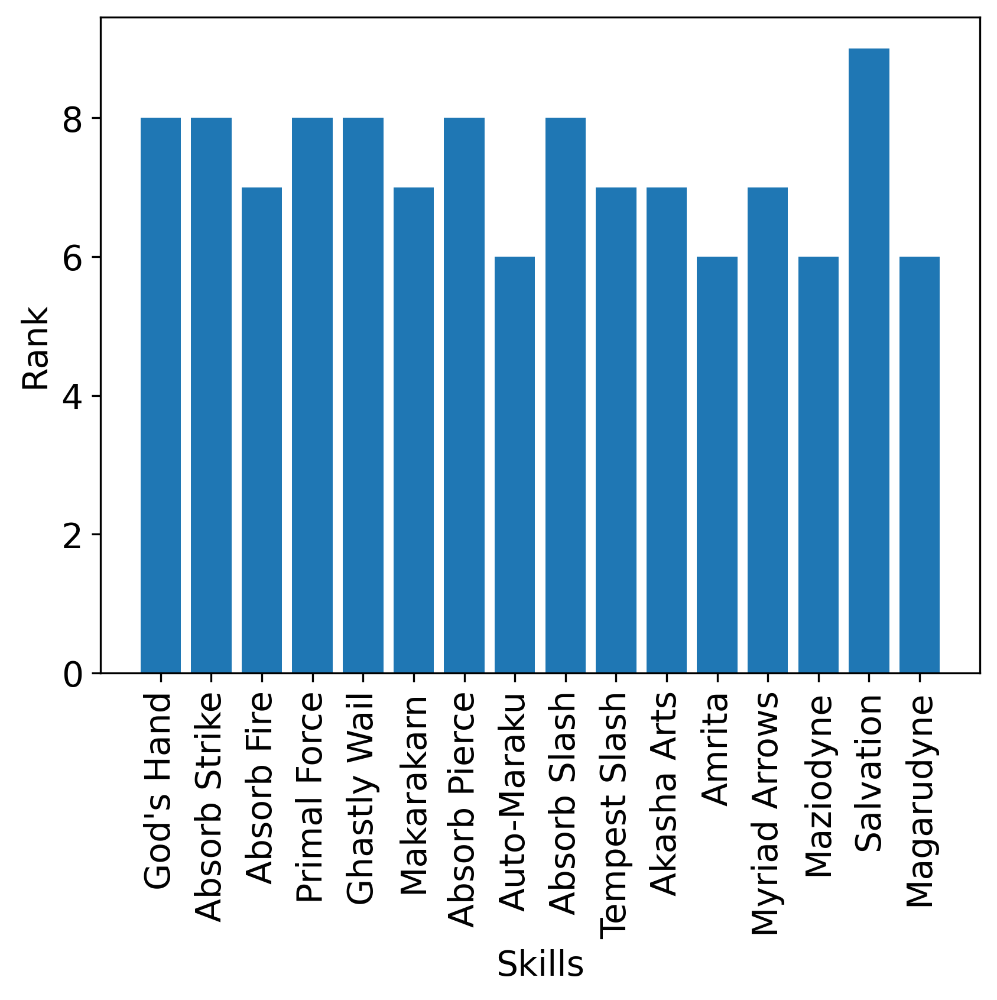

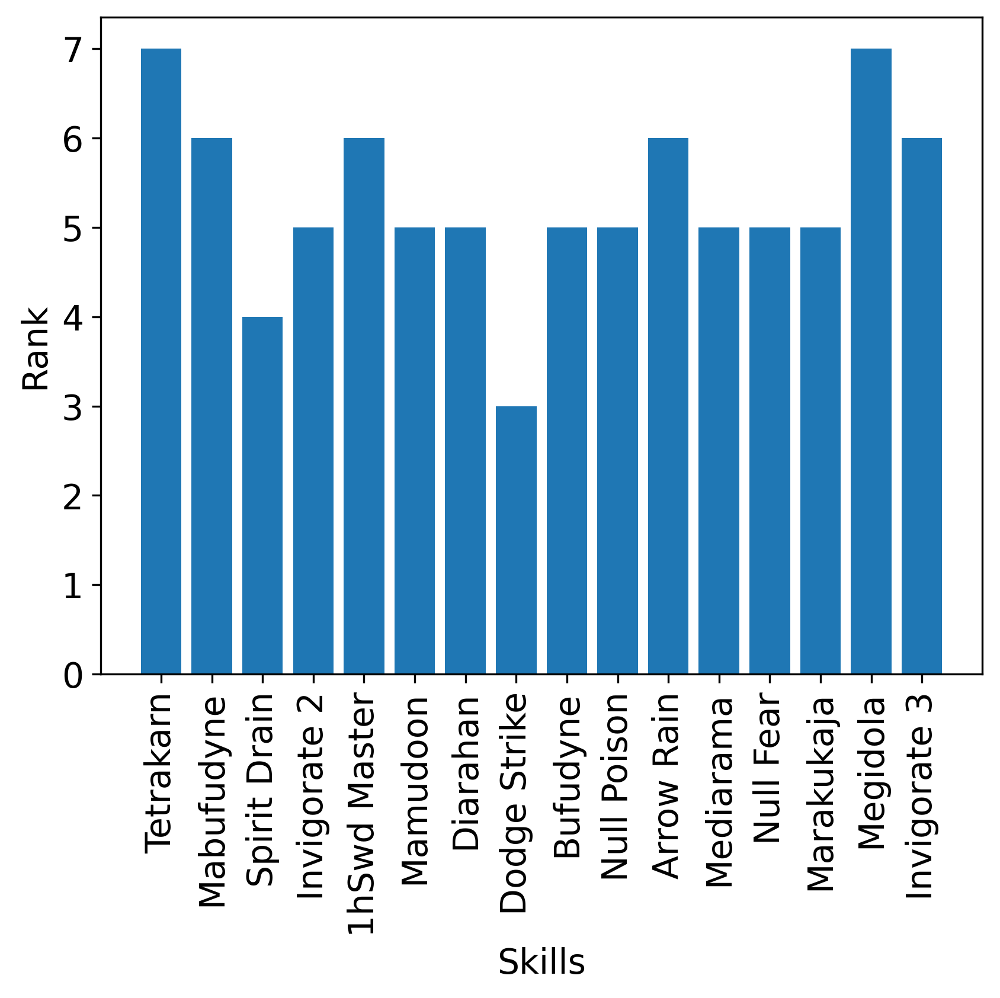

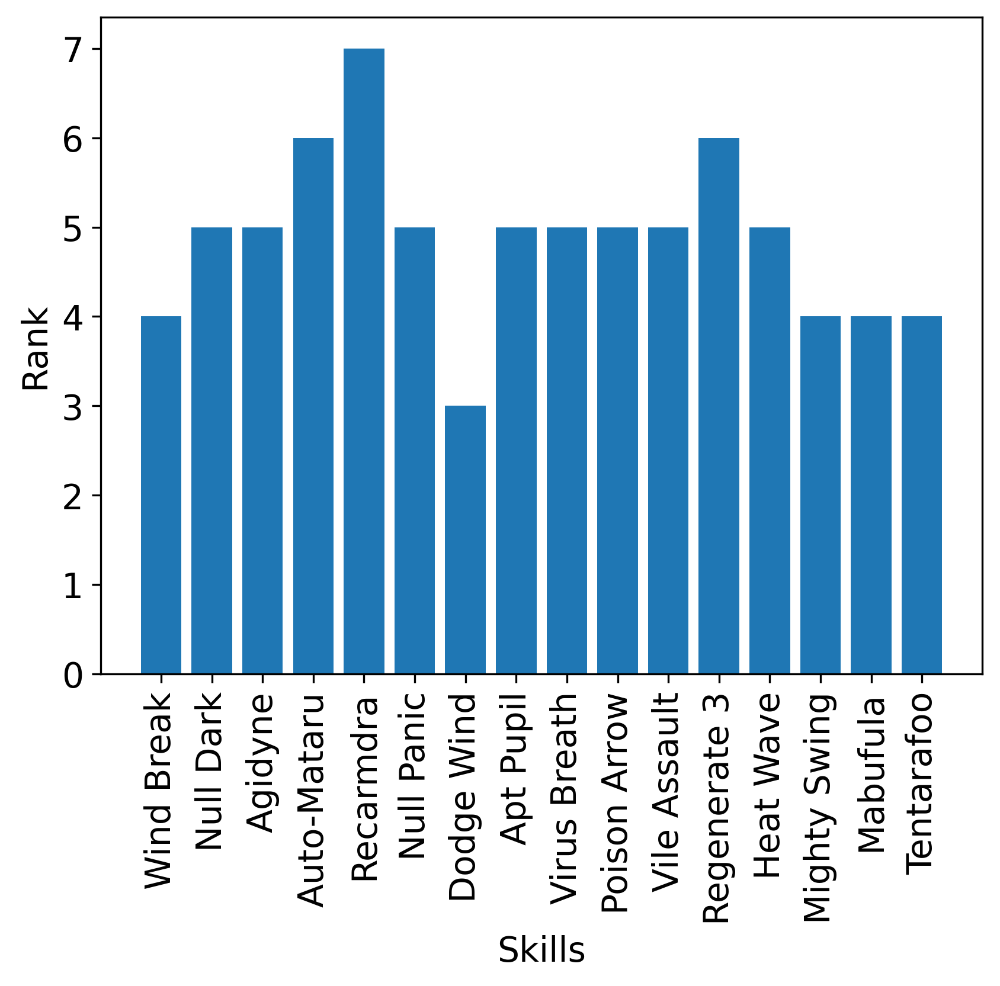

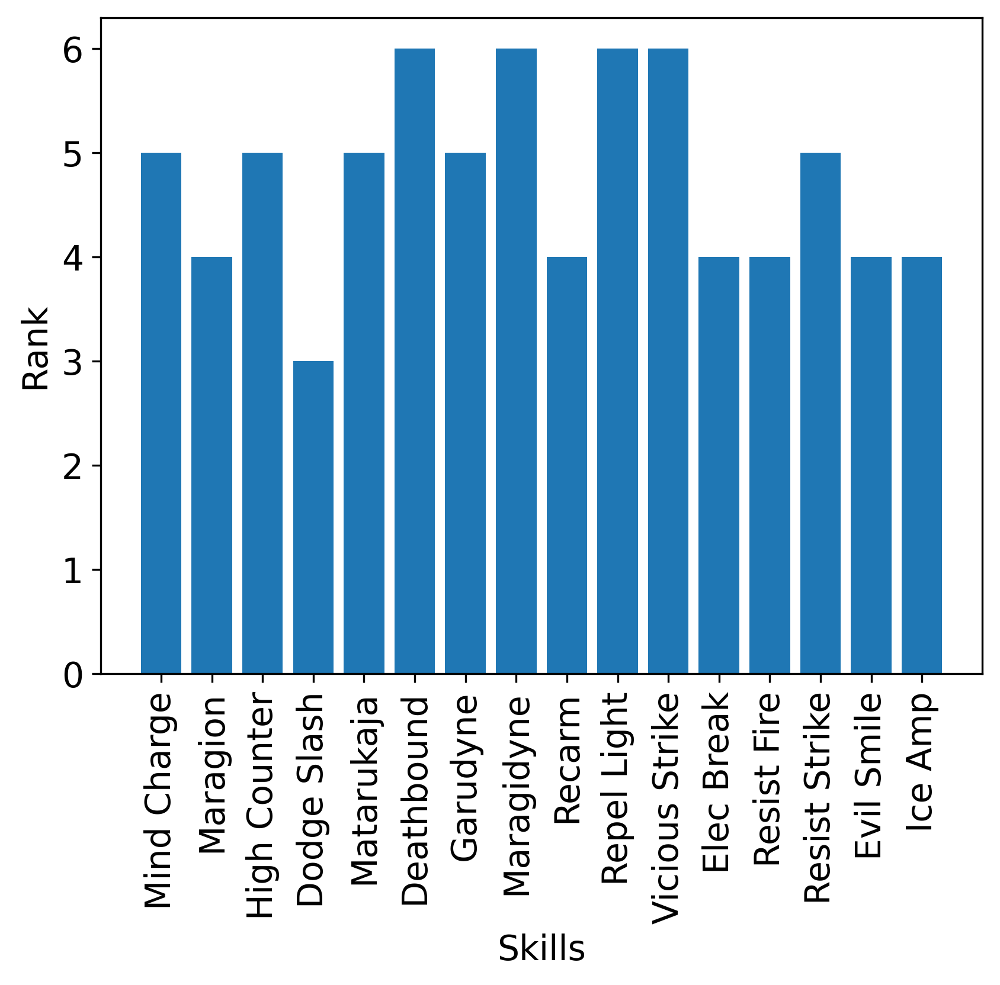

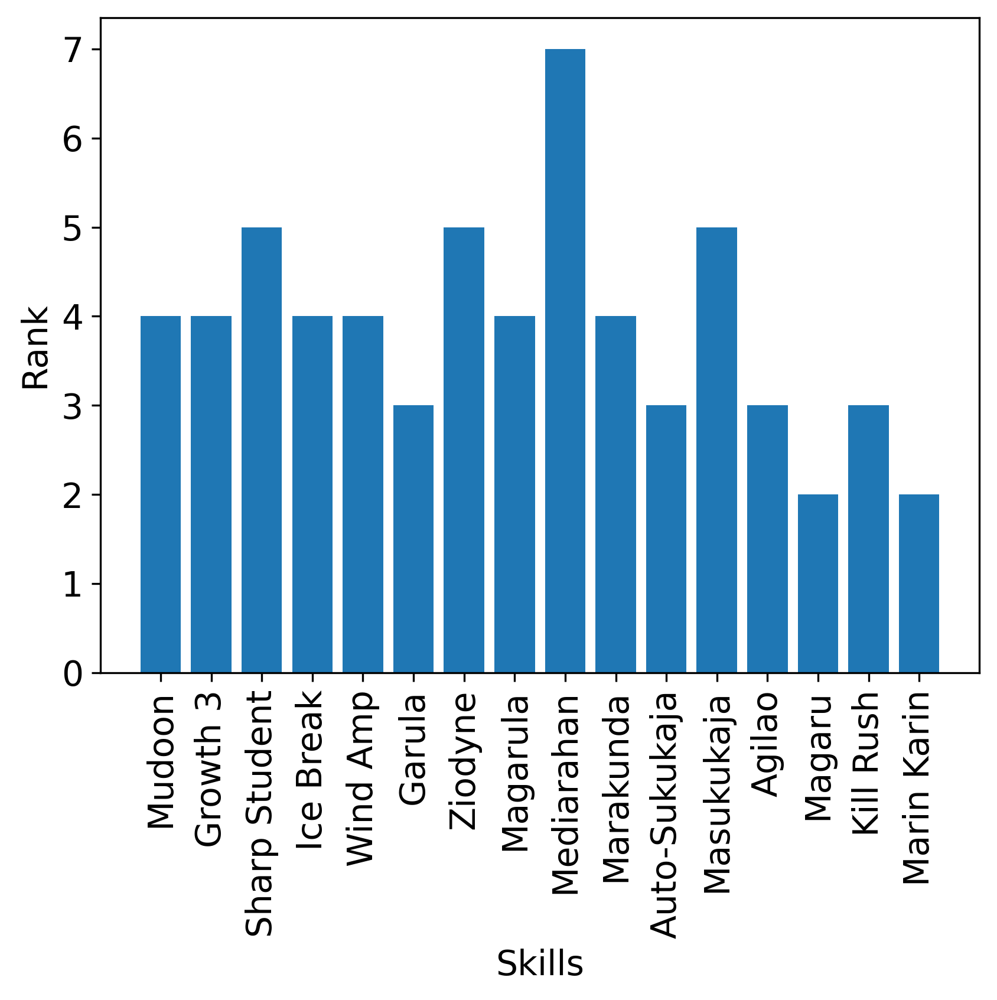

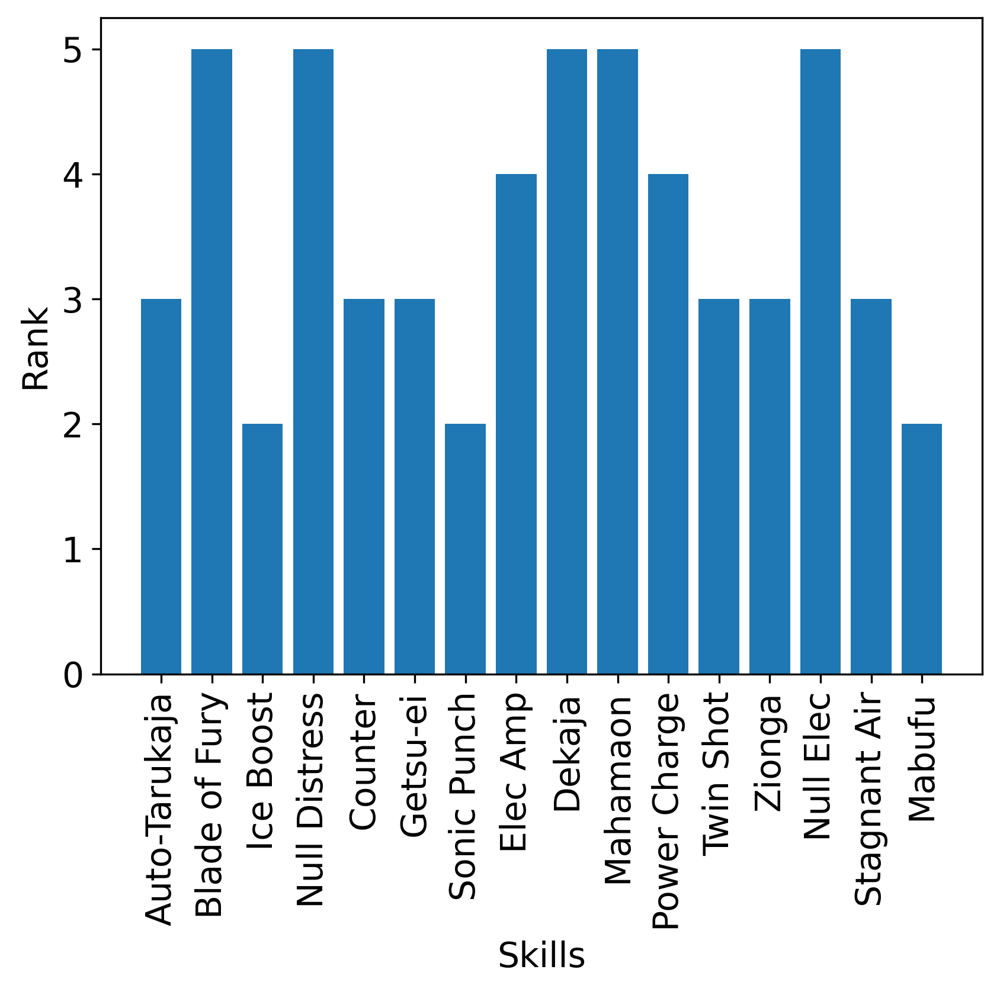

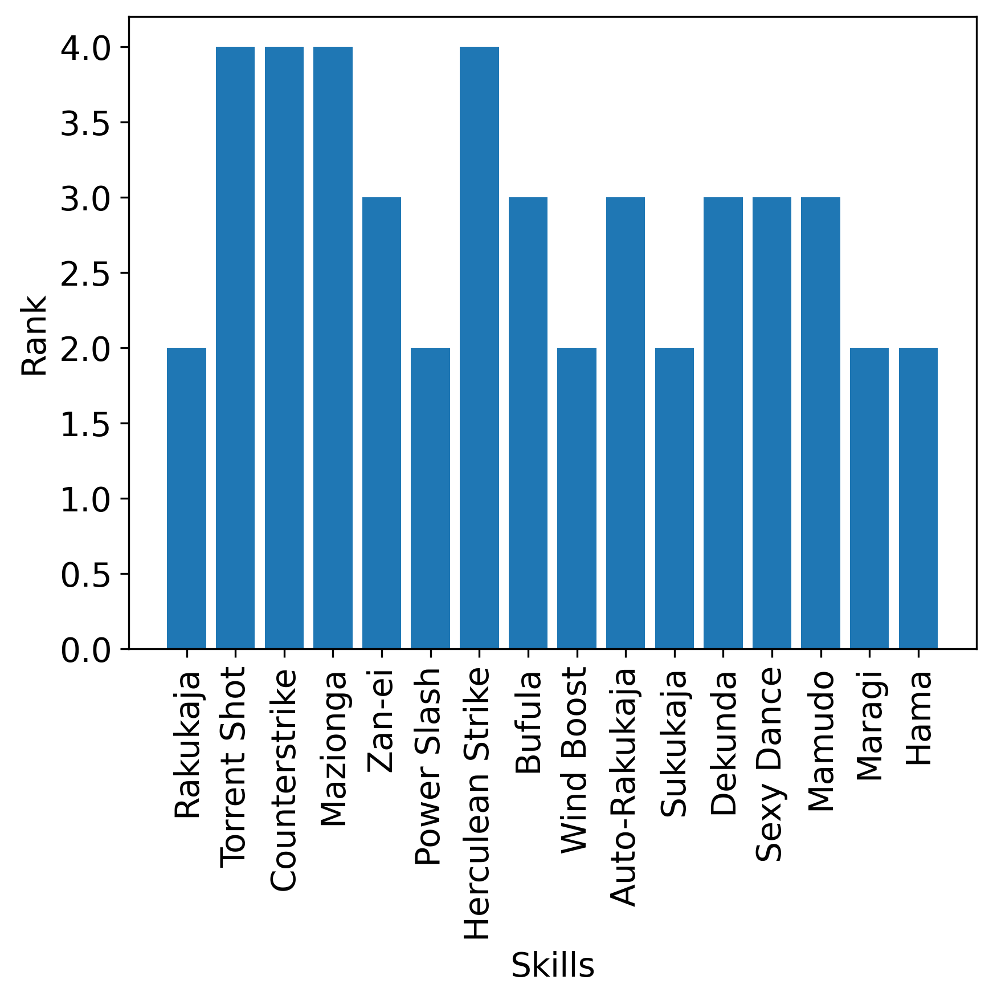

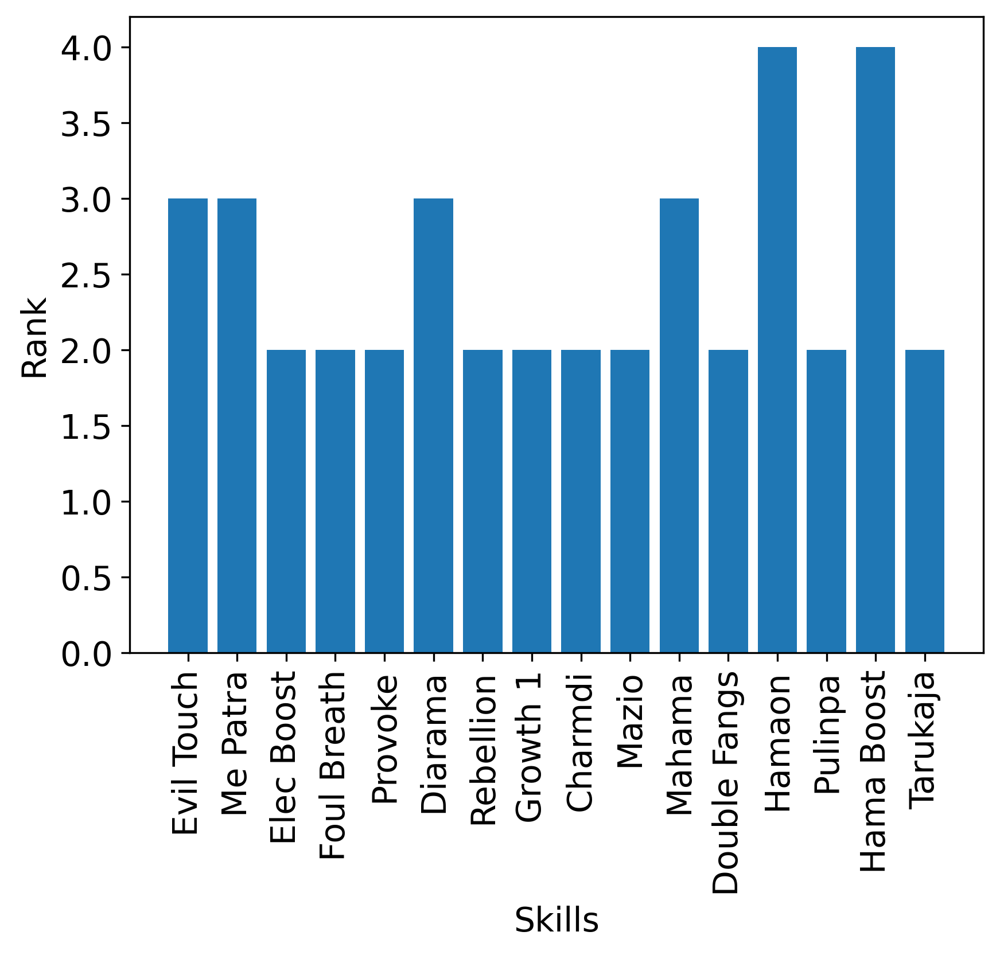

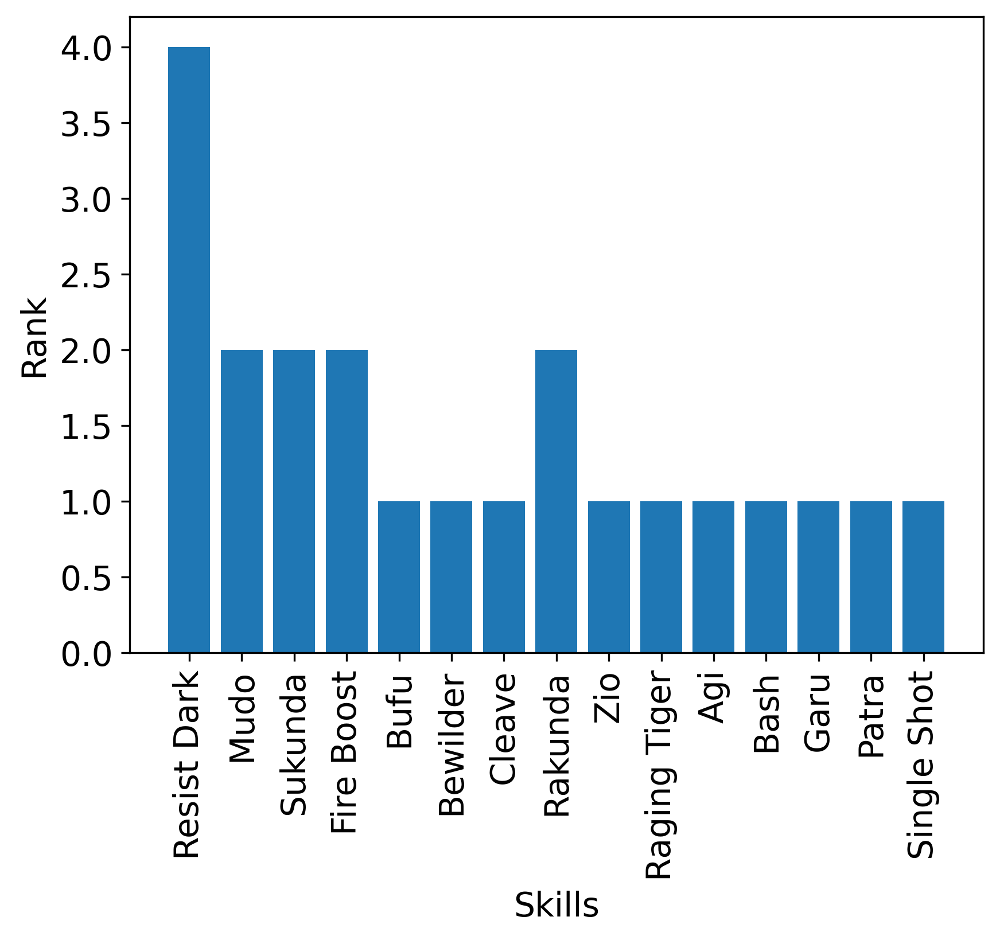

In [13]:
import matplotlib.pyplot as plt
import numpy as np

# Sort the avg_prob_per_skill_dict dictionary by value
sorted_keys = dict(sorted(avg_prob_per_skill_dict.items(), key=lambda item: item[1])).keys()

# Get the values from dict_skill_to_rank in the same order
values_in_order = [dict_skill_to_rank[key] for key in sorted_keys]

# Split the keys and values into 10 smaller lists
split_keys = np.array_split(list(sorted_keys), 10)
split_values = np.array_split(values_in_order, 10)

# Plot each smaller dictionary
for i, (k, v) in enumerate(zip(split_keys, split_values)):
    plt.figure(i, dpi=300)
    plt.bar(k, v)
    plt.xlabel('Skills')
    plt.ylabel('Rank')
    plt.xticks(rotation=90)
    plt.rc('font', size=14)# cinclusion### dsasadsdadsasad
    plt.savefig(f'skill_to_rank_{i}.png')
    plt.show()

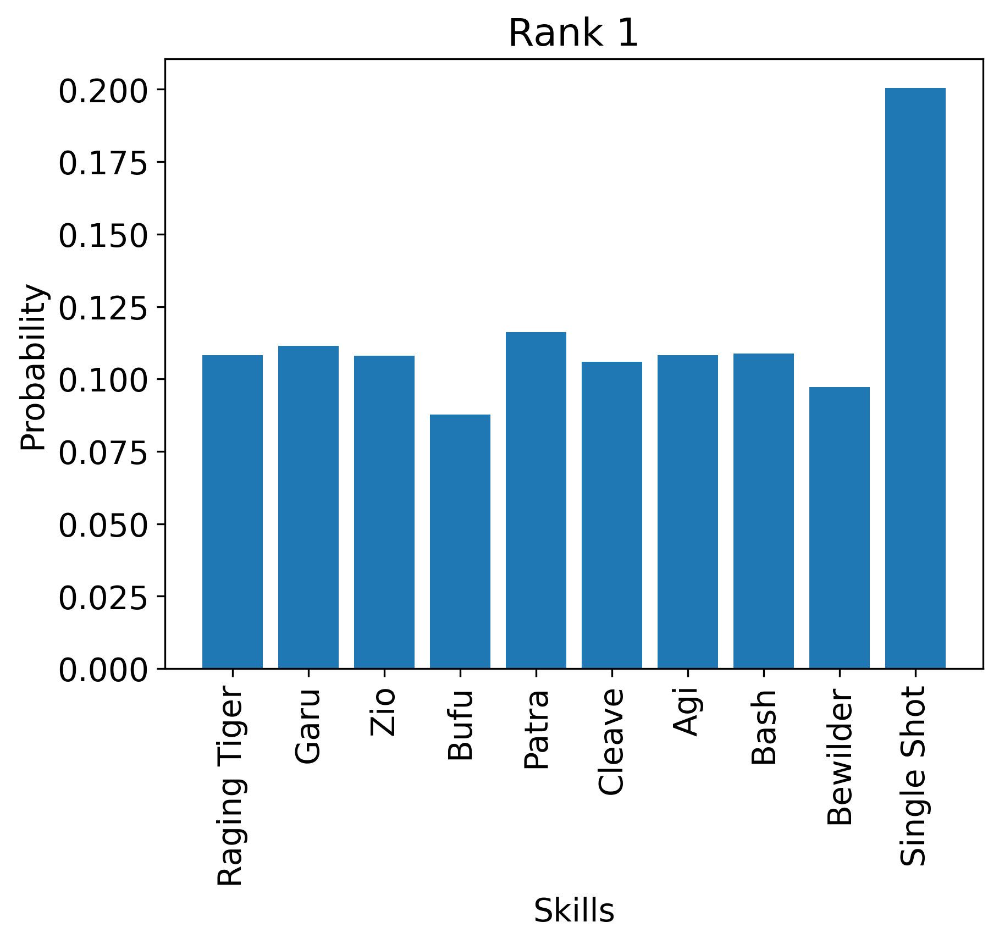

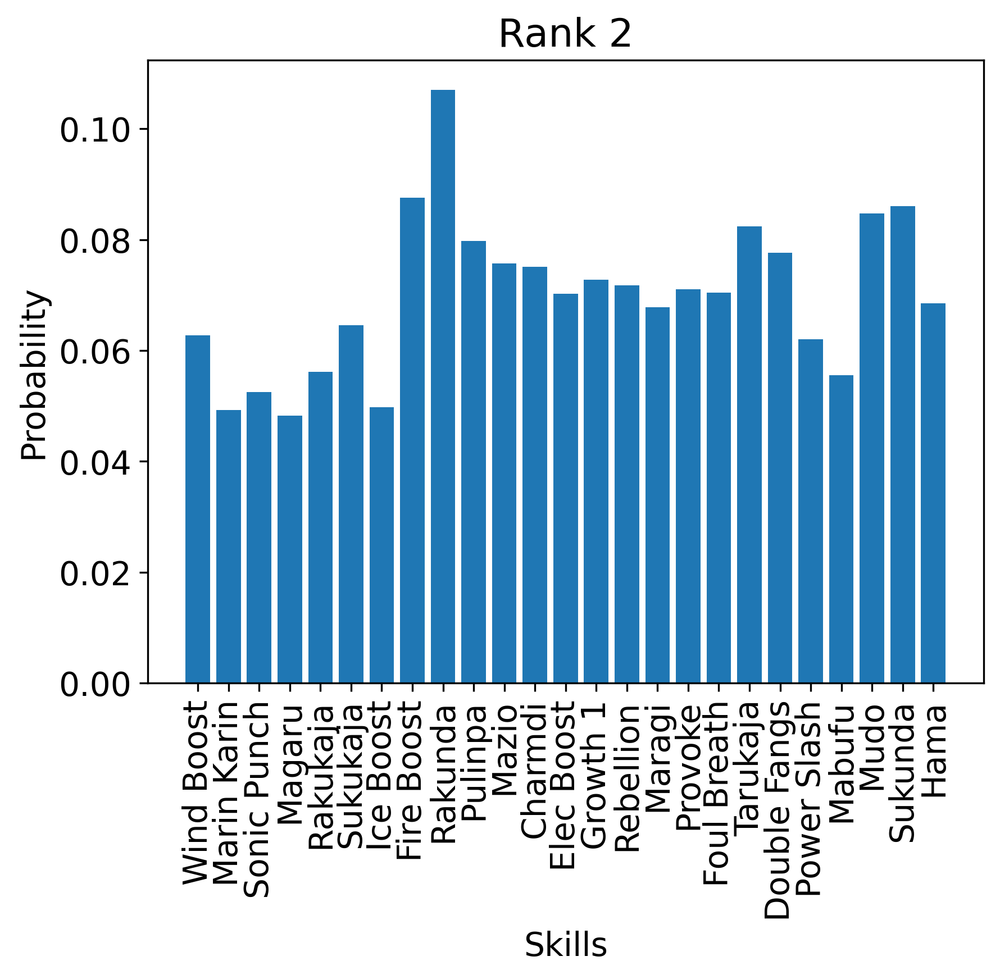

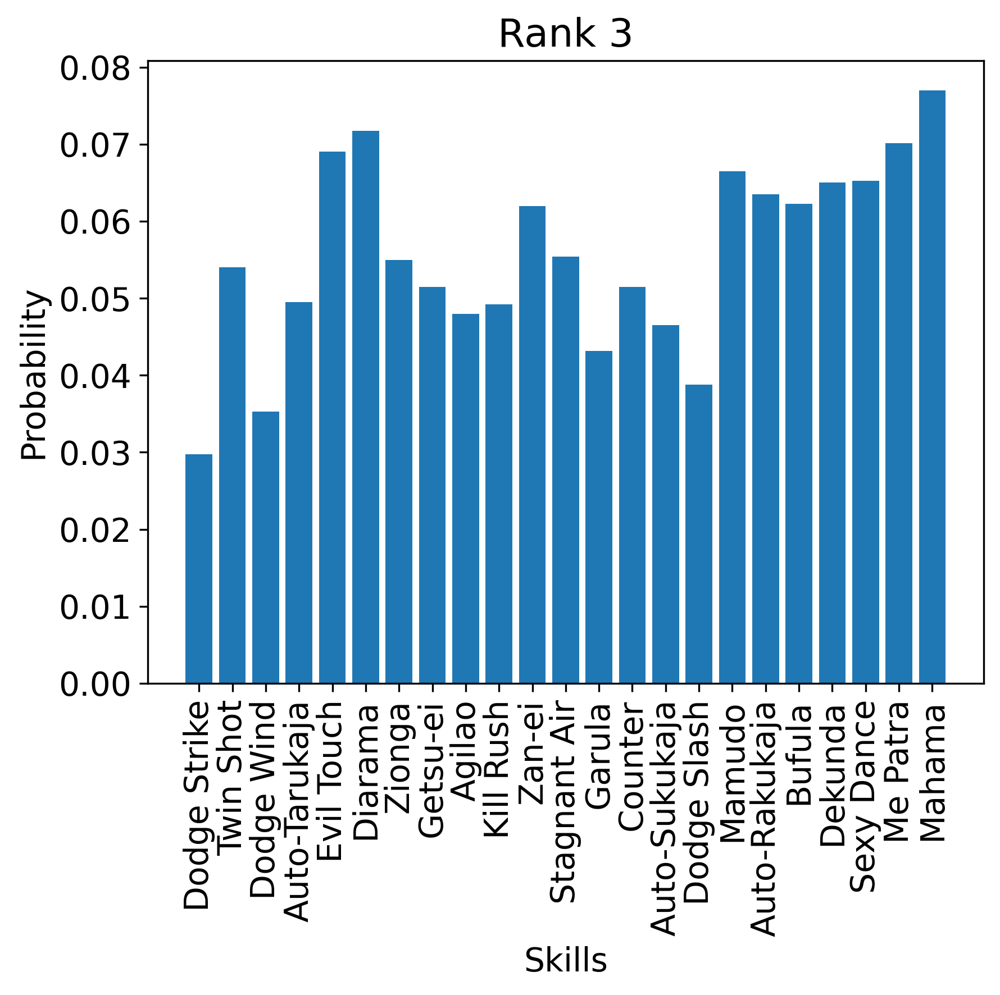

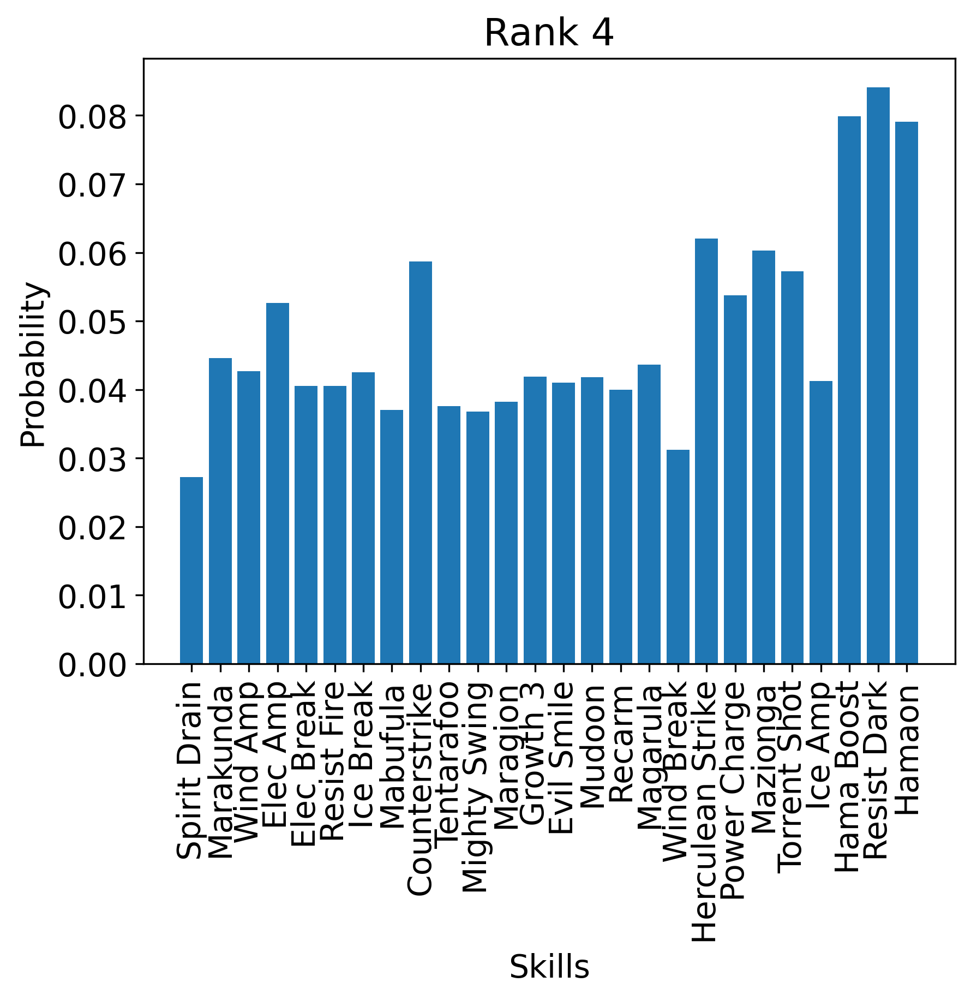

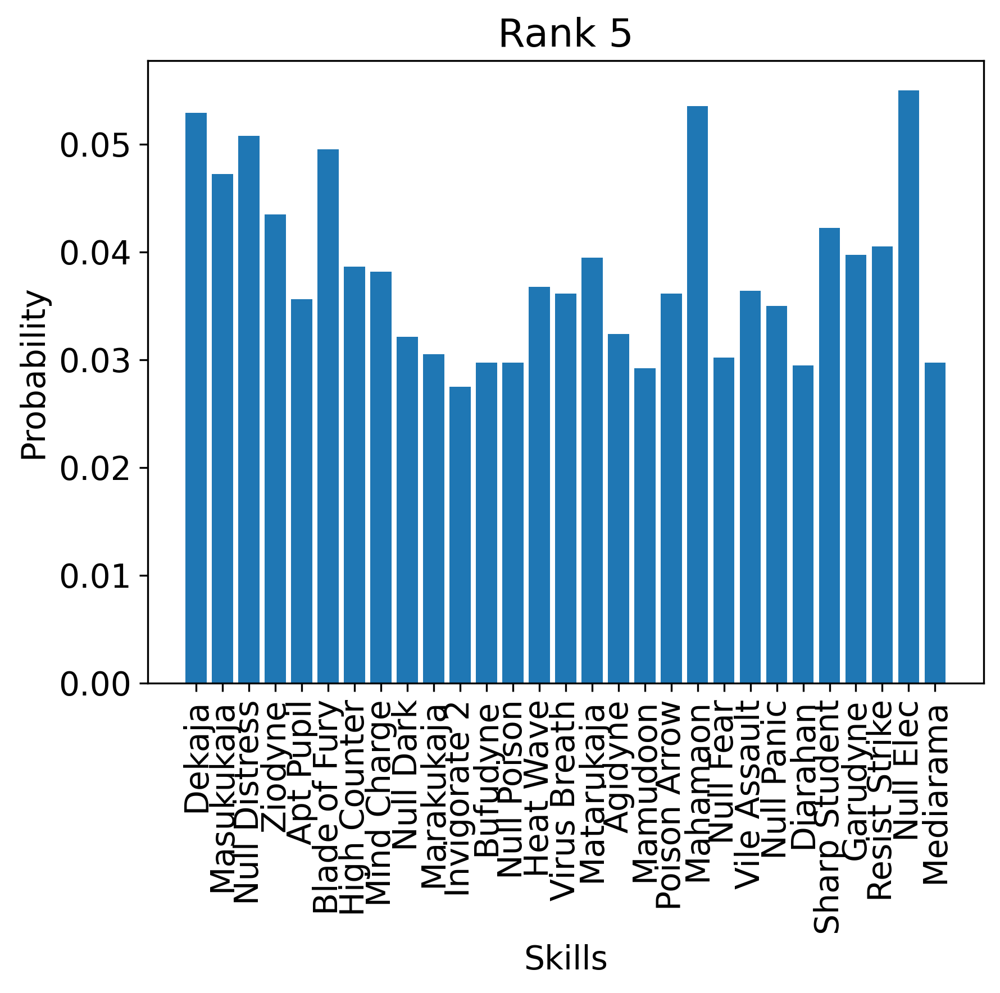

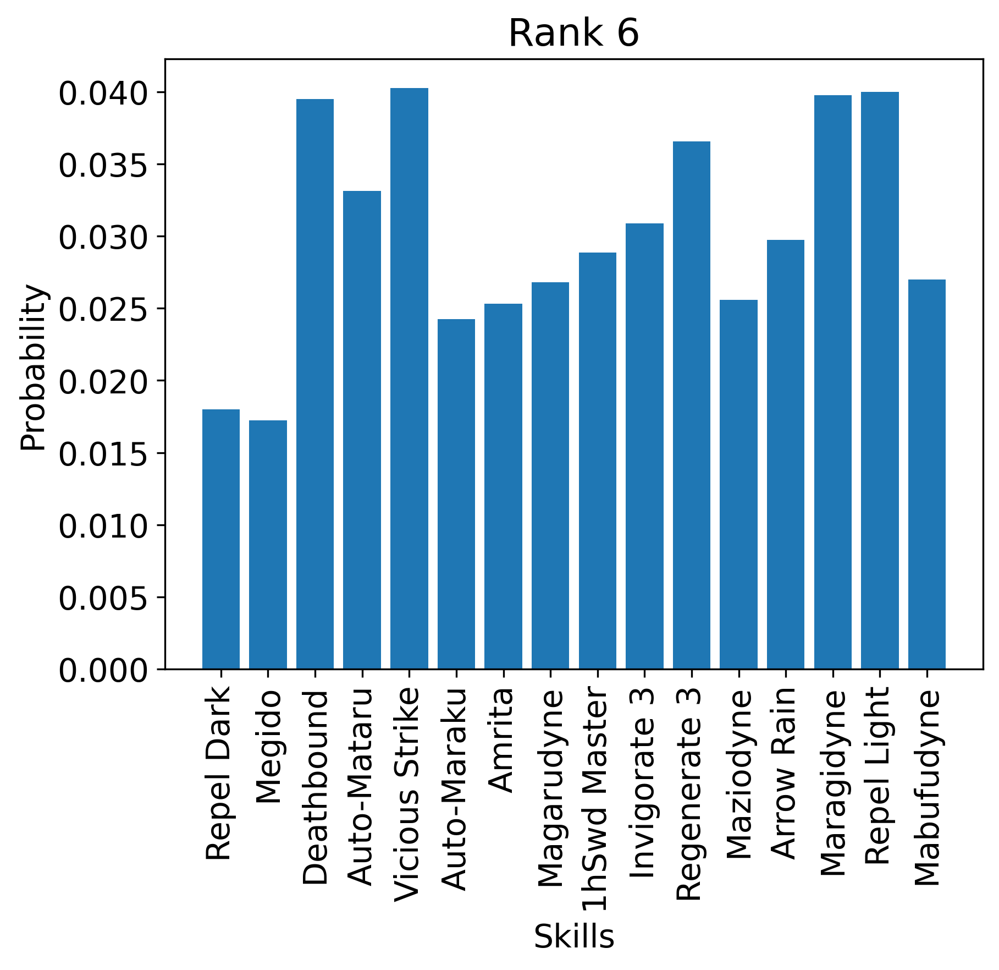

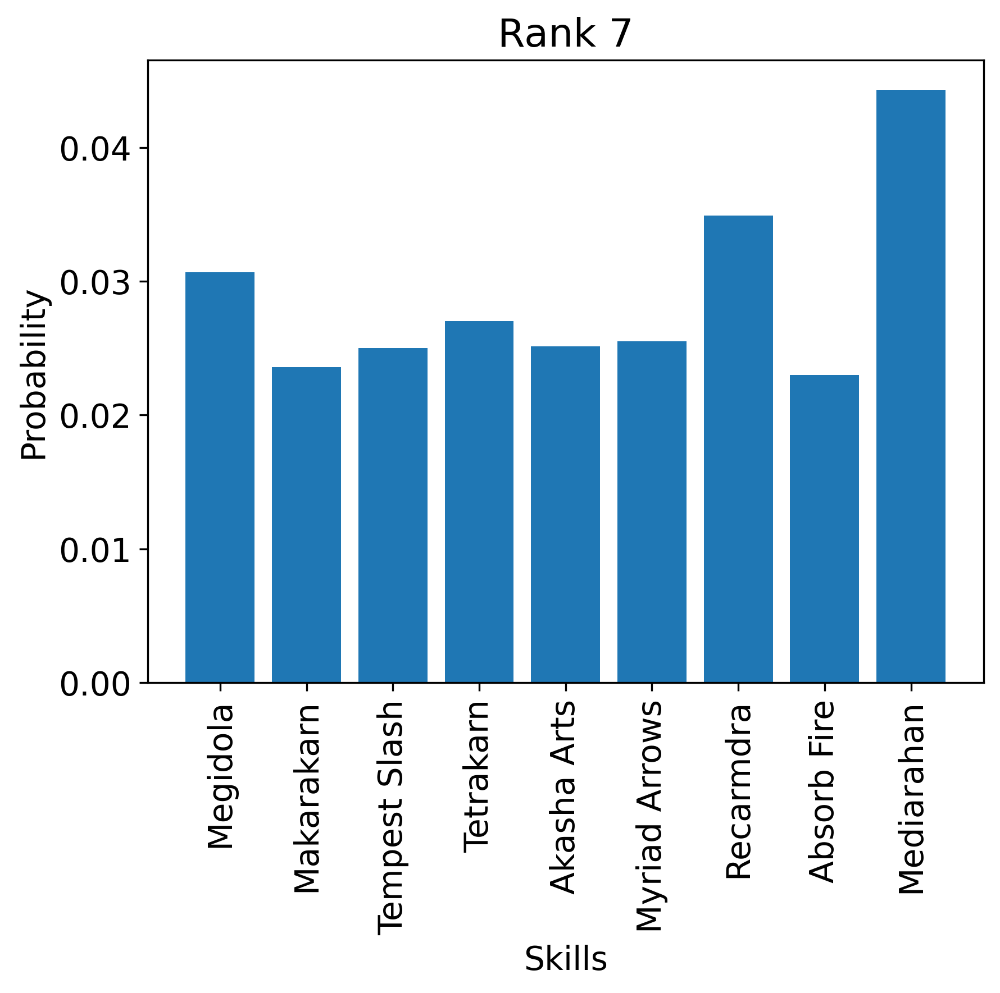

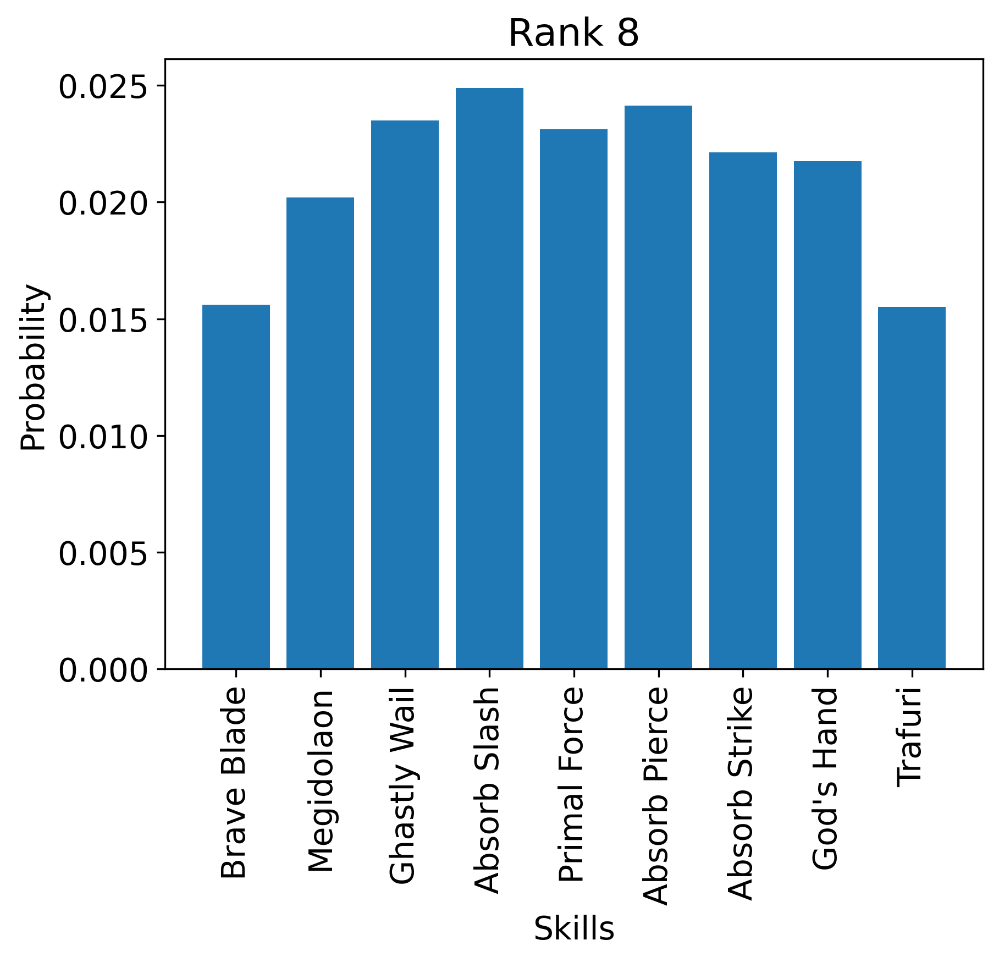

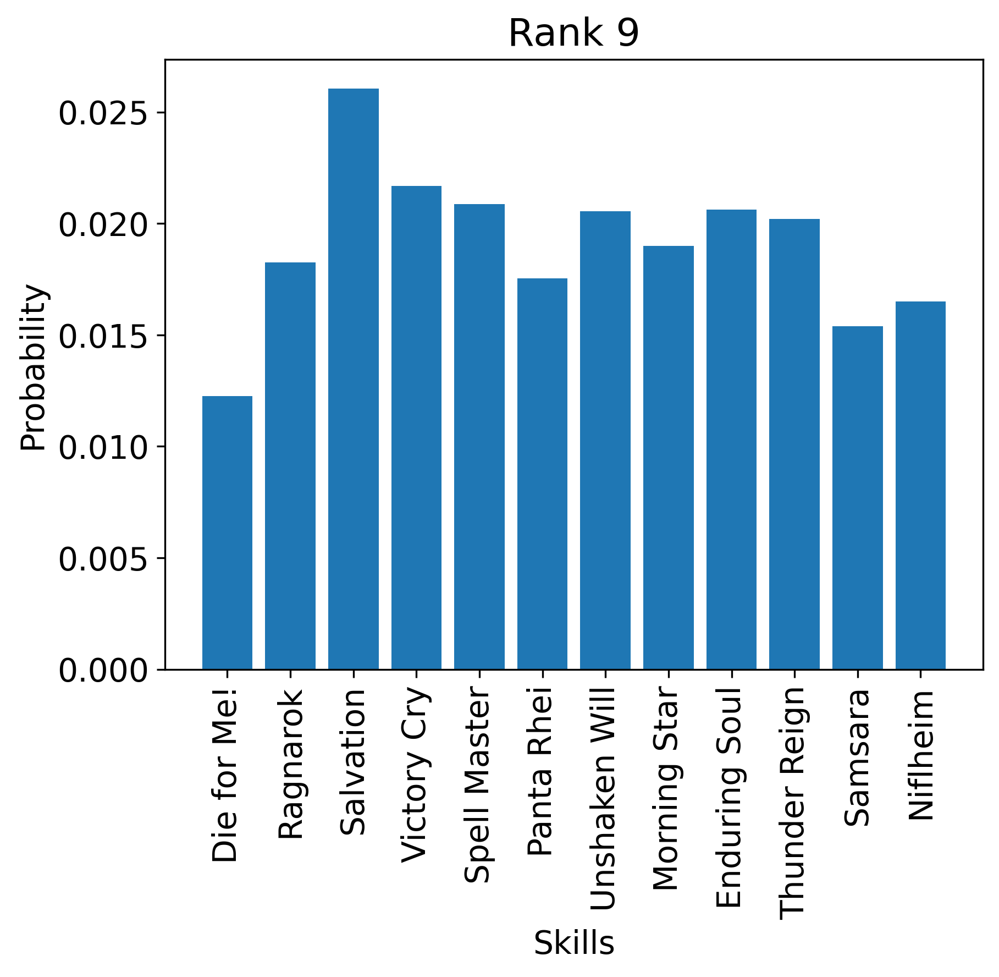

In [14]:
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict

# Create a dictionary where the keys are the ranks and the values are lists of (skill, probability) tuples
rank_to_skill_probs = defaultdict(list)
for skill, rank in dict_skill_to_rank.items():
    prob = avg_prob_per_skill_dict.get(skill)
    if prob is not None:
        rank_to_skill_probs[rank].append((skill, prob))

# Sort the dictionary by rank
sorted_dict = dict(sorted(rank_to_skill_probs.items(), key=lambda item: item[0]))

# Create a separate plot for each rank
for i, (rank, skill_probs) in enumerate(sorted_dict.items()):
    plt.figure(i, dpi=300)
    skills, probs = zip(*skill_probs)
    x_coords = np.arange(len(probs))
    plt.bar(x_coords, probs, tick_label=skills)
    plt.xlabel('Skills')
    plt.ylabel('Probability')
    plt.title(f'Rank {rank}')
    plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
    plt.savefig(f'rank_{rank}.png')
    plt.show()

In [15]:
avg_prob_per_skill_dict

skills_by_type_and_rank

final_prob_dict = {}

for pair, list_skills in skills_by_type_and_rank.items():
    if pair[1] == -1:
        continue
    summation_prob = 0
    count = 0
    for skill in list_skills:
        probability_value = avg_prob_per_skill_dict.get(skill,None)
        if probability_value is None:
            continue
        if probability_value <= 0:
            continue
        summation_prob += probability_value
        count += 1
    final_prob = summation_prob / count
    final_prob_dict[pair] = final_prob
    print(f"{pair}: {final_prob}")

('Passive', 2): 0.06860999999999999
('Bad Status', 2): 0.06666666666666667
('Passive', 3): 0.04496071428571429
('Almighty', 4): 0.02725
('Pierce', 3): 0.054
('Strike', 2): 0.0525
('Bad Status', 3): 0.06715121371371371
('Passive', 1): 0.108125
('Wind', 1): 0.1115
('Wind', 2): 0.04825
('Passive', 6): 0.03024107142857143
('Enhance', 4): 0.042525
('Almighty', 6): 0.01725
('Enhance', 2): 0.07796736111111112
('Elec', 1): 0.10802500000000001
('Ice', 1): 0.08775
('Dark', 9): 0.01225
('Fire', 9): 0.01825
('Enhance', 5): 0.04165847180513847
('Recovery', 9): 0.0260625
('Slash', 6): 0.0395
('Passive', 5): 0.037939282312615646
('Passive', 4): 0.055191493993994
('Elec', 5): 0.0435
('Almighty', 7): 0.0306875
('Slash', 5): 0.0495
('Recovery', 3): 0.07093749999999999
('Strike', 6): 0.04025
('Elec', 2): 0.07575
('Elec', 3): 0.055
('Recovery', 2): 0.075125
('Recovery', 6): 0.025325
('Ice', 4): 0.037
('Ice', 5): 0.02975
('Strike', 5): 0.03675
('Bad Status', 5): 0.036125000000000004
('Slash', 3): 0.0567374

In [16]:
import json
# open json file into a dictionary

# 'C:\\Users\\Eduardo\\Documents\\Projects\\AutoTelos\\Persona3FES-FusionHelper\\skills_list\\skills.csv'
skills_csv_path = "/home/eduardo/Documents/Persona3/AutoTelos/skills_list/skills.csv"
df = pd.read_csv(skills_csv_path)

#print(df)

skill_type_dict = df.set_index('skill')['type'].to_dict()

skill_rank_dict = df.set_index('skill')['rank'].to_dict()

# get all unique skill types and all unique ranks
unique_skill_types = set(skill_type_dict.values())
unique_skill_ranks = set(skill_rank_dict.values())

missing = 0
pair_exist = []
pair_dont_exist = []
for st in unique_skill_types:
    for sr in unique_skill_ranks:
        if sr == 99 or sr == -1:
            continue
        # veriy if there is not an entry in the df with that skill type and rank
        if len(df.loc[(df['type'] == st) & (df['rank'] == sr)]) == 0:
            #print(f"Missing skill: {st} - {sr}")
            missing+=1
            pair_dont_exist.append((st,sr))
        else:
            pair_exist.append((st,sr))

def load_empty_total_dict():
    # 'C:\\Users\\Eduardo\\Documents\\Projects\\AutoTelos\\Persona3FES-FusionHelper\\inheritance_calculator\\combinations.json'
    combinations_json_path = '/home/eduardo/Documents/Persona3/AutoTelos/inheritance_calculator/combinations.json'
    with open(combinations_json_path, 'r') as fp:
        total_combinations_dict = json.load(fp)


    

    inheritance_df = pd.read_csv('/home/eduardo/Documents/Persona3/AutoTelos/inheritance_calculator/inheritance.csv')

    # Convert the DataFrame to a dictionary where each key is an inheritance type
    # and its value is another dictionary of skill types and their probabilities.
    inheritance_dict = inheritance_df.set_index('Inheritance Type').T.to_dict('dict')

    total_combinations_dict_new = {}

    # for each key in the dictionary convert the tuple string in a tuple
    for key in total_combinations_dict:
        eval_key = eval(key)
        inherit_type , skill_rank, skill_type = eval_key

        if inherit_type != 'ALL':
            continue

        pair = (skill_rank, skill_type)
        
        # if the value is equal to zero in inheritance_dict
        current_ratio = inheritance_dict[inherit_type][skill_type]

        if current_ratio == 0:
            total_combinations_dict_new[(skill_type, skill_rank)] = -1

        elif pair in pair_dont_exist:
            total_combinations_dict_new[(skill_type, skill_rank)] = -1
        else:
            total_combinations_dict_new[(skill_type, skill_rank)] = 0


    total_dict = total_combinations_dict_new

    return total_dict

empty_total_dict = load_empty_total_dict()
print(empty_total_dict)


{('Passive', 1): 0, ('Slash', 1): 0, ('Light', 1): 0, ('Dark', 1): 0, ('Bad Status', 1): 0, ('Ice', 1): 0, ('Elec', 1): 0, ('Enhance', 1): 0, ('Pierce', 1): 0, ('Fire', 1): 0, ('Recovery', 1): 0, ('Wind', 1): 0, ('Strike', 1): 0, ('Special', 1): 0, ('Almighty', 1): 0, ('Passive', 2): 0, ('Slash', 2): 0, ('Light', 2): 0, ('Dark', 2): 0, ('Bad Status', 2): 0, ('Ice', 2): 0, ('Elec', 2): 0, ('Enhance', 2): 0, ('Pierce', 2): 0, ('Fire', 2): 0, ('Recovery', 2): 0, ('Wind', 2): 0, ('Strike', 2): 0, ('Special', 2): 0, ('Almighty', 2): 0, ('Passive', 3): 0, ('Slash', 3): 0, ('Light', 3): 0, ('Dark', 3): 0, ('Bad Status', 3): 0, ('Ice', 3): 0, ('Elec', 3): 0, ('Enhance', 3): 0, ('Pierce', 3): 0, ('Fire', 3): 0, ('Recovery', 3): 0, ('Wind', 3): 0, ('Strike', 3): 0, ('Special', 3): 0, ('Almighty', 3): 0, ('Passive', 4): 0, ('Slash', 4): 0, ('Light', 4): 0, ('Dark', 4): 0, ('Bad Status', 4): 0, ('Ice', 4): 0, ('Elec', 4): 0, ('Enhance', 4): 0, ('Pierce', 4): 0, ('Fire', 4): 0, ('Recovery', 4): 0, 

In [17]:
for key, value in empty_total_dict.items():
    if value == -1:
        print(key)

In [18]:
empty_total_dict.update(final_prob_dict)


# print any values that are still -1
for key, value in empty_total_dict.items():
    if value == -1:
        print(key)

verify if all valid skill types and ranks are covered. will be valid if the only ones remaining are -1 and 99

In [19]:
df_verify_possible_pairs = pd.read_csv(skills_csv_path)

# get only the columns type and rank
df_verify_possible_pairs = df_verify_possible_pairs[['type', 'rank']]

df_verify_possible_pairs

#put all pairs into a list of tuples
pairs = list(df_verify_possible_pairs.itertuples(index=False, name=None))

pairs

[('Slash', 1),
 ('Slash', 2),
 ('Slash', 3),
 ('Slash', 3),
 ('Slash', 3),
 ('Slash', 4),
 ('Slash', 4),
 ('Slash', 5),
 ('Slash', 6),
 ('Slash', 7),
 ('Slash', 7),
 ('Slash', 8),
 ('Slash', 99),
 ('Slash', -1),
 ('Strike', 1),
 ('Strike', 2),
 ('Strike', 2),
 ('Strike', 3),
 ('Strike', 3),
 ('Strike', 4),
 ('Strike', 5),
 ('Strike', 5),
 ('Strike', 6),
 ('Strike', 7),
 ('Strike', 8),
 ('Strike', 99),
 ('Strike', 6),
 ('Pierce', 1),
 ('Pierce', 2),
 ('Pierce', 2),
 ('Pierce', 3),
 ('Pierce', 4),
 ('Pierce', 4),
 ('Pierce', 5),
 ('Pierce', 5),
 ('Pierce', 6),
 ('Pierce', 7),
 ('Pierce', 8),
 ('Pierce', 8),
 ('Fire', 1),
 ('Fire', 2),
 ('Fire', 3),
 ('Fire', 4),
 ('Fire', 5),
 ('Fire', 6),
 ('Fire', 9),
 ('Fire', 99),
 ('Fire', 99),
 ('Ice', 1),
 ('Ice', 2),
 ('Ice', 3),
 ('Ice', 4),
 ('Ice', 5),
 ('Ice', 6),
 ('Ice', 9),
 ('Ice', 99),
 ('Elec', 1),
 ('Elec', 2),
 ('Elec', 3),
 ('Elec', 4),
 ('Elec', 5),
 ('Elec', 6),
 ('Elec', 9),
 ('Elec', 99),
 ('Wind', 1),
 ('Wind', 2),
 ('Wind', 3),

In [20]:

for pair in pairs:
    if pair not in empty_total_dict:
        print(pair)

('Slash', 99)
('Slash', -1)
('Strike', 99)
('Fire', 99)
('Fire', 99)
('Ice', 99)
('Elec', 99)
('Light', 99)
('Almighty', 99)
('Almighty', 99)
('Almighty', 99)
('Almighty', 99)
('Bad Status', 99)
('Bad Status', 99)
('Bad Status', 99)
('Recovery', 99)
('Recovery', 99)
('Enhance', 99)
('Enhance', 99)
('Enhance', 99)
('Passive', 99)
('Passive', 99)
('Passive', 99)
('Passive', 99)
('Passive', 99)
('Passive', 99)


In [21]:
empty_total_dict

{('Passive', 1): 0.108125,
 ('Slash', 1): 0.106,
 ('Light', 1): 0,
 ('Dark', 1): 0,
 ('Bad Status', 1): 0.09725,
 ('Ice', 1): 0.08775,
 ('Elec', 1): 0.10802500000000001,
 ('Enhance', 1): 0,
 ('Pierce', 1): 0.20045045045045046,
 ('Fire', 1): 0.10825,
 ('Recovery', 1): 0.116125,
 ('Wind', 1): 0.1115,
 ('Strike', 1): 0.10875,
 ('Special', 1): 0,
 ('Almighty', 1): 0,
 ('Passive', 2): 0.06860999999999999,
 ('Slash', 2): 0.062,
 ('Light', 2): 0.0685,
 ('Dark', 2): 0.08475,
 ('Bad Status', 2): 0.06666666666666667,
 ('Ice', 2): 0.0555,
 ('Elec', 2): 0.07575,
 ('Enhance', 2): 0.07796736111111112,
 ('Pierce', 2): 0.0776,
 ('Fire', 2): 0.0678,
 ('Recovery', 2): 0.075125,
 ('Wind', 2): 0.04825,
 ('Strike', 2): 0.0525,
 ('Special', 2): 0,
 ('Almighty', 2): 0.0704,
 ('Passive', 3): 0.04496071428571429,
 ('Slash', 3): 0.056737499999999996,
 ('Light', 3): 0.077,
 ('Dark', 3): 0.0665,
 ('Bad Status', 3): 0.06715121371371371,
 ('Ice', 3): 0.06225,
 ('Elec', 3): 0.055,
 ('Enhance', 3): 0.065,
 ('Pierce',